In [1]:
import numpy as np
import matplotlib.pyplot as plt
import PIL
import os
import time

import torch
import torch.nn as nn
from torch.autograd import Variable
from torch import optim
import torch.nn.functional as F

use_cuda = torch.cuda.is_available()
os.environ['CUDA_VISIBLE_DEVICES'] = '1'

%matplotlib inline

In [2]:
###################################### hyperparameters
class HParams():
    def __init__(self):
        self.data_location = 'cat.npz'
        self.enc_hidden_size = 256
        self.dec_hidden_size = 512
        self.Nz = 128
        self.M = 20
        self.dropout = 0.9
        self.batch_size = 100
        self.eta_min = 0.01
        self.R = 0.99995
        self.KL_min = 0.2
        self.wKL = 0.5
        self.lr = 0.001
        self.lr_decay = 0.9999
        self.min_lr = 0.00001
        self.grad_clip = 1.
        self.temperature = 0.4
        self.max_seq_length = 200

hp = HParams()

In [3]:
################################# load and prepare data
def max_size(data):
    """larger sequence length in the data set"""
    sizes = [len(seq) for seq in data]
    return max(sizes)

def purify(strokes):
    """removes too small or too long sequences + removes large gaps"""
    data = []
    for seq in strokes:
        if len(seq[:,0]) <= hp.max_seq_length and len(seq[:,0])>10:
            seq = np.minimum(seq, 1000)
            seq = np.maximum(seq, -1000)
            seq = np.array(seq, dtype=np.float32)
            data.append(seq)
    return data

def calculate_normalizing_scale_factor(strokes):
    """Calculate the normalizing factor explained in appendix of sketch-rnn."""
    data = []
    for i in range(len(strokes)):
        for j in range(len(strokes[i])):
            data.append(strokes[i][j, 0])
            data.append(strokes[i][j, 1])
    data = np.array(data)
    return np.std(data)

def normalize(strokes):
    """Normalize entire dataset (delta_x, delta_y) by the scaling factor."""
    data = []
    scale_factor = calculate_normalizing_scale_factor(strokes)
    for seq in strokes:
        seq[:, 0:2] /= scale_factor
        data.append(seq)
    return data

dataset = np.load(hp.data_location, encoding='latin1')
data = dataset['train']
data = purify(data)
data = normalize(data)
Nmax = max_size(data)


In [4]:
############################## function to generate a batch:
def make_batch(batch_size):
    batch_idx = np.random.choice(len(data),batch_size)
    batch_sequences = [data[idx] for idx in batch_idx]
    strokes = []
    lengths = []
    indice = 0
    for seq in batch_sequences:
        len_seq = len(seq[:,0])
        new_seq = np.zeros((Nmax,5))
        new_seq[:len_seq,:2] = seq[:,:2]
        new_seq[:len_seq-1,2] = 1-seq[:-1,2]
        new_seq[:len_seq,3] = seq[:,2]
        new_seq[(len_seq-1):,4] = 1
        new_seq[len_seq-1,2:4] = 0
        lengths.append(len(seq[:,0]))
        strokes.append(new_seq)
        indice += 1

    if use_cuda:
        batch = Variable(torch.from_numpy(np.stack(strokes,1)).cuda().float())
    else:
        batch = Variable(torch.from_numpy(np.stack(strokes,1)).float())
    return batch, lengths


In [5]:
################################ adaptive lr
def lr_decay(optimizer):
    """Decay learning rate by a factor of lr_decay"""
    for param_group in optimizer.param_groups:
        if param_group['lr']>hp.min_lr:
            param_group['lr'] *= hp.lr_decay
    return optimizer

In [6]:
################################# encoder and decoder modules
class EncoderRNN(nn.Module):
    def __init__(self):
        super(EncoderRNN, self).__init__()
        # bidirectional lstm:
        self.lstm = nn.LSTM(5, hp.enc_hidden_size, \
            dropout=hp.dropout, bidirectional=True)
        # create mu and sigma from lstm's last output:
        self.fc_mu = nn.Linear(2*hp.enc_hidden_size, hp.Nz)
        self.fc_sigma = nn.Linear(2*hp.enc_hidden_size, hp.Nz)
        # active dropout:
        self.train()

    def forward(self, inputs, batch_size, hidden_cell=None):
        if hidden_cell is None:
            # then must init with zeros
            if use_cuda:
                hidden = Variable(torch.zeros(2, batch_size, hp.enc_hidden_size).cuda())
                cell = Variable(torch.zeros(2, batch_size, hp.enc_hidden_size).cuda())
            else:
                hidden = Variable(torch.zeros(2, batch_size, hp.enc_hidden_size))
                cell = Variable(torch.zeros(2, batch_size, hp.enc_hidden_size))
            hidden_cell = (hidden, cell)
        _, (hidden,cell) = self.lstm(inputs.float(), hidden_cell)
        # hidden is (2, batch_size, hidden_size), we want (batch_size, 2*hidden_size):
        hidden_forward, hidden_backward = torch.split(hidden,1,0)
        hidden_cat = torch.cat([hidden_forward.squeeze(0), hidden_backward.squeeze(0)],1)
        # mu and sigma:
        mu = self.fc_mu(hidden_cat)
        sigma_hat = self.fc_sigma(hidden_cat)
        sigma = torch.exp(sigma_hat/2.)
        # N ~ N(0,1)
        z_size = mu.size()
        if use_cuda:
            N = Variable(torch.normal(torch.zeros(z_size),torch.ones(z_size)).cuda())
        else:
            N = Variable(torch.normal(torch.zeros(z_size),torch.ones(z_size)))
        z = mu + sigma*N
        # mu and sigma_hat are needed for LKL loss
        return z, mu, sigma_hat

class DecoderRNN(nn.Module):
    def __init__(self):
        super(DecoderRNN, self).__init__()

        # to init hidden and cell from z:
        self.fc_hc = nn.Linear(hp.Nz, 2*hp.dec_hidden_size)

        # unidirectional lstm:
        self.lstm = nn.LSTM(hp.Nz+5, hp.dec_hidden_size, dropout=hp.dropout)

        # create proba distribution parameters from hiddens:
        self.fc_params = nn.Linear(hp.dec_hidden_size,6*hp.M+3)

    def forward(self, inputs, z, hidden_cell=None):
        if hidden_cell is None:
            # then we must init from z
            hidden,cell = torch.split(F.tanh(self.fc_hc(z)),hp.dec_hidden_size,1)
            hidden_cell = (hidden.unsqueeze(0).contiguous(), cell.unsqueeze(0).contiguous())

        outputs,(hidden,cell) = self.lstm(inputs, hidden_cell)
        # in training we feed the lstm with the whole input in one shot
        # and use all outputs contained in 'outputs', while in generate
        # mode we just feed with the last generated sample:
        if self.training:
            y = self.fc_params(outputs.view(-1, hp.dec_hidden_size))
        else:
            y = self.fc_params(hidden.view(-1, hp.dec_hidden_size))

        # separate pen and mixture params:
        params = torch.split(y,6,1)
        params_mixture = torch.stack(params[:-1]) # trajectory
        params_pen = params[-1] # pen up/down

        # identify mixture params:
        pi,mu_x,mu_y,sigma_x,sigma_y,rho_xy = torch.split(params_mixture,1,2)

        # preprocess params::
        if self.training:
            len_out = Nmax+1
        else:
            len_out = 1
        pi = F.softmax(pi.t().squeeze()).view(len_out,-1,hp.M)
        sigma_x = torch.exp(sigma_x.t().squeeze()).view(len_out,-1,hp.M)
        sigma_y = torch.exp(sigma_y.t().squeeze()).view(len_out,-1,hp.M)
        rho_xy = torch.tanh(rho_xy.t().squeeze()).view(len_out,-1,hp.M)
        mu_x = mu_x.t().squeeze().contiguous().view(len_out,-1,hp.M)
        mu_y = mu_y.t().squeeze().contiguous().view(len_out,-1,hp.M)
        q = F.softmax(params_pen).view(len_out,-1,3)
        return pi,mu_x,mu_y,sigma_x,sigma_y,rho_xy,q,hidden,cell

In [7]:
class Model():
    def __init__(self):
        if use_cuda:
            self.encoder = EncoderRNN().cuda()
            self.decoder = DecoderRNN().cuda()
        else:
            self.encoder = EncoderRNN()
            self.decoder = DecoderRNN()
        self.encoder_optimizer = optim.Adam(self.encoder.parameters(), hp.lr)
        self.decoder_optimizer = optim.Adam(self.decoder.parameters(), hp.lr)
        self.eta_step = hp.eta_min

    def make_target(self, batch, lengths):
        if use_cuda:
            eos = Variable(torch.stack([torch.Tensor([0,0,0,0,1])]\
                *batch.size()[1]).cuda()).unsqueeze(0)
        else:
            eos = Variable(torch.stack([torch.Tensor([0,0,0,0,1])]\
                *batch.size()[1])).unsqueeze(0)
        batch = torch.cat([batch, eos], 0)
        mask = torch.zeros(Nmax+1, batch.size()[1])
        for indice,length in enumerate(lengths):
            mask[:length,indice] = 1
        if use_cuda:
            mask = Variable(mask.cuda()).detach()
        else:
            mask = Variable(mask).detach()
        dx = torch.stack([Variable(batch.data[:,:,0])]*hp.M,2).detach()
        dy = torch.stack([Variable(batch.data[:,:,1])]*hp.M,2).detach()
        p1 = Variable(batch.data[:,:,2]).detach()
        p2 = Variable(batch.data[:,:,3]).detach()
        p3 = Variable(batch.data[:,:,4]).detach()
        p = torch.stack([p1,p2,p3],2)
        return mask,dx,dy,p

    def train(self, epoch):
        t_begin = time.time()

        self.encoder.train()
        self.decoder.train()
        batch, lengths = make_batch(hp.batch_size)
        # encode:
        z, self.mu, self.sigma = self.encoder(batch, hp.batch_size)
        # create start of sequence:
        if use_cuda:
            sos = Variable(torch.stack([torch.Tensor([0,0,1,0,0])]\
                *hp.batch_size).cuda()).unsqueeze(0)
        else:
            sos = Variable(torch.stack([torch.Tensor([0,0,1,0,0])]\
                *hp.batch_size)).unsqueeze(0)
        # had sos at the begining of the batch:
        batch_init = torch.cat([sos, batch],0)
        # expend z to be ready to concatenate with inputs:
        z_stack = torch.stack([z]*(Nmax+1))
        # inputs is concatenation of z and batch_inputs
        inputs = torch.cat([batch_init, z_stack],2)
        # decode:
        self.pi, self.mu_x, self.mu_y, self.sigma_x, self.sigma_y, \
            self.rho_xy, self.q, _, _ = self.decoder(inputs, z)
        # prepare targets:
        mask,dx,dy,p = self.make_target(batch, lengths)
        # prepare optimizers:
        self.encoder_optimizer.zero_grad()
        self.decoder_optimizer.zero_grad()
        # update eta for LKL:
        self.eta_step = 1-(1-hp.eta_min)*hp.R
        # compute losses:
        LKL = self.kullback_leibler_loss()
        LR = self.reconstruction_loss(mask,dx,dy,p,epoch)
        loss = LR + LKL
        # gradient step
        loss.backward()
        # gradient cliping
        nn.utils.clip_grad_norm(self.encoder.parameters(), hp.grad_clip)
        nn.utils.clip_grad_norm(self.decoder.parameters(), hp.grad_clip)
        # optim step
        self.encoder_optimizer.step()
        self.decoder_optimizer.step()
        # some print and save:
        if epoch % 1 == 0:
            #print('epoch',epoch,'loss',loss.data[0],'LR',LR.data[0],'LKL',LKL.data[0])
            print('epoch %d in %.3f s: loss = %.4f, LR = %.4f, LKL = %.4f' \
                  % (epoch,time.time()-t_begin,loss.data[0],LR.data[0],LKL.data[0]))
            self.encoder_optimizer = lr_decay(self.encoder_optimizer)
            self.decoder_optimizer = lr_decay(self.decoder_optimizer)
        if epoch % 100 == 0:
            #self.save(epoch)
            self.conditional_generation(epoch)

    def bivariate_normal_pdf(self, dx, dy):
        z_x = ((dx-self.mu_x)/self.sigma_x)**2
        z_y = ((dy-self.mu_y)/self.sigma_y)**2
        z_xy = (dx-self.mu_x)*(dy-self.mu_y)/(self.sigma_x*self.sigma_y)
        z = z_x + z_y -2*self.rho_xy*z_xy
        exp = torch.exp(-z/(2*(1-self.rho_xy**2)))
        norm = 2*np.pi*self.sigma_x*self.sigma_y*torch.sqrt(1-self.rho_xy**2)
        return exp/norm

    def reconstruction_loss(self, mask, dx, dy, p, epoch):
        pdf = self.bivariate_normal_pdf(dx, dy)
        LS = -torch.sum(mask*torch.log(1e-5+torch.sum(self.pi * pdf, 2)))\
            /float(Nmax*hp.batch_size)
        LP = -torch.sum(p*torch.log(self.q))/float(Nmax*hp.batch_size)
        return LS+LP

    def kullback_leibler_loss(self):
        LKL = -0.5*torch.sum(1+self.sigma-self.mu**2-torch.exp(self.sigma))\
            /float(hp.Nz*hp.batch_size)
        if use_cuda:
            KL_min = Variable(torch.Tensor([hp.KL_min]).cuda()).detach()
        else:
            KL_min = Variable(torch.Tensor([hp.KL_min])).detach()
        return hp.wKL*self.eta_step * torch.max(LKL,KL_min)

    def save(self, epoch):
        sel = np.random.rand()
        torch.save(self.encoder.state_dict(), \
            'encoderRNN_sel_%3f_epoch_%d.pth' % (sel,epoch))
        torch.save(self.decoder.state_dict(), \
            'decoderRNN_sel_%3f_epoch_%d.pth' % (sel,epoch))

    def load(self, encoder_name, decoder_name):
        saved_encoder = torch.load(encoder_name)
        saved_decoder = torch.load(decoder_name)
        self.encoder.load_state_dict(saved_encoder)
        self.decoder.load_state_dict(saved_decoder)

    def conditional_generation(self, epoch):
        batch,lengths = make_batch(1)
        # should remove dropouts:
        self.encoder.train(False)
        self.decoder.train(False)
        # encode:
        z, _, _ = self.encoder(batch, 1)
        if use_cuda:
            sos = Variable(torch.Tensor([0,0,1,0,0]).view(1,1,-1).cuda())
        else:
            sos = Variable(torch.Tensor([0,0,1,0,0]).view(1,1,-1))
        s = sos
        seq_x = []
        seq_y = []
        seq_z = []
        hidden_cell = None
        for i in range(Nmax):
            input = torch.cat([s,z.unsqueeze(0)],2)
            # decode:
            self.pi, self.mu_x, self.mu_y, self.sigma_x, self.sigma_y, \
                self.rho_xy, self.q, hidden, cell = \
                    self.decoder(input, z, hidden_cell)
            hidden_cell = (hidden, cell)
            # sample from parameters:
            s, dx, dy, pen_down, eos = self.sample_next_state()
            #------
            seq_x.append(dx)
            seq_y.append(dy)
            seq_z.append(pen_down)
            if eos:
                print(i)
                break
        # visualize result:
        x_sample = np.cumsum(seq_x, 0)
        y_sample = np.cumsum(seq_y, 0)
        z_sample = np.array(seq_z)
        sequence = np.stack([x_sample,y_sample,z_sample]).T
        make_image(sequence, epoch)

    def sample_next_state(self):

        def adjust_temp(pi_pdf):
            pi_pdf = np.log(pi_pdf)/hp.temperature
            pi_pdf -= pi_pdf.max()
            pi_pdf = np.exp(pi_pdf)
            pi_pdf /= pi_pdf.sum()
            return pi_pdf

        # get mixture indice:
        pi = self.pi.data[0,0,:].cpu().numpy()
        pi = adjust_temp(pi)
        pi_idx = np.random.choice(hp.M, p=pi)
        # get pen state:
        q = self.q.data[0,0,:].cpu().numpy()
        q = adjust_temp(q)
        q_idx = np.random.choice(3, p=q)
        # get mixture params:
        mu_x = self.mu_x.data[0,0,pi_idx]
        mu_y = self.mu_y.data[0,0,pi_idx]
        sigma_x = self.sigma_x.data[0,0,pi_idx]
        sigma_y = self.sigma_y.data[0,0,pi_idx]
        rho_xy = self.rho_xy.data[0,0,pi_idx]
        x,y = sample_bivariate_normal(mu_x,mu_y,sigma_x,sigma_y,rho_xy,greedy=False)
        next_state = torch.zeros(5)
        next_state[0] = x
        next_state[1] = y
        next_state[q_idx+2] = 1
        if use_cuda:
            return Variable(next_state.cuda()).view(1,1,-1),x,y,q_idx==1,q_idx==2
        else:
            return Variable(next_state).view(1,1,-1),x,y,q_idx==1,q_idx==2


In [12]:
def sample_bivariate_normal(mu_x,mu_y,sigma_x,sigma_y,rho_xy, greedy=False):
    # inputs must be floats
    if greedy:
      return mu_x,mu_y
    mean = [mu_x, mu_y]
    sigma_x *= np.sqrt(hp.temperature)
    sigma_y *= np.sqrt(hp.temperature)
    cov = [[sigma_x * sigma_x, rho_xy * sigma_x * sigma_y],\
        [rho_xy * sigma_x * sigma_y, sigma_y * sigma_y]]
    x = np.random.multivariate_normal(mean, cov, 1)
    return x[0][0], x[0][1]

def make_image(sequence, epoch, name='_output_'):
    """plot drawing with separated strokes"""
    strokes = np.split(sequence, np.where(sequence[:,2]>0)[0]+1)
    fig = plt.figure()
    ax1 = fig.add_subplot(111)
    for s in strokes:
        plt.plot(s[:,0],-s[:,1])
    plt.show()
    canvas = plt.get_current_fig_manager().canvas
    canvas.draw()
    pil_image = PIL.Image.frombytes('RGB', canvas.get_width_height(),
                 canvas.tostring_rgb())
    name = str(epoch)+name+'.jpg'
    pil_image.save(name,"JPEG")
    #plt.close("all")


/home/hus/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:82: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
/home/hus/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:88: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.


epoch 0 in 0.181 s: loss = 2.4402, LR = 2.4392, LKL = 0.0010
0


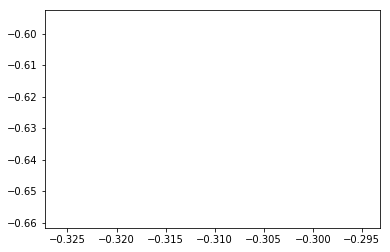

epoch 1 in 0.175 s: loss = 2.4993, LR = 2.4983, LKL = 0.0010
epoch 2 in 0.170 s: loss = 2.4348, LR = 2.4338, LKL = 0.0010
epoch 3 in 0.169 s: loss = 2.3504, LR = 2.3494, LKL = 0.0010
epoch 4 in 0.170 s: loss = 2.3201, LR = 2.3191, LKL = 0.0010
epoch 5 in 0.169 s: loss = 2.0806, LR = 2.0796, LKL = 0.0010
epoch 6 in 0.169 s: loss = 2.1467, LR = 2.1457, LKL = 0.0010
epoch 7 in 0.171 s: loss = 2.1533, LR = 2.1523, LKL = 0.0010
epoch 8 in 0.169 s: loss = 2.0291, LR = 2.0281, LKL = 0.0010
epoch 9 in 0.170 s: loss = 1.9261, LR = 1.9251, LKL = 0.0010
epoch 10 in 0.168 s: loss = 1.8707, LR = 1.8697, LKL = 0.0010
epoch 11 in 0.173 s: loss = 2.1497, LR = 2.1487, LKL = 0.0010
epoch 12 in 0.170 s: loss = 1.8436, LR = 1.8426, LKL = 0.0010
epoch 13 in 0.170 s: loss = 1.8681, LR = 1.8670, LKL = 0.0010
epoch 14 in 0.170 s: loss = 1.8949, LR = 1.8939, LKL = 0.0010
epoch 15 in 0.170 s: loss = 1.7963, LR = 1.7953, LKL = 0.0010
epoch 16 in 0.170 s: loss = 1.6810, LR = 1.6800, LKL = 0.0010
epoch 17 in 0.170

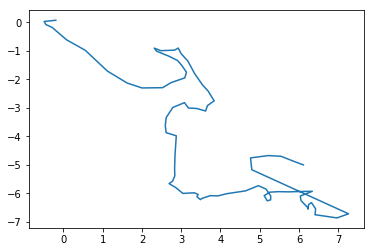

epoch 101 in 0.168 s: loss = 1.0396, LR = 1.0364, LKL = 0.0032
epoch 102 in 0.169 s: loss = 1.1669, LR = 1.1636, LKL = 0.0033
epoch 103 in 0.168 s: loss = 1.0757, LR = 1.0724, LKL = 0.0034
epoch 104 in 0.169 s: loss = 1.1107, LR = 1.1072, LKL = 0.0035
epoch 105 in 0.172 s: loss = 1.0548, LR = 1.0513, LKL = 0.0035
epoch 106 in 0.169 s: loss = 1.0617, LR = 1.0582, LKL = 0.0035
epoch 107 in 0.170 s: loss = 1.0267, LR = 1.0232, LKL = 0.0035
epoch 108 in 0.168 s: loss = 1.0476, LR = 1.0442, LKL = 0.0035
epoch 109 in 0.170 s: loss = 1.0371, LR = 1.0335, LKL = 0.0036
epoch 110 in 0.169 s: loss = 0.9460, LR = 0.9423, LKL = 0.0036
epoch 111 in 0.170 s: loss = 1.0521, LR = 1.0484, LKL = 0.0037
epoch 112 in 0.170 s: loss = 1.0340, LR = 1.0302, LKL = 0.0038
epoch 113 in 0.169 s: loss = 0.9819, LR = 0.9780, LKL = 0.0039
epoch 114 in 0.169 s: loss = 1.0543, LR = 1.0503, LKL = 0.0040
epoch 115 in 0.170 s: loss = 0.9887, LR = 0.9845, LKL = 0.0042
epoch 116 in 0.167 s: loss = 0.9238, LR = 0.9195, LKL =

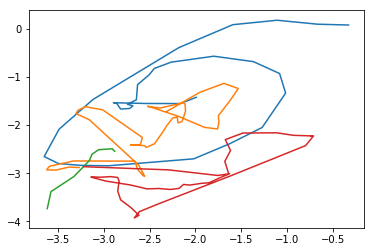

epoch 201 in 0.175 s: loss = 0.7291, LR = 0.7227, LKL = 0.0063
epoch 202 in 0.178 s: loss = 0.7457, LR = 0.7396, LKL = 0.0061
epoch 203 in 0.178 s: loss = 0.7252, LR = 0.7192, LKL = 0.0060
epoch 204 in 0.184 s: loss = 0.7695, LR = 0.7635, LKL = 0.0061
epoch 205 in 0.178 s: loss = 0.7239, LR = 0.7178, LKL = 0.0061
epoch 206 in 0.178 s: loss = 0.6831, LR = 0.6770, LKL = 0.0061
epoch 207 in 0.178 s: loss = 0.6941, LR = 0.6880, LKL = 0.0060
epoch 208 in 0.180 s: loss = 0.6982, LR = 0.6922, LKL = 0.0060
epoch 209 in 0.176 s: loss = 0.6725, LR = 0.6666, LKL = 0.0060
epoch 210 in 0.182 s: loss = 0.7410, LR = 0.7350, LKL = 0.0060
epoch 211 in 0.177 s: loss = 0.6932, LR = 0.6871, LKL = 0.0061
epoch 212 in 0.180 s: loss = 0.6853, LR = 0.6791, LKL = 0.0062
epoch 213 in 0.179 s: loss = 0.6944, LR = 0.6881, LKL = 0.0062
epoch 214 in 0.183 s: loss = 0.6879, LR = 0.6816, LKL = 0.0063
epoch 215 in 0.177 s: loss = 0.7980, LR = 0.7917, LKL = 0.0063
epoch 216 in 0.181 s: loss = 0.7186, LR = 0.7123, LKL =

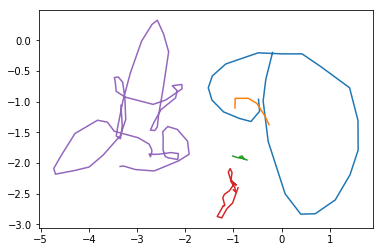

epoch 301 in 0.180 s: loss = 0.5737, LR = 0.5660, LKL = 0.0077
epoch 302 in 0.177 s: loss = 0.6017, LR = 0.5940, LKL = 0.0077
epoch 303 in 0.180 s: loss = 0.6081, LR = 0.6004, LKL = 0.0077
epoch 304 in 0.179 s: loss = 0.6114, LR = 0.6035, LKL = 0.0079
epoch 305 in 0.180 s: loss = 0.6608, LR = 0.6530, LKL = 0.0078
epoch 306 in 0.178 s: loss = 0.5626, LR = 0.5550, LKL = 0.0077
epoch 307 in 0.183 s: loss = 0.6560, LR = 0.6483, LKL = 0.0078
epoch 308 in 0.182 s: loss = 0.5567, LR = 0.5488, LKL = 0.0078
epoch 309 in 0.177 s: loss = 0.5403, LR = 0.5325, LKL = 0.0078
epoch 310 in 0.179 s: loss = 0.6068, LR = 0.5989, LKL = 0.0079
epoch 311 in 0.182 s: loss = 0.5692, LR = 0.5613, LKL = 0.0079
epoch 312 in 0.176 s: loss = 0.5915, LR = 0.5836, LKL = 0.0079
epoch 313 in 0.178 s: loss = 0.5877, LR = 0.5798, LKL = 0.0079
epoch 314 in 0.180 s: loss = 0.5867, LR = 0.5789, LKL = 0.0078
epoch 315 in 0.181 s: loss = 0.5689, LR = 0.5611, LKL = 0.0079
epoch 316 in 0.179 s: loss = 0.6105, LR = 0.6026, LKL =

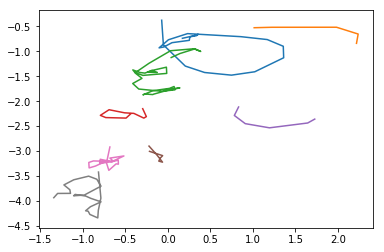

epoch 401 in 0.180 s: loss = 0.5217, LR = 0.5122, LKL = 0.0095
epoch 402 in 0.177 s: loss = 0.5776, LR = 0.5682, LKL = 0.0094
epoch 403 in 0.176 s: loss = 0.5205, LR = 0.5110, LKL = 0.0094
epoch 404 in 0.180 s: loss = 0.5185, LR = 0.5091, LKL = 0.0094
epoch 405 in 0.181 s: loss = 0.5468, LR = 0.5375, LKL = 0.0094
epoch 406 in 0.180 s: loss = 0.5167, LR = 0.5073, LKL = 0.0094
epoch 407 in 0.179 s: loss = 0.5497, LR = 0.5403, LKL = 0.0094
epoch 408 in 0.179 s: loss = 0.4688, LR = 0.4593, LKL = 0.0095
epoch 409 in 0.178 s: loss = 0.5553, LR = 0.5459, LKL = 0.0094
epoch 410 in 0.179 s: loss = 0.5262, LR = 0.5168, LKL = 0.0095
epoch 411 in 0.183 s: loss = 0.5233, LR = 0.5138, LKL = 0.0095
epoch 412 in 0.179 s: loss = 0.5567, LR = 0.5473, LKL = 0.0095
epoch 413 in 0.178 s: loss = 0.6017, LR = 0.5922, LKL = 0.0095
epoch 414 in 0.181 s: loss = 0.5250, LR = 0.5153, LKL = 0.0097
epoch 415 in 0.181 s: loss = 0.5257, LR = 0.5160, LKL = 0.0097
epoch 416 in 0.182 s: loss = 0.5308, LR = 0.5210, LKL =

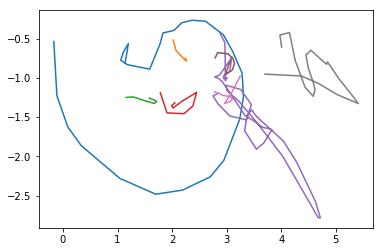

epoch 501 in 0.180 s: loss = 0.5607, LR = 0.5508, LKL = 0.0100
epoch 502 in 0.174 s: loss = 0.4721, LR = 0.4621, LKL = 0.0101
epoch 503 in 0.176 s: loss = 0.5216, LR = 0.5115, LKL = 0.0100
epoch 504 in 0.176 s: loss = 0.4558, LR = 0.4458, LKL = 0.0100
epoch 505 in 0.182 s: loss = 0.4933, LR = 0.4833, LKL = 0.0100
epoch 506 in 0.182 s: loss = 0.4927, LR = 0.4827, LKL = 0.0101
epoch 507 in 0.179 s: loss = 0.4763, LR = 0.4662, LKL = 0.0102
epoch 508 in 0.177 s: loss = 0.4062, LR = 0.3961, LKL = 0.0101
epoch 509 in 0.180 s: loss = 0.4562, LR = 0.4461, LKL = 0.0101
epoch 510 in 0.180 s: loss = 0.4814, LR = 0.4713, LKL = 0.0101
epoch 511 in 0.182 s: loss = 0.4633, LR = 0.4530, LKL = 0.0103
epoch 512 in 0.179 s: loss = 0.4882, LR = 0.4780, LKL = 0.0103
epoch 513 in 0.177 s: loss = 0.4391, LR = 0.4286, LKL = 0.0105
epoch 514 in 0.179 s: loss = 0.5075, LR = 0.4970, LKL = 0.0105
epoch 515 in 0.181 s: loss = 0.4350, LR = 0.4245, LKL = 0.0106
epoch 516 in 0.182 s: loss = 0.4662, LR = 0.4557, LKL =

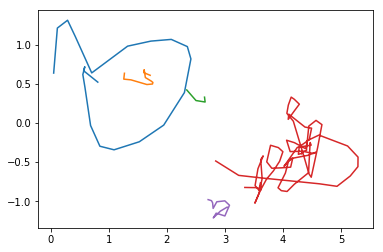

epoch 601 in 0.180 s: loss = 0.4179, LR = 0.4070, LKL = 0.0109
epoch 602 in 0.177 s: loss = 0.4443, LR = 0.4333, LKL = 0.0109
epoch 603 in 0.179 s: loss = 0.4760, LR = 0.4650, LKL = 0.0110
epoch 604 in 0.181 s: loss = 0.4375, LR = 0.4265, LKL = 0.0110
epoch 605 in 0.178 s: loss = 0.3757, LR = 0.3647, LKL = 0.0110
epoch 606 in 0.179 s: loss = 0.4151, LR = 0.4041, LKL = 0.0110
epoch 607 in 0.178 s: loss = 0.4716, LR = 0.4607, LKL = 0.0109
epoch 608 in 0.176 s: loss = 0.4784, LR = 0.4676, LKL = 0.0108
epoch 609 in 0.178 s: loss = 0.4056, LR = 0.3947, LKL = 0.0108
epoch 610 in 0.180 s: loss = 0.4221, LR = 0.4113, LKL = 0.0107
epoch 611 in 0.183 s: loss = 0.4441, LR = 0.4332, LKL = 0.0109
epoch 612 in 0.179 s: loss = 0.3995, LR = 0.3886, LKL = 0.0109
epoch 613 in 0.179 s: loss = 0.4199, LR = 0.4090, LKL = 0.0110
epoch 614 in 0.180 s: loss = 0.4229, LR = 0.4118, LKL = 0.0110
epoch 615 in 0.181 s: loss = 0.3788, LR = 0.3677, LKL = 0.0111
epoch 616 in 0.182 s: loss = 0.4259, LR = 0.4149, LKL =

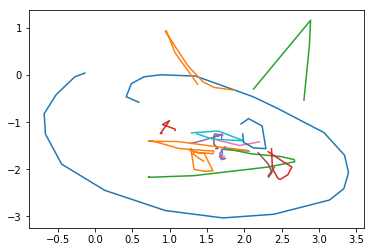

epoch 701 in 0.174 s: loss = 0.3972, LR = 0.3853, LKL = 0.0118
epoch 702 in 0.177 s: loss = 0.4278, LR = 0.4161, LKL = 0.0118
epoch 703 in 0.177 s: loss = 0.4167, LR = 0.4049, LKL = 0.0118
epoch 704 in 0.184 s: loss = 0.4310, LR = 0.4193, LKL = 0.0117
epoch 705 in 0.178 s: loss = 0.3867, LR = 0.3749, LKL = 0.0118
epoch 706 in 0.179 s: loss = 0.3530, LR = 0.3413, LKL = 0.0118
epoch 707 in 0.179 s: loss = 0.3676, LR = 0.3556, LKL = 0.0119
epoch 708 in 0.179 s: loss = 0.4184, LR = 0.4065, LKL = 0.0119
epoch 709 in 0.177 s: loss = 0.4152, LR = 0.4033, LKL = 0.0119
epoch 710 in 0.183 s: loss = 0.3400, LR = 0.3280, LKL = 0.0120
epoch 711 in 0.177 s: loss = 0.4188, LR = 0.4069, LKL = 0.0119
epoch 712 in 0.178 s: loss = 0.4493, LR = 0.4374, LKL = 0.0119
epoch 713 in 0.178 s: loss = 0.4021, LR = 0.3902, LKL = 0.0119
epoch 714 in 0.178 s: loss = 0.3878, LR = 0.3759, LKL = 0.0119
epoch 715 in 0.177 s: loss = 0.3425, LR = 0.3305, LKL = 0.0120
epoch 716 in 0.178 s: loss = 0.4677, LR = 0.4557, LKL =

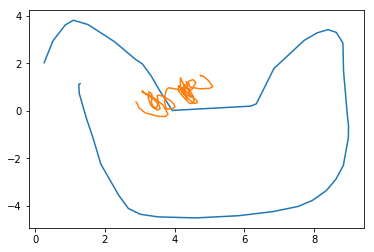

epoch 801 in 0.179 s: loss = 0.3183, LR = 0.3061, LKL = 0.0123
epoch 802 in 0.179 s: loss = 0.3428, LR = 0.3305, LKL = 0.0122
epoch 803 in 0.180 s: loss = 0.4035, LR = 0.3913, LKL = 0.0122
epoch 804 in 0.180 s: loss = 0.3423, LR = 0.3300, LKL = 0.0123
epoch 805 in 0.178 s: loss = 0.3707, LR = 0.3584, LKL = 0.0123
epoch 806 in 0.180 s: loss = 0.3358, LR = 0.3235, LKL = 0.0123
epoch 807 in 0.182 s: loss = 0.3388, LR = 0.3266, LKL = 0.0122
epoch 808 in 0.177 s: loss = 0.3890, LR = 0.3768, LKL = 0.0122
epoch 809 in 0.179 s: loss = 0.4064, LR = 0.3942, LKL = 0.0122
epoch 810 in 0.182 s: loss = 0.3627, LR = 0.3504, LKL = 0.0122
epoch 811 in 0.181 s: loss = 0.3895, LR = 0.3774, LKL = 0.0121
epoch 812 in 0.179 s: loss = 0.4097, LR = 0.3976, LKL = 0.0121
epoch 813 in 0.179 s: loss = 0.3521, LR = 0.3400, LKL = 0.0121
epoch 814 in 0.182 s: loss = 0.3254, LR = 0.3133, LKL = 0.0122
epoch 815 in 0.178 s: loss = 0.3702, LR = 0.3579, LKL = 0.0123
epoch 816 in 0.182 s: loss = 0.3568, LR = 0.3445, LKL =

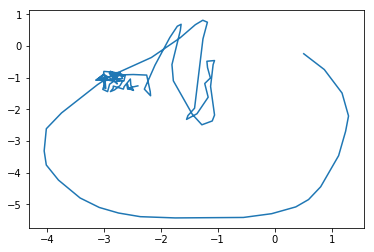

epoch 901 in 0.180 s: loss = 0.3681, LR = 0.3556, LKL = 0.0125
epoch 902 in 0.182 s: loss = 0.3623, LR = 0.3498, LKL = 0.0125
epoch 903 in 0.177 s: loss = 0.4164, LR = 0.4039, LKL = 0.0125
epoch 904 in 0.177 s: loss = 0.3383, LR = 0.3259, LKL = 0.0124
epoch 905 in 0.180 s: loss = 0.3047, LR = 0.2921, LKL = 0.0125
epoch 906 in 0.178 s: loss = 0.3278, LR = 0.3152, LKL = 0.0126
epoch 907 in 0.177 s: loss = 0.3273, LR = 0.3147, LKL = 0.0126
epoch 908 in 0.177 s: loss = 0.3618, LR = 0.3492, LKL = 0.0126
epoch 909 in 0.177 s: loss = 0.3430, LR = 0.3303, LKL = 0.0127
epoch 910 in 0.177 s: loss = 0.2853, LR = 0.2726, LKL = 0.0127
epoch 911 in 0.181 s: loss = 0.3972, LR = 0.3846, LKL = 0.0126
epoch 912 in 0.181 s: loss = 0.3058, LR = 0.2931, LKL = 0.0127
epoch 913 in 0.178 s: loss = 0.3921, LR = 0.3796, LKL = 0.0126
epoch 914 in 0.179 s: loss = 0.3352, LR = 0.3226, LKL = 0.0126
epoch 915 in 0.181 s: loss = 0.3052, LR = 0.2925, LKL = 0.0127
epoch 916 in 0.178 s: loss = 0.3476, LR = 0.3350, LKL =

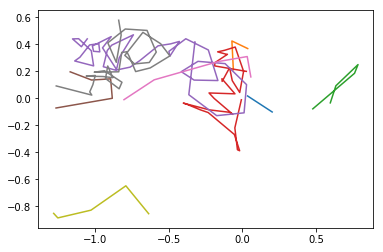

epoch 1001 in 0.179 s: loss = 0.2808, LR = 0.2681, LKL = 0.0127
epoch 1002 in 0.178 s: loss = 0.3170, LR = 0.3041, LKL = 0.0129
epoch 1003 in 0.177 s: loss = 0.3211, LR = 0.3082, LKL = 0.0129
epoch 1004 in 0.179 s: loss = 0.3365, LR = 0.3236, LKL = 0.0129
epoch 1005 in 0.178 s: loss = 0.3537, LR = 0.3409, LKL = 0.0128
epoch 1006 in 0.183 s: loss = 0.2888, LR = 0.2761, LKL = 0.0127
epoch 1007 in 0.177 s: loss = 0.3977, LR = 0.3849, LKL = 0.0129
epoch 1008 in 0.179 s: loss = 0.3520, LR = 0.3392, LKL = 0.0128
epoch 1009 in 0.179 s: loss = 0.3062, LR = 0.2933, LKL = 0.0129
epoch 1010 in 0.182 s: loss = 0.3134, LR = 0.3006, LKL = 0.0128
epoch 1011 in 0.182 s: loss = 0.3523, LR = 0.3395, LKL = 0.0129
epoch 1012 in 0.180 s: loss = 0.2591, LR = 0.2462, LKL = 0.0130
epoch 1013 in 0.176 s: loss = 0.3727, LR = 0.3598, LKL = 0.0129
epoch 1014 in 0.179 s: loss = 0.2774, LR = 0.2644, LKL = 0.0130
epoch 1015 in 0.177 s: loss = 0.2942, LR = 0.2812, LKL = 0.0130
epoch 1016 in 0.183 s: loss = 0.2792, LR

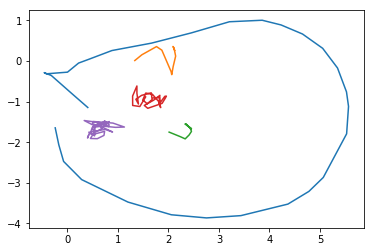

epoch 1101 in 0.180 s: loss = 0.3202, LR = 0.3069, LKL = 0.0133
epoch 1102 in 0.178 s: loss = 0.2886, LR = 0.2754, LKL = 0.0132
epoch 1103 in 0.176 s: loss = 0.2422, LR = 0.2290, LKL = 0.0132
epoch 1104 in 0.177 s: loss = 0.3921, LR = 0.3789, LKL = 0.0132
epoch 1105 in 0.178 s: loss = 0.3311, LR = 0.3179, LKL = 0.0132
epoch 1106 in 0.177 s: loss = 0.3474, LR = 0.3343, LKL = 0.0131
epoch 1107 in 0.179 s: loss = 0.3320, LR = 0.3190, LKL = 0.0130
epoch 1108 in 0.175 s: loss = 0.3205, LR = 0.3075, LKL = 0.0131
epoch 1109 in 0.177 s: loss = 0.3140, LR = 0.3010, LKL = 0.0130
epoch 1110 in 0.180 s: loss = 0.2984, LR = 0.2854, LKL = 0.0130
epoch 1111 in 0.180 s: loss = 0.3297, LR = 0.3167, LKL = 0.0130
epoch 1112 in 0.178 s: loss = 0.2216, LR = 0.2087, LKL = 0.0130
epoch 1113 in 0.176 s: loss = 0.3142, LR = 0.3013, LKL = 0.0129
epoch 1114 in 0.174 s: loss = 0.3182, LR = 0.3053, LKL = 0.0129
epoch 1115 in 0.179 s: loss = 0.2976, LR = 0.2848, LKL = 0.0128
epoch 1116 in 0.178 s: loss = 0.3221, LR

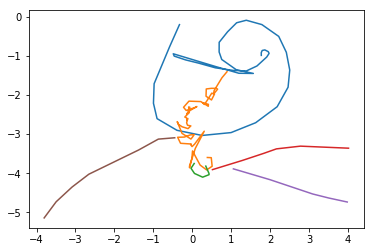

epoch 1201 in 0.175 s: loss = 0.2737, LR = 0.2599, LKL = 0.0138
epoch 1202 in 0.178 s: loss = 0.2788, LR = 0.2649, LKL = 0.0139
epoch 1203 in 0.178 s: loss = 0.2656, LR = 0.2517, LKL = 0.0139
epoch 1204 in 0.178 s: loss = 0.2646, LR = 0.2508, LKL = 0.0139
epoch 1205 in 0.178 s: loss = 0.2619, LR = 0.2482, LKL = 0.0137
epoch 1206 in 0.178 s: loss = 0.2683, LR = 0.2544, LKL = 0.0139
epoch 1207 in 0.178 s: loss = 0.2667, LR = 0.2528, LKL = 0.0139
epoch 1208 in 0.178 s: loss = 0.2704, LR = 0.2566, LKL = 0.0138
epoch 1209 in 0.178 s: loss = 0.2796, LR = 0.2658, LKL = 0.0139
epoch 1210 in 0.182 s: loss = 0.3158, LR = 0.3020, LKL = 0.0138
epoch 1211 in 0.177 s: loss = 0.2870, LR = 0.2732, LKL = 0.0138
epoch 1212 in 0.179 s: loss = 0.2812, LR = 0.2673, LKL = 0.0139
epoch 1213 in 0.177 s: loss = 0.2847, LR = 0.2708, LKL = 0.0138
epoch 1214 in 0.182 s: loss = 0.2766, LR = 0.2628, LKL = 0.0138
epoch 1215 in 0.178 s: loss = 0.3428, LR = 0.3291, LKL = 0.0137
epoch 1216 in 0.177 s: loss = 0.2500, LR

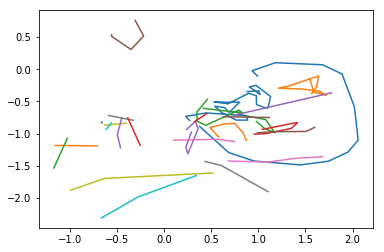

epoch 1301 in 0.179 s: loss = 0.2884, LR = 0.2748, LKL = 0.0136
epoch 1302 in 0.176 s: loss = 0.2711, LR = 0.2575, LKL = 0.0136
epoch 1303 in 0.176 s: loss = 0.3342, LR = 0.3207, LKL = 0.0135
epoch 1304 in 0.174 s: loss = 0.3189, LR = 0.3053, LKL = 0.0136
epoch 1305 in 0.179 s: loss = 0.3380, LR = 0.3244, LKL = 0.0136
epoch 1306 in 0.179 s: loss = 0.2580, LR = 0.2444, LKL = 0.0137
epoch 1307 in 0.178 s: loss = 0.2798, LR = 0.2662, LKL = 0.0136
epoch 1308 in 0.179 s: loss = 0.3065, LR = 0.2928, LKL = 0.0137
epoch 1309 in 0.177 s: loss = 0.2898, LR = 0.2762, LKL = 0.0136
epoch 1310 in 0.177 s: loss = 0.3596, LR = 0.3460, LKL = 0.0136
epoch 1311 in 0.180 s: loss = 0.2306, LR = 0.2170, LKL = 0.0136
epoch 1312 in 0.177 s: loss = 0.3277, LR = 0.3141, LKL = 0.0136
epoch 1313 in 0.178 s: loss = 0.2525, LR = 0.2389, LKL = 0.0136
epoch 1314 in 0.175 s: loss = 0.2314, LR = 0.2179, LKL = 0.0136
epoch 1315 in 0.181 s: loss = 0.2369, LR = 0.2234, LKL = 0.0135
epoch 1316 in 0.176 s: loss = 0.2834, LR

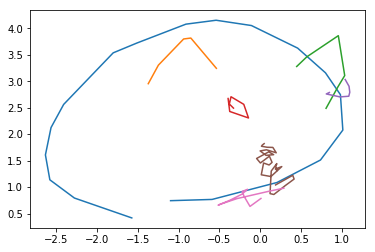

epoch 1401 in 0.180 s: loss = 0.2255, LR = 0.2112, LKL = 0.0143
epoch 1402 in 0.177 s: loss = 0.2228, LR = 0.2085, LKL = 0.0142
epoch 1403 in 0.177 s: loss = 0.2745, LR = 0.2603, LKL = 0.0142
epoch 1404 in 0.176 s: loss = 0.2979, LR = 0.2838, LKL = 0.0142
epoch 1405 in 0.179 s: loss = 0.2978, LR = 0.2837, LKL = 0.0141
epoch 1406 in 0.183 s: loss = 0.2676, LR = 0.2533, LKL = 0.0142
epoch 1407 in 0.179 s: loss = 0.2725, LR = 0.2584, LKL = 0.0141
epoch 1408 in 0.180 s: loss = 0.2369, LR = 0.2228, LKL = 0.0141
epoch 1409 in 0.176 s: loss = 0.3210, LR = 0.3070, LKL = 0.0140
epoch 1410 in 0.177 s: loss = 0.2606, LR = 0.2467, LKL = 0.0140
epoch 1411 in 0.180 s: loss = 0.2868, LR = 0.2729, LKL = 0.0139
epoch 1412 in 0.176 s: loss = 0.2286, LR = 0.2148, LKL = 0.0138
epoch 1413 in 0.179 s: loss = 0.2303, LR = 0.2164, LKL = 0.0139
epoch 1414 in 0.178 s: loss = 0.2888, LR = 0.2750, LKL = 0.0138
epoch 1415 in 0.179 s: loss = 0.2779, LR = 0.2641, LKL = 0.0138
epoch 1416 in 0.175 s: loss = 0.2042, LR

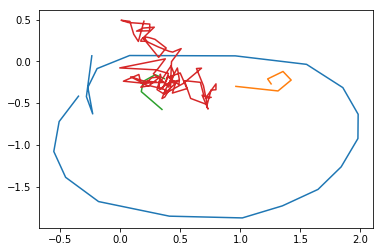

epoch 1501 in 0.178 s: loss = 0.2122, LR = 0.1976, LKL = 0.0146
epoch 1502 in 0.175 s: loss = 0.1976, LR = 0.1829, LKL = 0.0147
epoch 1503 in 0.171 s: loss = 0.2890, LR = 0.2745, LKL = 0.0146
epoch 1504 in 0.175 s: loss = 0.2571, LR = 0.2425, LKL = 0.0146
epoch 1505 in 0.179 s: loss = 0.2456, LR = 0.2310, LKL = 0.0146
epoch 1506 in 0.179 s: loss = 0.1676, LR = 0.1529, LKL = 0.0147
epoch 1507 in 0.177 s: loss = 0.2234, LR = 0.2088, LKL = 0.0146
epoch 1508 in 0.178 s: loss = 0.2499, LR = 0.2352, LKL = 0.0147
epoch 1509 in 0.175 s: loss = 0.2855, LR = 0.2708, LKL = 0.0147
epoch 1510 in 0.178 s: loss = 0.2749, LR = 0.2603, LKL = 0.0146
epoch 1511 in 0.180 s: loss = 0.3140, LR = 0.2994, LKL = 0.0145
epoch 1512 in 0.178 s: loss = 0.2939, LR = 0.2794, LKL = 0.0145
epoch 1513 in 0.175 s: loss = 0.2772, LR = 0.2627, LKL = 0.0145
epoch 1514 in 0.178 s: loss = 0.2137, LR = 0.1993, LKL = 0.0144
epoch 1515 in 0.180 s: loss = 0.2282, LR = 0.2137, LKL = 0.0145
epoch 1516 in 0.180 s: loss = 0.2009, LR

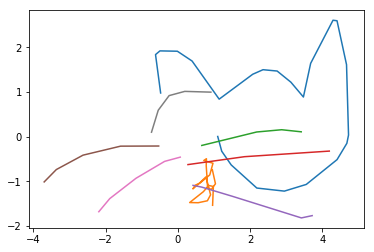

epoch 1601 in 0.176 s: loss = 0.3013, LR = 0.2869, LKL = 0.0144
epoch 1602 in 0.179 s: loss = 0.2577, LR = 0.2434, LKL = 0.0143
epoch 1603 in 0.181 s: loss = 0.2159, LR = 0.2015, LKL = 0.0144
epoch 1604 in 0.178 s: loss = 0.2248, LR = 0.2105, LKL = 0.0143
epoch 1605 in 0.181 s: loss = 0.3176, LR = 0.3034, LKL = 0.0142
epoch 1606 in 0.176 s: loss = 0.3073, LR = 0.2930, LKL = 0.0142
epoch 1607 in 0.179 s: loss = 0.2431, LR = 0.2289, LKL = 0.0142
epoch 1608 in 0.178 s: loss = 0.2848, LR = 0.2706, LKL = 0.0142
epoch 1609 in 0.181 s: loss = 0.2637, LR = 0.2495, LKL = 0.0142
epoch 1610 in 0.177 s: loss = 0.1913, LR = 0.1771, LKL = 0.0142
epoch 1611 in 0.178 s: loss = 0.2293, LR = 0.2150, LKL = 0.0143
epoch 1612 in 0.181 s: loss = 0.2612, LR = 0.2469, LKL = 0.0143
epoch 1613 in 0.179 s: loss = 0.2846, LR = 0.2703, LKL = 0.0143
epoch 1614 in 0.181 s: loss = 0.2768, LR = 0.2624, LKL = 0.0144
epoch 1615 in 0.181 s: loss = 0.2647, LR = 0.2503, LKL = 0.0144
epoch 1616 in 0.179 s: loss = 0.2780, LR

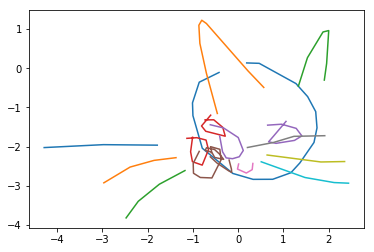

epoch 1701 in 0.177 s: loss = 0.2537, LR = 0.2385, LKL = 0.0151
epoch 1702 in 0.176 s: loss = 0.1896, LR = 0.1745, LKL = 0.0151
epoch 1703 in 0.181 s: loss = 0.2106, LR = 0.1955, LKL = 0.0151
epoch 1704 in 0.175 s: loss = 0.2396, LR = 0.2245, LKL = 0.0151
epoch 1705 in 0.176 s: loss = 0.2061, LR = 0.1910, LKL = 0.0151
epoch 1706 in 0.177 s: loss = 0.2935, LR = 0.2783, LKL = 0.0152
epoch 1707 in 0.178 s: loss = 0.2143, LR = 0.1990, LKL = 0.0153
epoch 1708 in 0.178 s: loss = 0.2314, LR = 0.2161, LKL = 0.0153
epoch 1709 in 0.178 s: loss = 0.1972, LR = 0.1819, LKL = 0.0152
epoch 1710 in 0.177 s: loss = 0.2494, LR = 0.2342, LKL = 0.0152
epoch 1711 in 0.179 s: loss = 0.2147, LR = 0.1993, LKL = 0.0153
epoch 1712 in 0.176 s: loss = 0.2603, LR = 0.2450, LKL = 0.0153
epoch 1713 in 0.183 s: loss = 0.2109, LR = 0.1955, LKL = 0.0154
epoch 1714 in 0.175 s: loss = 0.2825, LR = 0.2671, LKL = 0.0154
epoch 1715 in 0.171 s: loss = 0.1990, LR = 0.1837, LKL = 0.0154
epoch 1716 in 0.180 s: loss = 0.1914, LR

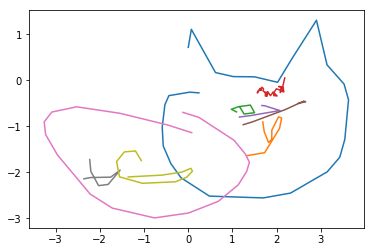

epoch 1801 in 0.177 s: loss = 0.2310, LR = 0.2158, LKL = 0.0152
epoch 1802 in 0.175 s: loss = 0.2755, LR = 0.2603, LKL = 0.0152
epoch 1803 in 0.180 s: loss = 0.1911, LR = 0.1760, LKL = 0.0151
epoch 1804 in 0.179 s: loss = 0.2492, LR = 0.2341, LKL = 0.0151
epoch 1805 in 0.177 s: loss = 0.2691, LR = 0.2540, LKL = 0.0150
epoch 1806 in 0.176 s: loss = 0.1859, LR = 0.1708, LKL = 0.0151
epoch 1807 in 0.177 s: loss = 0.2106, LR = 0.1955, LKL = 0.0151
epoch 1808 in 0.180 s: loss = 0.2296, LR = 0.2144, LKL = 0.0151
epoch 1809 in 0.177 s: loss = 0.2039, LR = 0.1888, LKL = 0.0151
epoch 1810 in 0.177 s: loss = 0.2424, LR = 0.2273, LKL = 0.0151
epoch 1811 in 0.178 s: loss = 0.2136, LR = 0.1985, LKL = 0.0151
epoch 1812 in 0.177 s: loss = 0.1920, LR = 0.1769, LKL = 0.0151
epoch 1813 in 0.179 s: loss = 0.1696, LR = 0.1546, LKL = 0.0150
epoch 1814 in 0.178 s: loss = 0.1742, LR = 0.1591, LKL = 0.0151
epoch 1815 in 0.177 s: loss = 0.2541, LR = 0.2390, LKL = 0.0150
epoch 1816 in 0.178 s: loss = 0.2204, LR

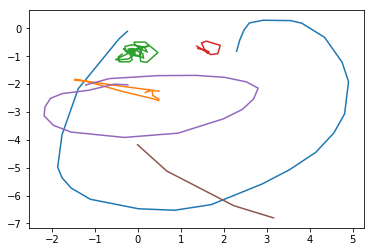

epoch 1901 in 0.178 s: loss = 0.2184, LR = 0.2032, LKL = 0.0152
epoch 1902 in 0.177 s: loss = 0.1778, LR = 0.1625, LKL = 0.0152
epoch 1903 in 0.180 s: loss = 0.1569, LR = 0.1416, LKL = 0.0153
epoch 1904 in 0.178 s: loss = 0.2366, LR = 0.2216, LKL = 0.0150
epoch 1905 in 0.176 s: loss = 0.1701, LR = 0.1549, LKL = 0.0152
epoch 1906 in 0.177 s: loss = 0.2716, LR = 0.2565, LKL = 0.0150
epoch 1907 in 0.175 s: loss = 0.2365, LR = 0.2215, LKL = 0.0150
epoch 1908 in 0.181 s: loss = 0.1990, LR = 0.1840, LKL = 0.0151
epoch 1909 in 0.176 s: loss = 0.2460, LR = 0.2309, LKL = 0.0150
epoch 1910 in 0.181 s: loss = 0.2773, LR = 0.2622, LKL = 0.0151
epoch 1911 in 0.177 s: loss = 0.2386, LR = 0.2235, LKL = 0.0151
epoch 1912 in 0.176 s: loss = 0.2419, LR = 0.2268, LKL = 0.0150
epoch 1913 in 0.179 s: loss = 0.1685, LR = 0.1535, LKL = 0.0151
epoch 1914 in 0.177 s: loss = 0.1283, LR = 0.1131, LKL = 0.0152
epoch 1915 in 0.176 s: loss = 0.1730, LR = 0.1580, LKL = 0.0150
epoch 1916 in 0.177 s: loss = 0.1994, LR

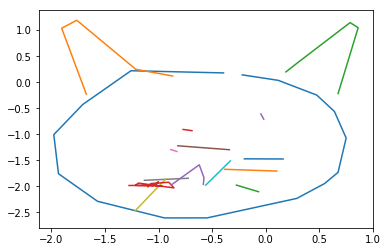

epoch 2001 in 0.179 s: loss = 0.1254, LR = 0.1095, LKL = 0.0160
epoch 2002 in 0.173 s: loss = 0.2062, LR = 0.1903, LKL = 0.0159
epoch 2003 in 0.176 s: loss = 0.2102, LR = 0.1943, LKL = 0.0159
epoch 2004 in 0.175 s: loss = 0.2097, LR = 0.1939, LKL = 0.0158
epoch 2005 in 0.177 s: loss = 0.1916, LR = 0.1759, LKL = 0.0158
epoch 2006 in 0.178 s: loss = 0.2134, LR = 0.1976, LKL = 0.0158
epoch 2007 in 0.177 s: loss = 0.2179, LR = 0.2021, LKL = 0.0158
epoch 2008 in 0.177 s: loss = 0.1844, LR = 0.1684, LKL = 0.0159
epoch 2009 in 0.177 s: loss = 0.2219, LR = 0.2062, LKL = 0.0157
epoch 2010 in 0.176 s: loss = 0.1978, LR = 0.1821, LKL = 0.0158
epoch 2011 in 0.181 s: loss = 0.2115, LR = 0.1959, LKL = 0.0156
epoch 2012 in 0.172 s: loss = 0.0964, LR = 0.0807, LKL = 0.0157
epoch 2013 in 0.170 s: loss = 0.1982, LR = 0.1824, LKL = 0.0158
epoch 2014 in 0.175 s: loss = 0.1707, LR = 0.1549, LKL = 0.0158
epoch 2015 in 0.178 s: loss = 0.1706, LR = 0.1548, LKL = 0.0158
epoch 2016 in 0.177 s: loss = 0.1875, LR

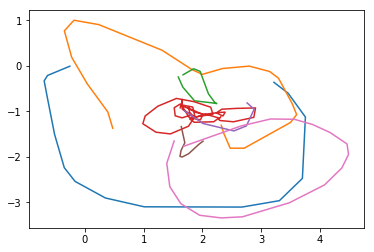

epoch 2101 in 0.175 s: loss = 0.1737, LR = 0.1584, LKL = 0.0153
epoch 2102 in 0.177 s: loss = 0.1758, LR = 0.1605, LKL = 0.0153
epoch 2103 in 0.181 s: loss = 0.1916, LR = 0.1763, LKL = 0.0153
epoch 2104 in 0.174 s: loss = 0.1952, LR = 0.1800, LKL = 0.0153
epoch 2105 in 0.177 s: loss = 0.1865, LR = 0.1713, LKL = 0.0153
epoch 2106 in 0.179 s: loss = 0.1821, LR = 0.1667, LKL = 0.0153
epoch 2107 in 0.178 s: loss = 0.1952, LR = 0.1799, LKL = 0.0153
epoch 2108 in 0.180 s: loss = 0.1551, LR = 0.1396, LKL = 0.0155
epoch 2109 in 0.179 s: loss = 0.2131, LR = 0.1976, LKL = 0.0154
epoch 2110 in 0.178 s: loss = 0.1836, LR = 0.1681, LKL = 0.0155
epoch 2111 in 0.179 s: loss = 0.1530, LR = 0.1375, LKL = 0.0155
epoch 2112 in 0.178 s: loss = 0.1840, LR = 0.1686, LKL = 0.0154
epoch 2113 in 0.183 s: loss = 0.1513, LR = 0.1357, LKL = 0.0156
epoch 2114 in 0.178 s: loss = 0.2308, LR = 0.2153, LKL = 0.0155
epoch 2115 in 0.179 s: loss = 0.1571, LR = 0.1416, LKL = 0.0155
epoch 2116 in 0.178 s: loss = 0.2126, LR

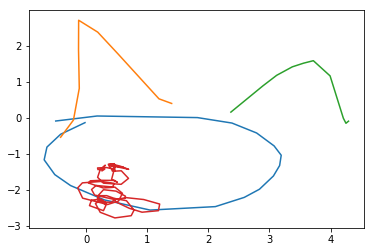

epoch 2201 in 0.176 s: loss = 0.2149, LR = 0.1985, LKL = 0.0164
epoch 2202 in 0.178 s: loss = 0.1323, LR = 0.1159, LKL = 0.0164
epoch 2203 in 0.175 s: loss = 0.1992, LR = 0.1827, LKL = 0.0165
epoch 2204 in 0.174 s: loss = 0.1798, LR = 0.1634, LKL = 0.0164
epoch 2205 in 0.176 s: loss = 0.2162, LR = 0.1999, LKL = 0.0163
epoch 2206 in 0.177 s: loss = 0.1798, LR = 0.1634, LKL = 0.0164
epoch 2207 in 0.176 s: loss = 0.1708, LR = 0.1545, LKL = 0.0163
epoch 2208 in 0.175 s: loss = 0.2194, LR = 0.2030, LKL = 0.0164
epoch 2209 in 0.172 s: loss = 0.1234, LR = 0.1071, LKL = 0.0163
epoch 2210 in 0.178 s: loss = 0.2248, LR = 0.2085, LKL = 0.0163
epoch 2211 in 0.176 s: loss = 0.1364, LR = 0.1201, LKL = 0.0163
epoch 2212 in 0.177 s: loss = 0.2398, LR = 0.2234, LKL = 0.0163
epoch 2213 in 0.176 s: loss = 0.1376, LR = 0.1212, LKL = 0.0164
epoch 2214 in 0.178 s: loss = 0.1720, LR = 0.1557, LKL = 0.0163
epoch 2215 in 0.176 s: loss = 0.1642, LR = 0.1478, LKL = 0.0164
epoch 2216 in 0.177 s: loss = 0.1851, LR

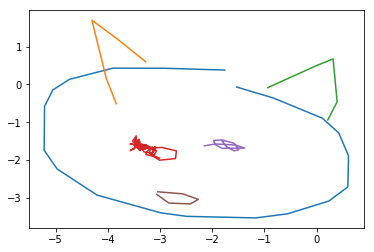

epoch 2301 in 0.180 s: loss = 0.1834, LR = 0.1673, LKL = 0.0161
epoch 2302 in 0.177 s: loss = 0.1628, LR = 0.1466, LKL = 0.0161
epoch 2303 in 0.178 s: loss = 0.1421, LR = 0.1260, LKL = 0.0161
epoch 2304 in 0.176 s: loss = 0.2430, LR = 0.2269, LKL = 0.0160
epoch 2305 in 0.182 s: loss = 0.1982, LR = 0.1821, LKL = 0.0161
epoch 2306 in 0.178 s: loss = 0.1702, LR = 0.1540, LKL = 0.0162
epoch 2307 in 0.181 s: loss = 0.1574, LR = 0.1413, LKL = 0.0161
epoch 2308 in 0.174 s: loss = 0.2074, LR = 0.1912, LKL = 0.0162
epoch 2309 in 0.180 s: loss = 0.1568, LR = 0.1407, LKL = 0.0161
epoch 2310 in 0.179 s: loss = 0.1767, LR = 0.1605, LKL = 0.0162
epoch 2311 in 0.183 s: loss = 0.1885, LR = 0.1724, LKL = 0.0161
epoch 2312 in 0.177 s: loss = 0.1262, LR = 0.1101, LKL = 0.0162
epoch 2313 in 0.179 s: loss = 0.1972, LR = 0.1810, LKL = 0.0162
epoch 2314 in 0.177 s: loss = 0.1954, LR = 0.1793, LKL = 0.0161
epoch 2315 in 0.183 s: loss = 0.1643, LR = 0.1483, LKL = 0.0161
epoch 2316 in 0.179 s: loss = 0.1905, LR

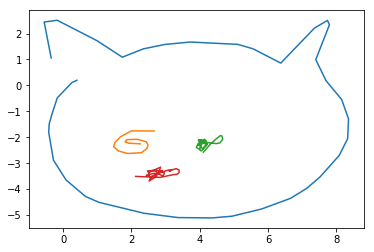

epoch 2401 in 0.175 s: loss = 0.1684, LR = 0.1522, LKL = 0.0162
epoch 2402 in 0.176 s: loss = 0.1713, LR = 0.1552, LKL = 0.0162
epoch 2403 in 0.176 s: loss = 0.1373, LR = 0.1211, LKL = 0.0162
epoch 2404 in 0.174 s: loss = 0.1976, LR = 0.1813, LKL = 0.0163
epoch 2405 in 0.176 s: loss = 0.1828, LR = 0.1666, LKL = 0.0162
epoch 2406 in 0.174 s: loss = 0.1331, LR = 0.1168, LKL = 0.0163
epoch 2407 in 0.175 s: loss = 0.1620, LR = 0.1458, LKL = 0.0162
epoch 2408 in 0.174 s: loss = 0.1643, LR = 0.1481, LKL = 0.0162
epoch 2409 in 0.179 s: loss = 0.1813, LR = 0.1651, LKL = 0.0163
epoch 2410 in 0.179 s: loss = 0.1676, LR = 0.1513, LKL = 0.0163
epoch 2411 in 0.178 s: loss = 0.2062, LR = 0.1900, LKL = 0.0162
epoch 2412 in 0.176 s: loss = 0.2317, LR = 0.2155, LKL = 0.0162
epoch 2413 in 0.175 s: loss = 0.1255, LR = 0.1093, LKL = 0.0162
epoch 2414 in 0.174 s: loss = 0.1114, LR = 0.0951, LKL = 0.0163
epoch 2415 in 0.175 s: loss = 0.1646, LR = 0.1483, LKL = 0.0163
epoch 2416 in 0.175 s: loss = 0.2100, LR

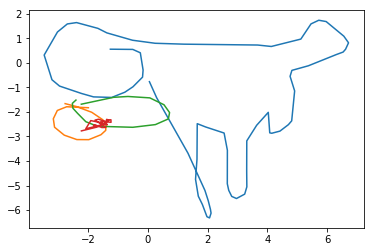

epoch 2501 in 0.173 s: loss = 0.1820, LR = 0.1657, LKL = 0.0163
epoch 2502 in 0.176 s: loss = 0.1350, LR = 0.1186, LKL = 0.0164
epoch 2503 in 0.176 s: loss = 0.1301, LR = 0.1137, LKL = 0.0164
epoch 2504 in 0.174 s: loss = 0.0736, LR = 0.0571, LKL = 0.0165
epoch 2505 in 0.175 s: loss = 0.1337, LR = 0.1173, LKL = 0.0163
epoch 2506 in 0.171 s: loss = 0.1600, LR = 0.1439, LKL = 0.0162
epoch 2507 in 0.174 s: loss = 0.1750, LR = 0.1588, LKL = 0.0162
epoch 2508 in 0.175 s: loss = 0.1216, LR = 0.1052, LKL = 0.0164
epoch 2509 in 0.175 s: loss = 0.1822, LR = 0.1658, LKL = 0.0164
epoch 2510 in 0.174 s: loss = 0.1265, LR = 0.1102, LKL = 0.0163
epoch 2511 in 0.176 s: loss = 0.1738, LR = 0.1574, LKL = 0.0164
epoch 2512 in 0.176 s: loss = 0.1602, LR = 0.1439, LKL = 0.0163
epoch 2513 in 0.178 s: loss = 0.2072, LR = 0.1909, LKL = 0.0163
epoch 2514 in 0.175 s: loss = 0.1681, LR = 0.1517, LKL = 0.0164
epoch 2515 in 0.179 s: loss = 0.2106, LR = 0.1943, LKL = 0.0163
epoch 2516 in 0.176 s: loss = 0.2098, LR

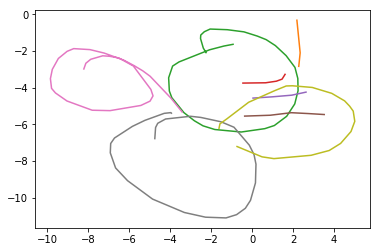

epoch 2601 in 0.175 s: loss = 0.1594, LR = 0.1428, LKL = 0.0166
epoch 2602 in 0.174 s: loss = 0.1018, LR = 0.0854, LKL = 0.0165
epoch 2603 in 0.178 s: loss = 0.1191, LR = 0.1024, LKL = 0.0167
epoch 2604 in 0.179 s: loss = 0.1089, LR = 0.0922, LKL = 0.0167
epoch 2605 in 0.177 s: loss = 0.1502, LR = 0.1335, LKL = 0.0168
epoch 2606 in 0.177 s: loss = 0.1528, LR = 0.1362, LKL = 0.0165
epoch 2607 in 0.180 s: loss = 0.0837, LR = 0.0671, LKL = 0.0166
epoch 2608 in 0.176 s: loss = 0.0889, LR = 0.0723, LKL = 0.0166
epoch 2609 in 0.176 s: loss = 0.1134, LR = 0.0968, LKL = 0.0166
epoch 2610 in 0.177 s: loss = 0.1517, LR = 0.1351, LKL = 0.0167
epoch 2611 in 0.175 s: loss = 0.0991, LR = 0.0824, LKL = 0.0167
epoch 2612 in 0.174 s: loss = 0.1300, LR = 0.1133, LKL = 0.0167
epoch 2613 in 0.176 s: loss = 0.2063, LR = 0.1897, LKL = 0.0166
epoch 2614 in 0.179 s: loss = 0.1527, LR = 0.1361, LKL = 0.0166
epoch 2615 in 0.176 s: loss = 0.1908, LR = 0.1743, LKL = 0.0165
epoch 2616 in 0.172 s: loss = 0.1275, LR

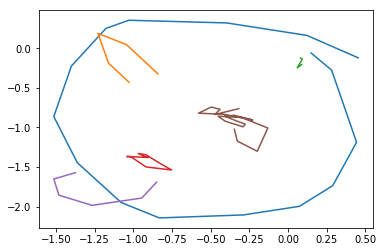

epoch 2701 in 0.175 s: loss = 0.0982, LR = 0.0814, LKL = 0.0168
epoch 2702 in 0.173 s: loss = 0.1480, LR = 0.1312, LKL = 0.0168
epoch 2703 in 0.174 s: loss = 0.1513, LR = 0.1344, LKL = 0.0168
epoch 2704 in 0.174 s: loss = 0.1744, LR = 0.1576, LKL = 0.0169
epoch 2705 in 0.174 s: loss = 0.1686, LR = 0.1518, LKL = 0.0168
epoch 2706 in 0.172 s: loss = 0.1710, LR = 0.1543, LKL = 0.0167
epoch 2707 in 0.174 s: loss = 0.1837, LR = 0.1668, LKL = 0.0169
epoch 2708 in 0.171 s: loss = 0.0848, LR = 0.0679, LKL = 0.0169
epoch 2709 in 0.174 s: loss = 0.1469, LR = 0.1302, LKL = 0.0167
epoch 2710 in 0.173 s: loss = 0.1245, LR = 0.1077, LKL = 0.0168
epoch 2711 in 0.178 s: loss = 0.1466, LR = 0.1298, LKL = 0.0168
epoch 2712 in 0.176 s: loss = 0.1259, LR = 0.1091, LKL = 0.0169
epoch 2713 in 0.181 s: loss = 0.1719, LR = 0.1550, LKL = 0.0169
epoch 2714 in 0.172 s: loss = 0.1457, LR = 0.1289, LKL = 0.0168
epoch 2715 in 0.177 s: loss = 0.1364, LR = 0.1195, LKL = 0.0169
epoch 2716 in 0.172 s: loss = 0.1285, LR

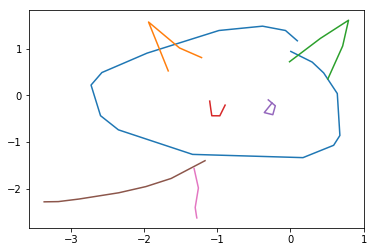

epoch 2801 in 0.175 s: loss = 0.1269, LR = 0.1099, LKL = 0.0170
epoch 2802 in 0.176 s: loss = 0.1514, LR = 0.1343, LKL = 0.0170
epoch 2803 in 0.176 s: loss = 0.1271, LR = 0.1101, LKL = 0.0170
epoch 2804 in 0.177 s: loss = 0.1425, LR = 0.1255, LKL = 0.0170
epoch 2805 in 0.174 s: loss = 0.1674, LR = 0.1504, LKL = 0.0171
epoch 2806 in 0.172 s: loss = 0.1358, LR = 0.1188, LKL = 0.0170
epoch 2807 in 0.177 s: loss = 0.1056, LR = 0.0886, LKL = 0.0170
epoch 2808 in 0.176 s: loss = 0.1653, LR = 0.1484, LKL = 0.0169
epoch 2809 in 0.176 s: loss = 0.2089, LR = 0.1919, LKL = 0.0170
epoch 2810 in 0.175 s: loss = 0.1003, LR = 0.0832, LKL = 0.0171
epoch 2811 in 0.173 s: loss = 0.1305, LR = 0.1134, LKL = 0.0171
epoch 2812 in 0.174 s: loss = 0.1627, LR = 0.1457, LKL = 0.0170
epoch 2813 in 0.174 s: loss = 0.1343, LR = 0.1172, LKL = 0.0171
epoch 2814 in 0.178 s: loss = 0.1806, LR = 0.1636, LKL = 0.0170
epoch 2815 in 0.176 s: loss = 0.1198, LR = 0.1028, LKL = 0.0170
epoch 2816 in 0.175 s: loss = 0.0416, LR

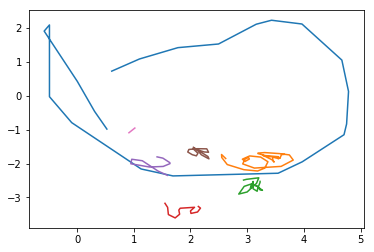

epoch 2901 in 0.175 s: loss = 0.1602, LR = 0.1429, LKL = 0.0174
epoch 2902 in 0.169 s: loss = 0.1431, LR = 0.1258, LKL = 0.0173
epoch 2903 in 0.175 s: loss = 0.1689, LR = 0.1517, LKL = 0.0172
epoch 2904 in 0.172 s: loss = 0.2050, LR = 0.1877, LKL = 0.0172
epoch 2905 in 0.173 s: loss = 0.0843, LR = 0.0671, LKL = 0.0172
epoch 2906 in 0.173 s: loss = 0.1823, LR = 0.1651, LKL = 0.0172
epoch 2907 in 0.172 s: loss = 0.1278, LR = 0.1107, LKL = 0.0171
epoch 2908 in 0.175 s: loss = 0.1022, LR = 0.0850, LKL = 0.0172
epoch 2909 in 0.172 s: loss = 0.1302, LR = 0.1131, LKL = 0.0171
epoch 2910 in 0.177 s: loss = 0.1324, LR = 0.1154, LKL = 0.0170
epoch 2911 in 0.173 s: loss = 0.1566, LR = 0.1395, LKL = 0.0171
epoch 2912 in 0.171 s: loss = 0.1085, LR = 0.0913, LKL = 0.0172
epoch 2913 in 0.176 s: loss = 0.0829, LR = 0.0657, LKL = 0.0172
epoch 2914 in 0.174 s: loss = 0.1348, LR = 0.1177, LKL = 0.0171
epoch 2915 in 0.174 s: loss = 0.1414, LR = 0.1242, LKL = 0.0172
epoch 2916 in 0.176 s: loss = 0.1463, LR

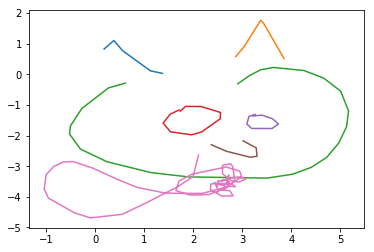

epoch 3001 in 0.175 s: loss = 0.1063, LR = 0.0891, LKL = 0.0172
epoch 3002 in 0.175 s: loss = 0.1185, LR = 0.1013, LKL = 0.0172
epoch 3003 in 0.172 s: loss = 0.1653, LR = 0.1480, LKL = 0.0173
epoch 3004 in 0.177 s: loss = 0.0868, LR = 0.0696, LKL = 0.0173
epoch 3005 in 0.176 s: loss = 0.2200, LR = 0.2027, LKL = 0.0173
epoch 3006 in 0.172 s: loss = 0.1230, LR = 0.1058, LKL = 0.0172
epoch 3007 in 0.176 s: loss = 0.1941, LR = 0.1768, LKL = 0.0173
epoch 3008 in 0.177 s: loss = 0.1237, LR = 0.1063, LKL = 0.0173
epoch 3009 in 0.175 s: loss = 0.1499, LR = 0.1326, LKL = 0.0173
epoch 3010 in 0.174 s: loss = 0.1413, LR = 0.1240, LKL = 0.0173
epoch 3011 in 0.173 s: loss = 0.1153, LR = 0.0980, LKL = 0.0174
epoch 3012 in 0.177 s: loss = 0.0703, LR = 0.0530, LKL = 0.0173
epoch 3013 in 0.178 s: loss = 0.1016, LR = 0.0843, LKL = 0.0173
epoch 3014 in 0.178 s: loss = 0.1255, LR = 0.1082, LKL = 0.0174
epoch 3015 in 0.177 s: loss = 0.0884, LR = 0.0712, LKL = 0.0172
epoch 3016 in 0.176 s: loss = 0.0762, LR

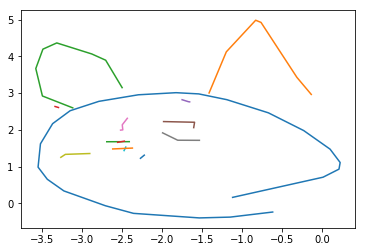

epoch 3101 in 0.175 s: loss = 0.1186, LR = 0.1012, LKL = 0.0174
epoch 3102 in 0.173 s: loss = 0.1340, LR = 0.1165, LKL = 0.0175
epoch 3103 in 0.174 s: loss = 0.0929, LR = 0.0754, LKL = 0.0174
epoch 3104 in 0.173 s: loss = 0.1338, LR = 0.1164, LKL = 0.0175
epoch 3105 in 0.173 s: loss = 0.0722, LR = 0.0547, LKL = 0.0175
epoch 3106 in 0.174 s: loss = 0.1434, LR = 0.1259, LKL = 0.0174
epoch 3107 in 0.174 s: loss = 0.1273, LR = 0.1099, LKL = 0.0174
epoch 3108 in 0.172 s: loss = 0.1090, LR = 0.0915, LKL = 0.0175
epoch 3109 in 0.173 s: loss = 0.1370, LR = 0.1194, LKL = 0.0176
epoch 3110 in 0.175 s: loss = 0.1287, LR = 0.1112, LKL = 0.0176
epoch 3111 in 0.174 s: loss = 0.1831, LR = 0.1657, LKL = 0.0173
epoch 3112 in 0.179 s: loss = 0.1441, LR = 0.1266, LKL = 0.0175
epoch 3113 in 0.177 s: loss = 0.1250, LR = 0.1075, LKL = 0.0175
epoch 3114 in 0.176 s: loss = 0.1458, LR = 0.1284, LKL = 0.0174
epoch 3115 in 0.176 s: loss = 0.1178, LR = 0.1004, LKL = 0.0174
epoch 3116 in 0.177 s: loss = 0.0792, LR

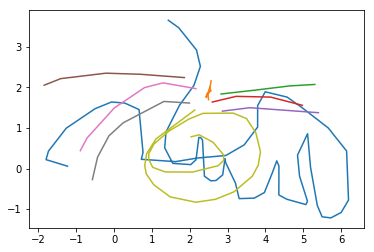

epoch 3201 in 0.175 s: loss = 0.0784, LR = 0.0610, LKL = 0.0174
epoch 3202 in 0.175 s: loss = 0.0963, LR = 0.0787, LKL = 0.0176
epoch 3203 in 0.174 s: loss = 0.0096, LR = -0.0080, LKL = 0.0176
epoch 3204 in 0.175 s: loss = 0.0877, LR = 0.0701, LKL = 0.0176
epoch 3205 in 0.173 s: loss = 0.1053, LR = 0.0878, LKL = 0.0175
epoch 3206 in 0.171 s: loss = 0.0847, LR = 0.0671, LKL = 0.0175
epoch 3207 in 0.174 s: loss = 0.1100, LR = 0.0926, LKL = 0.0174
epoch 3208 in 0.172 s: loss = 0.0210, LR = 0.0034, LKL = 0.0176
epoch 3209 in 0.177 s: loss = 0.1067, LR = 0.0892, LKL = 0.0175
epoch 3210 in 0.171 s: loss = 0.0893, LR = 0.0717, LKL = 0.0176
epoch 3211 in 0.171 s: loss = 0.0899, LR = 0.0724, LKL = 0.0175
epoch 3212 in 0.174 s: loss = 0.0996, LR = 0.0821, LKL = 0.0175
epoch 3213 in 0.174 s: loss = 0.1128, LR = 0.0953, LKL = 0.0175
epoch 3214 in 0.174 s: loss = 0.0451, LR = 0.0276, LKL = 0.0175
epoch 3215 in 0.173 s: loss = 0.1249, LR = 0.1073, LKL = 0.0176
epoch 3216 in 0.171 s: loss = 0.0931, L

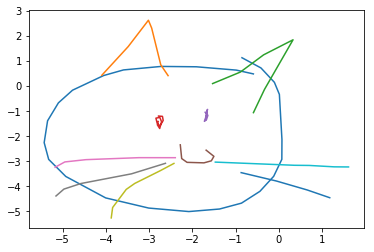

epoch 3301 in 0.177 s: loss = 0.0991, LR = 0.0815, LKL = 0.0175
epoch 3302 in 0.173 s: loss = 0.0602, LR = 0.0427, LKL = 0.0175
epoch 3303 in 0.175 s: loss = 0.0369, LR = 0.0195, LKL = 0.0174
epoch 3304 in 0.173 s: loss = 0.0591, LR = 0.0417, LKL = 0.0175
epoch 3305 in 0.176 s: loss = 0.0852, LR = 0.0677, LKL = 0.0175
epoch 3306 in 0.177 s: loss = 0.0837, LR = 0.0662, LKL = 0.0175
epoch 3307 in 0.179 s: loss = 0.0554, LR = 0.0378, LKL = 0.0176
epoch 3308 in 0.174 s: loss = 0.1006, LR = 0.0830, LKL = 0.0176
epoch 3309 in 0.176 s: loss = 0.0814, LR = 0.0640, LKL = 0.0175
epoch 3310 in 0.172 s: loss = 0.0853, LR = 0.0679, LKL = 0.0174
epoch 3311 in 0.175 s: loss = 0.0741, LR = 0.0566, LKL = 0.0175
epoch 3312 in 0.177 s: loss = 0.1312, LR = 0.1138, LKL = 0.0175
epoch 3313 in 0.179 s: loss = 0.1292, LR = 0.1118, LKL = 0.0175
epoch 3314 in 0.172 s: loss = 0.0698, LR = 0.0523, LKL = 0.0175
epoch 3315 in 0.178 s: loss = 0.0989, LR = 0.0814, LKL = 0.0175
epoch 3316 in 0.177 s: loss = 0.1044, LR

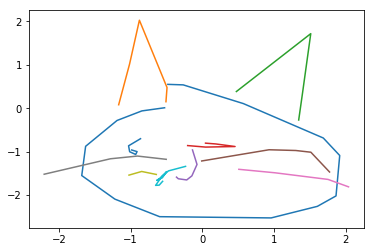

epoch 3401 in 0.177 s: loss = 0.0817, LR = 0.0641, LKL = 0.0175
epoch 3402 in 0.176 s: loss = 0.1136, LR = 0.0961, LKL = 0.0176
epoch 3403 in 0.178 s: loss = 0.1531, LR = 0.1356, LKL = 0.0175
epoch 3404 in 0.176 s: loss = 0.1688, LR = 0.1513, LKL = 0.0175
epoch 3405 in 0.181 s: loss = 0.1084, LR = 0.0909, LKL = 0.0175
epoch 3406 in 0.175 s: loss = 0.1034, LR = 0.0859, LKL = 0.0174
epoch 3407 in 0.176 s: loss = 0.0800, LR = 0.0624, LKL = 0.0176
epoch 3408 in 0.174 s: loss = 0.1183, LR = 0.1008, LKL = 0.0175
epoch 3409 in 0.173 s: loss = 0.0530, LR = 0.0355, LKL = 0.0175
epoch 3410 in 0.176 s: loss = 0.1034, LR = 0.0861, LKL = 0.0174
epoch 3411 in 0.177 s: loss = 0.1110, LR = 0.0935, LKL = 0.0175
epoch 3412 in 0.174 s: loss = 0.1335, LR = 0.1162, LKL = 0.0173
epoch 3413 in 0.176 s: loss = 0.1652, LR = 0.1478, LKL = 0.0175
epoch 3414 in 0.176 s: loss = 0.1509, LR = 0.1335, LKL = 0.0174
epoch 3415 in 0.179 s: loss = 0.1405, LR = 0.1232, LKL = 0.0174
epoch 3416 in 0.174 s: loss = 0.1408, LR

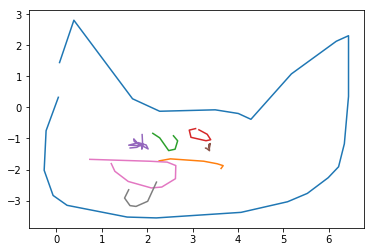

epoch 3501 in 0.176 s: loss = 0.0670, LR = 0.0492, LKL = 0.0178
epoch 3502 in 0.174 s: loss = 0.0377, LR = 0.0199, LKL = 0.0178
epoch 3503 in 0.175 s: loss = 0.0341, LR = 0.0163, LKL = 0.0178
epoch 3504 in 0.176 s: loss = 0.0836, LR = 0.0658, LKL = 0.0178
epoch 3505 in 0.182 s: loss = 0.1124, LR = 0.0946, LKL = 0.0178
epoch 3506 in 0.172 s: loss = 0.1015, LR = 0.0836, LKL = 0.0179
epoch 3507 in 0.175 s: loss = -0.0255, LR = -0.0435, LKL = 0.0180
epoch 3508 in 0.174 s: loss = 0.0866, LR = 0.0687, LKL = 0.0179
epoch 3509 in 0.173 s: loss = 0.0487, LR = 0.0309, LKL = 0.0179
epoch 3510 in 0.175 s: loss = 0.0534, LR = 0.0356, LKL = 0.0179
epoch 3511 in 0.175 s: loss = 0.0200, LR = 0.0021, LKL = 0.0179
epoch 3512 in 0.173 s: loss = 0.0947, LR = 0.0769, LKL = 0.0178
epoch 3513 in 0.175 s: loss = 0.1524, LR = 0.1346, LKL = 0.0179
epoch 3514 in 0.173 s: loss = 0.1382, LR = 0.1203, LKL = 0.0179
epoch 3515 in 0.181 s: loss = 0.0313, LR = 0.0133, LKL = 0.0181
epoch 3516 in 0.177 s: loss = 0.0682, 

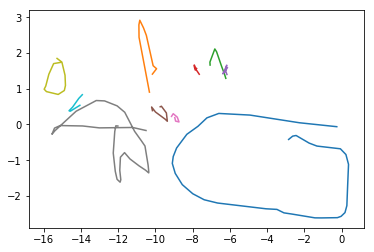

epoch 3601 in 0.179 s: loss = 0.1308, LR = 0.1128, LKL = 0.0180
epoch 3602 in 0.173 s: loss = 0.0990, LR = 0.0810, LKL = 0.0179
epoch 3603 in 0.173 s: loss = 0.0717, LR = 0.0538, LKL = 0.0179
epoch 3604 in 0.173 s: loss = 0.0638, LR = 0.0458, LKL = 0.0180
epoch 3605 in 0.175 s: loss = 0.1519, LR = 0.1338, LKL = 0.0181
epoch 3606 in 0.175 s: loss = 0.0916, LR = 0.0735, LKL = 0.0181
epoch 3607 in 0.175 s: loss = 0.1233, LR = 0.1053, LKL = 0.0180
epoch 3608 in 0.174 s: loss = 0.0634, LR = 0.0455, LKL = 0.0179
epoch 3609 in 0.176 s: loss = 0.0534, LR = 0.0354, LKL = 0.0180
epoch 3610 in 0.176 s: loss = 0.0942, LR = 0.0762, LKL = 0.0179
epoch 3611 in 0.177 s: loss = 0.0966, LR = 0.0786, LKL = 0.0180
epoch 3612 in 0.174 s: loss = 0.1196, LR = 0.1017, LKL = 0.0180
epoch 3613 in 0.174 s: loss = 0.1556, LR = 0.1377, LKL = 0.0180
epoch 3614 in 0.174 s: loss = 0.0932, LR = 0.0752, LKL = 0.0180
epoch 3615 in 0.180 s: loss = 0.1111, LR = 0.0930, LKL = 0.0181
epoch 3616 in 0.175 s: loss = 0.0235, LR

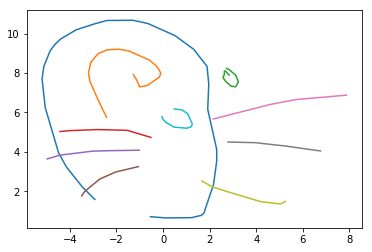

epoch 3701 in 0.174 s: loss = 0.0599, LR = 0.0419, LKL = 0.0180
epoch 3702 in 0.172 s: loss = 0.1174, LR = 0.0995, LKL = 0.0179
epoch 3703 in 0.171 s: loss = 0.0286, LR = 0.0106, LKL = 0.0179
epoch 3704 in 0.172 s: loss = 0.1731, LR = 0.1552, LKL = 0.0179
epoch 3705 in 0.173 s: loss = 0.1057, LR = 0.0877, LKL = 0.0180
epoch 3706 in 0.171 s: loss = 0.0110, LR = -0.0071, LKL = 0.0180
epoch 3707 in 0.176 s: loss = 0.0491, LR = 0.0313, LKL = 0.0179
epoch 3708 in 0.171 s: loss = 0.0962, LR = 0.0782, LKL = 0.0180
epoch 3709 in 0.171 s: loss = 0.0684, LR = 0.0505, LKL = 0.0179
epoch 3710 in 0.175 s: loss = 0.1278, LR = 0.1098, LKL = 0.0180
epoch 3711 in 0.176 s: loss = 0.1086, LR = 0.0906, LKL = 0.0180
epoch 3712 in 0.175 s: loss = 0.0377, LR = 0.0197, LKL = 0.0180
epoch 3713 in 0.176 s: loss = 0.0801, LR = 0.0621, LKL = 0.0180
epoch 3714 in 0.176 s: loss = 0.0866, LR = 0.0686, LKL = 0.0180
epoch 3715 in 0.177 s: loss = 0.1107, LR = 0.0926, LKL = 0.0180
epoch 3716 in 0.173 s: loss = 0.0101, L

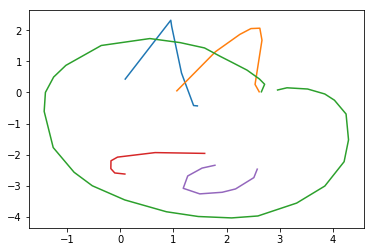

epoch 3801 in 0.180 s: loss = 0.0350, LR = 0.0167, LKL = 0.0184
epoch 3802 in 0.172 s: loss = 0.1028, LR = 0.0844, LKL = 0.0184
epoch 3803 in 0.176 s: loss = 0.0726, LR = 0.0542, LKL = 0.0184
epoch 3804 in 0.178 s: loss = 0.1210, LR = 0.1026, LKL = 0.0184
epoch 3805 in 0.177 s: loss = 0.0727, LR = 0.0543, LKL = 0.0184
epoch 3806 in 0.174 s: loss = 0.0949, LR = 0.0766, LKL = 0.0183
epoch 3807 in 0.173 s: loss = 0.1478, LR = 0.1294, LKL = 0.0184
epoch 3808 in 0.172 s: loss = 0.1037, LR = 0.0855, LKL = 0.0182
epoch 3809 in 0.176 s: loss = 0.0994, LR = 0.0811, LKL = 0.0184
epoch 3810 in 0.175 s: loss = 0.0947, LR = 0.0764, LKL = 0.0183
epoch 3811 in 0.177 s: loss = 0.1137, LR = 0.0954, LKL = 0.0183
epoch 3812 in 0.173 s: loss = 0.0927, LR = 0.0744, LKL = 0.0183
epoch 3813 in 0.175 s: loss = 0.0673, LR = 0.0490, LKL = 0.0183
epoch 3814 in 0.175 s: loss = 0.0663, LR = 0.0479, LKL = 0.0184
epoch 3815 in 0.176 s: loss = 0.0735, LR = 0.0552, LKL = 0.0183
epoch 3816 in 0.176 s: loss = 0.0606, LR

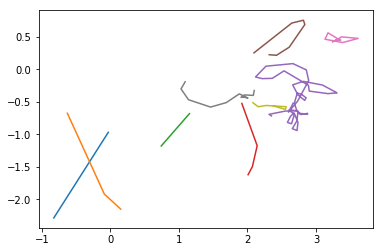

epoch 3901 in 0.176 s: loss = 0.0998, LR = 0.0816, LKL = 0.0182
epoch 3902 in 0.175 s: loss = 0.0888, LR = 0.0705, LKL = 0.0183
epoch 3903 in 0.171 s: loss = 0.1368, LR = 0.1186, LKL = 0.0182
epoch 3904 in 0.174 s: loss = 0.0312, LR = 0.0130, LKL = 0.0182
epoch 3905 in 0.172 s: loss = 0.1104, LR = 0.0923, LKL = 0.0181
epoch 3906 in 0.173 s: loss = 0.0474, LR = 0.0293, LKL = 0.0181
epoch 3907 in 0.173 s: loss = 0.0482, LR = 0.0300, LKL = 0.0182
epoch 3908 in 0.172 s: loss = 0.0935, LR = 0.0755, LKL = 0.0180
epoch 3909 in 0.174 s: loss = 0.1183, LR = 0.1002, LKL = 0.0181
epoch 3910 in 0.174 s: loss = 0.0602, LR = 0.0421, LKL = 0.0181
epoch 3911 in 0.173 s: loss = 0.1414, LR = 0.1233, LKL = 0.0181
epoch 3912 in 0.175 s: loss = 0.0772, LR = 0.0592, LKL = 0.0181
epoch 3913 in 0.175 s: loss = 0.0557, LR = 0.0377, LKL = 0.0180
epoch 3914 in 0.177 s: loss = 0.0008, LR = -0.0173, LKL = 0.0181
epoch 3915 in 0.174 s: loss = 0.0518, LR = 0.0338, LKL = 0.0180
epoch 3916 in 0.174 s: loss = 0.1071, L

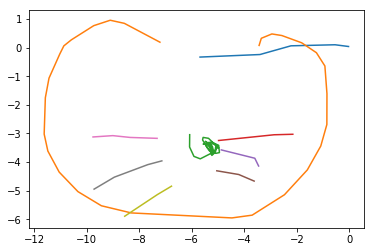

epoch 4001 in 0.174 s: loss = 0.0780, LR = 0.0595, LKL = 0.0185
epoch 4002 in 0.170 s: loss = 0.0138, LR = -0.0047, LKL = 0.0185
epoch 4003 in 0.171 s: loss = 0.0504, LR = 0.0318, LKL = 0.0186
epoch 4004 in 0.169 s: loss = 0.0380, LR = 0.0194, LKL = 0.0186
epoch 4005 in 0.169 s: loss = 0.0505, LR = 0.0319, LKL = 0.0186
epoch 4006 in 0.169 s: loss = 0.0152, LR = -0.0033, LKL = 0.0185
epoch 4007 in 0.170 s: loss = 0.0510, LR = 0.0324, LKL = 0.0186
epoch 4008 in 0.172 s: loss = 0.0732, LR = 0.0545, LKL = 0.0186
epoch 4009 in 0.172 s: loss = 0.0731, LR = 0.0546, LKL = 0.0185
epoch 4010 in 0.172 s: loss = 0.0920, LR = 0.0735, LKL = 0.0186
epoch 4011 in 0.173 s: loss = 0.0518, LR = 0.0333, LKL = 0.0185
epoch 4012 in 0.173 s: loss = 0.0093, LR = -0.0093, LKL = 0.0186
epoch 4013 in 0.175 s: loss = 0.0038, LR = -0.0148, LKL = 0.0185
epoch 4014 in 0.173 s: loss = 0.0484, LR = 0.0299, LKL = 0.0185
epoch 4015 in 0.173 s: loss = 0.0245, LR = 0.0060, LKL = 0.0185
epoch 4016 in 0.174 s: loss = 0.0520

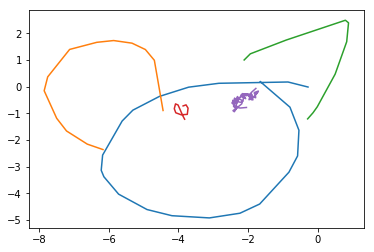

epoch 4101 in 0.176 s: loss = 0.0318, LR = 0.0129, LKL = 0.0189
epoch 4102 in 0.173 s: loss = 0.0234, LR = 0.0046, LKL = 0.0188
epoch 4103 in 0.173 s: loss = 0.0383, LR = 0.0196, LKL = 0.0188
epoch 4104 in 0.172 s: loss = 0.0533, LR = 0.0346, LKL = 0.0187
epoch 4105 in 0.171 s: loss = 0.1479, LR = 0.1292, LKL = 0.0187
epoch 4106 in 0.172 s: loss = 0.0359, LR = 0.0171, LKL = 0.0188
epoch 4107 in 0.172 s: loss = 0.0592, LR = 0.0405, LKL = 0.0187
epoch 4108 in 0.174 s: loss = 0.0135, LR = -0.0053, LKL = 0.0188
epoch 4109 in 0.172 s: loss = -0.0105, LR = -0.0293, LKL = 0.0189
epoch 4110 in 0.173 s: loss = 0.0280, LR = 0.0091, LKL = 0.0189
epoch 4111 in 0.174 s: loss = -0.0318, LR = -0.0506, LKL = 0.0188
epoch 4112 in 0.173 s: loss = -0.0057, LR = -0.0245, LKL = 0.0188
epoch 4113 in 0.175 s: loss = -0.0348, LR = -0.0536, LKL = 0.0189
epoch 4114 in 0.173 s: loss = 0.0497, LR = 0.0308, LKL = 0.0188
epoch 4115 in 0.173 s: loss = -0.0076, LR = -0.0265, LKL = 0.0189
epoch 4116 in 0.174 s: loss =

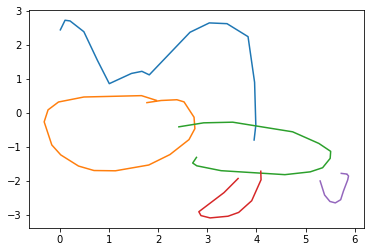

epoch 4201 in 0.177 s: loss = 0.0156, LR = -0.0033, LKL = 0.0189
epoch 4202 in 0.173 s: loss = 0.0774, LR = 0.0586, LKL = 0.0188
epoch 4203 in 0.172 s: loss = 0.0782, LR = 0.0594, LKL = 0.0188
epoch 4204 in 0.173 s: loss = 0.0906, LR = 0.0717, LKL = 0.0189
epoch 4205 in 0.174 s: loss = 0.0753, LR = 0.0564, LKL = 0.0189
epoch 4206 in 0.172 s: loss = 0.0394, LR = 0.0206, LKL = 0.0188
epoch 4207 in 0.176 s: loss = 0.0392, LR = 0.0202, LKL = 0.0190
epoch 4208 in 0.177 s: loss = 0.0675, LR = 0.0487, LKL = 0.0188
epoch 4209 in 0.174 s: loss = 0.0208, LR = 0.0020, LKL = 0.0189
epoch 4210 in 0.176 s: loss = 0.0850, LR = 0.0662, LKL = 0.0188
epoch 4211 in 0.176 s: loss = 0.0696, LR = 0.0508, LKL = 0.0188
epoch 4212 in 0.173 s: loss = -0.0092, LR = -0.0280, LKL = 0.0189
epoch 4213 in 0.173 s: loss = 0.0488, LR = 0.0298, LKL = 0.0189
epoch 4214 in 0.175 s: loss = 0.0788, LR = 0.0601, LKL = 0.0187
epoch 4215 in 0.178 s: loss = 0.0306, LR = 0.0116, LKL = 0.0190
epoch 4216 in 0.174 s: loss = 0.0608,

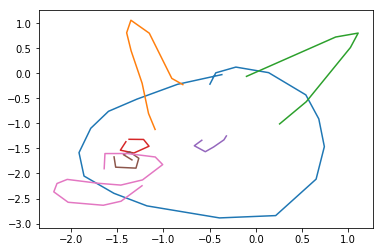

epoch 4301 in 0.173 s: loss = 0.0146, LR = -0.0044, LKL = 0.0190
epoch 4302 in 0.177 s: loss = 0.0875, LR = 0.0687, LKL = 0.0189
epoch 4303 in 0.175 s: loss = 0.1052, LR = 0.0863, LKL = 0.0189
epoch 4304 in 0.176 s: loss = 0.0877, LR = 0.0688, LKL = 0.0189
epoch 4305 in 0.177 s: loss = 0.0780, LR = 0.0591, LKL = 0.0190
epoch 4306 in 0.174 s: loss = 0.1266, LR = 0.1078, LKL = 0.0188
epoch 4307 in 0.175 s: loss = 0.0090, LR = -0.0100, LKL = 0.0190
epoch 4308 in 0.176 s: loss = 0.0162, LR = -0.0028, LKL = 0.0190
epoch 4309 in 0.175 s: loss = 0.0727, LR = 0.0538, LKL = 0.0189
epoch 4310 in 0.178 s: loss = 0.0583, LR = 0.0395, LKL = 0.0189
epoch 4311 in 0.175 s: loss = 0.0662, LR = 0.0474, LKL = 0.0188
epoch 4312 in 0.178 s: loss = 0.0461, LR = 0.0273, LKL = 0.0188
epoch 4313 in 0.175 s: loss = 0.0503, LR = 0.0314, LKL = 0.0189
epoch 4314 in 0.178 s: loss = 0.0672, LR = 0.0485, LKL = 0.0188
epoch 4315 in 0.182 s: loss = 0.0490, LR = 0.0302, LKL = 0.0188
epoch 4316 in 0.177 s: loss = 0.1613,

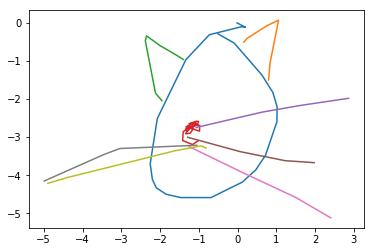

epoch 4401 in 0.175 s: loss = 0.0107, LR = -0.0079, LKL = 0.0186
epoch 4402 in 0.172 s: loss = 0.0445, LR = 0.0258, LKL = 0.0187
epoch 4403 in 0.171 s: loss = 0.1348, LR = 0.1163, LKL = 0.0185
epoch 4404 in 0.172 s: loss = 0.0368, LR = 0.0182, LKL = 0.0186
epoch 4405 in 0.167 s: loss = 0.0909, LR = 0.0723, LKL = 0.0186
epoch 4406 in 0.175 s: loss = 0.0763, LR = 0.0576, LKL = 0.0187
epoch 4407 in 0.174 s: loss = 0.1082, LR = 0.0895, LKL = 0.0187
epoch 4408 in 0.171 s: loss = 0.0895, LR = 0.0708, LKL = 0.0187
epoch 4409 in 0.172 s: loss = 0.0492, LR = 0.0304, LKL = 0.0188
epoch 4410 in 0.170 s: loss = 0.0044, LR = -0.0145, LKL = 0.0189
epoch 4411 in 0.173 s: loss = 0.0642, LR = 0.0455, LKL = 0.0188
epoch 4412 in 0.172 s: loss = 0.0370, LR = 0.0181, LKL = 0.0189
epoch 4413 in 0.172 s: loss = 0.1168, LR = 0.0981, LKL = 0.0187
epoch 4414 in 0.173 s: loss = 0.0688, LR = 0.0501, LKL = 0.0188
epoch 4415 in 0.173 s: loss = 0.0018, LR = -0.0171, LKL = 0.0189
epoch 4416 in 0.172 s: loss = 0.0279,

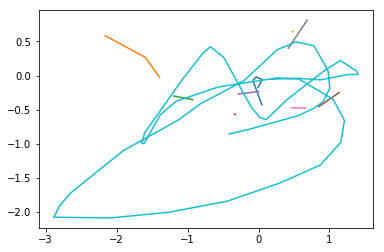

epoch 4501 in 0.176 s: loss = 0.0734, LR = 0.0544, LKL = 0.0190
epoch 4502 in 0.173 s: loss = 0.0539, LR = 0.0348, LKL = 0.0191
epoch 4503 in 0.172 s: loss = -0.0091, LR = -0.0284, LKL = 0.0193
epoch 4504 in 0.173 s: loss = 0.0252, LR = 0.0061, LKL = 0.0191
epoch 4505 in 0.173 s: loss = -0.0053, LR = -0.0245, LKL = 0.0192
epoch 4506 in 0.172 s: loss = -0.0007, LR = -0.0199, LKL = 0.0192
epoch 4507 in 0.180 s: loss = 0.0040, LR = -0.0151, LKL = 0.0191
epoch 4508 in 0.177 s: loss = 0.0506, LR = 0.0315, LKL = 0.0191
epoch 4509 in 0.176 s: loss = 0.0778, LR = 0.0587, LKL = 0.0190
epoch 4510 in 0.170 s: loss = 0.0683, LR = 0.0491, LKL = 0.0192
epoch 4511 in 0.172 s: loss = 0.0872, LR = 0.0679, LKL = 0.0192
epoch 4512 in 0.174 s: loss = 0.0234, LR = 0.0042, LKL = 0.0193
epoch 4513 in 0.174 s: loss = 0.0453, LR = 0.0262, LKL = 0.0192
epoch 4514 in 0.174 s: loss = 0.0818, LR = 0.0627, LKL = 0.0191
epoch 4515 in 0.171 s: loss = 0.0602, LR = 0.0411, LKL = 0.0191
epoch 4516 in 0.173 s: loss = 0.0

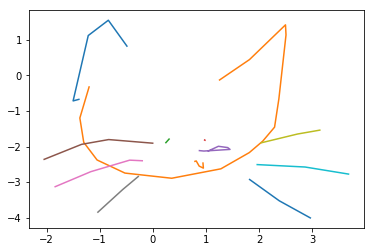

epoch 4601 in 0.177 s: loss = 0.0032, LR = -0.0161, LKL = 0.0193
epoch 4602 in 0.173 s: loss = 0.0776, LR = 0.0584, LKL = 0.0192
epoch 4603 in 0.174 s: loss = 0.0725, LR = 0.0533, LKL = 0.0192
epoch 4604 in 0.174 s: loss = 0.0884, LR = 0.0691, LKL = 0.0193
epoch 4605 in 0.178 s: loss = 0.0234, LR = 0.0041, LKL = 0.0192
epoch 4606 in 0.167 s: loss = 0.0510, LR = 0.0318, LKL = 0.0193
epoch 4607 in 0.180 s: loss = 0.0299, LR = 0.0108, LKL = 0.0192
epoch 4608 in 0.173 s: loss = -0.0016, LR = -0.0208, LKL = 0.0192
epoch 4609 in 0.175 s: loss = 0.0137, LR = -0.0056, LKL = 0.0192
epoch 4610 in 0.181 s: loss = 0.0245, LR = 0.0053, LKL = 0.0192
epoch 4611 in 0.179 s: loss = 0.0148, LR = -0.0045, LKL = 0.0193
epoch 4612 in 0.175 s: loss = -0.0246, LR = -0.0438, LKL = 0.0191
epoch 4613 in 0.180 s: loss = 0.0998, LR = 0.0809, LKL = 0.0190
epoch 4614 in 0.176 s: loss = 0.0409, LR = 0.0218, LKL = 0.0191
epoch 4615 in 0.177 s: loss = 0.0119, LR = -0.0073, LKL = 0.0192
epoch 4616 in 0.172 s: loss = 0.

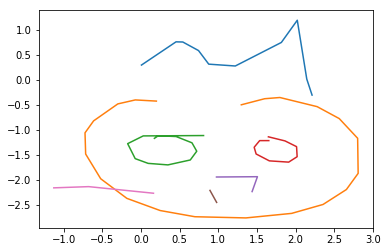

epoch 4701 in 0.177 s: loss = 0.0062, LR = -0.0132, LKL = 0.0194
epoch 4702 in 0.174 s: loss = 0.0133, LR = -0.0061, LKL = 0.0194
epoch 4703 in 0.177 s: loss = 0.0217, LR = 0.0022, LKL = 0.0194
epoch 4704 in 0.176 s: loss = 0.0298, LR = 0.0105, LKL = 0.0193
epoch 4705 in 0.180 s: loss = -0.0426, LR = -0.0621, LKL = 0.0195
epoch 4706 in 0.168 s: loss = 0.0434, LR = 0.0241, LKL = 0.0194
epoch 4707 in 0.175 s: loss = -0.0046, LR = -0.0240, LKL = 0.0194
epoch 4708 in 0.175 s: loss = 0.0050, LR = -0.0145, LKL = 0.0195
epoch 4709 in 0.179 s: loss = -0.0160, LR = -0.0355, LKL = 0.0194
epoch 4710 in 0.176 s: loss = 0.0304, LR = 0.0110, LKL = 0.0195
epoch 4711 in 0.178 s: loss = -0.0061, LR = -0.0255, LKL = 0.0194
epoch 4712 in 0.173 s: loss = 0.0655, LR = 0.0462, LKL = 0.0194
epoch 4713 in 0.179 s: loss = -0.0536, LR = -0.0732, LKL = 0.0196
epoch 4714 in 0.175 s: loss = -0.0300, LR = -0.0496, LKL = 0.0196
epoch 4715 in 0.180 s: loss = 0.0593, LR = 0.0398, LKL = 0.0194
epoch 4716 in 0.177 s: lo

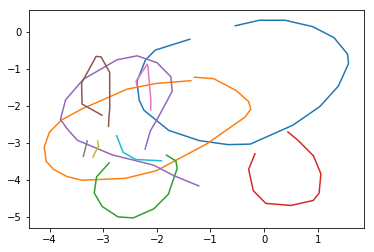

epoch 4801 in 0.173 s: loss = 0.0221, LR = 0.0027, LKL = 0.0194
epoch 4802 in 0.174 s: loss = 0.0017, LR = -0.0178, LKL = 0.0195
epoch 4803 in 0.176 s: loss = -0.0118, LR = -0.0312, LKL = 0.0194
epoch 4804 in 0.174 s: loss = 0.0272, LR = 0.0078, LKL = 0.0195
epoch 4805 in 0.173 s: loss = 0.0157, LR = -0.0038, LKL = 0.0194
epoch 4806 in 0.171 s: loss = -0.0011, LR = -0.0204, LKL = 0.0194
epoch 4807 in 0.174 s: loss = 0.0523, LR = 0.0330, LKL = 0.0193
epoch 4808 in 0.175 s: loss = -0.0118, LR = -0.0312, LKL = 0.0194
epoch 4809 in 0.176 s: loss = 0.0082, LR = -0.0112, LKL = 0.0194
epoch 4810 in 0.170 s: loss = -0.0184, LR = -0.0378, LKL = 0.0194
epoch 4811 in 0.174 s: loss = 0.0025, LR = -0.0172, LKL = 0.0197
epoch 4812 in 0.174 s: loss = 0.0490, LR = 0.0296, LKL = 0.0194
epoch 4813 in 0.173 s: loss = 0.0060, LR = -0.0134, LKL = 0.0195
epoch 4814 in 0.174 s: loss = 0.0170, LR = -0.0024, LKL = 0.0194
epoch 4815 in 0.174 s: loss = -0.0008, LR = -0.0202, LKL = 0.0194
epoch 4816 in 0.173 s: l

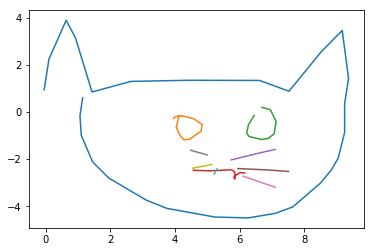

epoch 4901 in 0.174 s: loss = -0.0102, LR = -0.0300, LKL = 0.0198
epoch 4902 in 0.174 s: loss = 0.0084, LR = -0.0114, LKL = 0.0197
epoch 4903 in 0.175 s: loss = 0.0101, LR = -0.0096, LKL = 0.0197
epoch 4904 in 0.173 s: loss = -0.0182, LR = -0.0378, LKL = 0.0197
epoch 4905 in 0.174 s: loss = -0.0039, LR = -0.0236, LKL = 0.0196
epoch 4906 in 0.176 s: loss = 0.0002, LR = -0.0195, LKL = 0.0196
epoch 4907 in 0.171 s: loss = 0.0649, LR = 0.0452, LKL = 0.0197
epoch 4908 in 0.176 s: loss = -0.0421, LR = -0.0617, LKL = 0.0196
epoch 4909 in 0.172 s: loss = -0.0028, LR = -0.0225, LKL = 0.0197
epoch 4910 in 0.175 s: loss = 0.0726, LR = 0.0529, LKL = 0.0197
epoch 4911 in 0.175 s: loss = 0.0438, LR = 0.0242, LKL = 0.0197
epoch 4912 in 0.175 s: loss = 0.0084, LR = -0.0112, LKL = 0.0196
epoch 4913 in 0.179 s: loss = 0.0100, LR = -0.0097, LKL = 0.0197
epoch 4914 in 0.173 s: loss = 0.0644, LR = 0.0448, LKL = 0.0196
epoch 4915 in 0.173 s: loss = 0.0264, LR = 0.0068, LKL = 0.0196
epoch 4916 in 0.174 s: lo

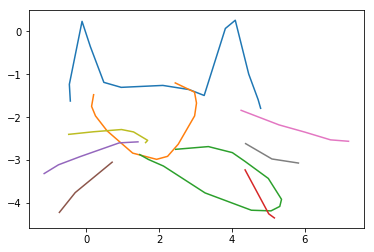

epoch 5001 in 0.174 s: loss = 0.0230, LR = 0.0036, LKL = 0.0194
epoch 5002 in 0.173 s: loss = 0.0377, LR = 0.0184, LKL = 0.0193
epoch 5003 in 0.173 s: loss = 0.0460, LR = 0.0266, LKL = 0.0194
epoch 5004 in 0.175 s: loss = 0.0517, LR = 0.0324, LKL = 0.0193
epoch 5005 in 0.176 s: loss = 0.0621, LR = 0.0427, LKL = 0.0194
epoch 5006 in 0.172 s: loss = 0.0264, LR = 0.0069, LKL = 0.0195
epoch 5007 in 0.177 s: loss = 0.0815, LR = 0.0622, LKL = 0.0194
epoch 5008 in 0.177 s: loss = 0.0465, LR = 0.0272, LKL = 0.0193
epoch 5009 in 0.180 s: loss = 0.0442, LR = 0.0248, LKL = 0.0194
epoch 5010 in 0.175 s: loss = 0.0415, LR = 0.0221, LKL = 0.0194
epoch 5011 in 0.172 s: loss = 0.0255, LR = 0.0062, LKL = 0.0193
epoch 5012 in 0.174 s: loss = 0.0838, LR = 0.0644, LKL = 0.0194
epoch 5013 in 0.172 s: loss = 0.0449, LR = 0.0255, LKL = 0.0194
epoch 5014 in 0.174 s: loss = 0.0105, LR = -0.0087, LKL = 0.0193
epoch 5015 in 0.173 s: loss = 0.0301, LR = 0.0107, LKL = 0.0193
epoch 5016 in 0.169 s: loss = 0.0948, L

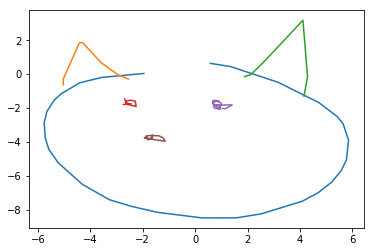

epoch 5101 in 0.177 s: loss = 0.0175, LR = -0.0020, LKL = 0.0195
epoch 5102 in 0.180 s: loss = 0.0818, LR = 0.0624, LKL = 0.0193
epoch 5103 in 0.176 s: loss = 0.0542, LR = 0.0348, LKL = 0.0194
epoch 5104 in 0.175 s: loss = 0.0201, LR = 0.0005, LKL = 0.0195
epoch 5105 in 0.173 s: loss = -0.0275, LR = -0.0470, LKL = 0.0195
epoch 5106 in 0.173 s: loss = -0.0340, LR = -0.0536, LKL = 0.0196
epoch 5107 in 0.174 s: loss = -0.0035, LR = -0.0230, LKL = 0.0195
epoch 5108 in 0.174 s: loss = -0.0093, LR = -0.0287, LKL = 0.0194
epoch 5109 in 0.171 s: loss = -0.0031, LR = -0.0226, LKL = 0.0195
epoch 5110 in 0.177 s: loss = 0.0100, LR = -0.0096, LKL = 0.0196
epoch 5111 in 0.178 s: loss = 0.0108, LR = -0.0086, LKL = 0.0194
epoch 5112 in 0.176 s: loss = 0.0234, LR = 0.0039, LKL = 0.0195
epoch 5113 in 0.179 s: loss = 0.0452, LR = 0.0258, LKL = 0.0194
epoch 5114 in 0.175 s: loss = -0.0337, LR = -0.0531, LKL = 0.0195
epoch 5115 in 0.177 s: loss = -0.0078, LR = -0.0274, LKL = 0.0195
epoch 5116 in 0.176 s: 

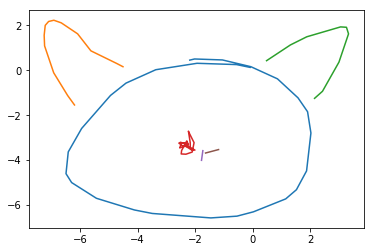

epoch 5201 in 0.172 s: loss = 0.0377, LR = 0.0179, LKL = 0.0198
epoch 5202 in 0.174 s: loss = 0.0098, LR = -0.0099, LKL = 0.0197
epoch 5203 in 0.173 s: loss = 0.0219, LR = 0.0021, LKL = 0.0198
epoch 5204 in 0.177 s: loss = 0.0064, LR = -0.0133, LKL = 0.0197
epoch 5205 in 0.175 s: loss = 0.0211, LR = 0.0013, LKL = 0.0198
epoch 5206 in 0.172 s: loss = -0.0053, LR = -0.0250, LKL = 0.0198
epoch 5207 in 0.174 s: loss = 0.0714, LR = 0.0517, LKL = 0.0198
epoch 5208 in 0.176 s: loss = 0.0075, LR = -0.0123, LKL = 0.0198
epoch 5209 in 0.176 s: loss = 0.0079, LR = -0.0119, LKL = 0.0198
epoch 5210 in 0.177 s: loss = 0.0412, LR = 0.0215, LKL = 0.0197
epoch 5211 in 0.174 s: loss = -0.0037, LR = -0.0233, LKL = 0.0196
epoch 5212 in 0.172 s: loss = 0.0528, LR = 0.0330, LKL = 0.0198
epoch 5213 in 0.175 s: loss = -0.0005, LR = -0.0203, LKL = 0.0197
epoch 5214 in 0.175 s: loss = -0.0300, LR = -0.0498, LKL = 0.0199
epoch 5215 in 0.170 s: loss = -0.0073, LR = -0.0271, LKL = 0.0198
epoch 5216 in 0.173 s: los

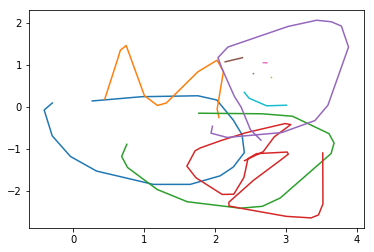

epoch 5301 in 0.173 s: loss = 0.0070, LR = -0.0128, LKL = 0.0199
epoch 5302 in 0.172 s: loss = 0.0033, LR = -0.0166, LKL = 0.0200
epoch 5303 in 0.171 s: loss = 0.0062, LR = -0.0137, LKL = 0.0199
epoch 5304 in 0.173 s: loss = -0.0452, LR = -0.0653, LKL = 0.0200
epoch 5305 in 0.172 s: loss = -0.0457, LR = -0.0656, LKL = 0.0200
epoch 5306 in 0.172 s: loss = -0.0483, LR = -0.0683, LKL = 0.0200
epoch 5307 in 0.172 s: loss = -0.1064, LR = -0.1265, LKL = 0.0201
epoch 5308 in 0.170 s: loss = -0.0210, LR = -0.0411, LKL = 0.0201
epoch 5309 in 0.172 s: loss = -0.0430, LR = -0.0630, LKL = 0.0200
epoch 5310 in 0.171 s: loss = -0.0227, LR = -0.0427, LKL = 0.0200
epoch 5311 in 0.173 s: loss = -0.0146, LR = -0.0346, LKL = 0.0200
epoch 5312 in 0.174 s: loss = 0.0444, LR = 0.0245, LKL = 0.0198
epoch 5313 in 0.174 s: loss = 0.0520, LR = 0.0320, LKL = 0.0200
epoch 5314 in 0.177 s: loss = 0.0296, LR = 0.0096, LKL = 0.0201
epoch 5315 in 0.176 s: loss = 0.0651, LR = 0.0451, LKL = 0.0200
epoch 5316 in 0.174 s

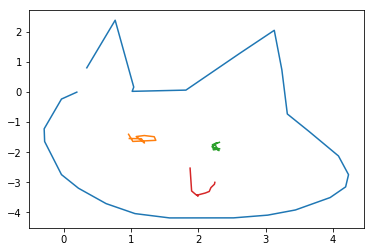

epoch 5401 in 0.176 s: loss = 0.0122, LR = -0.0080, LKL = 0.0202
epoch 5402 in 0.175 s: loss = 0.0840, LR = 0.0638, LKL = 0.0201
epoch 5403 in 0.176 s: loss = 0.0304, LR = 0.0103, LKL = 0.0200
epoch 5404 in 0.177 s: loss = 0.0205, LR = 0.0004, LKL = 0.0201
epoch 5405 in 0.176 s: loss = 0.0182, LR = -0.0019, LKL = 0.0201
epoch 5406 in 0.175 s: loss = 0.0387, LR = 0.0186, LKL = 0.0201
epoch 5407 in 0.173 s: loss = -0.0021, LR = -0.0223, LKL = 0.0203
epoch 5408 in 0.175 s: loss = 0.0792, LR = 0.0591, LKL = 0.0201
epoch 5409 in 0.176 s: loss = 0.0184, LR = -0.0016, LKL = 0.0200
epoch 5410 in 0.174 s: loss = 0.0106, LR = -0.0095, LKL = 0.0201
epoch 5411 in 0.173 s: loss = 0.0642, LR = 0.0441, LKL = 0.0201
epoch 5412 in 0.174 s: loss = 0.0122, LR = -0.0079, LKL = 0.0201
epoch 5413 in 0.173 s: loss = 0.0452, LR = 0.0250, LKL = 0.0202
epoch 5414 in 0.175 s: loss = 0.0206, LR = 0.0004, LKL = 0.0201
epoch 5415 in 0.172 s: loss = 0.0018, LR = -0.0183, LKL = 0.0201
epoch 5416 in 0.173 s: loss = 0.

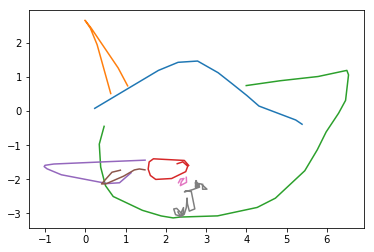

epoch 5501 in 0.174 s: loss = -0.0134, LR = -0.0333, LKL = 0.0200
epoch 5502 in 0.179 s: loss = 0.0623, LR = 0.0424, LKL = 0.0199
epoch 5503 in 0.172 s: loss = 0.0430, LR = 0.0230, LKL = 0.0200
epoch 5504 in 0.170 s: loss = -0.0307, LR = -0.0507, LKL = 0.0200
epoch 5505 in 0.175 s: loss = -0.0164, LR = -0.0364, LKL = 0.0200
epoch 5506 in 0.177 s: loss = -0.0383, LR = -0.0584, LKL = 0.0201
epoch 5507 in 0.177 s: loss = -0.0496, LR = -0.0698, LKL = 0.0202
epoch 5508 in 0.171 s: loss = -0.0415, LR = -0.0615, LKL = 0.0201
epoch 5509 in 0.174 s: loss = 0.0309, LR = 0.0109, LKL = 0.0200
epoch 5510 in 0.176 s: loss = 0.0049, LR = -0.0152, LKL = 0.0201
epoch 5511 in 0.175 s: loss = -0.0352, LR = -0.0553, LKL = 0.0201
epoch 5512 in 0.179 s: loss = 0.0096, LR = -0.0104, LKL = 0.0200
epoch 5513 in 0.176 s: loss = 0.0359, LR = 0.0160, LKL = 0.0200
epoch 5514 in 0.172 s: loss = -0.0366, LR = -0.0568, LKL = 0.0202
epoch 5515 in 0.174 s: loss = 0.0024, LR = -0.0177, LKL = 0.0201
epoch 5516 in 0.176 s

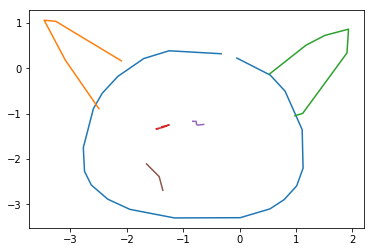

epoch 5601 in 0.175 s: loss = -0.0172, LR = -0.0373, LKL = 0.0200
epoch 5602 in 0.172 s: loss = 0.0582, LR = 0.0382, LKL = 0.0201
epoch 5603 in 0.172 s: loss = 0.0307, LR = 0.0109, LKL = 0.0198
epoch 5604 in 0.172 s: loss = -0.0014, LR = -0.0215, LKL = 0.0201
epoch 5605 in 0.173 s: loss = 0.0220, LR = 0.0020, LKL = 0.0199
epoch 5606 in 0.173 s: loss = -0.0349, LR = -0.0549, LKL = 0.0200
epoch 5607 in 0.173 s: loss = 0.0461, LR = 0.0260, LKL = 0.0200
epoch 5608 in 0.173 s: loss = 0.0327, LR = 0.0128, LKL = 0.0199
epoch 5609 in 0.175 s: loss = 0.0320, LR = 0.0122, LKL = 0.0197
epoch 5610 in 0.175 s: loss = 0.0362, LR = 0.0163, LKL = 0.0199
epoch 5611 in 0.173 s: loss = 0.0539, LR = 0.0340, LKL = 0.0199
epoch 5612 in 0.169 s: loss = 0.0769, LR = 0.0569, LKL = 0.0200
epoch 5613 in 0.176 s: loss = -0.0519, LR = -0.0719, LKL = 0.0200
epoch 5614 in 0.173 s: loss = -0.0077, LR = -0.0278, LKL = 0.0201
epoch 5615 in 0.175 s: loss = 0.0477, LR = 0.0276, LKL = 0.0201
epoch 5616 in 0.179 s: loss = 

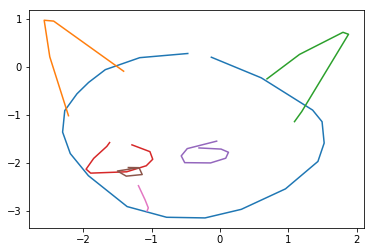

epoch 5701 in 0.177 s: loss = -0.0107, LR = -0.0311, LKL = 0.0204
epoch 5702 in 0.171 s: loss = -0.0167, LR = -0.0371, LKL = 0.0204
epoch 5703 in 0.171 s: loss = 0.0647, LR = 0.0443, LKL = 0.0205
epoch 5704 in 0.171 s: loss = -0.0265, LR = -0.0469, LKL = 0.0204
epoch 5705 in 0.173 s: loss = -0.0416, LR = -0.0620, LKL = 0.0204
epoch 5706 in 0.172 s: loss = 0.0463, LR = 0.0260, LKL = 0.0204
epoch 5707 in 0.170 s: loss = -0.0427, LR = -0.0632, LKL = 0.0206
epoch 5708 in 0.171 s: loss = -0.0283, LR = -0.0487, LKL = 0.0204
epoch 5709 in 0.170 s: loss = -0.0483, LR = -0.0687, LKL = 0.0204
epoch 5710 in 0.173 s: loss = 0.0101, LR = -0.0103, LKL = 0.0204
epoch 5711 in 0.173 s: loss = 0.0089, LR = -0.0115, LKL = 0.0204
epoch 5712 in 0.170 s: loss = -0.0570, LR = -0.0775, LKL = 0.0205
epoch 5713 in 0.170 s: loss = -0.0016, LR = -0.0219, LKL = 0.0203
epoch 5714 in 0.172 s: loss = -0.0268, LR = -0.0472, LKL = 0.0204
epoch 5715 in 0.173 s: loss = -0.0272, LR = -0.0477, LKL = 0.0205
epoch 5716 in 0.

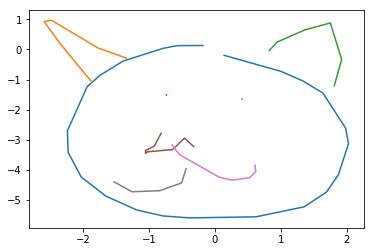

epoch 5801 in 0.176 s: loss = -0.0113, LR = -0.0317, LKL = 0.0204
epoch 5802 in 0.175 s: loss = 0.0080, LR = -0.0125, LKL = 0.0204
epoch 5803 in 0.172 s: loss = -0.0600, LR = -0.0804, LKL = 0.0204
epoch 5804 in 0.173 s: loss = -0.0606, LR = -0.0811, LKL = 0.0204
epoch 5805 in 0.177 s: loss = -0.0115, LR = -0.0318, LKL = 0.0203
epoch 5806 in 0.176 s: loss = 0.0265, LR = 0.0063, LKL = 0.0202
epoch 5807 in 0.179 s: loss = -0.0235, LR = -0.0440, LKL = 0.0204
epoch 5808 in 0.175 s: loss = -0.0002, LR = -0.0206, LKL = 0.0204
epoch 5809 in 0.179 s: loss = 0.0075, LR = -0.0128, LKL = 0.0203
epoch 5810 in 0.176 s: loss = 0.0115, LR = -0.0088, LKL = 0.0203
epoch 5811 in 0.175 s: loss = 0.0265, LR = 0.0061, LKL = 0.0205
epoch 5812 in 0.174 s: loss = -0.0289, LR = -0.0493, LKL = 0.0203
epoch 5813 in 0.174 s: loss = 0.0142, LR = -0.0063, LKL = 0.0205
epoch 5814 in 0.174 s: loss = -0.0820, LR = -0.1023, LKL = 0.0203
epoch 5815 in 0.178 s: loss = -0.0456, LR = -0.0659, LKL = 0.0203
epoch 5816 in 0.17

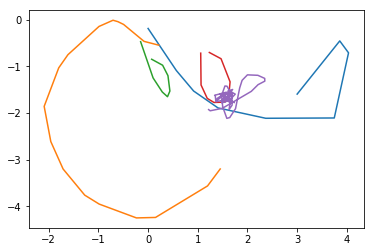

epoch 5901 in 0.175 s: loss = -0.0194, LR = -0.0399, LKL = 0.0205
epoch 5902 in 0.174 s: loss = -0.0232, LR = -0.0437, LKL = 0.0206
epoch 5903 in 0.177 s: loss = -0.0370, LR = -0.0575, LKL = 0.0205
epoch 5904 in 0.174 s: loss = -0.0231, LR = -0.0436, LKL = 0.0205
epoch 5905 in 0.175 s: loss = -0.0398, LR = -0.0604, LKL = 0.0206
epoch 5906 in 0.176 s: loss = -0.0558, LR = -0.0762, LKL = 0.0205
epoch 5907 in 0.177 s: loss = -0.0127, LR = -0.0333, LKL = 0.0206
epoch 5908 in 0.174 s: loss = 0.0261, LR = 0.0056, LKL = 0.0205
epoch 5909 in 0.174 s: loss = -0.0560, LR = -0.0767, LKL = 0.0207
epoch 5910 in 0.176 s: loss = 0.0165, LR = -0.0041, LKL = 0.0206
epoch 5911 in 0.177 s: loss = -0.0245, LR = -0.0451, LKL = 0.0207
epoch 5912 in 0.173 s: loss = -0.0528, LR = -0.0736, LKL = 0.0208
epoch 5913 in 0.179 s: loss = -0.0369, LR = -0.0576, LKL = 0.0207
epoch 5914 in 0.172 s: loss = -0.0621, LR = -0.0827, LKL = 0.0206
epoch 5915 in 0.176 s: loss = -0.0181, LR = -0.0387, LKL = 0.0206
epoch 5916 in

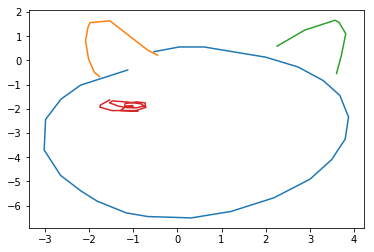

epoch 6001 in 0.176 s: loss = -0.0053, LR = -0.0256, LKL = 0.0203
epoch 6002 in 0.173 s: loss = 0.0198, LR = -0.0004, LKL = 0.0202
epoch 6003 in 0.177 s: loss = -0.0073, LR = -0.0276, LKL = 0.0203
epoch 6004 in 0.177 s: loss = 0.0242, LR = 0.0039, LKL = 0.0202
epoch 6005 in 0.176 s: loss = 0.0324, LR = 0.0121, LKL = 0.0202
epoch 6006 in 0.176 s: loss = 0.0236, LR = 0.0035, LKL = 0.0201
epoch 6007 in 0.176 s: loss = -0.0058, LR = -0.0259, LKL = 0.0202
epoch 6008 in 0.171 s: loss = -0.0043, LR = -0.0244, LKL = 0.0202
epoch 6009 in 0.176 s: loss = -0.0081, LR = -0.0283, LKL = 0.0202
epoch 6010 in 0.177 s: loss = -0.0397, LR = -0.0599, LKL = 0.0202
epoch 6011 in 0.178 s: loss = 0.0098, LR = -0.0104, LKL = 0.0202
epoch 6012 in 0.175 s: loss = -0.0327, LR = -0.0530, LKL = 0.0203
epoch 6013 in 0.178 s: loss = 0.0133, LR = -0.0069, LKL = 0.0202
epoch 6014 in 0.175 s: loss = -0.0086, LR = -0.0288, LKL = 0.0202
epoch 6015 in 0.177 s: loss = -0.0359, LR = -0.0561, LKL = 0.0202
epoch 6016 in 0.177

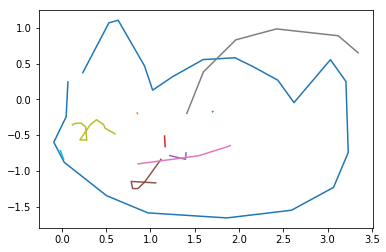

epoch 6101 in 0.174 s: loss = 0.0104, LR = -0.0097, LKL = 0.0201
epoch 6102 in 0.177 s: loss = 0.0068, LR = -0.0133, LKL = 0.0201
epoch 6103 in 0.176 s: loss = 0.0383, LR = 0.0183, LKL = 0.0200
epoch 6104 in 0.174 s: loss = -0.0863, LR = -0.1064, LKL = 0.0201
epoch 6105 in 0.175 s: loss = -0.0885, LR = -0.1087, LKL = 0.0202
epoch 6106 in 0.178 s: loss = -0.0351, LR = -0.0551, LKL = 0.0200
epoch 6107 in 0.179 s: loss = -0.0237, LR = -0.0437, LKL = 0.0200
epoch 6108 in 0.174 s: loss = 0.0788, LR = 0.0586, LKL = 0.0202
epoch 6109 in 0.175 s: loss = -0.0604, LR = -0.0806, LKL = 0.0201
epoch 6110 in 0.175 s: loss = 0.0105, LR = -0.0097, LKL = 0.0202
epoch 6111 in 0.177 s: loss = -0.0389, LR = -0.0593, LKL = 0.0204
epoch 6112 in 0.179 s: loss = -0.0694, LR = -0.0896, LKL = 0.0203
epoch 6113 in 0.176 s: loss = -0.0872, LR = -0.1074, LKL = 0.0202
epoch 6114 in 0.174 s: loss = 0.0166, LR = -0.0036, LKL = 0.0201
epoch 6115 in 0.175 s: loss = -0.0175, LR = -0.0376, LKL = 0.0201
epoch 6116 in 0.17

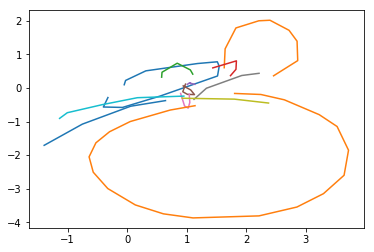

epoch 6201 in 0.176 s: loss = 0.0038, LR = -0.0168, LKL = 0.0206
epoch 6202 in 0.173 s: loss = -0.0275, LR = -0.0484, LKL = 0.0209
epoch 6203 in 0.176 s: loss = -0.0386, LR = -0.0594, LKL = 0.0207
epoch 6204 in 0.175 s: loss = -0.0572, LR = -0.0779, LKL = 0.0207
epoch 6205 in 0.177 s: loss = -0.0269, LR = -0.0475, LKL = 0.0206
epoch 6206 in 0.177 s: loss = 0.0174, LR = -0.0032, LKL = 0.0206
epoch 6207 in 0.177 s: loss = -0.0202, LR = -0.0410, LKL = 0.0208
epoch 6208 in 0.173 s: loss = 0.0298, LR = 0.0091, LKL = 0.0206
epoch 6209 in 0.175 s: loss = -0.0275, LR = -0.0481, LKL = 0.0206
epoch 6210 in 0.174 s: loss = -0.0447, LR = -0.0654, LKL = 0.0206
epoch 6211 in 0.174 s: loss = -0.0831, LR = -0.1038, LKL = 0.0207
epoch 6212 in 0.173 s: loss = -0.0165, LR = -0.0371, LKL = 0.0206
epoch 6213 in 0.176 s: loss = -0.0107, LR = -0.0314, LKL = 0.0206
epoch 6214 in 0.177 s: loss = -0.0896, LR = -0.1103, LKL = 0.0207
epoch 6215 in 0.176 s: loss = -0.0657, LR = -0.0864, LKL = 0.0207
epoch 6216 in 

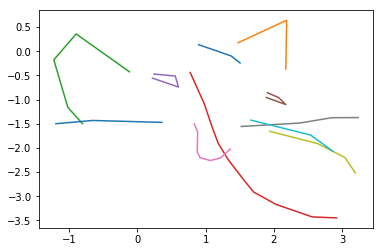

epoch 6301 in 0.176 s: loss = -0.1009, LR = -0.1216, LKL = 0.0208
epoch 6302 in 0.175 s: loss = -0.0599, LR = -0.0804, LKL = 0.0205
epoch 6303 in 0.177 s: loss = -0.0550, LR = -0.0756, LKL = 0.0206
epoch 6304 in 0.175 s: loss = -0.0708, LR = -0.0915, LKL = 0.0207
epoch 6305 in 0.177 s: loss = -0.0135, LR = -0.0340, LKL = 0.0205
epoch 6306 in 0.177 s: loss = -0.0324, LR = -0.0529, LKL = 0.0205
epoch 6307 in 0.179 s: loss = -0.0031, LR = -0.0236, LKL = 0.0205
epoch 6308 in 0.175 s: loss = -0.0212, LR = -0.0418, LKL = 0.0206
epoch 6309 in 0.178 s: loss = -0.0699, LR = -0.0905, LKL = 0.0206
epoch 6310 in 0.176 s: loss = -0.0787, LR = -0.0993, LKL = 0.0206
epoch 6311 in 0.179 s: loss = -0.0175, LR = -0.0380, LKL = 0.0205
epoch 6312 in 0.175 s: loss = -0.0644, LR = -0.0849, LKL = 0.0205
epoch 6313 in 0.178 s: loss = -0.0273, LR = -0.0478, LKL = 0.0205
epoch 6314 in 0.175 s: loss = -0.0132, LR = -0.0337, LKL = 0.0204
epoch 6315 in 0.178 s: loss = -0.0406, LR = -0.0611, LKL = 0.0205
epoch 6316

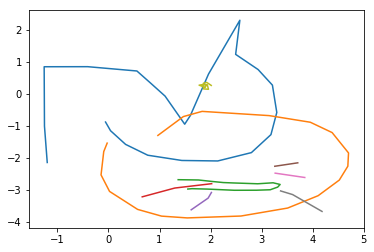

epoch 6401 in 0.174 s: loss = -0.0804, LR = -0.1012, LKL = 0.0208
epoch 6402 in 0.175 s: loss = -0.0327, LR = -0.0532, LKL = 0.0206
epoch 6403 in 0.176 s: loss = -0.0765, LR = -0.0973, LKL = 0.0208
epoch 6404 in 0.171 s: loss = -0.1030, LR = -0.1237, LKL = 0.0207
epoch 6405 in 0.172 s: loss = -0.1043, LR = -0.1250, LKL = 0.0207
epoch 6406 in 0.174 s: loss = -0.1345, LR = -0.1552, LKL = 0.0207
epoch 6407 in 0.177 s: loss = -0.0453, LR = -0.0660, LKL = 0.0206
epoch 6408 in 0.176 s: loss = -0.0581, LR = -0.0789, LKL = 0.0208
epoch 6409 in 0.176 s: loss = -0.0657, LR = -0.0865, LKL = 0.0207
epoch 6410 in 0.174 s: loss = -0.0394, LR = -0.0602, LKL = 0.0208
epoch 6411 in 0.176 s: loss = -0.0310, LR = -0.0516, LKL = 0.0206
epoch 6412 in 0.176 s: loss = -0.0500, LR = -0.0705, LKL = 0.0206
epoch 6413 in 0.176 s: loss = -0.0802, LR = -0.1009, LKL = 0.0207
epoch 6414 in 0.174 s: loss = -0.0105, LR = -0.0311, LKL = 0.0205
epoch 6415 in 0.175 s: loss = -0.0043, LR = -0.0250, LKL = 0.0207
epoch 6416

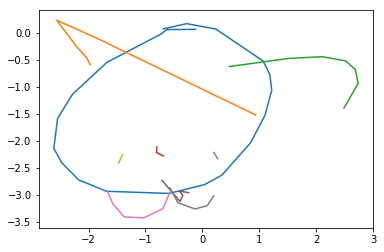

epoch 6501 in 0.177 s: loss = 0.0165, LR = -0.0046, LKL = 0.0211
epoch 6502 in 0.174 s: loss = -0.0252, LR = -0.0463, LKL = 0.0211
epoch 6503 in 0.180 s: loss = -0.0056, LR = -0.0266, LKL = 0.0209
epoch 6504 in 0.174 s: loss = -0.0312, LR = -0.0523, LKL = 0.0211
epoch 6505 in 0.178 s: loss = -0.0520, LR = -0.0729, LKL = 0.0209
epoch 6506 in 0.177 s: loss = -0.0730, LR = -0.0940, LKL = 0.0210
epoch 6507 in 0.181 s: loss = -0.0174, LR = -0.0385, LKL = 0.0211
epoch 6508 in 0.176 s: loss = -0.0006, LR = -0.0216, LKL = 0.0210
epoch 6509 in 0.173 s: loss = -0.0207, LR = -0.0417, LKL = 0.0210
epoch 6510 in 0.176 s: loss = -0.0594, LR = -0.0804, LKL = 0.0210
epoch 6511 in 0.179 s: loss = 0.0403, LR = 0.0192, LKL = 0.0211
epoch 6512 in 0.175 s: loss = -0.0287, LR = -0.0497, LKL = 0.0210
epoch 6513 in 0.181 s: loss = -0.0202, LR = -0.0413, LKL = 0.0211
epoch 6514 in 0.176 s: loss = -0.0477, LR = -0.0688, LKL = 0.0211
epoch 6515 in 0.180 s: loss = 0.0236, LR = 0.0028, LKL = 0.0208
epoch 6516 in 0

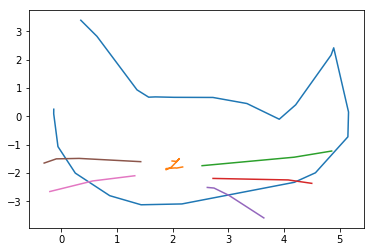

epoch 6601 in 0.177 s: loss = -0.1279, LR = -0.1492, LKL = 0.0212
epoch 6602 in 0.171 s: loss = -0.0013, LR = -0.0224, LKL = 0.0211
epoch 6603 in 0.175 s: loss = 0.0256, LR = 0.0044, LKL = 0.0212
epoch 6604 in 0.176 s: loss = -0.0414, LR = -0.0627, LKL = 0.0213
epoch 6605 in 0.176 s: loss = -0.0163, LR = -0.0376, LKL = 0.0213
epoch 6606 in 0.171 s: loss = -0.0295, LR = -0.0507, LKL = 0.0212
epoch 6607 in 0.172 s: loss = -0.0107, LR = -0.0319, LKL = 0.0212
epoch 6608 in 0.174 s: loss = -0.0352, LR = -0.0565, LKL = 0.0213
epoch 6609 in 0.175 s: loss = -0.0313, LR = -0.0525, LKL = 0.0212
epoch 6610 in 0.176 s: loss = 0.0260, LR = 0.0048, LKL = 0.0212
epoch 6611 in 0.179 s: loss = -0.0703, LR = -0.0916, LKL = 0.0213
epoch 6612 in 0.176 s: loss = 0.0589, LR = 0.0376, LKL = 0.0213
epoch 6613 in 0.177 s: loss = -0.0642, LR = -0.0856, LKL = 0.0214
epoch 6614 in 0.173 s: loss = -0.0944, LR = -0.1157, LKL = 0.0213
epoch 6615 in 0.176 s: loss = -0.0244, LR = -0.0458, LKL = 0.0214
epoch 6616 in 0.

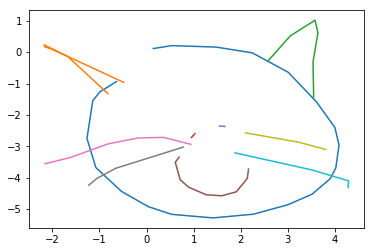

epoch 6701 in 0.178 s: loss = -0.0354, LR = -0.0567, LKL = 0.0213
epoch 6702 in 0.175 s: loss = -0.0605, LR = -0.0818, LKL = 0.0213
epoch 6703 in 0.177 s: loss = -0.0280, LR = -0.0494, LKL = 0.0214
epoch 6704 in 0.175 s: loss = -0.0633, LR = -0.0847, LKL = 0.0213
epoch 6705 in 0.173 s: loss = -0.0206, LR = -0.0417, LKL = 0.0211
epoch 6706 in 0.177 s: loss = -0.0828, LR = -0.1042, LKL = 0.0213
epoch 6707 in 0.176 s: loss = -0.0690, LR = -0.0903, LKL = 0.0213
epoch 6708 in 0.176 s: loss = 0.0143, LR = -0.0069, LKL = 0.0212
epoch 6709 in 0.177 s: loss = -0.0477, LR = -0.0688, LKL = 0.0211
epoch 6710 in 0.175 s: loss = -0.0255, LR = -0.0467, LKL = 0.0212
epoch 6711 in 0.179 s: loss = -0.0542, LR = -0.0754, LKL = 0.0212
epoch 6712 in 0.173 s: loss = -0.0340, LR = -0.0552, LKL = 0.0213
epoch 6713 in 0.175 s: loss = -0.0254, LR = -0.0467, LKL = 0.0214
epoch 6714 in 0.174 s: loss = -0.0685, LR = -0.0897, LKL = 0.0212
epoch 6715 in 0.177 s: loss = -0.0025, LR = -0.0237, LKL = 0.0213
epoch 6716 

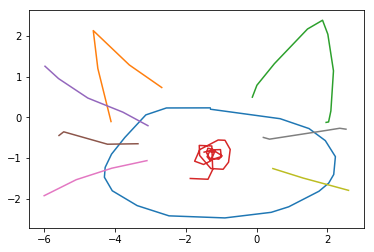

epoch 6801 in 0.173 s: loss = -0.0684, LR = -0.0895, LKL = 0.0210
epoch 6802 in 0.173 s: loss = -0.1194, LR = -0.1406, LKL = 0.0212
epoch 6803 in 0.174 s: loss = -0.0469, LR = -0.0680, LKL = 0.0211
epoch 6804 in 0.174 s: loss = -0.0441, LR = -0.0651, LKL = 0.0211
epoch 6805 in 0.174 s: loss = -0.1608, LR = -0.1821, LKL = 0.0212
epoch 6806 in 0.174 s: loss = -0.1042, LR = -0.1254, LKL = 0.0212
epoch 6807 in 0.175 s: loss = -0.0184, LR = -0.0394, LKL = 0.0210
epoch 6808 in 0.172 s: loss = -0.0940, LR = -0.1151, LKL = 0.0211
epoch 6809 in 0.175 s: loss = -0.0642, LR = -0.0854, LKL = 0.0212
epoch 6810 in 0.174 s: loss = 0.0089, LR = -0.0122, LKL = 0.0210
epoch 6811 in 0.175 s: loss = -0.0036, LR = -0.0248, LKL = 0.0212
epoch 6812 in 0.173 s: loss = -0.0453, LR = -0.0664, LKL = 0.0211
epoch 6813 in 0.176 s: loss = -0.0181, LR = -0.0390, LKL = 0.0209
epoch 6814 in 0.174 s: loss = -0.0507, LR = -0.0719, LKL = 0.0211
epoch 6815 in 0.175 s: loss = -0.0335, LR = -0.0547, LKL = 0.0212
epoch 6816 

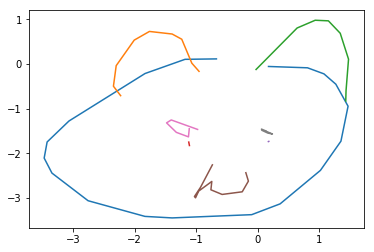

epoch 6901 in 0.178 s: loss = -0.0814, LR = -0.1026, LKL = 0.0212
epoch 6902 in 0.178 s: loss = -0.0421, LR = -0.0633, LKL = 0.0212
epoch 6903 in 0.179 s: loss = -0.0733, LR = -0.0945, LKL = 0.0212
epoch 6904 in 0.177 s: loss = -0.1005, LR = -0.1218, LKL = 0.0213
epoch 6905 in 0.177 s: loss = 0.0129, LR = -0.0083, LKL = 0.0211
epoch 6906 in 0.175 s: loss = -0.0436, LR = -0.0647, LKL = 0.0211
epoch 6907 in 0.178 s: loss = -0.0493, LR = -0.0706, LKL = 0.0213
epoch 6908 in 0.176 s: loss = 0.0064, LR = -0.0148, LKL = 0.0212
epoch 6909 in 0.176 s: loss = -0.0141, LR = -0.0353, LKL = 0.0212
epoch 6910 in 0.174 s: loss = 0.0021, LR = -0.0191, LKL = 0.0212
epoch 6911 in 0.178 s: loss = -0.0516, LR = -0.0728, LKL = 0.0212
epoch 6912 in 0.177 s: loss = -0.0099, LR = -0.0310, LKL = 0.0211
epoch 6913 in 0.179 s: loss = -0.0015, LR = -0.0228, LKL = 0.0213
epoch 6914 in 0.177 s: loss = -0.0510, LR = -0.0723, LKL = 0.0213
epoch 6915 in 0.177 s: loss = -0.0863, LR = -0.1077, LKL = 0.0214
epoch 6916 in

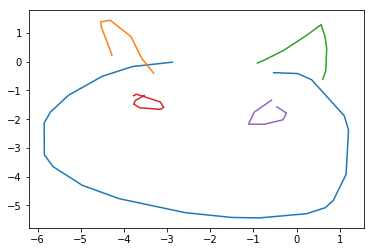

epoch 7001 in 0.179 s: loss = -0.0704, LR = -0.0917, LKL = 0.0213
epoch 7002 in 0.176 s: loss = -0.0752, LR = -0.0965, LKL = 0.0213
epoch 7003 in 0.181 s: loss = -0.0228, LR = -0.0441, LKL = 0.0213
epoch 7004 in 0.179 s: loss = -0.0779, LR = -0.0991, LKL = 0.0213
epoch 7005 in 0.175 s: loss = -0.0136, LR = -0.0349, LKL = 0.0213
epoch 7006 in 0.178 s: loss = -0.0546, LR = -0.0758, LKL = 0.0212
epoch 7007 in 0.182 s: loss = -0.0109, LR = -0.0321, LKL = 0.0212
epoch 7008 in 0.182 s: loss = -0.0786, LR = -0.0998, LKL = 0.0212
epoch 7009 in 0.178 s: loss = -0.0313, LR = -0.0524, LKL = 0.0211
epoch 7010 in 0.178 s: loss = 0.0055, LR = -0.0157, LKL = 0.0212
epoch 7011 in 0.180 s: loss = -0.0670, LR = -0.0883, LKL = 0.0213
epoch 7012 in 0.179 s: loss = -0.0130, LR = -0.0341, LKL = 0.0212
epoch 7013 in 0.181 s: loss = 0.0053, LR = -0.0160, LKL = 0.0212
epoch 7014 in 0.180 s: loss = -0.0578, LR = -0.0791, LKL = 0.0213
epoch 7015 in 0.177 s: loss = -0.0669, LR = -0.0882, LKL = 0.0213
epoch 7016 i

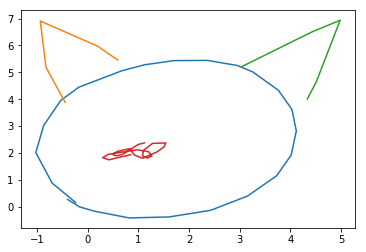

epoch 7101 in 0.176 s: loss = -0.1265, LR = -0.1482, LKL = 0.0216
epoch 7102 in 0.174 s: loss = -0.0716, LR = -0.0932, LKL = 0.0216
epoch 7103 in 0.173 s: loss = -0.1119, LR = -0.1335, LKL = 0.0216
epoch 7104 in 0.175 s: loss = -0.0945, LR = -0.1161, LKL = 0.0216
epoch 7105 in 0.177 s: loss = -0.1075, LR = -0.1290, LKL = 0.0215
epoch 7106 in 0.179 s: loss = -0.0997, LR = -0.1211, LKL = 0.0214
epoch 7107 in 0.175 s: loss = -0.0952, LR = -0.1167, LKL = 0.0215
epoch 7108 in 0.175 s: loss = -0.0916, LR = -0.1132, LKL = 0.0216
epoch 7109 in 0.178 s: loss = 0.0207, LR = -0.0008, LKL = 0.0214
epoch 7110 in 0.179 s: loss = -0.0812, LR = -0.1028, LKL = 0.0216
epoch 7111 in 0.177 s: loss = -0.1053, LR = -0.1268, LKL = 0.0215
epoch 7112 in 0.176 s: loss = 0.0249, LR = 0.0034, LKL = 0.0215
epoch 7113 in 0.176 s: loss = -0.0527, LR = -0.0743, LKL = 0.0216
epoch 7114 in 0.177 s: loss = -0.0854, LR = -0.1070, LKL = 0.0216
epoch 7115 in 0.177 s: loss = -0.0789, LR = -0.1004, LKL = 0.0215
epoch 7116 in

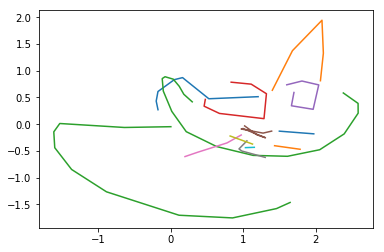

epoch 7201 in 0.179 s: loss = -0.0878, LR = -0.1094, LKL = 0.0216
epoch 7202 in 0.172 s: loss = 0.0103, LR = -0.0114, LKL = 0.0217
epoch 7203 in 0.174 s: loss = -0.1077, LR = -0.1294, LKL = 0.0217
epoch 7204 in 0.172 s: loss = 0.0238, LR = 0.0022, LKL = 0.0216
epoch 7205 in 0.177 s: loss = -0.0436, LR = -0.0652, LKL = 0.0215
epoch 7206 in 0.177 s: loss = -0.0018, LR = -0.0234, LKL = 0.0216
epoch 7207 in 0.177 s: loss = -0.0724, LR = -0.0940, LKL = 0.0216
epoch 7208 in 0.175 s: loss = -0.0158, LR = -0.0374, LKL = 0.0216
epoch 7209 in 0.177 s: loss = -0.0241, LR = -0.0458, LKL = 0.0216
epoch 7210 in 0.175 s: loss = -0.0622, LR = -0.0837, LKL = 0.0215
epoch 7211 in 0.181 s: loss = -0.0831, LR = -0.1048, LKL = 0.0217
epoch 7212 in 0.177 s: loss = -0.0700, LR = -0.0917, LKL = 0.0217
epoch 7213 in 0.176 s: loss = -0.0695, LR = -0.0912, LKL = 0.0217
epoch 7214 in 0.174 s: loss = -0.0204, LR = -0.0421, LKL = 0.0218
epoch 7215 in 0.179 s: loss = -0.0319, LR = -0.0535, LKL = 0.0215
epoch 7216 in

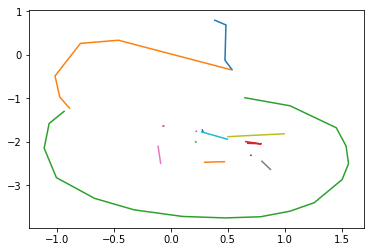

epoch 7301 in 0.176 s: loss = -0.1117, LR = -0.1333, LKL = 0.0216
epoch 7302 in 0.174 s: loss = -0.1303, LR = -0.1519, LKL = 0.0216
epoch 7303 in 0.176 s: loss = -0.0909, LR = -0.1126, LKL = 0.0217
epoch 7304 in 0.174 s: loss = -0.0550, LR = -0.0766, LKL = 0.0216
epoch 7305 in 0.177 s: loss = -0.0805, LR = -0.1021, LKL = 0.0216
epoch 7306 in 0.176 s: loss = -0.0595, LR = -0.0811, LKL = 0.0216
epoch 7307 in 0.180 s: loss = -0.1099, LR = -0.1315, LKL = 0.0217
epoch 7308 in 0.175 s: loss = -0.1037, LR = -0.1254, LKL = 0.0217
epoch 7309 in 0.177 s: loss = -0.0710, LR = -0.0927, LKL = 0.0218
epoch 7310 in 0.175 s: loss = -0.0855, LR = -0.1072, LKL = 0.0217
epoch 7311 in 0.178 s: loss = -0.0284, LR = -0.0499, LKL = 0.0215
epoch 7312 in 0.177 s: loss = 0.0129, LR = -0.0087, LKL = 0.0216
epoch 7313 in 0.178 s: loss = -0.0219, LR = -0.0435, LKL = 0.0216
epoch 7314 in 0.174 s: loss = -0.0620, LR = -0.0836, LKL = 0.0216
epoch 7315 in 0.180 s: loss = -0.1030, LR = -0.1247, LKL = 0.0217
epoch 7316 

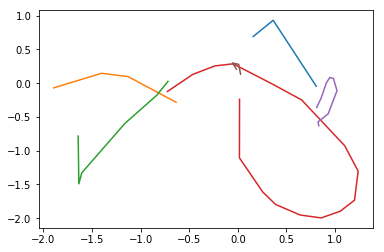

epoch 7401 in 0.176 s: loss = -0.0711, LR = -0.0928, LKL = 0.0217
epoch 7402 in 0.178 s: loss = -0.0459, LR = -0.0677, LKL = 0.0218
epoch 7403 in 0.177 s: loss = -0.0747, LR = -0.0966, LKL = 0.0219
epoch 7404 in 0.174 s: loss = -0.0609, LR = -0.0827, LKL = 0.0218
epoch 7405 in 0.177 s: loss = -0.0909, LR = -0.1128, LKL = 0.0219
epoch 7406 in 0.177 s: loss = -0.0614, LR = -0.0833, LKL = 0.0219
epoch 7407 in 0.181 s: loss = -0.0797, LR = -0.1017, LKL = 0.0220
epoch 7408 in 0.177 s: loss = -0.0775, LR = -0.0994, LKL = 0.0219
epoch 7409 in 0.175 s: loss = -0.0908, LR = -0.1126, LKL = 0.0218
epoch 7410 in 0.177 s: loss = -0.0495, LR = -0.0714, LKL = 0.0219
epoch 7411 in 0.178 s: loss = -0.0786, LR = -0.1004, LKL = 0.0218
epoch 7412 in 0.177 s: loss = -0.1033, LR = -0.1252, LKL = 0.0218
epoch 7413 in 0.177 s: loss = -0.0528, LR = -0.0746, LKL = 0.0218
epoch 7414 in 0.176 s: loss = -0.0849, LR = -0.1067, LKL = 0.0218
epoch 7415 in 0.177 s: loss = -0.1039, LR = -0.1257, LKL = 0.0218
epoch 7416

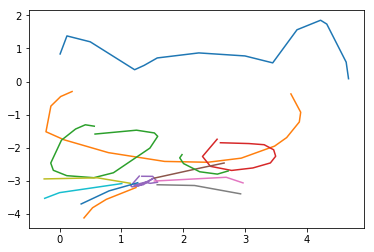

epoch 7501 in 0.175 s: loss = -0.0788, LR = -0.1008, LKL = 0.0219
epoch 7502 in 0.176 s: loss = -0.1023, LR = -0.1243, LKL = 0.0220
epoch 7503 in 0.176 s: loss = -0.0560, LR = -0.0779, LKL = 0.0218
epoch 7504 in 0.172 s: loss = 0.0238, LR = 0.0019, LKL = 0.0219
epoch 7505 in 0.175 s: loss = -0.0323, LR = -0.0541, LKL = 0.0218
epoch 7506 in 0.175 s: loss = -0.0728, LR = -0.0947, LKL = 0.0219
epoch 7507 in 0.181 s: loss = -0.0978, LR = -0.1198, LKL = 0.0220
epoch 7508 in 0.174 s: loss = -0.0963, LR = -0.1185, LKL = 0.0222
epoch 7509 in 0.174 s: loss = -0.0698, LR = -0.0918, LKL = 0.0220
epoch 7510 in 0.174 s: loss = -0.0920, LR = -0.1139, LKL = 0.0219
epoch 7511 in 0.175 s: loss = -0.1415, LR = -0.1635, LKL = 0.0220
epoch 7512 in 0.177 s: loss = -0.1016, LR = -0.1236, LKL = 0.0219
epoch 7513 in 0.176 s: loss = 0.0095, LR = -0.0123, LKL = 0.0218
epoch 7514 in 0.174 s: loss = -0.0980, LR = -0.1200, LKL = 0.0220
epoch 7515 in 0.175 s: loss = -0.0626, LR = -0.0845, LKL = 0.0219
epoch 7516 in

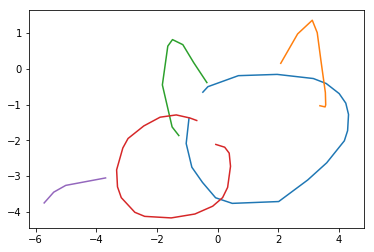

epoch 7601 in 0.181 s: loss = -0.0882, LR = -0.1104, LKL = 0.0222
epoch 7602 in 0.178 s: loss = -0.1065, LR = -0.1287, LKL = 0.0222
epoch 7603 in 0.174 s: loss = -0.0850, LR = -0.1072, LKL = 0.0221
epoch 7604 in 0.172 s: loss = -0.1334, LR = -0.1556, LKL = 0.0222
epoch 7605 in 0.172 s: loss = -0.0805, LR = -0.1026, LKL = 0.0221
epoch 7606 in 0.174 s: loss = -0.0965, LR = -0.1187, LKL = 0.0222
epoch 7607 in 0.173 s: loss = -0.0878, LR = -0.1100, LKL = 0.0222
epoch 7608 in 0.171 s: loss = -0.1213, LR = -0.1435, LKL = 0.0222
epoch 7609 in 0.174 s: loss = -0.0573, LR = -0.0794, LKL = 0.0221
epoch 7610 in 0.176 s: loss = -0.0896, LR = -0.1118, LKL = 0.0222
epoch 7611 in 0.181 s: loss = -0.0939, LR = -0.1162, LKL = 0.0222
epoch 7612 in 0.173 s: loss = -0.0232, LR = -0.0453, LKL = 0.0221
epoch 7613 in 0.174 s: loss = -0.0918, LR = -0.1140, LKL = 0.0222
epoch 7614 in 0.170 s: loss = -0.0508, LR = -0.0730, LKL = 0.0221
epoch 7615 in 0.176 s: loss = -0.0656, LR = -0.0876, LKL = 0.0219
epoch 7616

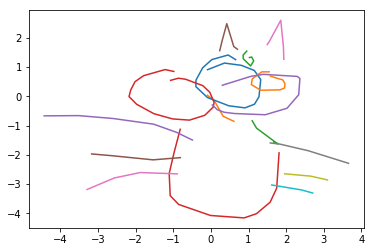

epoch 7701 in 0.178 s: loss = -0.0516, LR = -0.0739, LKL = 0.0223
epoch 7702 in 0.175 s: loss = -0.0290, LR = -0.0511, LKL = 0.0221
epoch 7703 in 0.175 s: loss = -0.0741, LR = -0.0963, LKL = 0.0222
epoch 7704 in 0.177 s: loss = -0.1396, LR = -0.1618, LKL = 0.0222
epoch 7705 in 0.177 s: loss = -0.1092, LR = -0.1314, LKL = 0.0222
epoch 7706 in 0.176 s: loss = -0.0797, LR = -0.1020, LKL = 0.0223
epoch 7707 in 0.175 s: loss = -0.1315, LR = -0.1539, LKL = 0.0224
epoch 7708 in 0.173 s: loss = -0.1024, LR = -0.1245, LKL = 0.0222
epoch 7709 in 0.171 s: loss = -0.1002, LR = -0.1224, LKL = 0.0222
epoch 7710 in 0.177 s: loss = -0.1620, LR = -0.1843, LKL = 0.0223
epoch 7711 in 0.176 s: loss = -0.1693, LR = -0.1917, LKL = 0.0224
epoch 7712 in 0.168 s: loss = -0.0646, LR = -0.0866, LKL = 0.0221
epoch 7713 in 0.174 s: loss = -0.1119, LR = -0.1342, LKL = 0.0223
epoch 7714 in 0.174 s: loss = -0.0759, LR = -0.0982, LKL = 0.0222
epoch 7715 in 0.176 s: loss = -0.1506, LR = -0.1728, LKL = 0.0222
epoch 7716

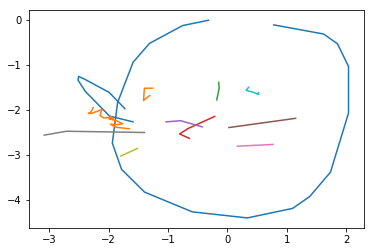

epoch 7801 in 0.178 s: loss = -0.0828, LR = -0.1051, LKL = 0.0223
epoch 7802 in 0.171 s: loss = -0.0572, LR = -0.0793, LKL = 0.0220
epoch 7803 in 0.177 s: loss = -0.0688, LR = -0.0909, LKL = 0.0221
epoch 7804 in 0.176 s: loss = -0.0622, LR = -0.0843, LKL = 0.0221
epoch 7805 in 0.176 s: loss = -0.0740, LR = -0.0961, LKL = 0.0222
epoch 7806 in 0.176 s: loss = 0.0028, LR = -0.0193, LKL = 0.0221
epoch 7807 in 0.177 s: loss = -0.0552, LR = -0.0772, LKL = 0.0221
epoch 7808 in 0.178 s: loss = -0.1025, LR = -0.1246, LKL = 0.0221
epoch 7809 in 0.177 s: loss = -0.0856, LR = -0.1078, LKL = 0.0222
epoch 7810 in 0.176 s: loss = -0.0732, LR = -0.0953, LKL = 0.0221
epoch 7811 in 0.180 s: loss = -0.0621, LR = -0.0842, LKL = 0.0221
epoch 7812 in 0.172 s: loss = -0.1159, LR = -0.1380, LKL = 0.0221
epoch 7813 in 0.177 s: loss = -0.0489, LR = -0.0709, LKL = 0.0220
epoch 7814 in 0.178 s: loss = -0.1647, LR = -0.1868, LKL = 0.0221
epoch 7815 in 0.175 s: loss = -0.0968, LR = -0.1189, LKL = 0.0221
epoch 7816 

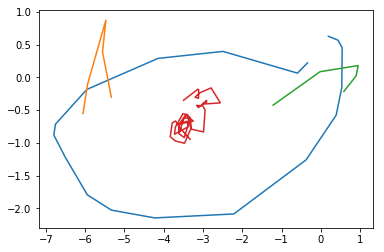

epoch 7901 in 0.175 s: loss = -0.0542, LR = -0.0765, LKL = 0.0223
epoch 7902 in 0.172 s: loss = -0.0389, LR = -0.0612, LKL = 0.0223
epoch 7903 in 0.174 s: loss = -0.0885, LR = -0.1109, LKL = 0.0224
epoch 7904 in 0.174 s: loss = -0.0624, LR = -0.0847, LKL = 0.0223
epoch 7905 in 0.179 s: loss = -0.0267, LR = -0.0490, LKL = 0.0223
epoch 7906 in 0.172 s: loss = -0.0569, LR = -0.0792, LKL = 0.0223
epoch 7907 in 0.174 s: loss = -0.1116, LR = -0.1341, LKL = 0.0224
epoch 7908 in 0.179 s: loss = -0.0631, LR = -0.0853, LKL = 0.0222
epoch 7909 in 0.179 s: loss = -0.0401, LR = -0.0624, LKL = 0.0223
epoch 7910 in 0.177 s: loss = -0.0685, LR = -0.0908, LKL = 0.0223
epoch 7911 in 0.177 s: loss = -0.0911, LR = -0.1134, LKL = 0.0223
epoch 7912 in 0.176 s: loss = -0.0883, LR = -0.1106, LKL = 0.0223
epoch 7913 in 0.177 s: loss = -0.0636, LR = -0.0858, LKL = 0.0223
epoch 7914 in 0.175 s: loss = -0.0499, LR = -0.0723, LKL = 0.0224
epoch 7915 in 0.179 s: loss = -0.0721, LR = -0.0944, LKL = 0.0223
epoch 7916

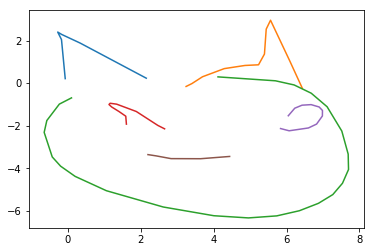

epoch 8001 in 0.179 s: loss = -0.0891, LR = -0.1113, LKL = 0.0223
epoch 8002 in 0.171 s: loss = -0.0746, LR = -0.0966, LKL = 0.0221
epoch 8003 in 0.173 s: loss = -0.0711, LR = -0.0933, LKL = 0.0222
epoch 8004 in 0.173 s: loss = -0.1346, LR = -0.1566, LKL = 0.0221
epoch 8005 in 0.175 s: loss = -0.0684, LR = -0.0906, LKL = 0.0222
epoch 8006 in 0.174 s: loss = -0.0956, LR = -0.1176, LKL = 0.0220
epoch 8007 in 0.177 s: loss = -0.0546, LR = -0.0767, LKL = 0.0221
epoch 8008 in 0.173 s: loss = -0.1115, LR = -0.1337, LKL = 0.0222
epoch 8009 in 0.176 s: loss = -0.1819, LR = -0.2042, LKL = 0.0223
epoch 8010 in 0.170 s: loss = -0.1390, LR = -0.1612, LKL = 0.0223
epoch 8011 in 0.175 s: loss = -0.0754, LR = -0.0975, LKL = 0.0221
epoch 8012 in 0.173 s: loss = -0.0867, LR = -0.1088, LKL = 0.0221
epoch 8013 in 0.172 s: loss = -0.0889, LR = -0.1111, LKL = 0.0222
epoch 8014 in 0.176 s: loss = -0.0979, LR = -0.1201, LKL = 0.0223
epoch 8015 in 0.178 s: loss = -0.0513, LR = -0.0736, LKL = 0.0222
epoch 8016

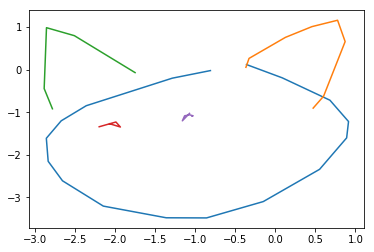

epoch 8101 in 0.179 s: loss = -0.1434, LR = -0.1658, LKL = 0.0224
epoch 8102 in 0.174 s: loss = -0.1137, LR = -0.1361, LKL = 0.0224
epoch 8103 in 0.178 s: loss = -0.1225, LR = -0.1450, LKL = 0.0225
epoch 8104 in 0.175 s: loss = -0.1374, LR = -0.1599, LKL = 0.0224
epoch 8105 in 0.181 s: loss = -0.1024, LR = -0.1248, LKL = 0.0224
epoch 8106 in 0.175 s: loss = -0.1230, LR = -0.1452, LKL = 0.0222
epoch 8107 in 0.182 s: loss = -0.0926, LR = -0.1150, LKL = 0.0224
epoch 8108 in 0.176 s: loss = -0.1164, LR = -0.1387, LKL = 0.0223
epoch 8109 in 0.178 s: loss = -0.0844, LR = -0.1067, LKL = 0.0223
epoch 8110 in 0.176 s: loss = -0.0912, LR = -0.1135, LKL = 0.0223
epoch 8111 in 0.179 s: loss = -0.0999, LR = -0.1223, LKL = 0.0224
epoch 8112 in 0.174 s: loss = -0.1358, LR = -0.1583, LKL = 0.0225
epoch 8113 in 0.177 s: loss = -0.0574, LR = -0.0797, LKL = 0.0223
epoch 8114 in 0.176 s: loss = -0.0577, LR = -0.0800, LKL = 0.0223
epoch 8115 in 0.181 s: loss = -0.0267, LR = -0.0490, LKL = 0.0223
epoch 8116

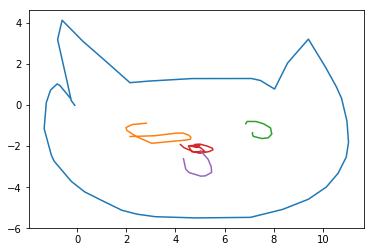

epoch 8201 in 0.179 s: loss = -0.1722, LR = -0.1947, LKL = 0.0225
epoch 8202 in 0.173 s: loss = -0.0994, LR = -0.1217, LKL = 0.0223
epoch 8203 in 0.172 s: loss = -0.0593, LR = -0.0817, LKL = 0.0224
epoch 8204 in 0.173 s: loss = -0.0829, LR = -0.1054, LKL = 0.0225
epoch 8205 in 0.178 s: loss = -0.0631, LR = -0.0855, LKL = 0.0224
epoch 8206 in 0.176 s: loss = -0.1204, LR = -0.1429, LKL = 0.0225
epoch 8207 in 0.177 s: loss = -0.0733, LR = -0.0957, LKL = 0.0223
epoch 8208 in 0.175 s: loss = -0.0737, LR = -0.0961, LKL = 0.0224
epoch 8209 in 0.177 s: loss = -0.0797, LR = -0.1021, LKL = 0.0223
epoch 8210 in 0.171 s: loss = -0.0620, LR = -0.0843, LKL = 0.0223
epoch 8211 in 0.176 s: loss = -0.0786, LR = -0.1009, LKL = 0.0223
epoch 8212 in 0.171 s: loss = -0.1147, LR = -0.1369, LKL = 0.0222
epoch 8213 in 0.173 s: loss = -0.1219, LR = -0.1443, LKL = 0.0224
epoch 8214 in 0.173 s: loss = -0.1476, LR = -0.1699, LKL = 0.0224
epoch 8215 in 0.175 s: loss = -0.0861, LR = -0.1086, LKL = 0.0225
epoch 8216

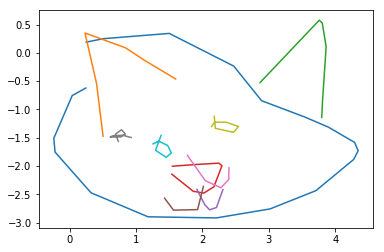

epoch 8301 in 0.176 s: loss = -0.0541, LR = -0.0765, LKL = 0.0224
epoch 8302 in 0.177 s: loss = -0.0709, LR = -0.0933, LKL = 0.0224
epoch 8303 in 0.179 s: loss = -0.0887, LR = -0.1113, LKL = 0.0226
epoch 8304 in 0.175 s: loss = -0.0873, LR = -0.1098, LKL = 0.0226
epoch 8305 in 0.178 s: loss = -0.0451, LR = -0.0675, LKL = 0.0225
epoch 8306 in 0.176 s: loss = -0.1103, LR = -0.1327, LKL = 0.0225
epoch 8307 in 0.177 s: loss = -0.0472, LR = -0.0695, LKL = 0.0223
epoch 8308 in 0.178 s: loss = -0.1249, LR = -0.1473, LKL = 0.0225
epoch 8309 in 0.175 s: loss = -0.0537, LR = -0.0761, LKL = 0.0224
epoch 8310 in 0.175 s: loss = -0.0414, LR = -0.0638, LKL = 0.0223
epoch 8311 in 0.179 s: loss = -0.2104, LR = -0.2328, LKL = 0.0223
epoch 8312 in 0.177 s: loss = -0.1405, LR = -0.1630, LKL = 0.0225
epoch 8313 in 0.179 s: loss = -0.1383, LR = -0.1607, LKL = 0.0224
epoch 8314 in 0.176 s: loss = -0.0803, LR = -0.1026, LKL = 0.0224
epoch 8315 in 0.177 s: loss = -0.1209, LR = -0.1433, LKL = 0.0224
epoch 8316

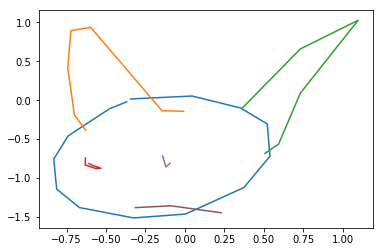

epoch 8401 in 0.178 s: loss = -0.1036, LR = -0.1261, LKL = 0.0225
epoch 8402 in 0.175 s: loss = -0.1206, LR = -0.1431, LKL = 0.0225
epoch 8403 in 0.175 s: loss = -0.1418, LR = -0.1643, LKL = 0.0226
epoch 8404 in 0.175 s: loss = -0.1175, LR = -0.1400, LKL = 0.0225
epoch 8405 in 0.174 s: loss = -0.0704, LR = -0.0927, LKL = 0.0223
epoch 8406 in 0.166 s: loss = -0.0902, LR = -0.1129, LKL = 0.0227
epoch 8407 in 0.176 s: loss = -0.1361, LR = -0.1587, LKL = 0.0226
epoch 8408 in 0.175 s: loss = -0.1172, LR = -0.1398, LKL = 0.0226
epoch 8409 in 0.175 s: loss = -0.0480, LR = -0.0705, LKL = 0.0225
epoch 8410 in 0.173 s: loss = -0.0651, LR = -0.0876, LKL = 0.0225
epoch 8411 in 0.176 s: loss = -0.1036, LR = -0.1261, LKL = 0.0225
epoch 8412 in 0.173 s: loss = -0.1227, LR = -0.1453, LKL = 0.0226
epoch 8413 in 0.176 s: loss = -0.0596, LR = -0.0822, LKL = 0.0226
epoch 8414 in 0.176 s: loss = -0.0821, LR = -0.1045, LKL = 0.0224
epoch 8415 in 0.178 s: loss = -0.1250, LR = -0.1475, LKL = 0.0225
epoch 8416

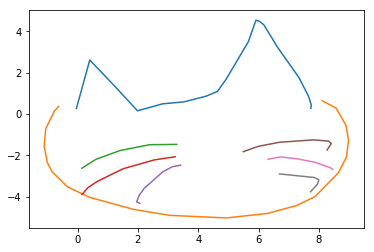

epoch 8501 in 0.178 s: loss = -0.0514, LR = -0.0738, LKL = 0.0224
epoch 8502 in 0.172 s: loss = -0.1299, LR = -0.1525, LKL = 0.0225
epoch 8503 in 0.172 s: loss = -0.0706, LR = -0.0930, LKL = 0.0224
epoch 8504 in 0.171 s: loss = -0.0895, LR = -0.1120, LKL = 0.0225
epoch 8505 in 0.176 s: loss = -0.1453, LR = -0.1677, LKL = 0.0225
epoch 8506 in 0.174 s: loss = -0.0632, LR = -0.0856, LKL = 0.0224
epoch 8507 in 0.173 s: loss = -0.1282, LR = -0.1509, LKL = 0.0227
epoch 8508 in 0.171 s: loss = -0.0696, LR = -0.0921, LKL = 0.0225
epoch 8509 in 0.176 s: loss = -0.1183, LR = -0.1408, LKL = 0.0225
epoch 8510 in 0.174 s: loss = -0.1288, LR = -0.1512, LKL = 0.0225
epoch 8511 in 0.177 s: loss = -0.0723, LR = -0.0947, LKL = 0.0224
epoch 8512 in 0.171 s: loss = -0.1354, LR = -0.1579, LKL = 0.0225
epoch 8513 in 0.174 s: loss = -0.1130, LR = -0.1354, LKL = 0.0224
epoch 8514 in 0.172 s: loss = -0.1014, LR = -0.1239, LKL = 0.0224
epoch 8515 in 0.175 s: loss = -0.1388, LR = -0.1614, LKL = 0.0225
epoch 8516

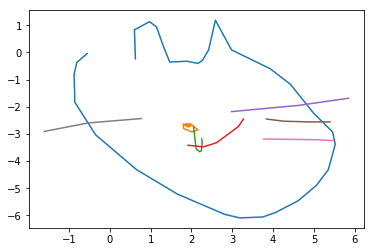

epoch 8601 in 0.173 s: loss = -0.0698, LR = -0.0924, LKL = 0.0226
epoch 8602 in 0.175 s: loss = -0.0220, LR = -0.0447, LKL = 0.0227
epoch 8603 in 0.176 s: loss = -0.0485, LR = -0.0712, LKL = 0.0227
epoch 8604 in 0.171 s: loss = -0.1029, LR = -0.1256, LKL = 0.0227
epoch 8605 in 0.174 s: loss = -0.0744, LR = -0.0970, LKL = 0.0226
epoch 8606 in 0.175 s: loss = -0.1363, LR = -0.1591, LKL = 0.0228
epoch 8607 in 0.177 s: loss = -0.0748, LR = -0.0975, LKL = 0.0227
epoch 8608 in 0.174 s: loss = -0.1315, LR = -0.1542, LKL = 0.0227
epoch 8609 in 0.173 s: loss = -0.0689, LR = -0.0916, LKL = 0.0227
epoch 8610 in 0.173 s: loss = -0.1195, LR = -0.1421, LKL = 0.0226
epoch 8611 in 0.176 s: loss = -0.0751, LR = -0.0979, LKL = 0.0228
epoch 8612 in 0.173 s: loss = -0.1283, LR = -0.1510, LKL = 0.0227
epoch 8613 in 0.174 s: loss = -0.0351, LR = -0.0577, LKL = 0.0226
epoch 8614 in 0.178 s: loss = -0.1306, LR = -0.1533, LKL = 0.0227
epoch 8615 in 0.176 s: loss = -0.0848, LR = -0.1076, LKL = 0.0228
epoch 8616

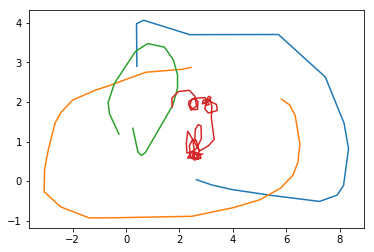

epoch 8701 in 0.175 s: loss = -0.1643, LR = -0.1871, LKL = 0.0228
epoch 8702 in 0.177 s: loss = -0.1352, LR = -0.1580, LKL = 0.0228
epoch 8703 in 0.173 s: loss = -0.0892, LR = -0.1118, LKL = 0.0226
epoch 8704 in 0.172 s: loss = -0.1585, LR = -0.1813, LKL = 0.0228
epoch 8705 in 0.176 s: loss = -0.0641, LR = -0.0868, LKL = 0.0227
epoch 8706 in 0.177 s: loss = -0.0913, LR = -0.1139, LKL = 0.0226
epoch 8707 in 0.177 s: loss = -0.1322, LR = -0.1551, LKL = 0.0228
epoch 8708 in 0.175 s: loss = -0.1880, LR = -0.2107, LKL = 0.0228
epoch 8709 in 0.174 s: loss = -0.1174, LR = -0.1400, LKL = 0.0226
epoch 8710 in 0.174 s: loss = -0.1282, LR = -0.1509, LKL = 0.0227
epoch 8711 in 0.174 s: loss = -0.1356, LR = -0.1583, LKL = 0.0227
epoch 8712 in 0.178 s: loss = -0.0994, LR = -0.1222, LKL = 0.0228
epoch 8713 in 0.173 s: loss = -0.1051, LR = -0.1278, LKL = 0.0227
epoch 8714 in 0.175 s: loss = -0.1604, LR = -0.1831, LKL = 0.0227
epoch 8715 in 0.176 s: loss = -0.1095, LR = -0.1322, LKL = 0.0227
epoch 8716

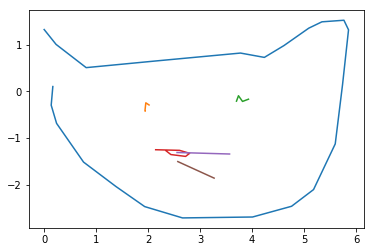

epoch 8801 in 0.176 s: loss = -0.1262, LR = -0.1492, LKL = 0.0229
epoch 8802 in 0.173 s: loss = -0.0723, LR = -0.0951, LKL = 0.0228
epoch 8803 in 0.176 s: loss = -0.0875, LR = -0.1105, LKL = 0.0230
epoch 8804 in 0.176 s: loss = -0.1024, LR = -0.1252, LKL = 0.0229
epoch 8805 in 0.179 s: loss = -0.0910, LR = -0.1139, LKL = 0.0229
epoch 8806 in 0.180 s: loss = -0.0652, LR = -0.0881, LKL = 0.0228
epoch 8807 in 0.176 s: loss = -0.0826, LR = -0.1055, LKL = 0.0229
epoch 8808 in 0.176 s: loss = -0.0458, LR = -0.0685, LKL = 0.0227
epoch 8809 in 0.178 s: loss = -0.1288, LR = -0.1518, LKL = 0.0229
epoch 8810 in 0.176 s: loss = -0.0286, LR = -0.0513, LKL = 0.0228
epoch 8811 in 0.178 s: loss = -0.0987, LR = -0.1214, LKL = 0.0228
epoch 8812 in 0.176 s: loss = -0.1086, LR = -0.1315, LKL = 0.0229
epoch 8813 in 0.179 s: loss = -0.0301, LR = -0.0530, LKL = 0.0228
epoch 8814 in 0.178 s: loss = -0.1531, LR = -0.1761, LKL = 0.0230
epoch 8815 in 0.175 s: loss = -0.1118, LR = -0.1346, LKL = 0.0229
epoch 8816

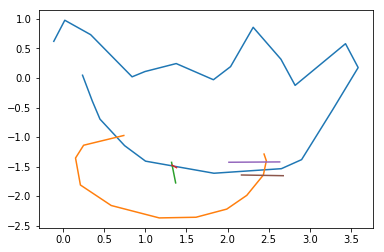

epoch 8901 in 0.174 s: loss = -0.1376, LR = -0.1605, LKL = 0.0229
epoch 8902 in 0.174 s: loss = -0.1288, LR = -0.1516, LKL = 0.0228
epoch 8903 in 0.171 s: loss = -0.1449, LR = -0.1676, LKL = 0.0227
epoch 8904 in 0.177 s: loss = -0.1154, LR = -0.1384, LKL = 0.0230
epoch 8905 in 0.178 s: loss = -0.1517, LR = -0.1745, LKL = 0.0228
epoch 8906 in 0.177 s: loss = -0.1134, LR = -0.1364, LKL = 0.0230
epoch 8907 in 0.174 s: loss = -0.1137, LR = -0.1365, LKL = 0.0227
epoch 8908 in 0.172 s: loss = -0.1900, LR = -0.2128, LKL = 0.0229
epoch 8909 in 0.176 s: loss = -0.0460, LR = -0.0689, LKL = 0.0228
epoch 8910 in 0.176 s: loss = -0.1303, LR = -0.1531, LKL = 0.0228
epoch 8911 in 0.178 s: loss = -0.1158, LR = -0.1387, LKL = 0.0229
epoch 8912 in 0.175 s: loss = -0.1185, LR = -0.1413, LKL = 0.0228
epoch 8913 in 0.178 s: loss = -0.1585, LR = -0.1815, LKL = 0.0230
epoch 8914 in 0.175 s: loss = -0.1339, LR = -0.1568, LKL = 0.0229
epoch 8915 in 0.180 s: loss = -0.1130, LR = -0.1359, LKL = 0.0228
epoch 8916

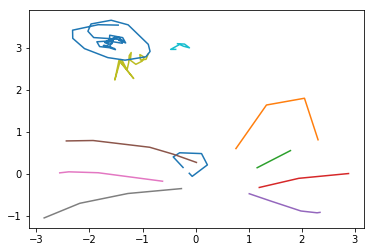

epoch 9001 in 0.178 s: loss = -0.0810, LR = -0.1038, LKL = 0.0228
epoch 9002 in 0.178 s: loss = -0.1118, LR = -0.1346, LKL = 0.0228
epoch 9003 in 0.176 s: loss = -0.1636, LR = -0.1865, LKL = 0.0229
epoch 9004 in 0.174 s: loss = -0.0582, LR = -0.0811, LKL = 0.0229
epoch 9005 in 0.178 s: loss = -0.0618, LR = -0.0847, LKL = 0.0229
epoch 9006 in 0.175 s: loss = -0.0991, LR = -0.1221, LKL = 0.0230
epoch 9007 in 0.178 s: loss = -0.1451, LR = -0.1680, LKL = 0.0229
epoch 9008 in 0.178 s: loss = -0.1132, LR = -0.1360, LKL = 0.0228
epoch 9009 in 0.176 s: loss = -0.0990, LR = -0.1220, LKL = 0.0230
epoch 9010 in 0.177 s: loss = -0.0930, LR = -0.1159, LKL = 0.0229
epoch 9011 in 0.179 s: loss = -0.1485, LR = -0.1714, LKL = 0.0229
epoch 9012 in 0.178 s: loss = -0.1383, LR = -0.1614, LKL = 0.0230
epoch 9013 in 0.175 s: loss = -0.1328, LR = -0.1557, LKL = 0.0228
epoch 9014 in 0.175 s: loss = -0.1211, LR = -0.1441, LKL = 0.0230
epoch 9015 in 0.175 s: loss = -0.1046, LR = -0.1277, LKL = 0.0231
epoch 9016

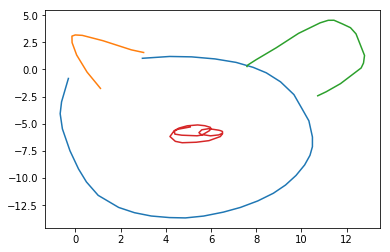

epoch 9101 in 0.173 s: loss = -0.0703, LR = -0.0931, LKL = 0.0228
epoch 9102 in 0.176 s: loss = -0.0941, LR = -0.1172, LKL = 0.0230
epoch 9103 in 0.175 s: loss = -0.1042, LR = -0.1271, LKL = 0.0229
epoch 9104 in 0.177 s: loss = -0.1335, LR = -0.1563, LKL = 0.0228
epoch 9105 in 0.177 s: loss = -0.1689, LR = -0.1919, LKL = 0.0230
epoch 9106 in 0.179 s: loss = -0.1212, LR = -0.1441, LKL = 0.0228
epoch 9107 in 0.177 s: loss = -0.1175, LR = -0.1404, LKL = 0.0229
epoch 9108 in 0.176 s: loss = -0.1595, LR = -0.1825, LKL = 0.0230
epoch 9109 in 0.180 s: loss = -0.1333, LR = -0.1563, LKL = 0.0230
epoch 9110 in 0.176 s: loss = -0.1477, LR = -0.1706, LKL = 0.0229
epoch 9111 in 0.174 s: loss = -0.1292, LR = -0.1520, LKL = 0.0228
epoch 9112 in 0.175 s: loss = -0.0661, LR = -0.0889, LKL = 0.0229
epoch 9113 in 0.176 s: loss = -0.0685, LR = -0.0913, LKL = 0.0228
epoch 9114 in 0.176 s: loss = -0.0534, LR = -0.0762, LKL = 0.0228
epoch 9115 in 0.175 s: loss = -0.0474, LR = -0.0702, LKL = 0.0229
epoch 9116

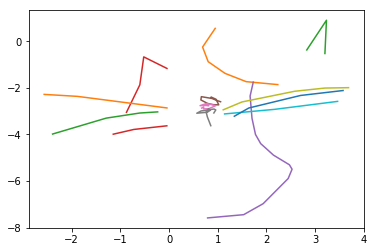

epoch 9201 in 0.174 s: loss = -0.1197, LR = -0.1428, LKL = 0.0231
epoch 9202 in 0.175 s: loss = -0.1389, LR = -0.1621, LKL = 0.0233
epoch 9203 in 0.177 s: loss = -0.1771, LR = -0.2002, LKL = 0.0231
epoch 9204 in 0.172 s: loss = -0.1031, LR = -0.1262, LKL = 0.0231
epoch 9205 in 0.174 s: loss = -0.0915, LR = -0.1146, LKL = 0.0231
epoch 9206 in 0.177 s: loss = -0.1150, LR = -0.1381, LKL = 0.0231
epoch 9207 in 0.177 s: loss = -0.1129, LR = -0.1359, LKL = 0.0230
epoch 9208 in 0.175 s: loss = -0.1074, LR = -0.1305, LKL = 0.0231
epoch 9209 in 0.176 s: loss = -0.1020, LR = -0.1251, LKL = 0.0231
epoch 9210 in 0.171 s: loss = -0.1233, LR = -0.1463, LKL = 0.0230
epoch 9211 in 0.175 s: loss = -0.1402, LR = -0.1633, LKL = 0.0231
epoch 9212 in 0.176 s: loss = -0.1000, LR = -0.1232, LKL = 0.0232
epoch 9213 in 0.176 s: loss = -0.0972, LR = -0.1204, LKL = 0.0231
epoch 9214 in 0.175 s: loss = -0.1718, LR = -0.1950, LKL = 0.0232
epoch 9215 in 0.177 s: loss = -0.2091, LR = -0.2323, LKL = 0.0232
epoch 9216

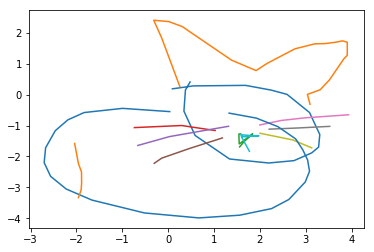

epoch 9301 in 0.176 s: loss = -0.0851, LR = -0.1084, LKL = 0.0233
epoch 9302 in 0.176 s: loss = -0.1525, LR = -0.1757, LKL = 0.0232
epoch 9303 in 0.176 s: loss = -0.1091, LR = -0.1324, LKL = 0.0233
epoch 9304 in 0.173 s: loss = -0.1401, LR = -0.1634, LKL = 0.0233
epoch 9305 in 0.178 s: loss = -0.0800, LR = -0.1034, LKL = 0.0233
epoch 9306 in 0.177 s: loss = -0.1189, LR = -0.1422, LKL = 0.0232
epoch 9307 in 0.175 s: loss = -0.1417, LR = -0.1651, LKL = 0.0234
epoch 9308 in 0.175 s: loss = -0.1489, LR = -0.1722, LKL = 0.0233
epoch 9309 in 0.180 s: loss = -0.1534, LR = -0.1766, LKL = 0.0233
epoch 9310 in 0.176 s: loss = -0.1119, LR = -0.1350, LKL = 0.0231
epoch 9311 in 0.177 s: loss = -0.1468, LR = -0.1702, LKL = 0.0234
epoch 9312 in 0.175 s: loss = -0.1626, LR = -0.1860, LKL = 0.0233
epoch 9313 in 0.177 s: loss = -0.1607, LR = -0.1841, LKL = 0.0234
epoch 9314 in 0.178 s: loss = -0.1449, LR = -0.1682, LKL = 0.0233
epoch 9315 in 0.175 s: loss = -0.1447, LR = -0.1679, LKL = 0.0232
epoch 9316

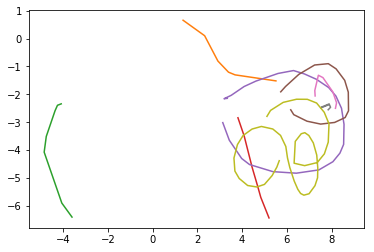

epoch 9401 in 0.177 s: loss = -0.1579, LR = -0.1812, LKL = 0.0233
epoch 9402 in 0.174 s: loss = -0.0837, LR = -0.1069, LKL = 0.0232
epoch 9403 in 0.175 s: loss = -0.1267, LR = -0.1500, LKL = 0.0233
epoch 9404 in 0.181 s: loss = -0.0973, LR = -0.1205, LKL = 0.0232
epoch 9405 in 0.175 s: loss = -0.1460, LR = -0.1694, LKL = 0.0234
epoch 9406 in 0.175 s: loss = -0.1347, LR = -0.1581, LKL = 0.0234
epoch 9407 in 0.177 s: loss = -0.0931, LR = -0.1163, LKL = 0.0232
epoch 9408 in 0.176 s: loss = -0.1491, LR = -0.1724, LKL = 0.0233
epoch 9409 in 0.177 s: loss = -0.0735, LR = -0.0966, LKL = 0.0232
epoch 9410 in 0.175 s: loss = -0.1070, LR = -0.1302, LKL = 0.0232
epoch 9411 in 0.178 s: loss = -0.0773, LR = -0.1005, LKL = 0.0232
epoch 9412 in 0.176 s: loss = -0.1512, LR = -0.1746, LKL = 0.0233
epoch 9413 in 0.176 s: loss = -0.1117, LR = -0.1350, LKL = 0.0233
epoch 9414 in 0.175 s: loss = -0.1231, LR = -0.1465, LKL = 0.0234
epoch 9415 in 0.180 s: loss = -0.1108, LR = -0.1342, LKL = 0.0233
epoch 9416

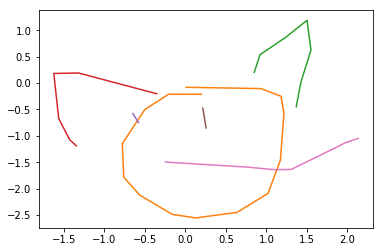

epoch 9501 in 0.175 s: loss = -0.1625, LR = -0.1859, LKL = 0.0234
epoch 9502 in 0.180 s: loss = -0.1128, LR = -0.1361, LKL = 0.0233
epoch 9503 in 0.179 s: loss = -0.1159, LR = -0.1392, LKL = 0.0234
epoch 9504 in 0.179 s: loss = -0.1376, LR = -0.1610, LKL = 0.0234
epoch 9505 in 0.178 s: loss = -0.1625, LR = -0.1857, LKL = 0.0232
epoch 9506 in 0.178 s: loss = -0.1686, LR = -0.1919, LKL = 0.0233
epoch 9507 in 0.177 s: loss = -0.2084, LR = -0.2317, LKL = 0.0234
epoch 9508 in 0.179 s: loss = -0.1793, LR = -0.2027, LKL = 0.0233
epoch 9509 in 0.175 s: loss = -0.1456, LR = -0.1690, LKL = 0.0234
epoch 9510 in 0.177 s: loss = -0.1413, LR = -0.1646, LKL = 0.0234
epoch 9511 in 0.176 s: loss = -0.0474, LR = -0.0707, LKL = 0.0233
epoch 9512 in 0.183 s: loss = -0.1135, LR = -0.1368, LKL = 0.0233
epoch 9513 in 0.179 s: loss = -0.1216, LR = -0.1449, LKL = 0.0233
epoch 9514 in 0.178 s: loss = -0.1086, LR = -0.1320, LKL = 0.0234
epoch 9515 in 0.179 s: loss = -0.1068, LR = -0.1303, LKL = 0.0235
epoch 9516

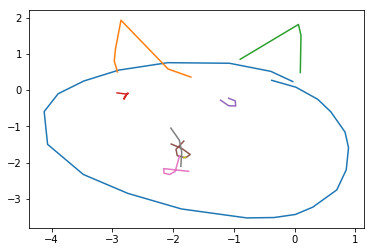

epoch 9601 in 0.175 s: loss = -0.1296, LR = -0.1528, LKL = 0.0232
epoch 9602 in 0.175 s: loss = -0.1562, LR = -0.1795, LKL = 0.0233
epoch 9603 in 0.174 s: loss = -0.1277, LR = -0.1509, LKL = 0.0232
epoch 9604 in 0.175 s: loss = -0.1088, LR = -0.1322, LKL = 0.0233
epoch 9605 in 0.182 s: loss = -0.1481, LR = -0.1714, LKL = 0.0233
epoch 9606 in 0.175 s: loss = -0.1484, LR = -0.1716, LKL = 0.0233
epoch 9607 in 0.176 s: loss = -0.1060, LR = -0.1293, LKL = 0.0233
epoch 9608 in 0.176 s: loss = -0.1896, LR = -0.2128, LKL = 0.0233
epoch 9609 in 0.175 s: loss = -0.1498, LR = -0.1731, LKL = 0.0233
epoch 9610 in 0.176 s: loss = -0.1358, LR = -0.1591, LKL = 0.0233
epoch 9611 in 0.177 s: loss = -0.1528, LR = -0.1761, LKL = 0.0233
epoch 9612 in 0.176 s: loss = -0.2035, LR = -0.2268, LKL = 0.0233
epoch 9613 in 0.175 s: loss = -0.1294, LR = -0.1526, LKL = 0.0232
epoch 9614 in 0.178 s: loss = -0.1064, LR = -0.1296, LKL = 0.0232
epoch 9615 in 0.179 s: loss = -0.1591, LR = -0.1824, LKL = 0.0232
epoch 9616

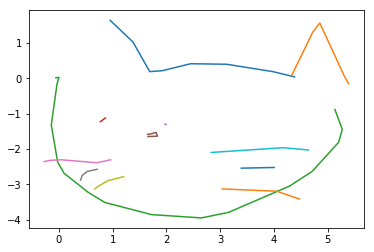

epoch 9701 in 0.174 s: loss = -0.1744, LR = -0.1978, LKL = 0.0235
epoch 9702 in 0.174 s: loss = -0.1657, LR = -0.1893, LKL = 0.0236
epoch 9703 in 0.175 s: loss = -0.2100, LR = -0.2337, LKL = 0.0237
epoch 9704 in 0.176 s: loss = -0.1541, LR = -0.1776, LKL = 0.0235
epoch 9705 in 0.176 s: loss = -0.0300, LR = -0.0534, LKL = 0.0234
epoch 9706 in 0.176 s: loss = -0.1428, LR = -0.1662, LKL = 0.0234
epoch 9707 in 0.177 s: loss = -0.1518, LR = -0.1752, LKL = 0.0235
epoch 9708 in 0.174 s: loss = -0.0883, LR = -0.1118, LKL = 0.0235
epoch 9709 in 0.175 s: loss = -0.0606, LR = -0.0840, LKL = 0.0234
epoch 9710 in 0.173 s: loss = -0.1080, LR = -0.1315, LKL = 0.0235
epoch 9711 in 0.175 s: loss = -0.1732, LR = -0.1968, LKL = 0.0236
epoch 9712 in 0.175 s: loss = -0.1760, LR = -0.1995, LKL = 0.0236
epoch 9713 in 0.179 s: loss = -0.0972, LR = -0.1206, LKL = 0.0234
epoch 9714 in 0.175 s: loss = -0.1203, LR = -0.1438, LKL = 0.0235
epoch 9715 in 0.177 s: loss = -0.0812, LR = -0.1047, LKL = 0.0235
epoch 9716

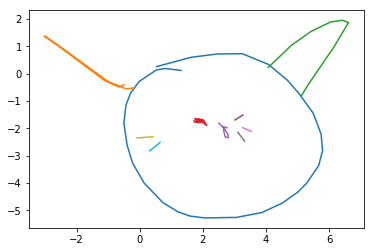

epoch 9801 in 0.175 s: loss = -0.0802, LR = -0.1035, LKL = 0.0233
epoch 9802 in 0.175 s: loss = -0.1287, LR = -0.1522, LKL = 0.0235
epoch 9803 in 0.177 s: loss = -0.0669, LR = -0.0903, LKL = 0.0235
epoch 9804 in 0.175 s: loss = -0.1175, LR = -0.1409, LKL = 0.0235
epoch 9805 in 0.178 s: loss = -0.1462, LR = -0.1697, LKL = 0.0235
epoch 9806 in 0.175 s: loss = -0.0821, LR = -0.1055, LKL = 0.0234
epoch 9807 in 0.179 s: loss = -0.0657, LR = -0.0890, LKL = 0.0233
epoch 9808 in 0.174 s: loss = -0.2246, LR = -0.2481, LKL = 0.0235
epoch 9809 in 0.176 s: loss = -0.1590, LR = -0.1824, LKL = 0.0234
epoch 9810 in 0.173 s: loss = -0.0557, LR = -0.0790, LKL = 0.0233
epoch 9811 in 0.175 s: loss = -0.1227, LR = -0.1461, LKL = 0.0234
epoch 9812 in 0.174 s: loss = -0.1281, LR = -0.1515, LKL = 0.0235
epoch 9813 in 0.175 s: loss = -0.1689, LR = -0.1925, LKL = 0.0235
epoch 9814 in 0.175 s: loss = -0.1103, LR = -0.1337, LKL = 0.0234
epoch 9815 in 0.176 s: loss = -0.1318, LR = -0.1552, LKL = 0.0234
epoch 9816

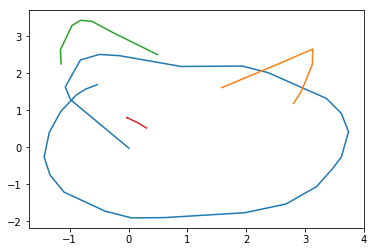

epoch 9901 in 0.175 s: loss = -0.0886, LR = -0.1119, LKL = 0.0233
epoch 9902 in 0.177 s: loss = -0.1027, LR = -0.1262, LKL = 0.0235
epoch 9903 in 0.175 s: loss = -0.1117, LR = -0.1353, LKL = 0.0236
epoch 9904 in 0.174 s: loss = -0.1466, LR = -0.1701, LKL = 0.0235
epoch 9905 in 0.171 s: loss = -0.1526, LR = -0.1761, LKL = 0.0235
epoch 9906 in 0.175 s: loss = -0.0986, LR = -0.1221, LKL = 0.0234
epoch 9907 in 0.176 s: loss = -0.0967, LR = -0.1200, LKL = 0.0234
epoch 9908 in 0.175 s: loss = -0.1524, LR = -0.1760, LKL = 0.0236
epoch 9909 in 0.173 s: loss = -0.1245, LR = -0.1479, LKL = 0.0233
epoch 9910 in 0.175 s: loss = -0.1885, LR = -0.2121, LKL = 0.0236
epoch 9911 in 0.178 s: loss = -0.1621, LR = -0.1854, LKL = 0.0234
epoch 9912 in 0.179 s: loss = -0.2321, LR = -0.2556, LKL = 0.0236
epoch 9913 in 0.175 s: loss = -0.1107, LR = -0.1341, LKL = 0.0234
epoch 9914 in 0.176 s: loss = -0.1611, LR = -0.1845, LKL = 0.0235
epoch 9915 in 0.177 s: loss = -0.1451, LR = -0.1684, LKL = 0.0234
epoch 9916

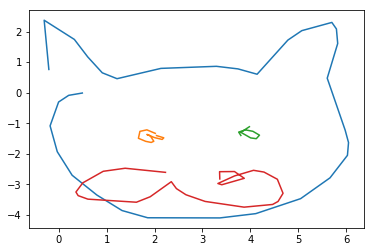

epoch 10001 in 0.179 s: loss = -0.1675, LR = -0.1909, LKL = 0.0234
epoch 10002 in 0.176 s: loss = -0.1397, LR = -0.1631, LKL = 0.0234
epoch 10003 in 0.176 s: loss = -0.1138, LR = -0.1372, LKL = 0.0234
epoch 10004 in 0.175 s: loss = -0.1618, LR = -0.1853, LKL = 0.0235
epoch 10005 in 0.175 s: loss = -0.1384, LR = -0.1619, LKL = 0.0235
epoch 10006 in 0.172 s: loss = -0.1837, LR = -0.2072, LKL = 0.0235
epoch 10007 in 0.176 s: loss = -0.2136, LR = -0.2371, LKL = 0.0235
epoch 10008 in 0.175 s: loss = -0.1336, LR = -0.1571, LKL = 0.0235
epoch 10009 in 0.176 s: loss = -0.1160, LR = -0.1394, LKL = 0.0234
epoch 10010 in 0.175 s: loss = -0.1656, LR = -0.1889, LKL = 0.0234
epoch 10011 in 0.179 s: loss = -0.1566, LR = -0.1801, LKL = 0.0235
epoch 10012 in 0.176 s: loss = -0.0940, LR = -0.1173, LKL = 0.0233
epoch 10013 in 0.178 s: loss = -0.0919, LR = -0.1153, LKL = 0.0233
epoch 10014 in 0.175 s: loss = -0.1368, LR = -0.1603, LKL = 0.0235
epoch 10015 in 0.177 s: loss = -0.1455, LR = -0.1691, LKL = 0.

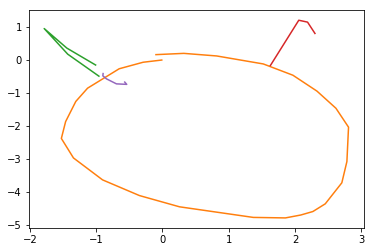

epoch 10101 in 0.178 s: loss = -0.1421, LR = -0.1658, LKL = 0.0238
epoch 10102 in 0.176 s: loss = -0.1883, LR = -0.2120, LKL = 0.0237
epoch 10103 in 0.179 s: loss = -0.1493, LR = -0.1730, LKL = 0.0237
epoch 10104 in 0.174 s: loss = -0.2178, LR = -0.2415, LKL = 0.0237
epoch 10105 in 0.175 s: loss = -0.1816, LR = -0.2053, LKL = 0.0237
epoch 10106 in 0.177 s: loss = -0.1907, LR = -0.2144, LKL = 0.0237
epoch 10107 in 0.180 s: loss = -0.1762, LR = -0.1999, LKL = 0.0237
epoch 10108 in 0.177 s: loss = -0.1643, LR = -0.1879, LKL = 0.0236
epoch 10109 in 0.176 s: loss = -0.1656, LR = -0.1893, LKL = 0.0237
epoch 10110 in 0.176 s: loss = -0.1785, LR = -0.2022, LKL = 0.0237
epoch 10111 in 0.179 s: loss = -0.2220, LR = -0.2458, LKL = 0.0238
epoch 10112 in 0.177 s: loss = -0.1748, LR = -0.1986, LKL = 0.0237
epoch 10113 in 0.180 s: loss = -0.1117, LR = -0.1355, LKL = 0.0237
epoch 10114 in 0.180 s: loss = -0.2539, LR = -0.2779, LKL = 0.0239
epoch 10115 in 0.178 s: loss = -0.1604, LR = -0.1840, LKL = 0.

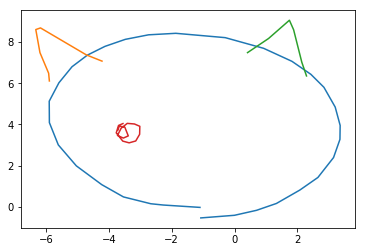

epoch 10201 in 0.175 s: loss = -0.1200, LR = -0.1439, LKL = 0.0239
epoch 10202 in 0.175 s: loss = -0.0981, LR = -0.1217, LKL = 0.0236
epoch 10203 in 0.179 s: loss = -0.1055, LR = -0.1294, LKL = 0.0239
epoch 10204 in 0.175 s: loss = -0.1524, LR = -0.1762, LKL = 0.0237
epoch 10205 in 0.178 s: loss = -0.0789, LR = -0.1027, LKL = 0.0238
epoch 10206 in 0.176 s: loss = -0.0825, LR = -0.1064, LKL = 0.0238
epoch 10207 in 0.176 s: loss = -0.1602, LR = -0.1842, LKL = 0.0239
epoch 10208 in 0.175 s: loss = -0.1723, LR = -0.1961, LKL = 0.0237
epoch 10209 in 0.176 s: loss = -0.1340, LR = -0.1578, LKL = 0.0238
epoch 10210 in 0.177 s: loss = -0.1359, LR = -0.1597, LKL = 0.0238
epoch 10211 in 0.177 s: loss = -0.1250, LR = -0.1489, LKL = 0.0239
epoch 10212 in 0.177 s: loss = -0.1626, LR = -0.1865, LKL = 0.0239
epoch 10213 in 0.177 s: loss = -0.1592, LR = -0.1831, LKL = 0.0239
epoch 10214 in 0.176 s: loss = -0.1740, LR = -0.1979, LKL = 0.0239
epoch 10215 in 0.177 s: loss = -0.1630, LR = -0.1866, LKL = 0.

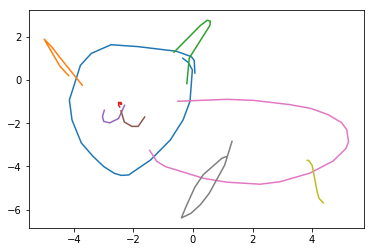

epoch 10301 in 0.177 s: loss = -0.1799, LR = -0.2039, LKL = 0.0240
epoch 10302 in 0.173 s: loss = -0.1276, LR = -0.1513, LKL = 0.0238
epoch 10303 in 0.177 s: loss = -0.2039, LR = -0.2277, LKL = 0.0238
epoch 10304 in 0.175 s: loss = -0.1921, LR = -0.2160, LKL = 0.0239
epoch 10305 in 0.177 s: loss = -0.1032, LR = -0.1269, LKL = 0.0237
epoch 10306 in 0.179 s: loss = -0.1482, LR = -0.1719, LKL = 0.0237
epoch 10307 in 0.176 s: loss = -0.1196, LR = -0.1434, LKL = 0.0238
epoch 10308 in 0.177 s: loss = -0.1343, LR = -0.1582, LKL = 0.0239
epoch 10309 in 0.179 s: loss = -0.1003, LR = -0.1241, LKL = 0.0237
epoch 10310 in 0.175 s: loss = -0.1165, LR = -0.1400, LKL = 0.0236
epoch 10311 in 0.179 s: loss = -0.1803, LR = -0.2042, LKL = 0.0239
epoch 10312 in 0.173 s: loss = -0.1242, LR = -0.1480, LKL = 0.0237
epoch 10313 in 0.180 s: loss = -0.2056, LR = -0.2294, LKL = 0.0239
epoch 10314 in 0.177 s: loss = -0.1574, LR = -0.1811, LKL = 0.0237
epoch 10315 in 0.175 s: loss = -0.1481, LR = -0.1718, LKL = 0.

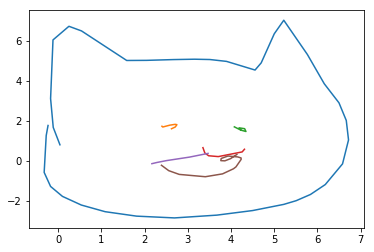

epoch 10401 in 0.172 s: loss = -0.1436, LR = -0.1675, LKL = 0.0239
epoch 10402 in 0.173 s: loss = -0.1585, LR = -0.1824, LKL = 0.0239
epoch 10403 in 0.174 s: loss = -0.1151, LR = -0.1389, LKL = 0.0238
epoch 10404 in 0.173 s: loss = -0.1562, LR = -0.1801, LKL = 0.0239
epoch 10405 in 0.172 s: loss = -0.2035, LR = -0.2276, LKL = 0.0241
epoch 10406 in 0.173 s: loss = -0.1514, LR = -0.1754, LKL = 0.0240
epoch 10407 in 0.177 s: loss = -0.2036, LR = -0.2275, LKL = 0.0239
epoch 10408 in 0.174 s: loss = -0.1794, LR = -0.2033, LKL = 0.0240
epoch 10409 in 0.175 s: loss = -0.1578, LR = -0.1819, LKL = 0.0241
epoch 10410 in 0.174 s: loss = -0.1213, LR = -0.1451, LKL = 0.0239
epoch 10411 in 0.175 s: loss = -0.1999, LR = -0.2239, LKL = 0.0240
epoch 10412 in 0.171 s: loss = -0.1612, LR = -0.1852, LKL = 0.0240
epoch 10413 in 0.174 s: loss = -0.1933, LR = -0.2174, LKL = 0.0241
epoch 10414 in 0.171 s: loss = -0.1274, LR = -0.1515, LKL = 0.0241
epoch 10415 in 0.171 s: loss = -0.2049, LR = -0.2290, LKL = 0.

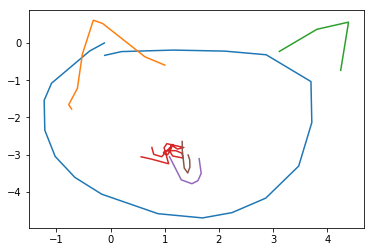

epoch 10501 in 0.178 s: loss = -0.1792, LR = -0.2032, LKL = 0.0240
epoch 10502 in 0.174 s: loss = -0.1218, LR = -0.1457, LKL = 0.0240
epoch 10503 in 0.176 s: loss = -0.1201, LR = -0.1441, LKL = 0.0240
epoch 10504 in 0.178 s: loss = -0.1037, LR = -0.1275, LKL = 0.0238
epoch 10505 in 0.175 s: loss = -0.0844, LR = -0.1084, LKL = 0.0240
epoch 10506 in 0.173 s: loss = -0.1548, LR = -0.1789, LKL = 0.0241
epoch 10507 in 0.172 s: loss = -0.1144, LR = -0.1384, LKL = 0.0240
epoch 10508 in 0.174 s: loss = -0.1776, LR = -0.2015, LKL = 0.0239
epoch 10509 in 0.175 s: loss = -0.1400, LR = -0.1640, LKL = 0.0240
epoch 10510 in 0.177 s: loss = -0.1427, LR = -0.1666, LKL = 0.0239
epoch 10511 in 0.178 s: loss = -0.1613, LR = -0.1853, LKL = 0.0240
epoch 10512 in 0.175 s: loss = -0.0808, LR = -0.1047, LKL = 0.0239
epoch 10513 in 0.174 s: loss = -0.1891, LR = -0.2131, LKL = 0.0240
epoch 10514 in 0.174 s: loss = -0.2224, LR = -0.2465, LKL = 0.0242
epoch 10515 in 0.174 s: loss = -0.1585, LR = -0.1826, LKL = 0.

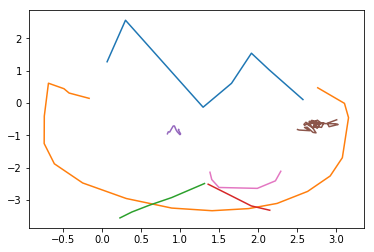

epoch 10601 in 0.175 s: loss = -0.1642, LR = -0.1881, LKL = 0.0239
epoch 10602 in 0.173 s: loss = -0.1714, LR = -0.1953, LKL = 0.0239
epoch 10603 in 0.175 s: loss = -0.1636, LR = -0.1875, LKL = 0.0238
epoch 10604 in 0.174 s: loss = -0.1149, LR = -0.1387, LKL = 0.0238
epoch 10605 in 0.178 s: loss = -0.1409, LR = -0.1649, LKL = 0.0240
epoch 10606 in 0.175 s: loss = -0.2029, LR = -0.2270, LKL = 0.0241
epoch 10607 in 0.177 s: loss = -0.1476, LR = -0.1716, LKL = 0.0240
epoch 10608 in 0.175 s: loss = -0.1818, LR = -0.2058, LKL = 0.0240
epoch 10609 in 0.175 s: loss = -0.1907, LR = -0.2145, LKL = 0.0239
epoch 10610 in 0.175 s: loss = -0.1548, LR = -0.1787, LKL = 0.0239
epoch 10611 in 0.174 s: loss = -0.1773, LR = -0.2012, LKL = 0.0239
epoch 10612 in 0.175 s: loss = -0.2029, LR = -0.2268, LKL = 0.0239
epoch 10613 in 0.174 s: loss = -0.1452, LR = -0.1691, LKL = 0.0239
epoch 10614 in 0.172 s: loss = -0.1479, LR = -0.1717, LKL = 0.0238
epoch 10615 in 0.175 s: loss = -0.2230, LR = -0.2469, LKL = 0.

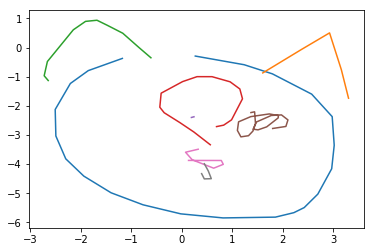

epoch 10701 in 0.175 s: loss = -0.1287, LR = -0.1527, LKL = 0.0240
epoch 10702 in 0.171 s: loss = -0.1600, LR = -0.1840, LKL = 0.0240
epoch 10703 in 0.174 s: loss = -0.1975, LR = -0.2216, LKL = 0.0241
epoch 10704 in 0.173 s: loss = -0.1909, LR = -0.2150, LKL = 0.0241
epoch 10705 in 0.176 s: loss = -0.2326, LR = -0.2569, LKL = 0.0242
epoch 10706 in 0.175 s: loss = -0.1623, LR = -0.1865, LKL = 0.0242
epoch 10707 in 0.178 s: loss = -0.1290, LR = -0.1531, LKL = 0.0242
epoch 10708 in 0.175 s: loss = -0.1279, LR = -0.1521, LKL = 0.0242
epoch 10709 in 0.176 s: loss = -0.0976, LR = -0.1216, LKL = 0.0239
epoch 10710 in 0.175 s: loss = -0.1612, LR = -0.1851, LKL = 0.0239
epoch 10711 in 0.177 s: loss = -0.1171, LR = -0.1412, LKL = 0.0241
epoch 10712 in 0.178 s: loss = -0.1663, LR = -0.1905, LKL = 0.0241
epoch 10713 in 0.174 s: loss = -0.1686, LR = -0.1927, LKL = 0.0241
epoch 10714 in 0.173 s: loss = -0.1333, LR = -0.1573, LKL = 0.0241
epoch 10715 in 0.176 s: loss = -0.1354, LR = -0.1595, LKL = 0.

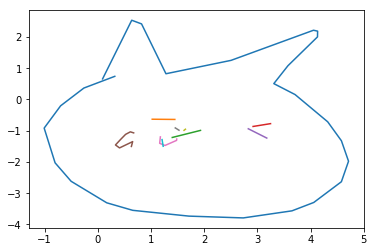

epoch 10801 in 0.174 s: loss = -0.1238, LR = -0.1481, LKL = 0.0242
epoch 10802 in 0.169 s: loss = -0.1547, LR = -0.1791, LKL = 0.0244
epoch 10803 in 0.173 s: loss = -0.1307, LR = -0.1550, LKL = 0.0242
epoch 10804 in 0.176 s: loss = -0.2058, LR = -0.2300, LKL = 0.0242
epoch 10805 in 0.176 s: loss = -0.1335, LR = -0.1576, LKL = 0.0242
epoch 10806 in 0.179 s: loss = -0.1595, LR = -0.1838, LKL = 0.0243
epoch 10807 in 0.174 s: loss = -0.1654, LR = -0.1896, LKL = 0.0242
epoch 10808 in 0.176 s: loss = -0.1459, LR = -0.1700, LKL = 0.0241
epoch 10809 in 0.175 s: loss = -0.2081, LR = -0.2325, LKL = 0.0244
epoch 10810 in 0.175 s: loss = -0.1947, LR = -0.2190, LKL = 0.0243
epoch 10811 in 0.173 s: loss = -0.1913, LR = -0.2156, LKL = 0.0243
epoch 10812 in 0.174 s: loss = -0.1521, LR = -0.1764, LKL = 0.0242
epoch 10813 in 0.172 s: loss = -0.2372, LR = -0.2615, LKL = 0.0243
epoch 10814 in 0.175 s: loss = -0.1454, LR = -0.1697, LKL = 0.0242
epoch 10815 in 0.174 s: loss = -0.1277, LR = -0.1518, LKL = 0.

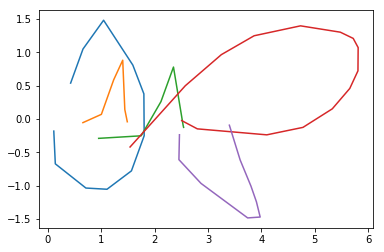

epoch 10901 in 0.176 s: loss = -0.1468, LR = -0.1708, LKL = 0.0240
epoch 10902 in 0.175 s: loss = -0.2356, LR = -0.2598, LKL = 0.0242
epoch 10903 in 0.176 s: loss = -0.1836, LR = -0.2078, LKL = 0.0241
epoch 10904 in 0.173 s: loss = -0.0810, LR = -0.1050, LKL = 0.0240
epoch 10905 in 0.174 s: loss = -0.1982, LR = -0.2223, LKL = 0.0241
epoch 10906 in 0.176 s: loss = -0.1656, LR = -0.1898, LKL = 0.0242
epoch 10907 in 0.176 s: loss = -0.1637, LR = -0.1877, LKL = 0.0240
epoch 10908 in 0.174 s: loss = -0.1634, LR = -0.1873, LKL = 0.0239
epoch 10909 in 0.176 s: loss = -0.1974, LR = -0.2215, LKL = 0.0241
epoch 10910 in 0.176 s: loss = -0.1412, LR = -0.1653, LKL = 0.0241
epoch 10911 in 0.177 s: loss = -0.2170, LR = -0.2413, LKL = 0.0243
epoch 10912 in 0.176 s: loss = -0.1317, LR = -0.1559, LKL = 0.0241
epoch 10913 in 0.175 s: loss = -0.1982, LR = -0.2224, LKL = 0.0241
epoch 10914 in 0.176 s: loss = -0.1490, LR = -0.1731, LKL = 0.0241
epoch 10915 in 0.176 s: loss = -0.1026, LR = -0.1268, LKL = 0.

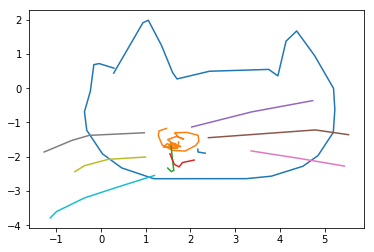

epoch 11001 in 0.179 s: loss = -0.1800, LR = -0.2041, LKL = 0.0242
epoch 11002 in 0.178 s: loss = -0.1916, LR = -0.2157, LKL = 0.0241
epoch 11003 in 0.175 s: loss = -0.1868, LR = -0.2107, LKL = 0.0240
epoch 11004 in 0.178 s: loss = -0.2008, LR = -0.2249, LKL = 0.0242
epoch 11005 in 0.175 s: loss = -0.1234, LR = -0.1472, LKL = 0.0239
epoch 11006 in 0.175 s: loss = -0.1539, LR = -0.1781, LKL = 0.0242
epoch 11007 in 0.177 s: loss = -0.0991, LR = -0.1231, LKL = 0.0241
epoch 11008 in 0.182 s: loss = -0.1713, LR = -0.1954, LKL = 0.0242
epoch 11009 in 0.179 s: loss = -0.1313, LR = -0.1555, LKL = 0.0242
epoch 11010 in 0.173 s: loss = -0.1027, LR = -0.1268, LKL = 0.0241
epoch 11011 in 0.177 s: loss = -0.2129, LR = -0.2372, LKL = 0.0242
epoch 11012 in 0.180 s: loss = -0.1924, LR = -0.2165, LKL = 0.0242
epoch 11013 in 0.175 s: loss = -0.1348, LR = -0.1588, LKL = 0.0240
epoch 11014 in 0.176 s: loss = -0.1834, LR = -0.2075, LKL = 0.0242
epoch 11015 in 0.178 s: loss = -0.1957, LR = -0.2198, LKL = 0.

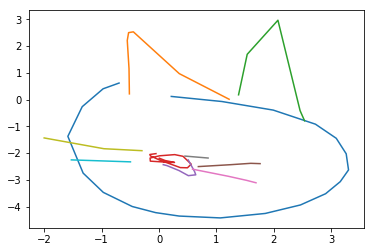

epoch 11101 in 0.175 s: loss = -0.1926, LR = -0.2169, LKL = 0.0243
epoch 11102 in 0.179 s: loss = -0.1288, LR = -0.1532, LKL = 0.0245
epoch 11103 in 0.175 s: loss = -0.1724, LR = -0.1967, LKL = 0.0243
epoch 11104 in 0.176 s: loss = -0.1429, LR = -0.1674, LKL = 0.0245
epoch 11105 in 0.179 s: loss = -0.2195, LR = -0.2440, LKL = 0.0245
epoch 11106 in 0.177 s: loss = -0.1272, LR = -0.1514, LKL = 0.0242
epoch 11107 in 0.179 s: loss = -0.1667, LR = -0.1910, LKL = 0.0243
epoch 11108 in 0.178 s: loss = -0.1997, LR = -0.2240, LKL = 0.0243
epoch 11109 in 0.178 s: loss = -0.1898, LR = -0.2144, LKL = 0.0246
epoch 11110 in 0.176 s: loss = -0.1943, LR = -0.2187, LKL = 0.0244
epoch 11111 in 0.179 s: loss = -0.1870, LR = -0.2114, LKL = 0.0245
epoch 11112 in 0.177 s: loss = -0.1500, LR = -0.1743, LKL = 0.0242
epoch 11113 in 0.177 s: loss = -0.1957, LR = -0.2201, LKL = 0.0244
epoch 11114 in 0.174 s: loss = -0.1985, LR = -0.2229, LKL = 0.0244
epoch 11115 in 0.179 s: loss = -0.1951, LR = -0.2195, LKL = 0.

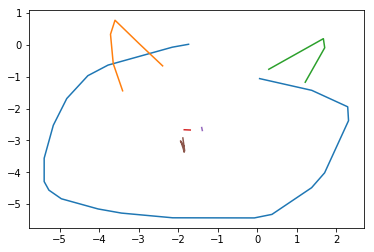

epoch 11201 in 0.173 s: loss = -0.1706, LR = -0.1950, LKL = 0.0244
epoch 11202 in 0.173 s: loss = -0.1883, LR = -0.2127, LKL = 0.0244
epoch 11203 in 0.174 s: loss = -0.1937, LR = -0.2181, LKL = 0.0244
epoch 11204 in 0.177 s: loss = -0.1534, LR = -0.1777, LKL = 0.0243
epoch 11205 in 0.173 s: loss = -0.1431, LR = -0.1675, LKL = 0.0244
epoch 11206 in 0.175 s: loss = -0.1608, LR = -0.1850, LKL = 0.0242
epoch 11207 in 0.171 s: loss = -0.1437, LR = -0.1681, LKL = 0.0244
epoch 11208 in 0.172 s: loss = -0.1156, LR = -0.1398, LKL = 0.0243
epoch 11209 in 0.171 s: loss = -0.0417, LR = -0.0660, LKL = 0.0242
epoch 11210 in 0.174 s: loss = -0.1954, LR = -0.2198, LKL = 0.0244
epoch 11211 in 0.172 s: loss = -0.2394, LR = -0.2638, LKL = 0.0244
epoch 11212 in 0.172 s: loss = -0.1744, LR = -0.1987, LKL = 0.0243
epoch 11213 in 0.172 s: loss = -0.2506, LR = -0.2749, LKL = 0.0243
epoch 11214 in 0.177 s: loss = -0.1549, LR = -0.1793, LKL = 0.0244
epoch 11215 in 0.172 s: loss = -0.1334, LR = -0.1578, LKL = 0.

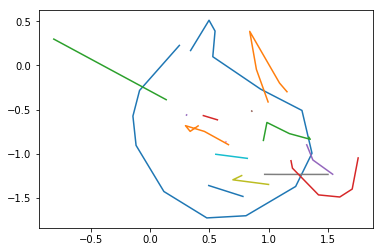

epoch 11301 in 0.177 s: loss = -0.1661, LR = -0.1906, LKL = 0.0245
epoch 11302 in 0.175 s: loss = -0.2071, LR = -0.2315, LKL = 0.0244
epoch 11303 in 0.180 s: loss = -0.2048, LR = -0.2294, LKL = 0.0246
epoch 11304 in 0.178 s: loss = -0.1631, LR = -0.1877, LKL = 0.0246
epoch 11305 in 0.177 s: loss = -0.2185, LR = -0.2430, LKL = 0.0246
epoch 11306 in 0.179 s: loss = -0.1493, LR = -0.1738, LKL = 0.0244
epoch 11307 in 0.176 s: loss = -0.1769, LR = -0.2013, LKL = 0.0244
epoch 11308 in 0.177 s: loss = -0.2246, LR = -0.2491, LKL = 0.0245
epoch 11309 in 0.183 s: loss = -0.2573, LR = -0.2819, LKL = 0.0246
epoch 11310 in 0.175 s: loss = -0.1472, LR = -0.1717, LKL = 0.0245
epoch 11311 in 0.178 s: loss = -0.2084, LR = -0.2330, LKL = 0.0246
epoch 11312 in 0.174 s: loss = -0.1825, LR = -0.2070, LKL = 0.0245
epoch 11313 in 0.176 s: loss = -0.2142, LR = -0.2386, LKL = 0.0244
epoch 11314 in 0.174 s: loss = -0.1066, LR = -0.1310, LKL = 0.0244
epoch 11315 in 0.182 s: loss = -0.1405, LR = -0.1649, LKL = 0.

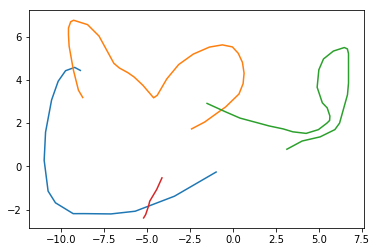

epoch 11401 in 0.174 s: loss = -0.1250, LR = -0.1495, LKL = 0.0246
epoch 11402 in 0.173 s: loss = -0.1685, LR = -0.1930, LKL = 0.0245
epoch 11403 in 0.172 s: loss = -0.1584, LR = -0.1830, LKL = 0.0246
epoch 11404 in 0.172 s: loss = -0.2118, LR = -0.2366, LKL = 0.0248
epoch 11405 in 0.173 s: loss = -0.1541, LR = -0.1787, LKL = 0.0246
epoch 11406 in 0.173 s: loss = -0.1678, LR = -0.1924, LKL = 0.0245
epoch 11407 in 0.176 s: loss = -0.2162, LR = -0.2408, LKL = 0.0247
epoch 11408 in 0.175 s: loss = -0.1521, LR = -0.1766, LKL = 0.0246
epoch 11409 in 0.175 s: loss = -0.0905, LR = -0.1150, LKL = 0.0245
epoch 11410 in 0.173 s: loss = -0.2040, LR = -0.2287, LKL = 0.0248
epoch 11411 in 0.174 s: loss = -0.1502, LR = -0.1747, LKL = 0.0245
epoch 11412 in 0.177 s: loss = -0.2150, LR = -0.2396, LKL = 0.0246
epoch 11413 in 0.175 s: loss = -0.2223, LR = -0.2470, LKL = 0.0247
epoch 11414 in 0.173 s: loss = -0.1660, LR = -0.1906, LKL = 0.0246
epoch 11415 in 0.174 s: loss = -0.2285, LR = -0.2533, LKL = 0.

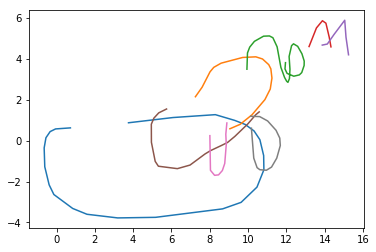

epoch 11501 in 0.173 s: loss = -0.1683, LR = -0.1929, LKL = 0.0246
epoch 11502 in 0.177 s: loss = -0.1638, LR = -0.1885, LKL = 0.0247
epoch 11503 in 0.175 s: loss = -0.1131, LR = -0.1378, LKL = 0.0246
epoch 11504 in 0.175 s: loss = -0.1601, LR = -0.1849, LKL = 0.0248
epoch 11505 in 0.177 s: loss = -0.2008, LR = -0.2255, LKL = 0.0247
epoch 11506 in 0.176 s: loss = -0.1942, LR = -0.2190, LKL = 0.0248
epoch 11507 in 0.174 s: loss = -0.1360, LR = -0.1605, LKL = 0.0245
epoch 11508 in 0.174 s: loss = -0.2611, LR = -0.2860, LKL = 0.0249
epoch 11509 in 0.173 s: loss = -0.1897, LR = -0.2143, LKL = 0.0246
epoch 11510 in 0.176 s: loss = -0.1784, LR = -0.2031, LKL = 0.0247
epoch 11511 in 0.178 s: loss = -0.2129, LR = -0.2376, LKL = 0.0247
epoch 11512 in 0.180 s: loss = -0.1258, LR = -0.1505, LKL = 0.0247
epoch 11513 in 0.176 s: loss = -0.1683, LR = -0.1931, LKL = 0.0247
epoch 11514 in 0.174 s: loss = -0.1881, LR = -0.2129, LKL = 0.0247
epoch 11515 in 0.175 s: loss = -0.1979, LR = -0.2227, LKL = 0.

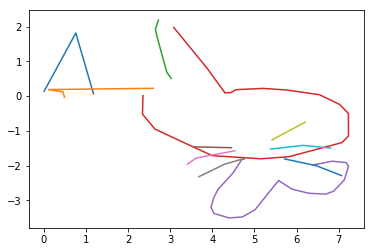

epoch 11601 in 0.175 s: loss = -0.1450, LR = -0.1696, LKL = 0.0247
epoch 11602 in 0.174 s: loss = -0.1340, LR = -0.1587, LKL = 0.0247
epoch 11603 in 0.178 s: loss = -0.1838, LR = -0.2084, LKL = 0.0246
epoch 11604 in 0.179 s: loss = -0.1797, LR = -0.2045, LKL = 0.0247
epoch 11605 in 0.175 s: loss = -0.1520, LR = -0.1768, LKL = 0.0248
epoch 11606 in 0.173 s: loss = -0.1955, LR = -0.2203, LKL = 0.0248
epoch 11607 in 0.175 s: loss = -0.1725, LR = -0.1972, LKL = 0.0247
epoch 11608 in 0.174 s: loss = -0.1823, LR = -0.2068, LKL = 0.0245
epoch 11609 in 0.176 s: loss = -0.2190, LR = -0.2439, LKL = 0.0248
epoch 11610 in 0.176 s: loss = -0.1547, LR = -0.1794, LKL = 0.0247
epoch 11611 in 0.176 s: loss = -0.1762, LR = -0.2010, LKL = 0.0248
epoch 11612 in 0.176 s: loss = -0.1992, LR = -0.2242, LKL = 0.0250
epoch 11613 in 0.176 s: loss = -0.1412, LR = -0.1660, LKL = 0.0247
epoch 11614 in 0.178 s: loss = -0.1284, LR = -0.1530, LKL = 0.0246
epoch 11615 in 0.174 s: loss = -0.1457, LR = -0.1704, LKL = 0.

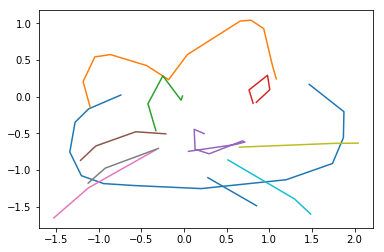

epoch 11701 in 0.177 s: loss = -0.1532, LR = -0.1778, LKL = 0.0247
epoch 11702 in 0.177 s: loss = -0.1680, LR = -0.1926, LKL = 0.0247
epoch 11703 in 0.177 s: loss = -0.1134, LR = -0.1379, LKL = 0.0245
epoch 11704 in 0.180 s: loss = -0.1965, LR = -0.2212, LKL = 0.0247
epoch 11705 in 0.179 s: loss = -0.2479, LR = -0.2727, LKL = 0.0247
epoch 11706 in 0.178 s: loss = -0.1399, LR = -0.1645, LKL = 0.0247
epoch 11707 in 0.178 s: loss = -0.2185, LR = -0.2430, LKL = 0.0245
epoch 11708 in 0.180 s: loss = -0.2389, LR = -0.2637, LKL = 0.0248
epoch 11709 in 0.176 s: loss = -0.1972, LR = -0.2219, LKL = 0.0248
epoch 11710 in 0.171 s: loss = -0.2236, LR = -0.2484, LKL = 0.0248
epoch 11711 in 0.178 s: loss = -0.2474, LR = -0.2721, LKL = 0.0246
epoch 11712 in 0.175 s: loss = -0.2600, LR = -0.2846, LKL = 0.0246
epoch 11713 in 0.176 s: loss = -0.1387, LR = -0.1631, LKL = 0.0245
epoch 11714 in 0.174 s: loss = -0.1815, LR = -0.2062, LKL = 0.0246
epoch 11715 in 0.174 s: loss = -0.1998, LR = -0.2245, LKL = 0.

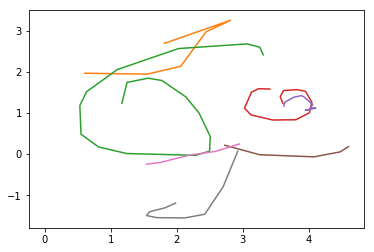

epoch 11801 in 0.176 s: loss = -0.2359, LR = -0.2607, LKL = 0.0248
epoch 11802 in 0.177 s: loss = -0.1647, LR = -0.1893, LKL = 0.0246
epoch 11803 in 0.177 s: loss = -0.2195, LR = -0.2445, LKL = 0.0250
epoch 11804 in 0.173 s: loss = -0.2018, LR = -0.2268, LKL = 0.0250
epoch 11805 in 0.177 s: loss = -0.2230, LR = -0.2479, LKL = 0.0248
epoch 11806 in 0.178 s: loss = -0.2033, LR = -0.2281, LKL = 0.0248
epoch 11807 in 0.175 s: loss = -0.1734, LR = -0.1982, LKL = 0.0248
epoch 11808 in 0.175 s: loss = -0.1958, LR = -0.2207, LKL = 0.0248
epoch 11809 in 0.176 s: loss = -0.2183, LR = -0.2433, LKL = 0.0250
epoch 11810 in 0.177 s: loss = -0.1673, LR = -0.1921, LKL = 0.0248
epoch 11811 in 0.175 s: loss = -0.2573, LR = -0.2822, LKL = 0.0249
epoch 11812 in 0.173 s: loss = -0.1625, LR = -0.1873, LKL = 0.0248
epoch 11813 in 0.178 s: loss = -0.1736, LR = -0.1984, LKL = 0.0248
epoch 11814 in 0.175 s: loss = -0.1416, LR = -0.1662, LKL = 0.0247
epoch 11815 in 0.175 s: loss = -0.2309, LR = -0.2559, LKL = 0.

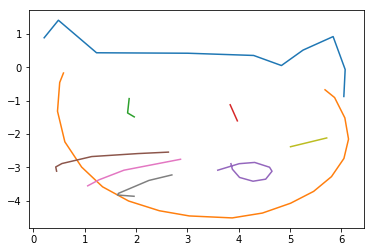

epoch 11901 in 0.173 s: loss = -0.1480, LR = -0.1728, LKL = 0.0248
epoch 11902 in 0.177 s: loss = -0.2352, LR = -0.2600, LKL = 0.0248
epoch 11903 in 0.175 s: loss = -0.2334, LR = -0.2583, LKL = 0.0249
epoch 11904 in 0.172 s: loss = -0.2257, LR = -0.2505, LKL = 0.0249
epoch 11905 in 0.178 s: loss = -0.2226, LR = -0.2473, LKL = 0.0247
epoch 11906 in 0.179 s: loss = -0.1029, LR = -0.1276, LKL = 0.0247
epoch 11907 in 0.177 s: loss = -0.2165, LR = -0.2413, LKL = 0.0249
epoch 11908 in 0.179 s: loss = -0.1572, LR = -0.1820, LKL = 0.0248
epoch 11909 in 0.175 s: loss = -0.1794, LR = -0.2041, LKL = 0.0247
epoch 11910 in 0.175 s: loss = -0.1928, LR = -0.2177, LKL = 0.0249
epoch 11911 in 0.177 s: loss = -0.2135, LR = -0.2382, LKL = 0.0247
epoch 11912 in 0.179 s: loss = -0.1708, LR = -0.1956, LKL = 0.0248
epoch 11913 in 0.176 s: loss = -0.1551, LR = -0.1799, LKL = 0.0248
epoch 11914 in 0.175 s: loss = -0.2194, LR = -0.2444, LKL = 0.0250
epoch 11915 in 0.176 s: loss = -0.1732, LR = -0.1979, LKL = 0.

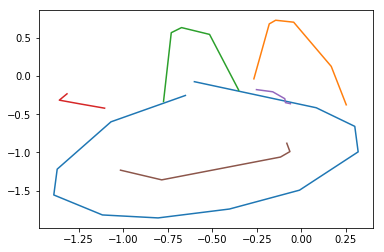

epoch 12001 in 0.176 s: loss = -0.1835, LR = -0.2085, LKL = 0.0249
epoch 12002 in 0.173 s: loss = -0.1575, LR = -0.1824, LKL = 0.0249
epoch 12003 in 0.175 s: loss = -0.1612, LR = -0.1863, LKL = 0.0250
epoch 12004 in 0.176 s: loss = -0.2185, LR = -0.2435, LKL = 0.0250
epoch 12005 in 0.178 s: loss = -0.2237, LR = -0.2488, LKL = 0.0250
epoch 12006 in 0.177 s: loss = -0.2347, LR = -0.2597, LKL = 0.0251
epoch 12007 in 0.177 s: loss = -0.1692, LR = -0.1942, LKL = 0.0249
epoch 12008 in 0.175 s: loss = -0.2261, LR = -0.2512, LKL = 0.0251
epoch 12009 in 0.177 s: loss = -0.1520, LR = -0.1771, LKL = 0.0251
epoch 12010 in 0.173 s: loss = -0.2008, LR = -0.2258, LKL = 0.0250
epoch 12011 in 0.177 s: loss = -0.1535, LR = -0.1785, LKL = 0.0249
epoch 12012 in 0.174 s: loss = -0.1883, LR = -0.2134, LKL = 0.0251
epoch 12013 in 0.176 s: loss = -0.1111, LR = -0.1360, LKL = 0.0249
epoch 12014 in 0.175 s: loss = -0.1971, LR = -0.2221, LKL = 0.0250
epoch 12015 in 0.177 s: loss = -0.1413, LR = -0.1664, LKL = 0.

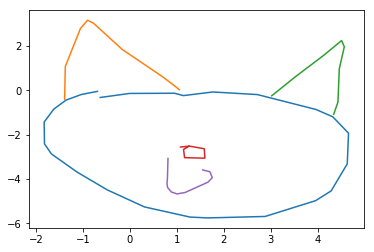

epoch 12101 in 0.175 s: loss = -0.1947, LR = -0.2198, LKL = 0.0251
epoch 12102 in 0.172 s: loss = -0.1576, LR = -0.1825, LKL = 0.0249
epoch 12103 in 0.175 s: loss = -0.1762, LR = -0.2013, LKL = 0.0251
epoch 12104 in 0.176 s: loss = -0.1375, LR = -0.1625, LKL = 0.0250
epoch 12105 in 0.178 s: loss = -0.1971, LR = -0.2222, LKL = 0.0250
epoch 12106 in 0.177 s: loss = -0.1854, LR = -0.2106, LKL = 0.0252
epoch 12107 in 0.180 s: loss = -0.2206, LR = -0.2457, LKL = 0.0251
epoch 12108 in 0.175 s: loss = -0.1522, LR = -0.1772, LKL = 0.0249
epoch 12109 in 0.177 s: loss = -0.1848, LR = -0.2098, LKL = 0.0250
epoch 12110 in 0.175 s: loss = -0.2546, LR = -0.2798, LKL = 0.0252
epoch 12111 in 0.177 s: loss = -0.2065, LR = -0.2317, LKL = 0.0251
epoch 12112 in 0.177 s: loss = -0.1904, LR = -0.2155, LKL = 0.0251
epoch 12113 in 0.175 s: loss = -0.1717, LR = -0.1967, LKL = 0.0250
epoch 12114 in 0.172 s: loss = -0.2310, LR = -0.2559, LKL = 0.0249
epoch 12115 in 0.176 s: loss = -0.2163, LR = -0.2414, LKL = 0.

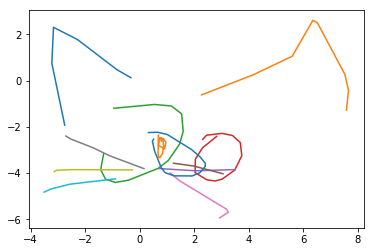

epoch 12201 in 0.175 s: loss = -0.1677, LR = -0.1928, LKL = 0.0251
epoch 12202 in 0.176 s: loss = -0.2334, LR = -0.2585, LKL = 0.0251
epoch 12203 in 0.178 s: loss = -0.2137, LR = -0.2388, LKL = 0.0251
epoch 12204 in 0.174 s: loss = -0.1933, LR = -0.2184, LKL = 0.0251
epoch 12205 in 0.177 s: loss = -0.1883, LR = -0.2134, LKL = 0.0251
epoch 12206 in 0.176 s: loss = -0.2053, LR = -0.2305, LKL = 0.0252
epoch 12207 in 0.176 s: loss = -0.1995, LR = -0.2246, LKL = 0.0251
epoch 12208 in 0.177 s: loss = -0.2340, LR = -0.2592, LKL = 0.0252
epoch 12209 in 0.174 s: loss = -0.2158, LR = -0.2410, LKL = 0.0252
epoch 12210 in 0.172 s: loss = -0.1684, LR = -0.1935, LKL = 0.0251
epoch 12211 in 0.174 s: loss = -0.2014, LR = -0.2265, LKL = 0.0251
epoch 12212 in 0.173 s: loss = -0.2053, LR = -0.2305, LKL = 0.0251
epoch 12213 in 0.173 s: loss = -0.2891, LR = -0.3144, LKL = 0.0253
epoch 12214 in 0.173 s: loss = -0.3147, LR = -0.3399, LKL = 0.0253
epoch 12215 in 0.180 s: loss = -0.1979, LR = -0.2232, LKL = 0.

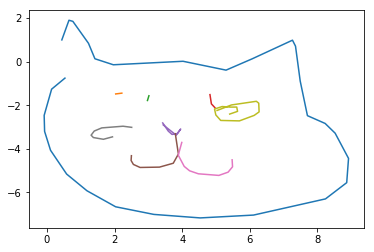

epoch 12301 in 0.176 s: loss = -0.2283, LR = -0.2533, LKL = 0.0250
epoch 12302 in 0.177 s: loss = -0.1837, LR = -0.2086, LKL = 0.0249
epoch 12303 in 0.177 s: loss = -0.1432, LR = -0.1680, LKL = 0.0248
epoch 12304 in 0.178 s: loss = -0.2044, LR = -0.2293, LKL = 0.0249
epoch 12305 in 0.178 s: loss = -0.2342, LR = -0.2592, LKL = 0.0250
epoch 12306 in 0.175 s: loss = -0.2195, LR = -0.2445, LKL = 0.0249
epoch 12307 in 0.176 s: loss = -0.2315, LR = -0.2565, LKL = 0.0250
epoch 12308 in 0.176 s: loss = -0.2151, LR = -0.2399, LKL = 0.0249
epoch 12309 in 0.177 s: loss = -0.2063, LR = -0.2312, LKL = 0.0249
epoch 12310 in 0.177 s: loss = -0.2553, LR = -0.2802, LKL = 0.0250
epoch 12311 in 0.178 s: loss = -0.1726, LR = -0.1976, LKL = 0.0250
epoch 12312 in 0.176 s: loss = -0.2141, LR = -0.2392, LKL = 0.0251
epoch 12313 in 0.176 s: loss = -0.2186, LR = -0.2436, LKL = 0.0250
epoch 12314 in 0.176 s: loss = -0.2171, LR = -0.2419, LKL = 0.0249
epoch 12315 in 0.177 s: loss = -0.2125, LR = -0.2377, LKL = 0.

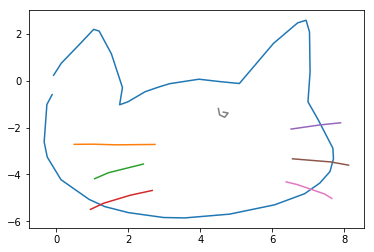

epoch 12401 in 0.175 s: loss = -0.2240, LR = -0.2492, LKL = 0.0252
epoch 12402 in 0.179 s: loss = -0.1725, LR = -0.1975, LKL = 0.0250
epoch 12403 in 0.174 s: loss = -0.1900, LR = -0.2152, LKL = 0.0252
epoch 12404 in 0.172 s: loss = -0.2116, LR = -0.2368, LKL = 0.0252
epoch 12405 in 0.177 s: loss = -0.1932, LR = -0.2184, LKL = 0.0252
epoch 12406 in 0.178 s: loss = -0.1887, LR = -0.2139, LKL = 0.0252
epoch 12407 in 0.177 s: loss = -0.2422, LR = -0.2673, LKL = 0.0251
epoch 12408 in 0.174 s: loss = -0.2384, LR = -0.2635, LKL = 0.0251
epoch 12409 in 0.175 s: loss = -0.1451, LR = -0.1701, LKL = 0.0250
epoch 12410 in 0.177 s: loss = -0.1791, LR = -0.2042, LKL = 0.0251
epoch 12411 in 0.176 s: loss = -0.1369, LR = -0.1620, LKL = 0.0251
epoch 12412 in 0.180 s: loss = -0.1439, LR = -0.1689, LKL = 0.0250
epoch 12413 in 0.176 s: loss = -0.2329, LR = -0.2581, LKL = 0.0252
epoch 12414 in 0.176 s: loss = -0.1295, LR = -0.1547, LKL = 0.0252
epoch 12415 in 0.181 s: loss = -0.1811, LR = -0.2061, LKL = 0.

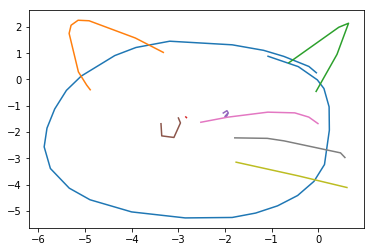

epoch 12501 in 0.175 s: loss = -0.2195, LR = -0.2446, LKL = 0.0251
epoch 12502 in 0.178 s: loss = -0.2033, LR = -0.2285, LKL = 0.0253
epoch 12503 in 0.177 s: loss = -0.1892, LR = -0.2144, LKL = 0.0252
epoch 12504 in 0.178 s: loss = -0.1899, LR = -0.2149, LKL = 0.0250
epoch 12505 in 0.178 s: loss = -0.1965, LR = -0.2215, LKL = 0.0251
epoch 12506 in 0.172 s: loss = -0.1898, LR = -0.2149, LKL = 0.0252
epoch 12507 in 0.175 s: loss = -0.1825, LR = -0.2077, LKL = 0.0252
epoch 12508 in 0.177 s: loss = -0.2193, LR = -0.2446, LKL = 0.0253
epoch 12509 in 0.174 s: loss = -0.1852, LR = -0.2104, LKL = 0.0252
epoch 12510 in 0.170 s: loss = -0.2129, LR = -0.2379, LKL = 0.0250
epoch 12511 in 0.173 s: loss = -0.1572, LR = -0.1825, LKL = 0.0253
epoch 12512 in 0.176 s: loss = -0.2180, LR = -0.2432, LKL = 0.0252
epoch 12513 in 0.175 s: loss = -0.1859, LR = -0.2111, LKL = 0.0252
epoch 12514 in 0.176 s: loss = -0.2390, LR = -0.2643, LKL = 0.0254
epoch 12515 in 0.176 s: loss = -0.1785, LR = -0.2037, LKL = 0.

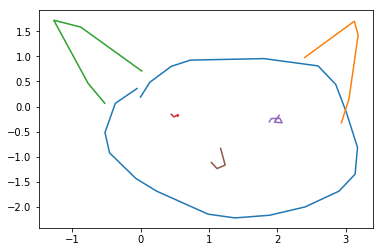

epoch 12601 in 0.174 s: loss = -0.2453, LR = -0.2709, LKL = 0.0256
epoch 12602 in 0.175 s: loss = -0.2232, LR = -0.2487, LKL = 0.0255
epoch 12603 in 0.174 s: loss = -0.2270, LR = -0.2526, LKL = 0.0256
epoch 12604 in 0.173 s: loss = -0.1589, LR = -0.1844, LKL = 0.0255
epoch 12605 in 0.173 s: loss = -0.2579, LR = -0.2834, LKL = 0.0255
epoch 12606 in 0.178 s: loss = -0.1753, LR = -0.2006, LKL = 0.0253
epoch 12607 in 0.175 s: loss = -0.2585, LR = -0.2839, LKL = 0.0254
epoch 12608 in 0.175 s: loss = -0.2472, LR = -0.2726, LKL = 0.0254
epoch 12609 in 0.176 s: loss = -0.2448, LR = -0.2703, LKL = 0.0255
epoch 12610 in 0.175 s: loss = -0.2834, LR = -0.3089, LKL = 0.0255
epoch 12611 in 0.177 s: loss = -0.1410, LR = -0.1666, LKL = 0.0256
epoch 12612 in 0.172 s: loss = -0.2304, LR = -0.2560, LKL = 0.0255
epoch 12613 in 0.173 s: loss = -0.1465, LR = -0.1718, LKL = 0.0253
epoch 12614 in 0.174 s: loss = -0.2027, LR = -0.2282, LKL = 0.0255
epoch 12615 in 0.172 s: loss = -0.2473, LR = -0.2728, LKL = 0.

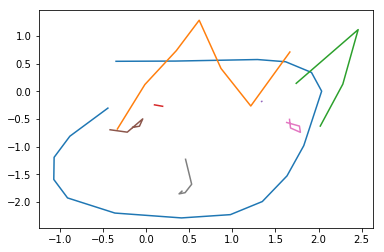

epoch 12701 in 0.174 s: loss = -0.2454, LR = -0.2710, LKL = 0.0256
epoch 12702 in 0.175 s: loss = -0.2437, LR = -0.2693, LKL = 0.0257
epoch 12703 in 0.173 s: loss = -0.1904, LR = -0.2160, LKL = 0.0255
epoch 12704 in 0.174 s: loss = -0.2292, LR = -0.2547, LKL = 0.0255
epoch 12705 in 0.173 s: loss = -0.1779, LR = -0.2033, LKL = 0.0254
epoch 12706 in 0.178 s: loss = -0.2120, LR = -0.2377, LKL = 0.0257
epoch 12707 in 0.174 s: loss = -0.2301, LR = -0.2557, LKL = 0.0256
epoch 12708 in 0.174 s: loss = -0.2614, LR = -0.2870, LKL = 0.0256
epoch 12709 in 0.172 s: loss = -0.2395, LR = -0.2652, LKL = 0.0257
epoch 12710 in 0.176 s: loss = -0.2007, LR = -0.2263, LKL = 0.0255
epoch 12711 in 0.172 s: loss = -0.1999, LR = -0.2255, LKL = 0.0256
epoch 12712 in 0.175 s: loss = -0.2679, LR = -0.2936, LKL = 0.0257
epoch 12713 in 0.173 s: loss = -0.1940, LR = -0.2196, LKL = 0.0256
epoch 12714 in 0.174 s: loss = -0.1924, LR = -0.2179, LKL = 0.0254
epoch 12715 in 0.173 s: loss = -0.1706, LR = -0.1959, LKL = 0.

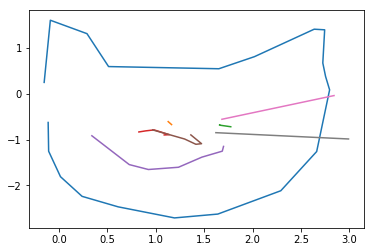

epoch 12801 in 0.174 s: loss = -0.2006, LR = -0.2262, LKL = 0.0256
epoch 12802 in 0.173 s: loss = -0.1971, LR = -0.2225, LKL = 0.0255
epoch 12803 in 0.172 s: loss = -0.2082, LR = -0.2339, LKL = 0.0257
epoch 12804 in 0.174 s: loss = -0.2480, LR = -0.2737, LKL = 0.0257
epoch 12805 in 0.172 s: loss = -0.2251, LR = -0.2506, LKL = 0.0255
epoch 12806 in 0.176 s: loss = -0.2095, LR = -0.2351, LKL = 0.0256
epoch 12807 in 0.171 s: loss = -0.2030, LR = -0.2285, LKL = 0.0255
epoch 12808 in 0.171 s: loss = -0.2507, LR = -0.2763, LKL = 0.0256
epoch 12809 in 0.171 s: loss = -0.2640, LR = -0.2897, LKL = 0.0257
epoch 12810 in 0.173 s: loss = -0.1979, LR = -0.2235, LKL = 0.0256
epoch 12811 in 0.173 s: loss = -0.2683, LR = -0.2940, LKL = 0.0258
epoch 12812 in 0.173 s: loss = -0.1971, LR = -0.2227, LKL = 0.0255
epoch 12813 in 0.171 s: loss = -0.2283, LR = -0.2539, LKL = 0.0256
epoch 12814 in 0.174 s: loss = -0.1612, LR = -0.1868, LKL = 0.0256
epoch 12815 in 0.172 s: loss = -0.1662, LR = -0.1916, LKL = 0.

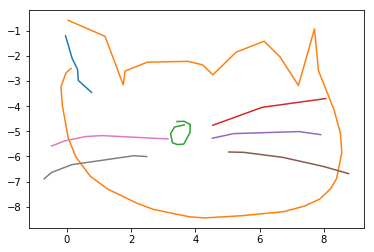

epoch 12901 in 0.172 s: loss = -0.1820, LR = -0.2077, LKL = 0.0257
epoch 12902 in 0.171 s: loss = -0.1821, LR = -0.2078, LKL = 0.0257
epoch 12903 in 0.170 s: loss = -0.1975, LR = -0.2233, LKL = 0.0258
epoch 12904 in 0.171 s: loss = -0.1784, LR = -0.2042, LKL = 0.0258
epoch 12905 in 0.172 s: loss = -0.2083, LR = -0.2341, LKL = 0.0258
epoch 12906 in 0.171 s: loss = -0.1732, LR = -0.1988, LKL = 0.0256
epoch 12907 in 0.170 s: loss = -0.1972, LR = -0.2228, LKL = 0.0256
epoch 12908 in 0.171 s: loss = -0.2225, LR = -0.2481, LKL = 0.0257
epoch 12909 in 0.171 s: loss = -0.2174, LR = -0.2431, LKL = 0.0257
epoch 12910 in 0.171 s: loss = -0.2449, LR = -0.2706, LKL = 0.0257
epoch 12911 in 0.171 s: loss = -0.2136, LR = -0.2394, LKL = 0.0258
epoch 12912 in 0.170 s: loss = -0.2420, LR = -0.2677, LKL = 0.0257
epoch 12913 in 0.171 s: loss = -0.2662, LR = -0.2919, LKL = 0.0257
epoch 12914 in 0.171 s: loss = -0.1500, LR = -0.1756, LKL = 0.0256
epoch 12915 in 0.171 s: loss = -0.1988, LR = -0.2243, LKL = 0.

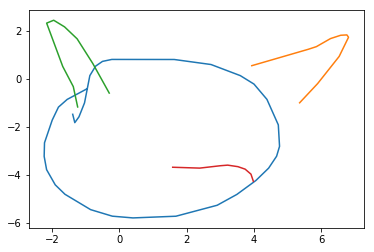

epoch 13001 in 0.175 s: loss = -0.2366, LR = -0.2622, LKL = 0.0256
epoch 13002 in 0.174 s: loss = -0.2156, LR = -0.2412, LKL = 0.0256
epoch 13003 in 0.174 s: loss = -0.2001, LR = -0.2255, LKL = 0.0254
epoch 13004 in 0.174 s: loss = -0.1431, LR = -0.1685, LKL = 0.0254
epoch 13005 in 0.175 s: loss = -0.2114, LR = -0.2372, LKL = 0.0257
epoch 13006 in 0.174 s: loss = -0.2111, LR = -0.2367, LKL = 0.0255
epoch 13007 in 0.174 s: loss = -0.2044, LR = -0.2300, LKL = 0.0256
epoch 13008 in 0.172 s: loss = -0.2242, LR = -0.2498, LKL = 0.0256
epoch 13009 in 0.174 s: loss = -0.2277, LR = -0.2531, LKL = 0.0255
epoch 13010 in 0.174 s: loss = -0.2772, LR = -0.3028, LKL = 0.0256
epoch 13011 in 0.174 s: loss = -0.2208, LR = -0.2465, LKL = 0.0258
epoch 13012 in 0.174 s: loss = -0.1955, LR = -0.2212, LKL = 0.0256
epoch 13013 in 0.174 s: loss = -0.1686, LR = -0.1942, LKL = 0.0256
epoch 13014 in 0.174 s: loss = -0.1183, LR = -0.1437, LKL = 0.0254
epoch 13015 in 0.175 s: loss = -0.2566, LR = -0.2822, LKL = 0.

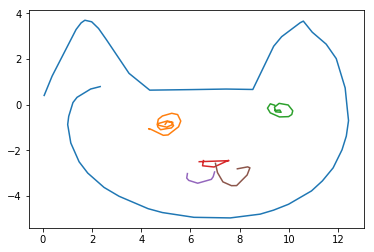

epoch 13101 in 0.175 s: loss = -0.2484, LR = -0.2743, LKL = 0.0259
epoch 13102 in 0.175 s: loss = -0.2276, LR = -0.2535, LKL = 0.0260
epoch 13103 in 0.174 s: loss = -0.2113, LR = -0.2370, LKL = 0.0258
epoch 13104 in 0.176 s: loss = -0.1527, LR = -0.1785, LKL = 0.0258
epoch 13105 in 0.172 s: loss = -0.1723, LR = -0.1981, LKL = 0.0258
epoch 13106 in 0.175 s: loss = -0.2252, LR = -0.2510, LKL = 0.0259
epoch 13107 in 0.172 s: loss = -0.2488, LR = -0.2746, LKL = 0.0258
epoch 13108 in 0.177 s: loss = -0.2743, LR = -0.3002, LKL = 0.0259
epoch 13109 in 0.176 s: loss = -0.2649, LR = -0.2908, LKL = 0.0259
epoch 13110 in 0.173 s: loss = -0.1976, LR = -0.2235, LKL = 0.0258
epoch 13111 in 0.173 s: loss = -0.2204, LR = -0.2463, LKL = 0.0259
epoch 13112 in 0.175 s: loss = -0.2194, LR = -0.2452, LKL = 0.0258
epoch 13113 in 0.174 s: loss = -0.2122, LR = -0.2382, LKL = 0.0260
epoch 13114 in 0.175 s: loss = -0.1869, LR = -0.2128, LKL = 0.0259
epoch 13115 in 0.171 s: loss = -0.2605, LR = -0.2864, LKL = 0.

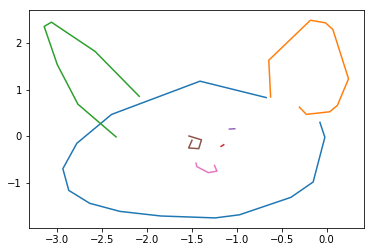

epoch 13201 in 0.175 s: loss = -0.1959, LR = -0.2219, LKL = 0.0260
epoch 13202 in 0.177 s: loss = -0.1791, LR = -0.2049, LKL = 0.0258
epoch 13203 in 0.174 s: loss = -0.2544, LR = -0.2804, LKL = 0.0261
epoch 13204 in 0.171 s: loss = -0.1901, LR = -0.2160, LKL = 0.0259
epoch 13205 in 0.178 s: loss = -0.2250, LR = -0.2509, LKL = 0.0260
epoch 13206 in 0.177 s: loss = -0.2429, LR = -0.2689, LKL = 0.0260
epoch 13207 in 0.174 s: loss = -0.2567, LR = -0.2825, LKL = 0.0259
epoch 13208 in 0.173 s: loss = -0.2291, LR = -0.2549, LKL = 0.0258
epoch 13209 in 0.174 s: loss = -0.2109, LR = -0.2369, LKL = 0.0259
epoch 13210 in 0.177 s: loss = -0.2166, LR = -0.2425, LKL = 0.0259
epoch 13211 in 0.177 s: loss = -0.2416, LR = -0.2674, LKL = 0.0258
epoch 13212 in 0.178 s: loss = -0.2496, LR = -0.2754, LKL = 0.0259
epoch 13213 in 0.178 s: loss = -0.1759, LR = -0.2018, LKL = 0.0259
epoch 13214 in 0.175 s: loss = -0.1902, LR = -0.2161, LKL = 0.0259
epoch 13215 in 0.180 s: loss = -0.2077, LR = -0.2334, LKL = 0.

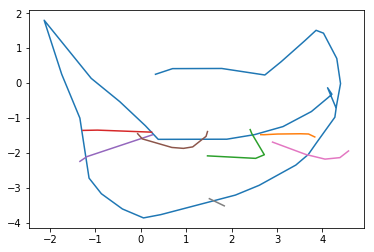

epoch 13301 in 0.174 s: loss = -0.1858, LR = -0.2117, LKL = 0.0259
epoch 13302 in 0.175 s: loss = -0.2068, LR = -0.2327, LKL = 0.0259
epoch 13303 in 0.176 s: loss = -0.1845, LR = -0.2103, LKL = 0.0259
epoch 13304 in 0.174 s: loss = -0.2524, LR = -0.2783, LKL = 0.0259
epoch 13305 in 0.179 s: loss = -0.1688, LR = -0.1947, LKL = 0.0259
epoch 13306 in 0.176 s: loss = -0.2722, LR = -0.2983, LKL = 0.0261
epoch 13307 in 0.177 s: loss = -0.1878, LR = -0.2137, LKL = 0.0259
epoch 13308 in 0.176 s: loss = -0.2469, LR = -0.2728, LKL = 0.0259
epoch 13309 in 0.177 s: loss = -0.2058, LR = -0.2318, LKL = 0.0260
epoch 13310 in 0.178 s: loss = -0.2321, LR = -0.2579, LKL = 0.0258
epoch 13311 in 0.171 s: loss = -0.2726, LR = -0.2986, LKL = 0.0260
epoch 13312 in 0.176 s: loss = -0.2594, LR = -0.2854, LKL = 0.0260
epoch 13313 in 0.177 s: loss = -0.2164, LR = -0.2422, LKL = 0.0258
epoch 13314 in 0.173 s: loss = -0.2113, LR = -0.2372, LKL = 0.0259
epoch 13315 in 0.179 s: loss = -0.2146, LR = -0.2404, LKL = 0.

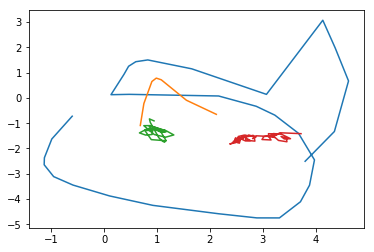

epoch 13401 in 0.181 s: loss = -0.1748, LR = -0.2005, LKL = 0.0257
epoch 13402 in 0.173 s: loss = -0.2371, LR = -0.2630, LKL = 0.0259
epoch 13403 in 0.176 s: loss = -0.2213, LR = -0.2471, LKL = 0.0258
epoch 13404 in 0.180 s: loss = -0.3040, LR = -0.3301, LKL = 0.0260
epoch 13405 in 0.180 s: loss = -0.3154, LR = -0.3415, LKL = 0.0261
epoch 13406 in 0.176 s: loss = -0.2188, LR = -0.2445, LKL = 0.0257
epoch 13407 in 0.179 s: loss = -0.1874, LR = -0.2133, LKL = 0.0258
epoch 13408 in 0.175 s: loss = -0.2261, LR = -0.2519, LKL = 0.0258
epoch 13409 in 0.180 s: loss = -0.1793, LR = -0.2050, LKL = 0.0256
epoch 13410 in 0.176 s: loss = -0.2290, LR = -0.2549, LKL = 0.0260
epoch 13411 in 0.182 s: loss = -0.2170, LR = -0.2428, LKL = 0.0258
epoch 13412 in 0.178 s: loss = -0.2836, LR = -0.3095, LKL = 0.0259
epoch 13413 in 0.178 s: loss = -0.2088, LR = -0.2348, LKL = 0.0259
epoch 13414 in 0.182 s: loss = -0.1753, LR = -0.2011, LKL = 0.0258
epoch 13415 in 0.181 s: loss = -0.2453, LR = -0.2710, LKL = 0.

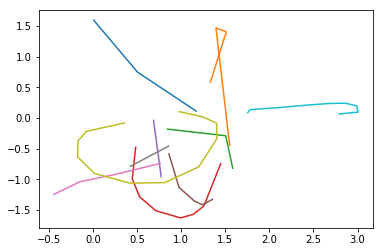

epoch 13501 in 0.176 s: loss = -0.2742, LR = -0.3003, LKL = 0.0261
epoch 13502 in 0.175 s: loss = -0.2414, LR = -0.2673, LKL = 0.0259
epoch 13503 in 0.171 s: loss = -0.2577, LR = -0.2838, LKL = 0.0260
epoch 13504 in 0.172 s: loss = -0.2220, LR = -0.2478, LKL = 0.0258
epoch 13505 in 0.175 s: loss = -0.2145, LR = -0.2404, LKL = 0.0259
epoch 13506 in 0.177 s: loss = -0.2815, LR = -0.3076, LKL = 0.0261
epoch 13507 in 0.176 s: loss = -0.2672, LR = -0.2932, LKL = 0.0260
epoch 13508 in 0.176 s: loss = -0.2354, LR = -0.2613, LKL = 0.0259
epoch 13509 in 0.176 s: loss = -0.2381, LR = -0.2641, LKL = 0.0260
epoch 13510 in 0.177 s: loss = -0.1962, LR = -0.2220, LKL = 0.0258
epoch 13511 in 0.178 s: loss = -0.2496, LR = -0.2755, LKL = 0.0259
epoch 13512 in 0.177 s: loss = -0.1867, LR = -0.2126, LKL = 0.0259
epoch 13513 in 0.175 s: loss = -0.2474, LR = -0.2732, LKL = 0.0259
epoch 13514 in 0.173 s: loss = -0.2374, LR = -0.2634, LKL = 0.0260
epoch 13515 in 0.175 s: loss = -0.2333, LR = -0.2592, LKL = 0.

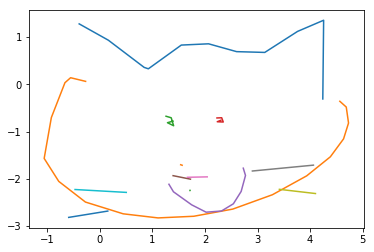

epoch 13601 in 0.179 s: loss = -0.2315, LR = -0.2574, LKL = 0.0259
epoch 13602 in 0.170 s: loss = -0.2570, LR = -0.2829, LKL = 0.0259
epoch 13603 in 0.176 s: loss = -0.1842, LR = -0.2101, LKL = 0.0259
epoch 13604 in 0.175 s: loss = -0.2263, LR = -0.2521, LKL = 0.0258
epoch 13605 in 0.177 s: loss = -0.2169, LR = -0.2428, LKL = 0.0259
epoch 13606 in 0.176 s: loss = -0.1847, LR = -0.2106, LKL = 0.0259
epoch 13607 in 0.178 s: loss = -0.2064, LR = -0.2323, LKL = 0.0259
epoch 13608 in 0.175 s: loss = -0.2752, LR = -0.3013, LKL = 0.0261
epoch 13609 in 0.180 s: loss = -0.2357, LR = -0.2618, LKL = 0.0261
epoch 13610 in 0.174 s: loss = -0.2004, LR = -0.2264, LKL = 0.0260
epoch 13611 in 0.177 s: loss = -0.2602, LR = -0.2861, LKL = 0.0259
epoch 13612 in 0.175 s: loss = -0.2720, LR = -0.2981, LKL = 0.0261
epoch 13613 in 0.177 s: loss = -0.1369, LR = -0.1630, LKL = 0.0261
epoch 13614 in 0.174 s: loss = -0.1046, LR = -0.1304, LKL = 0.0258
epoch 13615 in 0.179 s: loss = -0.1802, LR = -0.2060, LKL = 0.

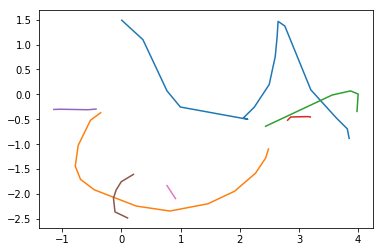

epoch 13701 in 0.171 s: loss = -0.2200, LR = -0.2460, LKL = 0.0260
epoch 13702 in 0.177 s: loss = -0.2549, LR = -0.2808, LKL = 0.0259
epoch 13703 in 0.173 s: loss = -0.2318, LR = -0.2577, LKL = 0.0260
epoch 13704 in 0.171 s: loss = -0.2656, LR = -0.2917, LKL = 0.0261
epoch 13705 in 0.172 s: loss = -0.3327, LR = -0.3588, LKL = 0.0261
epoch 13706 in 0.176 s: loss = -0.1990, LR = -0.2249, LKL = 0.0259
epoch 13707 in 0.176 s: loss = -0.2532, LR = -0.2792, LKL = 0.0260
epoch 13708 in 0.177 s: loss = -0.2623, LR = -0.2884, LKL = 0.0261
epoch 13709 in 0.178 s: loss = -0.1717, LR = -0.1975, LKL = 0.0259
epoch 13710 in 0.177 s: loss = -0.2370, LR = -0.2629, LKL = 0.0258
epoch 13711 in 0.176 s: loss = -0.2613, LR = -0.2873, LKL = 0.0260
epoch 13712 in 0.178 s: loss = -0.2599, LR = -0.2859, LKL = 0.0260
epoch 13713 in 0.174 s: loss = -0.2434, LR = -0.2695, LKL = 0.0261
epoch 13714 in 0.172 s: loss = -0.1838, LR = -0.2099, LKL = 0.0261
epoch 13715 in 0.174 s: loss = -0.3084, LR = -0.3344, LKL = 0.

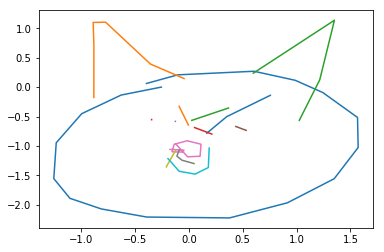

epoch 13801 in 0.176 s: loss = -0.2723, LR = -0.2985, LKL = 0.0262
epoch 13802 in 0.173 s: loss = -0.2283, LR = -0.2544, LKL = 0.0261
epoch 13803 in 0.176 s: loss = -0.2138, LR = -0.2399, LKL = 0.0260
epoch 13804 in 0.175 s: loss = -0.2160, LR = -0.2420, LKL = 0.0260
epoch 13805 in 0.178 s: loss = -0.2277, LR = -0.2538, LKL = 0.0261
epoch 13806 in 0.173 s: loss = -0.2116, LR = -0.2376, LKL = 0.0260
epoch 13807 in 0.174 s: loss = -0.1861, LR = -0.2120, LKL = 0.0259
epoch 13808 in 0.173 s: loss = -0.2284, LR = -0.2545, LKL = 0.0261
epoch 13809 in 0.171 s: loss = -0.2568, LR = -0.2829, LKL = 0.0260
epoch 13810 in 0.174 s: loss = -0.2547, LR = -0.2809, LKL = 0.0261
epoch 13811 in 0.176 s: loss = -0.2415, LR = -0.2677, LKL = 0.0262
epoch 13812 in 0.173 s: loss = -0.1699, LR = -0.1959, LKL = 0.0259
epoch 13813 in 0.178 s: loss = -0.2723, LR = -0.2985, LKL = 0.0262
epoch 13814 in 0.174 s: loss = -0.2811, LR = -0.3072, LKL = 0.0261
epoch 13815 in 0.178 s: loss = -0.1718, LR = -0.1976, LKL = 0.

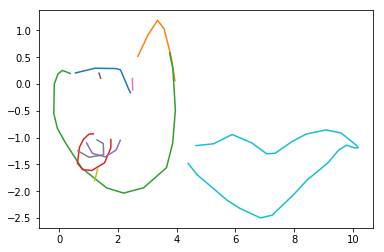

epoch 13901 in 0.178 s: loss = -0.2115, LR = -0.2378, LKL = 0.0263
epoch 13902 in 0.173 s: loss = -0.2475, LR = -0.2738, LKL = 0.0262
epoch 13903 in 0.177 s: loss = -0.0992, LR = -0.1251, LKL = 0.0259
epoch 13904 in 0.175 s: loss = -0.2725, LR = -0.2987, LKL = 0.0262
epoch 13905 in 0.177 s: loss = -0.2247, LR = -0.2508, LKL = 0.0261
epoch 13906 in 0.175 s: loss = -0.2400, LR = -0.2664, LKL = 0.0264
epoch 13907 in 0.176 s: loss = -0.2223, LR = -0.2486, LKL = 0.0263
epoch 13908 in 0.177 s: loss = -0.2195, LR = -0.2458, LKL = 0.0263
epoch 13909 in 0.180 s: loss = -0.1914, LR = -0.2175, LKL = 0.0261
epoch 13910 in 0.175 s: loss = -0.1983, LR = -0.2247, LKL = 0.0264
epoch 13911 in 0.179 s: loss = -0.1995, LR = -0.2258, LKL = 0.0263
epoch 13912 in 0.174 s: loss = -0.2803, LR = -0.3064, LKL = 0.0260
epoch 13913 in 0.178 s: loss = -0.2205, LR = -0.2466, LKL = 0.0261
epoch 13914 in 0.174 s: loss = -0.1768, LR = -0.2029, LKL = 0.0261
epoch 13915 in 0.176 s: loss = -0.1896, LR = -0.2157, LKL = 0.

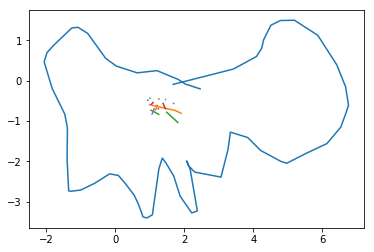

epoch 14001 in 0.176 s: loss = -0.2360, LR = -0.2622, LKL = 0.0262
epoch 14002 in 0.176 s: loss = -0.3076, LR = -0.3338, LKL = 0.0262
epoch 14003 in 0.176 s: loss = -0.2215, LR = -0.2478, LKL = 0.0262
epoch 14004 in 0.173 s: loss = -0.1870, LR = -0.2131, LKL = 0.0261
epoch 14005 in 0.175 s: loss = -0.2270, LR = -0.2531, LKL = 0.0261
epoch 14006 in 0.175 s: loss = -0.2560, LR = -0.2821, LKL = 0.0261
epoch 14007 in 0.175 s: loss = -0.3011, LR = -0.3272, LKL = 0.0260
epoch 14008 in 0.176 s: loss = -0.2501, LR = -0.2764, LKL = 0.0263
epoch 14009 in 0.176 s: loss = -0.2437, LR = -0.2698, LKL = 0.0261
epoch 14010 in 0.175 s: loss = -0.2142, LR = -0.2404, LKL = 0.0262
epoch 14011 in 0.177 s: loss = -0.2658, LR = -0.2920, LKL = 0.0262
epoch 14012 in 0.173 s: loss = -0.2522, LR = -0.2784, LKL = 0.0262
epoch 14013 in 0.176 s: loss = -0.2757, LR = -0.3019, LKL = 0.0262
epoch 14014 in 0.175 s: loss = -0.2361, LR = -0.2622, LKL = 0.0261
epoch 14015 in 0.177 s: loss = -0.2421, LR = -0.2682, LKL = 0.

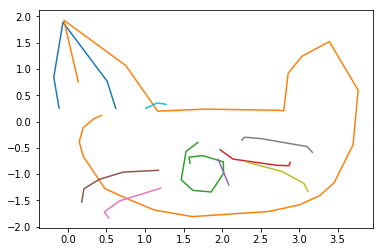

epoch 14101 in 0.175 s: loss = -0.2244, LR = -0.2506, LKL = 0.0262
epoch 14102 in 0.179 s: loss = -0.2538, LR = -0.2801, LKL = 0.0263
epoch 14103 in 0.174 s: loss = -0.2390, LR = -0.2652, LKL = 0.0262
epoch 14104 in 0.175 s: loss = -0.2615, LR = -0.2877, LKL = 0.0262
epoch 14105 in 0.175 s: loss = -0.1782, LR = -0.2042, LKL = 0.0260
epoch 14106 in 0.178 s: loss = -0.2786, LR = -0.3047, LKL = 0.0262
epoch 14107 in 0.173 s: loss = -0.3002, LR = -0.3266, LKL = 0.0264
epoch 14108 in 0.176 s: loss = -0.2003, LR = -0.2265, LKL = 0.0262
epoch 14109 in 0.178 s: loss = -0.2279, LR = -0.2542, LKL = 0.0263
epoch 14110 in 0.176 s: loss = -0.2393, LR = -0.2656, LKL = 0.0263
epoch 14111 in 0.176 s: loss = -0.3214, LR = -0.3478, LKL = 0.0264
epoch 14112 in 0.175 s: loss = -0.2396, LR = -0.2659, LKL = 0.0263
epoch 14113 in 0.177 s: loss = -0.2176, LR = -0.2438, LKL = 0.0263
epoch 14114 in 0.177 s: loss = -0.2522, LR = -0.2786, LKL = 0.0264
epoch 14115 in 0.173 s: loss = -0.2621, LR = -0.2886, LKL = 0.

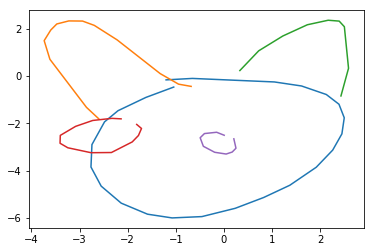

epoch 14201 in 0.178 s: loss = -0.2199, LR = -0.2463, LKL = 0.0264
epoch 14202 in 0.174 s: loss = -0.2672, LR = -0.2936, LKL = 0.0263
epoch 14203 in 0.175 s: loss = -0.2400, LR = -0.2662, LKL = 0.0262
epoch 14204 in 0.172 s: loss = -0.2312, LR = -0.2575, LKL = 0.0263
epoch 14205 in 0.179 s: loss = -0.3293, LR = -0.3557, LKL = 0.0265
epoch 14206 in 0.175 s: loss = -0.2911, LR = -0.3173, LKL = 0.0262
epoch 14207 in 0.177 s: loss = -0.2886, LR = -0.3150, LKL = 0.0264
epoch 14208 in 0.177 s: loss = -0.2341, LR = -0.2603, LKL = 0.0262
epoch 14209 in 0.175 s: loss = -0.2655, LR = -0.2919, LKL = 0.0263
epoch 14210 in 0.177 s: loss = -0.2484, LR = -0.2748, LKL = 0.0264
epoch 14211 in 0.178 s: loss = -0.2588, LR = -0.2850, LKL = 0.0262
epoch 14212 in 0.174 s: loss = -0.2398, LR = -0.2662, LKL = 0.0264
epoch 14213 in 0.176 s: loss = -0.2674, LR = -0.2939, LKL = 0.0265
epoch 14214 in 0.174 s: loss = -0.3098, LR = -0.3363, LKL = 0.0264
epoch 14215 in 0.178 s: loss = -0.2201, LR = -0.2464, LKL = 0.

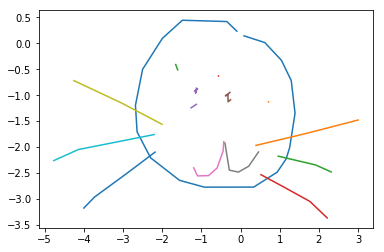

epoch 14301 in 0.175 s: loss = -0.2400, LR = -0.2664, LKL = 0.0264
epoch 14302 in 0.179 s: loss = -0.1926, LR = -0.2190, LKL = 0.0264
epoch 14303 in 0.174 s: loss = -0.2986, LR = -0.3252, LKL = 0.0266
epoch 14304 in 0.175 s: loss = -0.2341, LR = -0.2604, LKL = 0.0264
epoch 14305 in 0.181 s: loss = -0.2091, LR = -0.2354, LKL = 0.0263
epoch 14306 in 0.175 s: loss = -0.1729, LR = -0.1992, LKL = 0.0264
epoch 14307 in 0.175 s: loss = -0.2453, LR = -0.2716, LKL = 0.0263
epoch 14308 in 0.175 s: loss = -0.3120, LR = -0.3386, LKL = 0.0266
epoch 14309 in 0.177 s: loss = -0.2148, LR = -0.2412, LKL = 0.0264
epoch 14310 in 0.176 s: loss = -0.2288, LR = -0.2550, LKL = 0.0263
epoch 14311 in 0.178 s: loss = -0.2325, LR = -0.2589, LKL = 0.0264
epoch 14312 in 0.181 s: loss = -0.2989, LR = -0.3255, LKL = 0.0265
epoch 14313 in 0.177 s: loss = -0.2537, LR = -0.2802, LKL = 0.0265
epoch 14314 in 0.178 s: loss = -0.2510, LR = -0.2773, LKL = 0.0263
epoch 14315 in 0.180 s: loss = -0.2296, LR = -0.2560, LKL = 0.

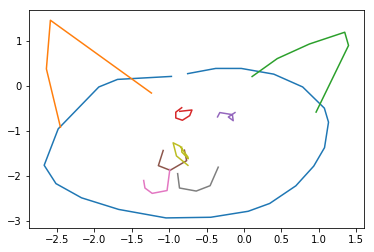

epoch 14401 in 0.174 s: loss = -0.1809, LR = -0.2071, LKL = 0.0263
epoch 14402 in 0.172 s: loss = -0.2613, LR = -0.2876, LKL = 0.0263
epoch 14403 in 0.175 s: loss = -0.2281, LR = -0.2544, LKL = 0.0264
epoch 14404 in 0.172 s: loss = -0.2035, LR = -0.2298, LKL = 0.0263
epoch 14405 in 0.177 s: loss = -0.2727, LR = -0.2990, LKL = 0.0263
epoch 14406 in 0.174 s: loss = -0.2844, LR = -0.3107, LKL = 0.0263
epoch 14407 in 0.174 s: loss = -0.2514, LR = -0.2778, LKL = 0.0264
epoch 14408 in 0.175 s: loss = -0.2138, LR = -0.2401, LKL = 0.0263
epoch 14409 in 0.179 s: loss = -0.1377, LR = -0.1639, LKL = 0.0262
epoch 14410 in 0.172 s: loss = -0.2280, LR = -0.2544, LKL = 0.0263
epoch 14411 in 0.176 s: loss = -0.1977, LR = -0.2240, LKL = 0.0263
epoch 14412 in 0.175 s: loss = -0.2373, LR = -0.2636, LKL = 0.0262
epoch 14413 in 0.179 s: loss = -0.2156, LR = -0.2418, LKL = 0.0261
epoch 14414 in 0.175 s: loss = -0.2025, LR = -0.2288, LKL = 0.0262
epoch 14415 in 0.179 s: loss = -0.2551, LR = -0.2813, LKL = 0.

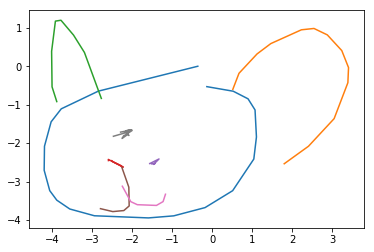

epoch 14501 in 0.175 s: loss = -0.2302, LR = -0.2566, LKL = 0.0264
epoch 14502 in 0.176 s: loss = -0.2405, LR = -0.2670, LKL = 0.0265
epoch 14503 in 0.179 s: loss = -0.2977, LR = -0.3242, LKL = 0.0264
epoch 14504 in 0.175 s: loss = -0.2089, LR = -0.2351, LKL = 0.0262
epoch 14505 in 0.179 s: loss = -0.2939, LR = -0.3203, LKL = 0.0264
epoch 14506 in 0.179 s: loss = -0.2536, LR = -0.2800, LKL = 0.0264
epoch 14507 in 0.179 s: loss = -0.2884, LR = -0.3148, LKL = 0.0264
epoch 14508 in 0.175 s: loss = -0.2599, LR = -0.2863, LKL = 0.0264
epoch 14509 in 0.177 s: loss = -0.2807, LR = -0.3073, LKL = 0.0267
epoch 14510 in 0.177 s: loss = -0.2490, LR = -0.2755, LKL = 0.0266
epoch 14511 in 0.177 s: loss = -0.3375, LR = -0.3639, LKL = 0.0265
epoch 14512 in 0.177 s: loss = -0.2398, LR = -0.2663, LKL = 0.0265
epoch 14513 in 0.178 s: loss = -0.2588, LR = -0.2852, LKL = 0.0265
epoch 14514 in 0.174 s: loss = -0.2010, LR = -0.2274, LKL = 0.0264
epoch 14515 in 0.180 s: loss = -0.2269, LR = -0.2534, LKL = 0.

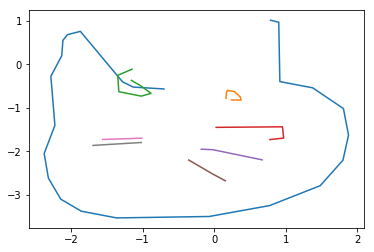

epoch 14601 in 0.176 s: loss = -0.2546, LR = -0.2812, LKL = 0.0265
epoch 14602 in 0.178 s: loss = -0.2205, LR = -0.2470, LKL = 0.0266
epoch 14603 in 0.181 s: loss = -0.2058, LR = -0.2323, LKL = 0.0265
epoch 14604 in 0.180 s: loss = -0.1608, LR = -0.1873, LKL = 0.0264
epoch 14605 in 0.174 s: loss = -0.2831, LR = -0.3098, LKL = 0.0267
epoch 14606 in 0.171 s: loss = -0.2990, LR = -0.3256, LKL = 0.0266
epoch 14607 in 0.177 s: loss = -0.2159, LR = -0.2423, LKL = 0.0264
epoch 14608 in 0.180 s: loss = -0.2354, LR = -0.2619, LKL = 0.0265
epoch 14609 in 0.174 s: loss = -0.2160, LR = -0.2424, LKL = 0.0265
epoch 14610 in 0.174 s: loss = -0.2228, LR = -0.2494, LKL = 0.0266
epoch 14611 in 0.179 s: loss = -0.2522, LR = -0.2786, LKL = 0.0264
epoch 14612 in 0.178 s: loss = -0.2430, LR = -0.2695, LKL = 0.0264
epoch 14613 in 0.179 s: loss = -0.2986, LR = -0.3251, LKL = 0.0266
epoch 14614 in 0.178 s: loss = -0.2904, LR = -0.3170, LKL = 0.0266
epoch 14615 in 0.175 s: loss = -0.2721, LR = -0.2987, LKL = 0.

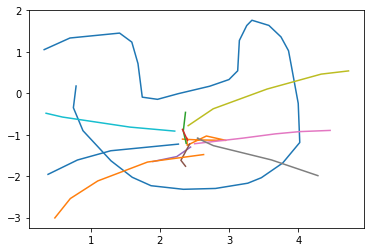

epoch 14701 in 0.176 s: loss = -0.2130, LR = -0.2395, LKL = 0.0265
epoch 14702 in 0.173 s: loss = -0.2310, LR = -0.2577, LKL = 0.0267
epoch 14703 in 0.176 s: loss = -0.2302, LR = -0.2569, LKL = 0.0267
epoch 14704 in 0.171 s: loss = -0.2651, LR = -0.2918, LKL = 0.0267
epoch 14705 in 0.176 s: loss = -0.2112, LR = -0.2377, LKL = 0.0265
epoch 14706 in 0.176 s: loss = -0.2385, LR = -0.2649, LKL = 0.0264
epoch 14707 in 0.175 s: loss = -0.2073, LR = -0.2337, LKL = 0.0264
epoch 14708 in 0.174 s: loss = -0.2402, LR = -0.2668, LKL = 0.0266
epoch 14709 in 0.180 s: loss = -0.1830, LR = -0.2094, LKL = 0.0264
epoch 14710 in 0.177 s: loss = -0.2167, LR = -0.2431, LKL = 0.0265
epoch 14711 in 0.177 s: loss = -0.2672, LR = -0.2939, LKL = 0.0266
epoch 14712 in 0.173 s: loss = -0.2574, LR = -0.2838, LKL = 0.0264
epoch 14713 in 0.176 s: loss = -0.2517, LR = -0.2782, LKL = 0.0265
epoch 14714 in 0.175 s: loss = -0.2737, LR = -0.3003, LKL = 0.0266
epoch 14715 in 0.178 s: loss = -0.2919, LR = -0.3185, LKL = 0.

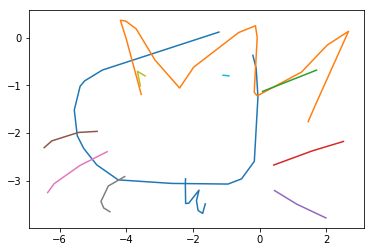

epoch 14801 in 0.174 s: loss = -0.2194, LR = -0.2459, LKL = 0.0265
epoch 14802 in 0.171 s: loss = -0.2110, LR = -0.2374, LKL = 0.0264
epoch 14803 in 0.172 s: loss = -0.2706, LR = -0.2971, LKL = 0.0265
epoch 14804 in 0.172 s: loss = -0.2530, LR = -0.2796, LKL = 0.0267
epoch 14805 in 0.173 s: loss = -0.2328, LR = -0.2592, LKL = 0.0264
epoch 14806 in 0.175 s: loss = -0.2421, LR = -0.2687, LKL = 0.0267
epoch 14807 in 0.176 s: loss = -0.3211, LR = -0.3479, LKL = 0.0268
epoch 14808 in 0.176 s: loss = -0.2760, LR = -0.3027, LKL = 0.0267
epoch 14809 in 0.177 s: loss = -0.2273, LR = -0.2537, LKL = 0.0263
epoch 14810 in 0.177 s: loss = -0.2655, LR = -0.2921, LKL = 0.0265
epoch 14811 in 0.179 s: loss = -0.2442, LR = -0.2709, LKL = 0.0266
epoch 14812 in 0.176 s: loss = -0.2795, LR = -0.3062, LKL = 0.0267
epoch 14813 in 0.177 s: loss = -0.2227, LR = -0.2493, LKL = 0.0266
epoch 14814 in 0.173 s: loss = -0.2544, LR = -0.2809, LKL = 0.0265
epoch 14815 in 0.176 s: loss = -0.3013, LR = -0.3281, LKL = 0.

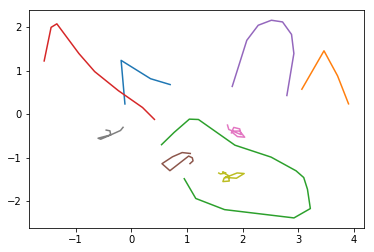

epoch 14901 in 0.174 s: loss = -0.2436, LR = -0.2703, LKL = 0.0267
epoch 14902 in 0.171 s: loss = -0.2513, LR = -0.2778, LKL = 0.0266
epoch 14903 in 0.172 s: loss = -0.3190, LR = -0.3458, LKL = 0.0268
epoch 14904 in 0.170 s: loss = -0.2186, LR = -0.2452, LKL = 0.0267
epoch 14905 in 0.171 s: loss = -0.2253, LR = -0.2518, LKL = 0.0266
epoch 14906 in 0.171 s: loss = -0.2410, LR = -0.2677, LKL = 0.0267
epoch 14907 in 0.170 s: loss = -0.2865, LR = -0.3132, LKL = 0.0267
epoch 14908 in 0.172 s: loss = -0.2927, LR = -0.3194, LKL = 0.0267
epoch 14909 in 0.172 s: loss = -0.2751, LR = -0.3017, LKL = 0.0266
epoch 14910 in 0.169 s: loss = -0.2431, LR = -0.2697, LKL = 0.0266
epoch 14911 in 0.175 s: loss = -0.1925, LR = -0.2192, LKL = 0.0267
epoch 14912 in 0.174 s: loss = -0.3181, LR = -0.3449, LKL = 0.0269
epoch 14913 in 0.173 s: loss = -0.2763, LR = -0.3028, LKL = 0.0265
epoch 14914 in 0.172 s: loss = -0.2730, LR = -0.2996, LKL = 0.0266
epoch 14915 in 0.173 s: loss = -0.2695, LR = -0.2961, LKL = 0.

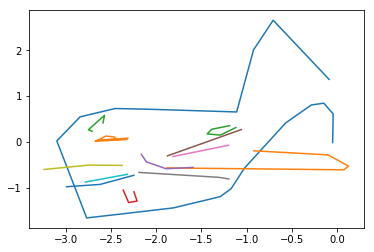

epoch 15001 in 0.175 s: loss = -0.2201, LR = -0.2468, LKL = 0.0267
epoch 15002 in 0.176 s: loss = -0.2497, LR = -0.2762, LKL = 0.0266
epoch 15003 in 0.179 s: loss = -0.2251, LR = -0.2520, LKL = 0.0269
epoch 15004 in 0.174 s: loss = -0.2253, LR = -0.2518, LKL = 0.0265
epoch 15005 in 0.177 s: loss = -0.2434, LR = -0.2700, LKL = 0.0266
epoch 15006 in 0.174 s: loss = -0.2999, LR = -0.3268, LKL = 0.0269
epoch 15007 in 0.181 s: loss = -0.2231, LR = -0.2499, LKL = 0.0268
epoch 15008 in 0.174 s: loss = -0.2644, LR = -0.2912, LKL = 0.0268
epoch 15009 in 0.178 s: loss = -0.3029, LR = -0.3296, LKL = 0.0267
epoch 15010 in 0.174 s: loss = -0.2298, LR = -0.2566, LKL = 0.0268
epoch 15011 in 0.178 s: loss = -0.2865, LR = -0.3134, LKL = 0.0269
epoch 15012 in 0.175 s: loss = -0.3035, LR = -0.3302, LKL = 0.0267
epoch 15013 in 0.179 s: loss = -0.2885, LR = -0.3154, LKL = 0.0269
epoch 15014 in 0.174 s: loss = -0.1840, LR = -0.2106, LKL = 0.0267
epoch 15015 in 0.177 s: loss = -0.2710, LR = -0.2978, LKL = 0.

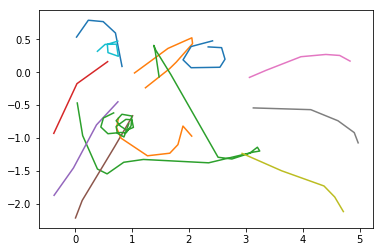

epoch 15101 in 0.176 s: loss = -0.2614, LR = -0.2881, LKL = 0.0267
epoch 15102 in 0.174 s: loss = -0.2320, LR = -0.2587, LKL = 0.0268
epoch 15103 in 0.177 s: loss = -0.2410, LR = -0.2679, LKL = 0.0268
epoch 15104 in 0.174 s: loss = -0.2826, LR = -0.3096, LKL = 0.0270
epoch 15105 in 0.176 s: loss = -0.2683, LR = -0.2951, LKL = 0.0269
epoch 15106 in 0.175 s: loss = -0.2405, LR = -0.2673, LKL = 0.0268
epoch 15107 in 0.179 s: loss = -0.3213, LR = -0.3482, LKL = 0.0268
epoch 15108 in 0.176 s: loss = -0.2406, LR = -0.2673, LKL = 0.0266
epoch 15109 in 0.176 s: loss = -0.2712, LR = -0.2981, LKL = 0.0269
epoch 15110 in 0.173 s: loss = -0.2305, LR = -0.2573, LKL = 0.0268
epoch 15111 in 0.178 s: loss = -0.2561, LR = -0.2829, LKL = 0.0268
epoch 15112 in 0.176 s: loss = -0.1953, LR = -0.2220, LKL = 0.0267
epoch 15113 in 0.177 s: loss = -0.2193, LR = -0.2460, LKL = 0.0267
epoch 15114 in 0.175 s: loss = -0.2320, LR = -0.2590, LKL = 0.0269
epoch 15115 in 0.178 s: loss = -0.2608, LR = -0.2875, LKL = 0.

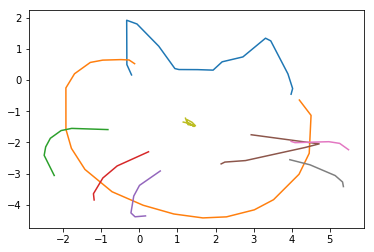

epoch 15201 in 0.177 s: loss = -0.2606, LR = -0.2875, LKL = 0.0269
epoch 15202 in 0.176 s: loss = -0.2018, LR = -0.2285, LKL = 0.0267
epoch 15203 in 0.178 s: loss = -0.2562, LR = -0.2831, LKL = 0.0269
epoch 15204 in 0.178 s: loss = -0.2387, LR = -0.2655, LKL = 0.0269
epoch 15205 in 0.177 s: loss = -0.2720, LR = -0.2988, LKL = 0.0268
epoch 15206 in 0.174 s: loss = -0.2289, LR = -0.2556, LKL = 0.0266
epoch 15207 in 0.178 s: loss = -0.2308, LR = -0.2576, LKL = 0.0268
epoch 15208 in 0.178 s: loss = -0.2708, LR = -0.2975, LKL = 0.0267
epoch 15209 in 0.180 s: loss = -0.2985, LR = -0.3255, LKL = 0.0270
epoch 15210 in 0.178 s: loss = -0.2278, LR = -0.2545, LKL = 0.0267
epoch 15211 in 0.177 s: loss = -0.2873, LR = -0.3142, LKL = 0.0269
epoch 15212 in 0.175 s: loss = -0.2354, LR = -0.2623, LKL = 0.0269
epoch 15213 in 0.178 s: loss = -0.2461, LR = -0.2729, LKL = 0.0268
epoch 15214 in 0.177 s: loss = -0.2800, LR = -0.3069, LKL = 0.0269
epoch 15215 in 0.176 s: loss = -0.2608, LR = -0.2876, LKL = 0.

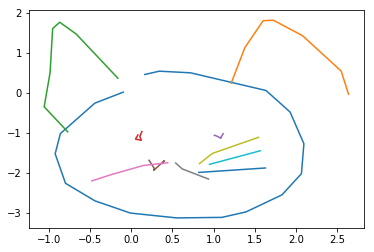

epoch 15301 in 0.175 s: loss = -0.2774, LR = -0.3044, LKL = 0.0270
epoch 15302 in 0.173 s: loss = -0.2667, LR = -0.2937, LKL = 0.0270
epoch 15303 in 0.171 s: loss = -0.3357, LR = -0.3629, LKL = 0.0272
epoch 15304 in 0.174 s: loss = -0.3039, LR = -0.3311, LKL = 0.0272
epoch 15305 in 0.174 s: loss = -0.2390, LR = -0.2660, LKL = 0.0270
epoch 15306 in 0.169 s: loss = -0.2328, LR = -0.2599, LKL = 0.0271
epoch 15307 in 0.174 s: loss = -0.2700, LR = -0.2970, LKL = 0.0269
epoch 15308 in 0.172 s: loss = -0.3035, LR = -0.3305, LKL = 0.0270
epoch 15309 in 0.174 s: loss = -0.2294, LR = -0.2563, LKL = 0.0270
epoch 15310 in 0.174 s: loss = -0.3069, LR = -0.3340, LKL = 0.0271
epoch 15311 in 0.174 s: loss = -0.2597, LR = -0.2867, LKL = 0.0270
epoch 15312 in 0.174 s: loss = -0.3038, LR = -0.3309, LKL = 0.0270
epoch 15313 in 0.177 s: loss = -0.2691, LR = -0.2963, LKL = 0.0272
epoch 15314 in 0.176 s: loss = -0.2117, LR = -0.2387, LKL = 0.0269
epoch 15315 in 0.177 s: loss = -0.2260, LR = -0.2530, LKL = 0.

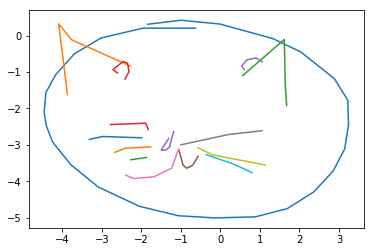

epoch 15401 in 0.175 s: loss = -0.1624, LR = -0.1892, LKL = 0.0268
epoch 15402 in 0.173 s: loss = -0.3302, LR = -0.3573, LKL = 0.0271
epoch 15403 in 0.175 s: loss = -0.2030, LR = -0.2300, LKL = 0.0269
epoch 15404 in 0.176 s: loss = -0.2281, LR = -0.2552, LKL = 0.0272
epoch 15405 in 0.177 s: loss = -0.2038, LR = -0.2308, LKL = 0.0270
epoch 15406 in 0.174 s: loss = -0.2097, LR = -0.2365, LKL = 0.0268
epoch 15407 in 0.172 s: loss = -0.2749, LR = -0.3019, LKL = 0.0271
epoch 15408 in 0.173 s: loss = -0.2428, LR = -0.2698, LKL = 0.0270
epoch 15409 in 0.176 s: loss = -0.1054, LR = -0.1321, LKL = 0.0267
epoch 15410 in 0.175 s: loss = -0.2715, LR = -0.2987, LKL = 0.0272
epoch 15411 in 0.175 s: loss = -0.1698, LR = -0.1966, LKL = 0.0268
epoch 15412 in 0.176 s: loss = -0.2649, LR = -0.2920, LKL = 0.0271
epoch 15413 in 0.177 s: loss = -0.2246, LR = -0.2515, LKL = 0.0269
epoch 15414 in 0.177 s: loss = -0.2542, LR = -0.2814, LKL = 0.0272
epoch 15415 in 0.177 s: loss = -0.2335, LR = -0.2604, LKL = 0.

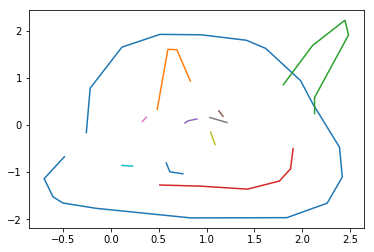

epoch 15501 in 0.180 s: loss = -0.2663, LR = -0.2933, LKL = 0.0269
epoch 15502 in 0.174 s: loss = -0.2765, LR = -0.3035, LKL = 0.0270
epoch 15503 in 0.173 s: loss = -0.2423, LR = -0.2692, LKL = 0.0268
epoch 15504 in 0.178 s: loss = -0.2417, LR = -0.2685, LKL = 0.0268
epoch 15505 in 0.176 s: loss = -0.2837, LR = -0.3106, LKL = 0.0269
epoch 15506 in 0.174 s: loss = -0.2463, LR = -0.2732, LKL = 0.0269
epoch 15507 in 0.177 s: loss = -0.2702, LR = -0.2969, LKL = 0.0267
epoch 15508 in 0.178 s: loss = -0.3040, LR = -0.3309, LKL = 0.0269
epoch 15509 in 0.175 s: loss = -0.2190, LR = -0.2459, LKL = 0.0269
epoch 15510 in 0.174 s: loss = -0.2791, LR = -0.3061, LKL = 0.0270
epoch 15511 in 0.181 s: loss = -0.2774, LR = -0.3043, LKL = 0.0268
epoch 15512 in 0.177 s: loss = -0.2838, LR = -0.3107, LKL = 0.0269
epoch 15513 in 0.176 s: loss = -0.2638, LR = -0.2909, LKL = 0.0270
epoch 15514 in 0.175 s: loss = -0.2604, LR = -0.2871, LKL = 0.0267
epoch 15515 in 0.174 s: loss = -0.2373, LR = -0.2640, LKL = 0.

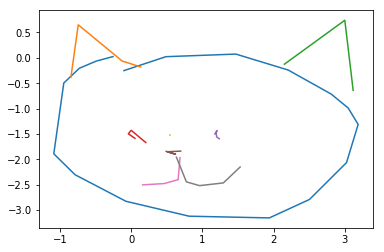

epoch 15601 in 0.177 s: loss = -0.3138, LR = -0.3409, LKL = 0.0271
epoch 15602 in 0.173 s: loss = -0.2654, LR = -0.2922, LKL = 0.0268
epoch 15603 in 0.177 s: loss = -0.2867, LR = -0.3137, LKL = 0.0271
epoch 15604 in 0.172 s: loss = -0.2568, LR = -0.2838, LKL = 0.0270
epoch 15605 in 0.175 s: loss = -0.2496, LR = -0.2766, LKL = 0.0270
epoch 15606 in 0.175 s: loss = -0.2387, LR = -0.2657, LKL = 0.0270
epoch 15607 in 0.173 s: loss = -0.2333, LR = -0.2603, LKL = 0.0270
epoch 15608 in 0.173 s: loss = -0.2620, LR = -0.2889, LKL = 0.0269
epoch 15609 in 0.175 s: loss = -0.3037, LR = -0.3308, LKL = 0.0271
epoch 15610 in 0.177 s: loss = -0.3036, LR = -0.3306, LKL = 0.0271
epoch 15611 in 0.179 s: loss = -0.2815, LR = -0.3086, LKL = 0.0271
epoch 15612 in 0.174 s: loss = -0.2780, LR = -0.3050, LKL = 0.0270
epoch 15613 in 0.173 s: loss = -0.2486, LR = -0.2757, LKL = 0.0271
epoch 15614 in 0.174 s: loss = -0.2855, LR = -0.3124, LKL = 0.0269
epoch 15615 in 0.173 s: loss = -0.2522, LR = -0.2793, LKL = 0.

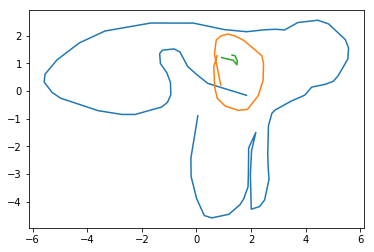

epoch 15701 in 0.176 s: loss = -0.2179, LR = -0.2450, LKL = 0.0271
epoch 15702 in 0.178 s: loss = -0.2805, LR = -0.3076, LKL = 0.0271
epoch 15703 in 0.173 s: loss = -0.2283, LR = -0.2554, LKL = 0.0271
epoch 15704 in 0.176 s: loss = -0.2818, LR = -0.3089, LKL = 0.0271
epoch 15705 in 0.176 s: loss = -0.2417, LR = -0.2687, LKL = 0.0270
epoch 15706 in 0.177 s: loss = -0.2375, LR = -0.2644, LKL = 0.0270
epoch 15707 in 0.176 s: loss = -0.2527, LR = -0.2798, LKL = 0.0271
epoch 15708 in 0.173 s: loss = -0.2667, LR = -0.2938, LKL = 0.0271
epoch 15709 in 0.175 s: loss = -0.2947, LR = -0.3217, LKL = 0.0271
epoch 15710 in 0.173 s: loss = -0.2642, LR = -0.2913, LKL = 0.0271
epoch 15711 in 0.174 s: loss = -0.2431, LR = -0.2701, LKL = 0.0270
epoch 15712 in 0.178 s: loss = -0.2558, LR = -0.2828, LKL = 0.0269
epoch 15713 in 0.174 s: loss = -0.2545, LR = -0.2815, LKL = 0.0270
epoch 15714 in 0.176 s: loss = -0.2809, LR = -0.3080, LKL = 0.0272
epoch 15715 in 0.175 s: loss = -0.2365, LR = -0.2633, LKL = 0.

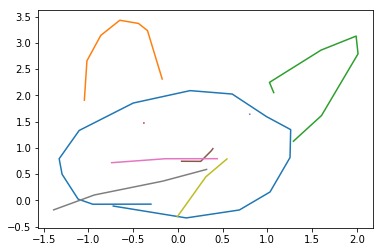

epoch 15801 in 0.176 s: loss = -0.2527, LR = -0.2797, LKL = 0.0270
epoch 15802 in 0.175 s: loss = -0.3166, LR = -0.3439, LKL = 0.0272
epoch 15803 in 0.179 s: loss = -0.3277, LR = -0.3548, LKL = 0.0272
epoch 15804 in 0.178 s: loss = -0.3000, LR = -0.3272, LKL = 0.0273
epoch 15805 in 0.178 s: loss = -0.2277, LR = -0.2549, LKL = 0.0272
epoch 15806 in 0.174 s: loss = -0.3015, LR = -0.3289, LKL = 0.0273
epoch 15807 in 0.174 s: loss = -0.2906, LR = -0.3177, LKL = 0.0271
epoch 15808 in 0.174 s: loss = -0.3194, LR = -0.3466, LKL = 0.0273
epoch 15809 in 0.179 s: loss = -0.2731, LR = -0.3003, LKL = 0.0272
epoch 15810 in 0.176 s: loss = -0.2503, LR = -0.2775, LKL = 0.0273
epoch 15811 in 0.176 s: loss = -0.3254, LR = -0.3526, LKL = 0.0272
epoch 15812 in 0.172 s: loss = -0.2686, LR = -0.2959, LKL = 0.0273
epoch 15813 in 0.176 s: loss = -0.2891, LR = -0.3162, LKL = 0.0271
epoch 15814 in 0.177 s: loss = -0.2670, LR = -0.2940, LKL = 0.0270
epoch 15815 in 0.179 s: loss = -0.2332, LR = -0.2603, LKL = 0.

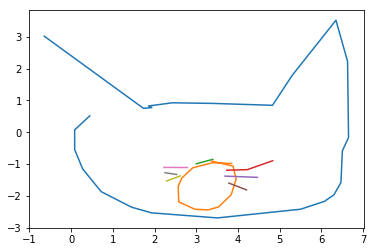

epoch 15901 in 0.177 s: loss = -0.2377, LR = -0.2649, LKL = 0.0272
epoch 15902 in 0.173 s: loss = -0.2189, LR = -0.2459, LKL = 0.0270
epoch 15903 in 0.176 s: loss = -0.2454, LR = -0.2724, LKL = 0.0270
epoch 15904 in 0.174 s: loss = -0.2970, LR = -0.3241, LKL = 0.0272
epoch 15905 in 0.177 s: loss = -0.2359, LR = -0.2630, LKL = 0.0271
epoch 15906 in 0.175 s: loss = -0.2473, LR = -0.2744, LKL = 0.0270
epoch 15907 in 0.176 s: loss = -0.2784, LR = -0.3055, LKL = 0.0271
epoch 15908 in 0.177 s: loss = -0.3073, LR = -0.3346, LKL = 0.0272
epoch 15909 in 0.176 s: loss = -0.3136, LR = -0.3409, LKL = 0.0273
epoch 15910 in 0.174 s: loss = -0.2724, LR = -0.2996, LKL = 0.0272
epoch 15911 in 0.177 s: loss = -0.2915, LR = -0.3188, LKL = 0.0273
epoch 15912 in 0.175 s: loss = -0.2800, LR = -0.3073, LKL = 0.0273
epoch 15913 in 0.177 s: loss = -0.2863, LR = -0.3134, LKL = 0.0271
epoch 15914 in 0.174 s: loss = -0.2979, LR = -0.3250, LKL = 0.0271
epoch 15915 in 0.172 s: loss = -0.3750, LR = -0.4022, LKL = 0.

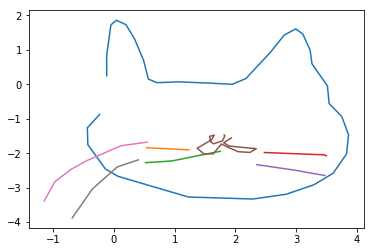

epoch 16001 in 0.175 s: loss = -0.2596, LR = -0.2866, LKL = 0.0270
epoch 16002 in 0.176 s: loss = -0.2715, LR = -0.2988, LKL = 0.0272
epoch 16003 in 0.178 s: loss = -0.2376, LR = -0.2649, LKL = 0.0273
epoch 16004 in 0.179 s: loss = -0.2920, LR = -0.3193, LKL = 0.0273
epoch 16005 in 0.178 s: loss = -0.2908, LR = -0.3181, LKL = 0.0273
epoch 16006 in 0.174 s: loss = -0.2809, LR = -0.3082, LKL = 0.0273
epoch 16007 in 0.177 s: loss = -0.2361, LR = -0.2634, LKL = 0.0273
epoch 16008 in 0.175 s: loss = -0.2697, LR = -0.2967, LKL = 0.0270
epoch 16009 in 0.176 s: loss = -0.2728, LR = -0.2999, LKL = 0.0271
epoch 16010 in 0.176 s: loss = -0.3148, LR = -0.3419, LKL = 0.0271
epoch 16011 in 0.176 s: loss = -0.3016, LR = -0.3290, LKL = 0.0274
epoch 16012 in 0.177 s: loss = -0.2212, LR = -0.2483, LKL = 0.0272
epoch 16013 in 0.179 s: loss = -0.3316, LR = -0.3590, LKL = 0.0275
epoch 16014 in 0.180 s: loss = -0.2558, LR = -0.2831, LKL = 0.0273
epoch 16015 in 0.179 s: loss = -0.2903, LR = -0.3176, LKL = 0.

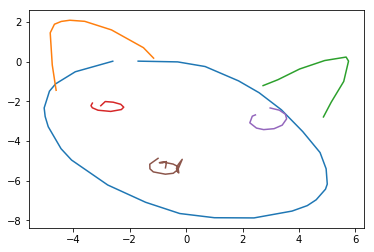

epoch 16101 in 0.175 s: loss = -0.2691, LR = -0.2963, LKL = 0.0273
epoch 16102 in 0.176 s: loss = -0.2863, LR = -0.3136, LKL = 0.0273
epoch 16103 in 0.176 s: loss = -0.3481, LR = -0.3755, LKL = 0.0274
epoch 16104 in 0.175 s: loss = -0.2207, LR = -0.2476, LKL = 0.0269
epoch 16105 in 0.179 s: loss = -0.2707, LR = -0.2979, LKL = 0.0272
epoch 16106 in 0.176 s: loss = -0.2802, LR = -0.3075, LKL = 0.0273
epoch 16107 in 0.176 s: loss = -0.2573, LR = -0.2845, LKL = 0.0272
epoch 16108 in 0.177 s: loss = -0.2698, LR = -0.2970, LKL = 0.0273
epoch 16109 in 0.175 s: loss = -0.2294, LR = -0.2566, LKL = 0.0273
epoch 16110 in 0.176 s: loss = -0.2773, LR = -0.3046, LKL = 0.0273
epoch 16111 in 0.177 s: loss = -0.2309, LR = -0.2580, LKL = 0.0271
epoch 16112 in 0.176 s: loss = -0.2456, LR = -0.2729, LKL = 0.0273
epoch 16113 in 0.177 s: loss = -0.2357, LR = -0.2628, LKL = 0.0272
epoch 16114 in 0.174 s: loss = -0.3218, LR = -0.3491, LKL = 0.0272
epoch 16115 in 0.178 s: loss = -0.2580, LR = -0.2852, LKL = 0.

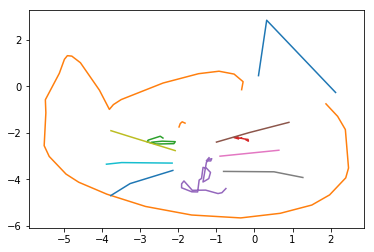

epoch 16201 in 0.171 s: loss = -0.2741, LR = -0.3015, LKL = 0.0274
epoch 16202 in 0.172 s: loss = -0.2302, LR = -0.2575, LKL = 0.0273
epoch 16203 in 0.174 s: loss = -0.3005, LR = -0.3277, LKL = 0.0272
epoch 16204 in 0.176 s: loss = -0.3190, LR = -0.3466, LKL = 0.0276
epoch 16205 in 0.174 s: loss = -0.3182, LR = -0.3458, LKL = 0.0275
epoch 16206 in 0.174 s: loss = -0.3288, LR = -0.3562, LKL = 0.0274
epoch 16207 in 0.173 s: loss = -0.2992, LR = -0.3265, LKL = 0.0273
epoch 16208 in 0.174 s: loss = -0.3234, LR = -0.3509, LKL = 0.0274
epoch 16209 in 0.170 s: loss = -0.2952, LR = -0.3226, LKL = 0.0273
epoch 16210 in 0.171 s: loss = -0.3295, LR = -0.3569, LKL = 0.0274
epoch 16211 in 0.171 s: loss = -0.2551, LR = -0.2824, LKL = 0.0274
epoch 16212 in 0.170 s: loss = -0.3302, LR = -0.3578, LKL = 0.0276
epoch 16213 in 0.174 s: loss = -0.3310, LR = -0.3584, LKL = 0.0274
epoch 16214 in 0.175 s: loss = -0.2890, LR = -0.3163, LKL = 0.0274
epoch 16215 in 0.171 s: loss = -0.2969, LR = -0.3242, LKL = 0.

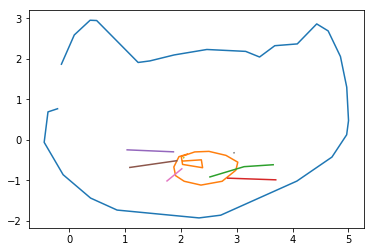

epoch 16301 in 0.177 s: loss = -0.3318, LR = -0.3594, LKL = 0.0276
epoch 16302 in 0.177 s: loss = -0.2930, LR = -0.3204, LKL = 0.0274
epoch 16303 in 0.174 s: loss = -0.2833, LR = -0.3107, LKL = 0.0274
epoch 16304 in 0.176 s: loss = -0.2794, LR = -0.3069, LKL = 0.0275
epoch 16305 in 0.177 s: loss = -0.3123, LR = -0.3398, LKL = 0.0275
epoch 16306 in 0.173 s: loss = -0.2012, LR = -0.2286, LKL = 0.0274
epoch 16307 in 0.178 s: loss = -0.2448, LR = -0.2721, LKL = 0.0273
epoch 16308 in 0.175 s: loss = -0.2815, LR = -0.3090, LKL = 0.0275
epoch 16309 in 0.171 s: loss = -0.3196, LR = -0.3470, LKL = 0.0274
epoch 16310 in 0.174 s: loss = -0.2581, LR = -0.2855, LKL = 0.0274
epoch 16311 in 0.178 s: loss = -0.2803, LR = -0.3079, LKL = 0.0276
epoch 16312 in 0.177 s: loss = -0.2943, LR = -0.3218, LKL = 0.0275
epoch 16313 in 0.177 s: loss = -0.2862, LR = -0.3136, LKL = 0.0273
epoch 16314 in 0.175 s: loss = -0.3112, LR = -0.3387, LKL = 0.0275
epoch 16315 in 0.179 s: loss = -0.3231, LR = -0.3506, LKL = 0.

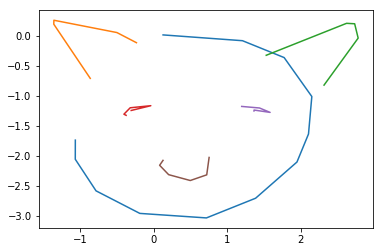

epoch 16401 in 0.174 s: loss = -0.3644, LR = -0.3919, LKL = 0.0274
epoch 16402 in 0.173 s: loss = -0.2785, LR = -0.3059, LKL = 0.0275
epoch 16403 in 0.168 s: loss = -0.2098, LR = -0.2370, LKL = 0.0273
epoch 16404 in 0.174 s: loss = -0.2593, LR = -0.2869, LKL = 0.0275
epoch 16405 in 0.171 s: loss = -0.2504, LR = -0.2778, LKL = 0.0274
epoch 16406 in 0.176 s: loss = -0.3323, LR = -0.3599, LKL = 0.0275
epoch 16407 in 0.169 s: loss = -0.2923, LR = -0.3198, LKL = 0.0275
epoch 16408 in 0.172 s: loss = -0.2984, LR = -0.3260, LKL = 0.0276
epoch 16409 in 0.174 s: loss = -0.2697, LR = -0.2973, LKL = 0.0275
epoch 16410 in 0.172 s: loss = -0.2635, LR = -0.2910, LKL = 0.0274
epoch 16411 in 0.176 s: loss = -0.2648, LR = -0.2922, LKL = 0.0274
epoch 16412 in 0.175 s: loss = -0.3424, LR = -0.3699, LKL = 0.0275
epoch 16413 in 0.173 s: loss = -0.2597, LR = -0.2871, LKL = 0.0274
epoch 16414 in 0.171 s: loss = -0.2558, LR = -0.2833, LKL = 0.0275
epoch 16415 in 0.172 s: loss = -0.2218, LR = -0.2491, LKL = 0.

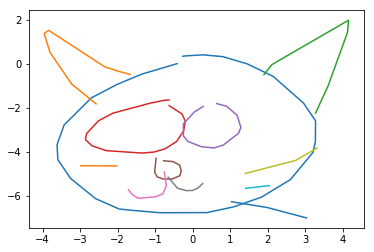

epoch 16501 in 0.173 s: loss = -0.2205, LR = -0.2481, LKL = 0.0276
epoch 16502 in 0.173 s: loss = -0.2450, LR = -0.2724, LKL = 0.0275
epoch 16503 in 0.174 s: loss = -0.2437, LR = -0.2714, LKL = 0.0277
epoch 16504 in 0.174 s: loss = -0.2838, LR = -0.3116, LKL = 0.0278
epoch 16505 in 0.173 s: loss = -0.2372, LR = -0.2646, LKL = 0.0274
epoch 16506 in 0.178 s: loss = -0.3151, LR = -0.3426, LKL = 0.0275
epoch 16507 in 0.174 s: loss = -0.2896, LR = -0.3170, LKL = 0.0274
epoch 16508 in 0.176 s: loss = -0.2589, LR = -0.2864, LKL = 0.0276
epoch 16509 in 0.177 s: loss = -0.1992, LR = -0.2267, LKL = 0.0274
epoch 16510 in 0.177 s: loss = -0.3211, LR = -0.3488, LKL = 0.0276
epoch 16511 in 0.174 s: loss = -0.2669, LR = -0.2944, LKL = 0.0275
epoch 16512 in 0.174 s: loss = -0.2923, LR = -0.3198, LKL = 0.0276
epoch 16513 in 0.176 s: loss = -0.2735, LR = -0.3009, LKL = 0.0274
epoch 16514 in 0.174 s: loss = -0.3044, LR = -0.3319, LKL = 0.0275
epoch 16515 in 0.171 s: loss = -0.2665, LR = -0.2940, LKL = 0.

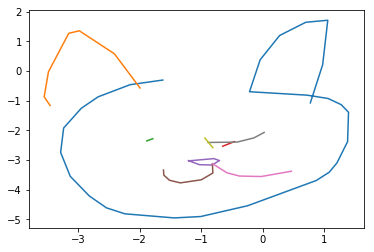

epoch 16601 in 0.179 s: loss = -0.2449, LR = -0.2724, LKL = 0.0275
epoch 16602 in 0.172 s: loss = -0.3318, LR = -0.3595, LKL = 0.0277
epoch 16603 in 0.175 s: loss = -0.1379, LR = -0.1652, LKL = 0.0273
epoch 16604 in 0.177 s: loss = -0.2434, LR = -0.2710, LKL = 0.0276
epoch 16605 in 0.178 s: loss = -0.3130, LR = -0.3407, LKL = 0.0277
epoch 16606 in 0.174 s: loss = -0.2217, LR = -0.2493, LKL = 0.0276
epoch 16607 in 0.178 s: loss = -0.2945, LR = -0.3221, LKL = 0.0276
epoch 16608 in 0.177 s: loss = -0.2940, LR = -0.3215, LKL = 0.0275
epoch 16609 in 0.175 s: loss = -0.2157, LR = -0.2431, LKL = 0.0275
epoch 16610 in 0.174 s: loss = -0.2951, LR = -0.3226, LKL = 0.0275
epoch 16611 in 0.179 s: loss = -0.3174, LR = -0.3449, LKL = 0.0276
epoch 16612 in 0.175 s: loss = -0.3325, LR = -0.3600, LKL = 0.0276
epoch 16613 in 0.175 s: loss = -0.3133, LR = -0.3410, LKL = 0.0277
epoch 16614 in 0.171 s: loss = -0.2924, LR = -0.3199, LKL = 0.0276
epoch 16615 in 0.173 s: loss = -0.2461, LR = -0.2736, LKL = 0.

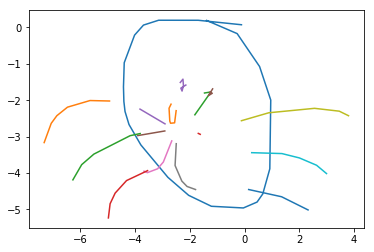

epoch 16701 in 0.178 s: loss = -0.3035, LR = -0.3311, LKL = 0.0276
epoch 16702 in 0.173 s: loss = -0.3418, LR = -0.3695, LKL = 0.0277
epoch 16703 in 0.170 s: loss = -0.2602, LR = -0.2879, LKL = 0.0277
epoch 16704 in 0.173 s: loss = -0.2571, LR = -0.2847, LKL = 0.0276
epoch 16705 in 0.173 s: loss = -0.2970, LR = -0.3246, LKL = 0.0276
epoch 16706 in 0.173 s: loss = -0.3312, LR = -0.3587, LKL = 0.0275
epoch 16707 in 0.171 s: loss = -0.3022, LR = -0.3298, LKL = 0.0276
epoch 16708 in 0.171 s: loss = -0.2963, LR = -0.3241, LKL = 0.0278
epoch 16709 in 0.173 s: loss = -0.2945, LR = -0.3220, LKL = 0.0275
epoch 16710 in 0.172 s: loss = -0.2584, LR = -0.2861, LKL = 0.0277
epoch 16711 in 0.178 s: loss = -0.2840, LR = -0.3116, LKL = 0.0276
epoch 16712 in 0.173 s: loss = -0.2582, LR = -0.2857, LKL = 0.0275
epoch 16713 in 0.172 s: loss = -0.2072, LR = -0.2348, LKL = 0.0277
epoch 16714 in 0.174 s: loss = -0.2622, LR = -0.2897, LKL = 0.0276
epoch 16715 in 0.173 s: loss = -0.2883, LR = -0.3158, LKL = 0.

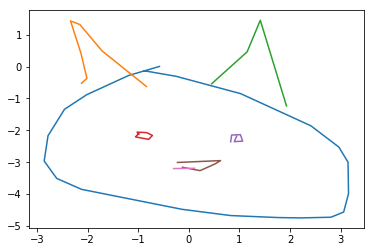

epoch 16801 in 0.174 s: loss = -0.2304, LR = -0.2578, LKL = 0.0274
epoch 16802 in 0.173 s: loss = -0.2348, LR = -0.2622, LKL = 0.0274
epoch 16803 in 0.174 s: loss = -0.2336, LR = -0.2614, LKL = 0.0278
epoch 16804 in 0.173 s: loss = -0.2802, LR = -0.3079, LKL = 0.0277
epoch 16805 in 0.176 s: loss = -0.2538, LR = -0.2815, LKL = 0.0277
epoch 16806 in 0.176 s: loss = -0.2495, LR = -0.2771, LKL = 0.0276
epoch 16807 in 0.180 s: loss = -0.2339, LR = -0.2616, LKL = 0.0277
epoch 16808 in 0.175 s: loss = -0.2832, LR = -0.3108, LKL = 0.0276
epoch 16809 in 0.178 s: loss = -0.2334, LR = -0.2611, LKL = 0.0277
epoch 16810 in 0.175 s: loss = -0.2193, LR = -0.2468, LKL = 0.0276
epoch 16811 in 0.176 s: loss = -0.2855, LR = -0.3130, LKL = 0.0275
epoch 16812 in 0.175 s: loss = -0.2729, LR = -0.3005, LKL = 0.0277
epoch 16813 in 0.175 s: loss = -0.2841, LR = -0.3118, LKL = 0.0278
epoch 16814 in 0.174 s: loss = -0.2641, LR = -0.2918, LKL = 0.0277
epoch 16815 in 0.178 s: loss = -0.3461, LR = -0.3738, LKL = 0.

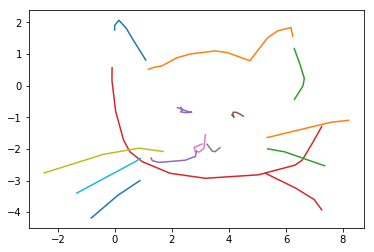

epoch 16901 in 0.174 s: loss = -0.2803, LR = -0.3082, LKL = 0.0279
epoch 16902 in 0.178 s: loss = -0.2569, LR = -0.2847, LKL = 0.0278
epoch 16903 in 0.176 s: loss = -0.1637, LR = -0.1911, LKL = 0.0274
epoch 16904 in 0.175 s: loss = -0.2897, LR = -0.3177, LKL = 0.0280
epoch 16905 in 0.177 s: loss = -0.2472, LR = -0.2750, LKL = 0.0279
epoch 16906 in 0.173 s: loss = -0.2172, LR = -0.2448, LKL = 0.0276
epoch 16907 in 0.178 s: loss = -0.1440, LR = -0.1716, LKL = 0.0276
epoch 16908 in 0.175 s: loss = -0.2471, LR = -0.2749, LKL = 0.0278
epoch 16909 in 0.176 s: loss = -0.2668, LR = -0.2946, LKL = 0.0279
epoch 16910 in 0.172 s: loss = -0.2856, LR = -0.3133, LKL = 0.0276
epoch 16911 in 0.175 s: loss = -0.2624, LR = -0.2900, LKL = 0.0276
epoch 16912 in 0.177 s: loss = -0.3107, LR = -0.3385, LKL = 0.0278
epoch 16913 in 0.176 s: loss = -0.1672, LR = -0.1947, LKL = 0.0275
epoch 16914 in 0.173 s: loss = -0.2474, LR = -0.2751, LKL = 0.0277
epoch 16915 in 0.173 s: loss = -0.2699, LR = -0.2977, LKL = 0.

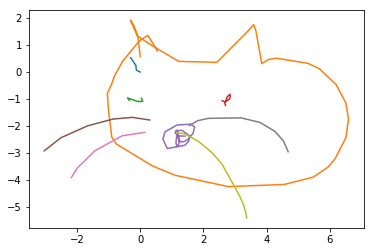

epoch 17001 in 0.173 s: loss = -0.3185, LR = -0.3463, LKL = 0.0278
epoch 17002 in 0.178 s: loss = -0.2772, LR = -0.3048, LKL = 0.0276
epoch 17003 in 0.173 s: loss = -0.3066, LR = -0.3343, LKL = 0.0277
epoch 17004 in 0.173 s: loss = -0.3383, LR = -0.3660, LKL = 0.0277
epoch 17005 in 0.174 s: loss = -0.3269, LR = -0.3547, LKL = 0.0278
epoch 17006 in 0.172 s: loss = -0.2223, LR = -0.2499, LKL = 0.0277
epoch 17007 in 0.175 s: loss = -0.2464, LR = -0.2742, LKL = 0.0277
epoch 17008 in 0.178 s: loss = -0.3282, LR = -0.3559, LKL = 0.0277
epoch 17009 in 0.175 s: loss = -0.3432, LR = -0.3709, LKL = 0.0277
epoch 17010 in 0.176 s: loss = -0.2397, LR = -0.2672, LKL = 0.0275
epoch 17011 in 0.176 s: loss = -0.2625, LR = -0.2900, LKL = 0.0275
epoch 17012 in 0.180 s: loss = -0.2904, LR = -0.3182, LKL = 0.0278
epoch 17013 in 0.174 s: loss = -0.2391, LR = -0.2667, LKL = 0.0276
epoch 17014 in 0.175 s: loss = -0.2728, LR = -0.3005, LKL = 0.0277
epoch 17015 in 0.177 s: loss = -0.3028, LR = -0.3303, LKL = 0.

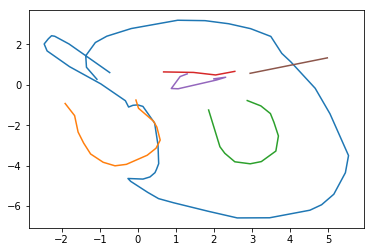

epoch 17101 in 0.175 s: loss = -0.2725, LR = -0.3003, LKL = 0.0277
epoch 17102 in 0.176 s: loss = -0.2570, LR = -0.2847, LKL = 0.0277
epoch 17103 in 0.173 s: loss = -0.2137, LR = -0.2412, LKL = 0.0275
epoch 17104 in 0.172 s: loss = -0.2667, LR = -0.2944, LKL = 0.0278
epoch 17105 in 0.174 s: loss = -0.3646, LR = -0.3924, LKL = 0.0278
epoch 17106 in 0.173 s: loss = -0.3341, LR = -0.3619, LKL = 0.0278
epoch 17107 in 0.172 s: loss = -0.2959, LR = -0.3236, LKL = 0.0277
epoch 17108 in 0.175 s: loss = -0.2810, LR = -0.3087, LKL = 0.0277
epoch 17109 in 0.172 s: loss = -0.2822, LR = -0.3098, LKL = 0.0276
epoch 17110 in 0.175 s: loss = -0.3133, LR = -0.3412, LKL = 0.0279
epoch 17111 in 0.176 s: loss = -0.2681, LR = -0.2958, LKL = 0.0277
epoch 17112 in 0.173 s: loss = -0.2758, LR = -0.3035, LKL = 0.0278
epoch 17113 in 0.170 s: loss = -0.3002, LR = -0.3279, LKL = 0.0277
epoch 17114 in 0.175 s: loss = -0.2608, LR = -0.2884, LKL = 0.0276
epoch 17115 in 0.178 s: loss = -0.3234, LR = -0.3511, LKL = 0.

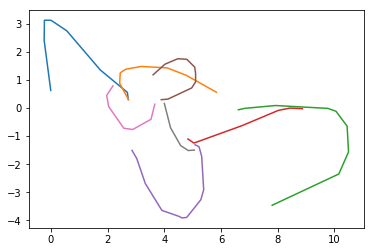

epoch 17201 in 0.175 s: loss = -0.2928, LR = -0.3208, LKL = 0.0280
epoch 17202 in 0.173 s: loss = -0.2343, LR = -0.2620, LKL = 0.0277
epoch 17203 in 0.173 s: loss = -0.2906, LR = -0.3184, LKL = 0.0278
epoch 17204 in 0.175 s: loss = -0.2638, LR = -0.2916, LKL = 0.0278
epoch 17205 in 0.177 s: loss = -0.3423, LR = -0.3702, LKL = 0.0280
epoch 17206 in 0.170 s: loss = -0.3039, LR = -0.3317, LKL = 0.0279
epoch 17207 in 0.175 s: loss = -0.3624, LR = -0.3904, LKL = 0.0280
epoch 17208 in 0.172 s: loss = -0.2598, LR = -0.2876, LKL = 0.0278
epoch 17209 in 0.177 s: loss = -0.2365, LR = -0.2641, LKL = 0.0276
epoch 17210 in 0.175 s: loss = -0.3088, LR = -0.3366, LKL = 0.0278
epoch 17211 in 0.170 s: loss = -0.3025, LR = -0.3302, LKL = 0.0277
epoch 17212 in 0.173 s: loss = -0.2942, LR = -0.3219, LKL = 0.0277
epoch 17213 in 0.175 s: loss = -0.2544, LR = -0.2822, LKL = 0.0278
epoch 17214 in 0.170 s: loss = -0.2795, LR = -0.3072, LKL = 0.0277
epoch 17215 in 0.176 s: loss = -0.2155, LR = -0.2430, LKL = 0.

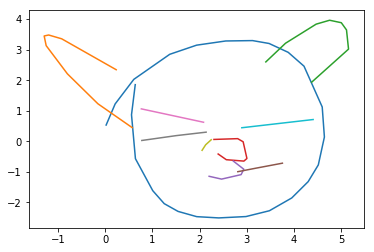

epoch 17301 in 0.177 s: loss = -0.2208, LR = -0.2485, LKL = 0.0277
epoch 17302 in 0.175 s: loss = -0.2840, LR = -0.3118, LKL = 0.0278
epoch 17303 in 0.176 s: loss = -0.3250, LR = -0.3527, LKL = 0.0277
epoch 17304 in 0.178 s: loss = -0.2746, LR = -0.3022, LKL = 0.0276
epoch 17305 in 0.177 s: loss = -0.2840, LR = -0.3119, LKL = 0.0279
epoch 17306 in 0.179 s: loss = -0.2922, LR = -0.3201, LKL = 0.0279
epoch 17307 in 0.177 s: loss = -0.2954, LR = -0.3232, LKL = 0.0278
epoch 17308 in 0.178 s: loss = -0.2944, LR = -0.3223, LKL = 0.0279
epoch 17309 in 0.178 s: loss = -0.2845, LR = -0.3121, LKL = 0.0276
epoch 17310 in 0.177 s: loss = -0.2931, LR = -0.3208, LKL = 0.0278
epoch 17311 in 0.174 s: loss = -0.2344, LR = -0.2622, LKL = 0.0278
epoch 17312 in 0.179 s: loss = -0.2900, LR = -0.3176, LKL = 0.0276
epoch 17313 in 0.173 s: loss = -0.2296, LR = -0.2571, LKL = 0.0276
epoch 17314 in 0.175 s: loss = -0.3178, LR = -0.3455, LKL = 0.0278
epoch 17315 in 0.177 s: loss = -0.2909, LR = -0.3186, LKL = 0.

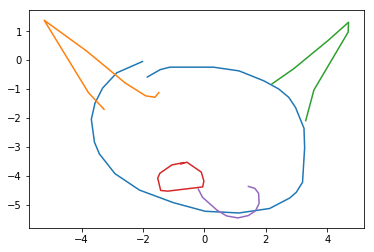

epoch 17401 in 0.176 s: loss = -0.3206, LR = -0.3486, LKL = 0.0279
epoch 17402 in 0.176 s: loss = -0.2885, LR = -0.3162, LKL = 0.0277
epoch 17403 in 0.178 s: loss = -0.3353, LR = -0.3631, LKL = 0.0278
epoch 17404 in 0.174 s: loss = -0.3136, LR = -0.3415, LKL = 0.0279
epoch 17405 in 0.178 s: loss = -0.3168, LR = -0.3446, LKL = 0.0278
epoch 17406 in 0.177 s: loss = -0.2878, LR = -0.3156, LKL = 0.0279
epoch 17407 in 0.173 s: loss = -0.3019, LR = -0.3298, LKL = 0.0279
epoch 17408 in 0.170 s: loss = -0.2345, LR = -0.2624, LKL = 0.0278
epoch 17409 in 0.176 s: loss = -0.1918, LR = -0.2196, LKL = 0.0278
epoch 17410 in 0.180 s: loss = -0.2625, LR = -0.2902, LKL = 0.0278
epoch 17411 in 0.176 s: loss = -0.2697, LR = -0.2975, LKL = 0.0278
epoch 17412 in 0.177 s: loss = -0.3021, LR = -0.3301, LKL = 0.0280
epoch 17413 in 0.177 s: loss = -0.2079, LR = -0.2358, LKL = 0.0279
epoch 17414 in 0.176 s: loss = -0.2719, LR = -0.2995, LKL = 0.0277
epoch 17415 in 0.173 s: loss = -0.2270, LR = -0.2548, LKL = 0.

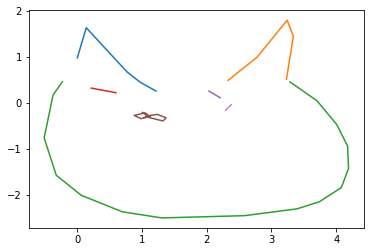

epoch 17501 in 0.176 s: loss = -0.2977, LR = -0.3254, LKL = 0.0278
epoch 17502 in 0.169 s: loss = -0.3222, LR = -0.3502, LKL = 0.0280
epoch 17503 in 0.175 s: loss = -0.3059, LR = -0.3337, LKL = 0.0278
epoch 17504 in 0.179 s: loss = -0.2846, LR = -0.3123, LKL = 0.0277
epoch 17505 in 0.181 s: loss = -0.2743, LR = -0.3021, LKL = 0.0278
epoch 17506 in 0.178 s: loss = -0.3762, LR = -0.4041, LKL = 0.0279
epoch 17507 in 0.177 s: loss = -0.2748, LR = -0.3025, LKL = 0.0277
epoch 17508 in 0.178 s: loss = -0.3262, LR = -0.3542, LKL = 0.0280
epoch 17509 in 0.177 s: loss = -0.2365, LR = -0.2643, LKL = 0.0278
epoch 17510 in 0.179 s: loss = -0.2285, LR = -0.2563, LKL = 0.0278
epoch 17511 in 0.177 s: loss = -0.3458, LR = -0.3736, LKL = 0.0278
epoch 17512 in 0.177 s: loss = -0.2679, LR = -0.2956, LKL = 0.0276
epoch 17513 in 0.175 s: loss = -0.2521, LR = -0.2799, LKL = 0.0278
epoch 17514 in 0.174 s: loss = -0.3271, LR = -0.3550, LKL = 0.0279
epoch 17515 in 0.179 s: loss = -0.2676, LR = -0.2953, LKL = 0.

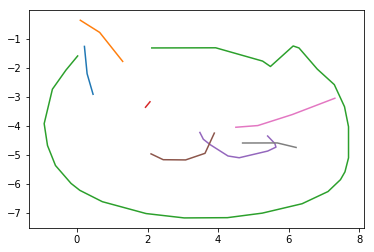

epoch 17601 in 0.173 s: loss = -0.3076, LR = -0.3356, LKL = 0.0279
epoch 17602 in 0.178 s: loss = -0.3321, LR = -0.3599, LKL = 0.0279
epoch 17603 in 0.176 s: loss = -0.2948, LR = -0.3228, LKL = 0.0279
epoch 17604 in 0.178 s: loss = -0.2531, LR = -0.2808, LKL = 0.0277
epoch 17605 in 0.175 s: loss = -0.3166, LR = -0.3445, LKL = 0.0279
epoch 17606 in 0.176 s: loss = -0.2735, LR = -0.3014, LKL = 0.0279
epoch 17607 in 0.178 s: loss = -0.2913, LR = -0.3190, LKL = 0.0277
epoch 17608 in 0.174 s: loss = -0.3387, LR = -0.3668, LKL = 0.0280
epoch 17609 in 0.180 s: loss = -0.3184, LR = -0.3466, LKL = 0.0282
epoch 17610 in 0.173 s: loss = -0.2525, LR = -0.2804, LKL = 0.0279
epoch 17611 in 0.177 s: loss = -0.2734, LR = -0.3012, LKL = 0.0278
epoch 17612 in 0.176 s: loss = -0.3157, LR = -0.3434, LKL = 0.0277
epoch 17613 in 0.180 s: loss = -0.3114, LR = -0.3393, LKL = 0.0279
epoch 17614 in 0.176 s: loss = -0.3045, LR = -0.3323, LKL = 0.0278
epoch 17615 in 0.178 s: loss = -0.3329, LR = -0.3607, LKL = 0.

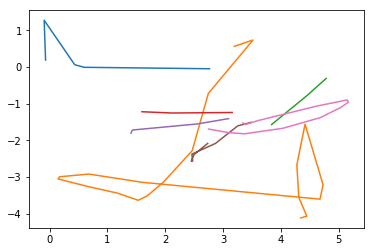

epoch 17701 in 0.175 s: loss = -0.3357, LR = -0.3639, LKL = 0.0282
epoch 17702 in 0.174 s: loss = -0.3330, LR = -0.3611, LKL = 0.0281
epoch 17703 in 0.172 s: loss = -0.2356, LR = -0.2634, LKL = 0.0278
epoch 17704 in 0.171 s: loss = -0.3183, LR = -0.3463, LKL = 0.0280
epoch 17705 in 0.175 s: loss = -0.3278, LR = -0.3558, LKL = 0.0280
epoch 17706 in 0.178 s: loss = -0.3072, LR = -0.3353, LKL = 0.0281
epoch 17707 in 0.174 s: loss = -0.2987, LR = -0.3266, LKL = 0.0279
epoch 17708 in 0.170 s: loss = -0.2288, LR = -0.2567, LKL = 0.0279
epoch 17709 in 0.172 s: loss = -0.3055, LR = -0.3335, LKL = 0.0280
epoch 17710 in 0.174 s: loss = -0.3590, LR = -0.3870, LKL = 0.0280
epoch 17711 in 0.177 s: loss = -0.2488, LR = -0.2768, LKL = 0.0279
epoch 17712 in 0.174 s: loss = -0.3767, LR = -0.4048, LKL = 0.0280
epoch 17713 in 0.175 s: loss = -0.3091, LR = -0.3371, LKL = 0.0280
epoch 17714 in 0.174 s: loss = -0.2840, LR = -0.3122, LKL = 0.0282
epoch 17715 in 0.176 s: loss = -0.2310, LR = -0.2587, LKL = 0.

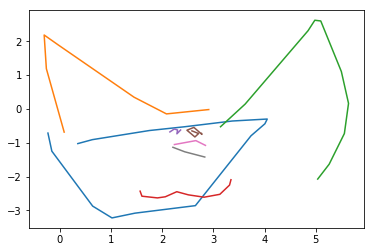

epoch 17801 in 0.177 s: loss = -0.2928, LR = -0.3208, LKL = 0.0280
epoch 17802 in 0.168 s: loss = -0.2533, LR = -0.2811, LKL = 0.0277
epoch 17803 in 0.170 s: loss = -0.3342, LR = -0.3623, LKL = 0.0281
epoch 17804 in 0.169 s: loss = -0.2977, LR = -0.3257, LKL = 0.0280
epoch 17805 in 0.174 s: loss = -0.3847, LR = -0.4128, LKL = 0.0281
epoch 17806 in 0.174 s: loss = -0.2744, LR = -0.3025, LKL = 0.0281
epoch 17807 in 0.178 s: loss = -0.2664, LR = -0.2942, LKL = 0.0278
epoch 17808 in 0.180 s: loss = -0.3064, LR = -0.3345, LKL = 0.0281
epoch 17809 in 0.177 s: loss = -0.2965, LR = -0.3243, LKL = 0.0278
epoch 17810 in 0.176 s: loss = -0.2563, LR = -0.2842, LKL = 0.0279
epoch 17811 in 0.178 s: loss = -0.3235, LR = -0.3516, LKL = 0.0281
epoch 17812 in 0.176 s: loss = -0.3049, LR = -0.3329, LKL = 0.0280
epoch 17813 in 0.176 s: loss = -0.3106, LR = -0.3385, LKL = 0.0279
epoch 17814 in 0.175 s: loss = -0.3162, LR = -0.3443, LKL = 0.0281
epoch 17815 in 0.179 s: loss = -0.3104, LR = -0.3386, LKL = 0.

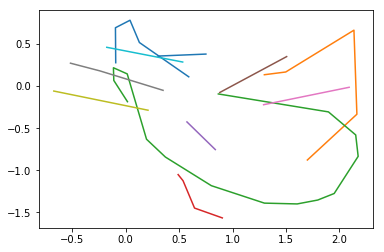

epoch 17901 in 0.175 s: loss = -0.2567, LR = -0.2848, LKL = 0.0281
epoch 17902 in 0.175 s: loss = -0.2707, LR = -0.2987, LKL = 0.0280
epoch 17903 in 0.174 s: loss = -0.2529, LR = -0.2808, LKL = 0.0279
epoch 17904 in 0.176 s: loss = -0.2731, LR = -0.3012, LKL = 0.0281
epoch 17905 in 0.177 s: loss = -0.3395, LR = -0.3677, LKL = 0.0282
epoch 17906 in 0.177 s: loss = -0.3308, LR = -0.3588, LKL = 0.0281
epoch 17907 in 0.180 s: loss = -0.2553, LR = -0.2834, LKL = 0.0281
epoch 17908 in 0.176 s: loss = -0.2875, LR = -0.3156, LKL = 0.0281
epoch 17909 in 0.179 s: loss = -0.2604, LR = -0.2884, LKL = 0.0279
epoch 17910 in 0.176 s: loss = -0.2910, LR = -0.3190, LKL = 0.0280
epoch 17911 in 0.178 s: loss = -0.3117, LR = -0.3398, LKL = 0.0281
epoch 17912 in 0.177 s: loss = -0.3212, LR = -0.3493, LKL = 0.0281
epoch 17913 in 0.177 s: loss = -0.2917, LR = -0.3196, LKL = 0.0279
epoch 17914 in 0.177 s: loss = -0.2619, LR = -0.2900, LKL = 0.0281
epoch 17915 in 0.179 s: loss = -0.2466, LR = -0.2745, LKL = 0.

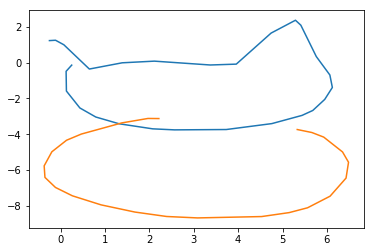

epoch 18001 in 0.174 s: loss = -0.2726, LR = -0.3007, LKL = 0.0280
epoch 18002 in 0.175 s: loss = -0.3159, LR = -0.3439, LKL = 0.0280
epoch 18003 in 0.176 s: loss = -0.3019, LR = -0.3298, LKL = 0.0279
epoch 18004 in 0.176 s: loss = -0.3050, LR = -0.3330, LKL = 0.0280
epoch 18005 in 0.178 s: loss = -0.2996, LR = -0.3276, LKL = 0.0280
epoch 18006 in 0.179 s: loss = -0.2813, LR = -0.3092, LKL = 0.0279
epoch 18007 in 0.177 s: loss = -0.2851, LR = -0.3130, LKL = 0.0279
epoch 18008 in 0.176 s: loss = -0.2965, LR = -0.3245, LKL = 0.0280
epoch 18009 in 0.178 s: loss = -0.2537, LR = -0.2815, LKL = 0.0278
epoch 18010 in 0.174 s: loss = -0.2824, LR = -0.3102, LKL = 0.0279
epoch 18011 in 0.172 s: loss = -0.2954, LR = -0.3234, LKL = 0.0280
epoch 18012 in 0.175 s: loss = -0.2643, LR = -0.2922, LKL = 0.0279
epoch 18013 in 0.174 s: loss = -0.3421, LR = -0.3704, LKL = 0.0283
epoch 18014 in 0.177 s: loss = -0.3400, LR = -0.3680, LKL = 0.0281
epoch 18015 in 0.172 s: loss = -0.2914, LR = -0.3193, LKL = 0.

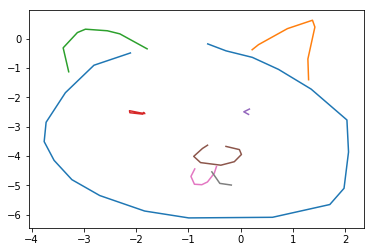

epoch 18101 in 0.175 s: loss = -0.2110, LR = -0.2388, LKL = 0.0278
epoch 18102 in 0.174 s: loss = -0.3183, LR = -0.3464, LKL = 0.0281
epoch 18103 in 0.172 s: loss = -0.3304, LR = -0.3585, LKL = 0.0282
epoch 18104 in 0.175 s: loss = -0.2963, LR = -0.3242, LKL = 0.0279
epoch 18105 in 0.171 s: loss = -0.2905, LR = -0.3184, LKL = 0.0280
epoch 18106 in 0.174 s: loss = -0.3010, LR = -0.3290, LKL = 0.0280
epoch 18107 in 0.171 s: loss = -0.3174, LR = -0.3457, LKL = 0.0284
epoch 18108 in 0.174 s: loss = -0.3769, LR = -0.4053, LKL = 0.0284
epoch 18109 in 0.173 s: loss = -0.3149, LR = -0.3430, LKL = 0.0281
epoch 18110 in 0.175 s: loss = -0.2920, LR = -0.3202, LKL = 0.0281
epoch 18111 in 0.173 s: loss = -0.2732, LR = -0.3014, LKL = 0.0282
epoch 18112 in 0.175 s: loss = -0.3002, LR = -0.3283, LKL = 0.0281
epoch 18113 in 0.172 s: loss = -0.3002, LR = -0.3283, LKL = 0.0281
epoch 18114 in 0.175 s: loss = -0.2762, LR = -0.3043, LKL = 0.0281
epoch 18115 in 0.172 s: loss = -0.2703, LR = -0.2985, LKL = 0.

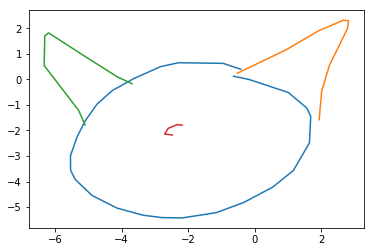

epoch 18201 in 0.175 s: loss = -0.3166, LR = -0.3447, LKL = 0.0281
epoch 18202 in 0.174 s: loss = -0.3029, LR = -0.3312, LKL = 0.0283
epoch 18203 in 0.174 s: loss = -0.2705, LR = -0.2984, LKL = 0.0279
epoch 18204 in 0.173 s: loss = -0.2470, LR = -0.2752, LKL = 0.0282
epoch 18205 in 0.175 s: loss = -0.3400, LR = -0.3682, LKL = 0.0281
epoch 18206 in 0.175 s: loss = -0.2894, LR = -0.3176, LKL = 0.0282
epoch 18207 in 0.173 s: loss = -0.3709, LR = -0.3991, LKL = 0.0282
epoch 18208 in 0.172 s: loss = -0.2674, LR = -0.2954, LKL = 0.0280
epoch 18209 in 0.177 s: loss = -0.3490, LR = -0.3774, LKL = 0.0284
epoch 18210 in 0.176 s: loss = -0.3172, LR = -0.3454, LKL = 0.0282
epoch 18211 in 0.173 s: loss = -0.3459, LR = -0.3743, LKL = 0.0284
epoch 18212 in 0.174 s: loss = -0.2793, LR = -0.3074, LKL = 0.0282
epoch 18213 in 0.175 s: loss = -0.2466, LR = -0.2746, LKL = 0.0280
epoch 18214 in 0.172 s: loss = -0.2585, LR = -0.2865, LKL = 0.0280
epoch 18215 in 0.175 s: loss = -0.2814, LR = -0.3096, LKL = 0.

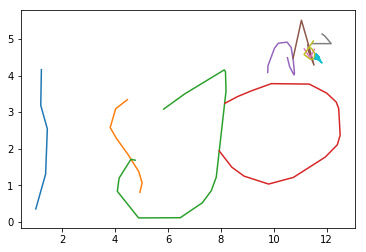

epoch 18301 in 0.174 s: loss = -0.3698, LR = -0.3982, LKL = 0.0284
epoch 18302 in 0.172 s: loss = -0.3440, LR = -0.3722, LKL = 0.0282
epoch 18303 in 0.172 s: loss = -0.3388, LR = -0.3672, LKL = 0.0283
epoch 18304 in 0.172 s: loss = -0.3064, LR = -0.3346, LKL = 0.0283
epoch 18305 in 0.175 s: loss = -0.3157, LR = -0.3439, LKL = 0.0283
epoch 18306 in 0.175 s: loss = -0.2907, LR = -0.3190, LKL = 0.0283
epoch 18307 in 0.169 s: loss = -0.3181, LR = -0.3464, LKL = 0.0283
epoch 18308 in 0.173 s: loss = -0.3070, LR = -0.3353, LKL = 0.0283
epoch 18309 in 0.171 s: loss = -0.3183, LR = -0.3465, LKL = 0.0282
epoch 18310 in 0.172 s: loss = -0.2366, LR = -0.2649, LKL = 0.0283
epoch 18311 in 0.173 s: loss = -0.2348, LR = -0.2630, LKL = 0.0281
epoch 18312 in 0.172 s: loss = -0.2720, LR = -0.3003, LKL = 0.0283
epoch 18313 in 0.173 s: loss = -0.2735, LR = -0.3018, LKL = 0.0283
epoch 18314 in 0.172 s: loss = -0.3342, LR = -0.3625, LKL = 0.0283
epoch 18315 in 0.174 s: loss = -0.2507, LR = -0.2787, LKL = 0.

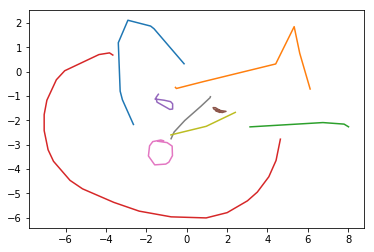

epoch 18401 in 0.176 s: loss = -0.3466, LR = -0.3750, LKL = 0.0284
epoch 18402 in 0.174 s: loss = -0.2993, LR = -0.3278, LKL = 0.0285
epoch 18403 in 0.170 s: loss = -0.2905, LR = -0.3185, LKL = 0.0280
epoch 18404 in 0.172 s: loss = -0.3297, LR = -0.3579, LKL = 0.0282
epoch 18405 in 0.172 s: loss = -0.3375, LR = -0.3658, LKL = 0.0283
epoch 18406 in 0.173 s: loss = -0.3163, LR = -0.3446, LKL = 0.0282
epoch 18407 in 0.173 s: loss = -0.3035, LR = -0.3318, LKL = 0.0283
epoch 18408 in 0.175 s: loss = -0.3158, LR = -0.3443, LKL = 0.0285
epoch 18409 in 0.175 s: loss = -0.2976, LR = -0.3260, LKL = 0.0284
epoch 18410 in 0.175 s: loss = -0.4171, LR = -0.4456, LKL = 0.0285
epoch 18411 in 0.175 s: loss = -0.3111, LR = -0.3394, LKL = 0.0283
epoch 18412 in 0.177 s: loss = -0.2757, LR = -0.3040, LKL = 0.0282
epoch 18413 in 0.173 s: loss = -0.3175, LR = -0.3459, LKL = 0.0283
epoch 18414 in 0.172 s: loss = -0.3330, LR = -0.3612, LKL = 0.0283
epoch 18415 in 0.173 s: loss = -0.2871, LR = -0.3154, LKL = 0.

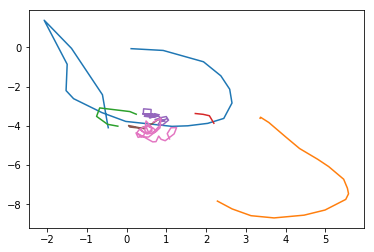

epoch 18501 in 0.177 s: loss = -0.2941, LR = -0.3224, LKL = 0.0283
epoch 18502 in 0.173 s: loss = -0.3429, LR = -0.3713, LKL = 0.0285
epoch 18503 in 0.173 s: loss = -0.3582, LR = -0.3866, LKL = 0.0284
epoch 18504 in 0.174 s: loss = -0.3352, LR = -0.3637, LKL = 0.0285
epoch 18505 in 0.173 s: loss = -0.3460, LR = -0.3744, LKL = 0.0284
epoch 18506 in 0.173 s: loss = -0.3090, LR = -0.3373, LKL = 0.0283
epoch 18507 in 0.174 s: loss = -0.2858, LR = -0.3140, LKL = 0.0282
epoch 18508 in 0.173 s: loss = -0.3572, LR = -0.3856, LKL = 0.0285
epoch 18509 in 0.173 s: loss = -0.3187, LR = -0.3470, LKL = 0.0283
epoch 18510 in 0.174 s: loss = -0.2668, LR = -0.2951, LKL = 0.0283
epoch 18511 in 0.177 s: loss = -0.3327, LR = -0.3610, LKL = 0.0284
epoch 18512 in 0.172 s: loss = -0.2611, LR = -0.2892, LKL = 0.0281
epoch 18513 in 0.178 s: loss = -0.2961, LR = -0.3246, LKL = 0.0285
epoch 18514 in 0.177 s: loss = -0.3545, LR = -0.3829, LKL = 0.0283
epoch 18515 in 0.176 s: loss = -0.2440, LR = -0.2723, LKL = 0.

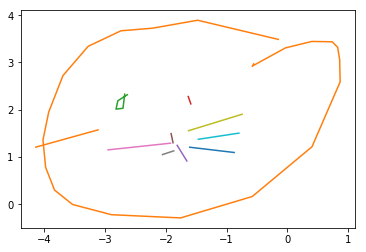

epoch 18601 in 0.178 s: loss = -0.3067, LR = -0.3353, LKL = 0.0286
epoch 18602 in 0.174 s: loss = -0.2772, LR = -0.3056, LKL = 0.0284
epoch 18603 in 0.173 s: loss = -0.2399, LR = -0.2683, LKL = 0.0284
epoch 18604 in 0.177 s: loss = -0.3621, LR = -0.3908, LKL = 0.0288
epoch 18605 in 0.174 s: loss = -0.2371, LR = -0.2654, LKL = 0.0284
epoch 18606 in 0.173 s: loss = -0.2296, LR = -0.2580, LKL = 0.0283
epoch 18607 in 0.175 s: loss = -0.3508, LR = -0.3792, LKL = 0.0285
epoch 18608 in 0.173 s: loss = -0.3210, LR = -0.3494, LKL = 0.0284
epoch 18609 in 0.175 s: loss = -0.2418, LR = -0.2702, LKL = 0.0283
epoch 18610 in 0.173 s: loss = -0.3147, LR = -0.3432, LKL = 0.0285
epoch 18611 in 0.178 s: loss = -0.3065, LR = -0.3349, LKL = 0.0284
epoch 18612 in 0.177 s: loss = -0.3567, LR = -0.3852, LKL = 0.0285
epoch 18613 in 0.175 s: loss = -0.3611, LR = -0.3893, LKL = 0.0283
epoch 18614 in 0.172 s: loss = -0.2901, LR = -0.3186, LKL = 0.0285
epoch 18615 in 0.172 s: loss = -0.2983, LR = -0.3267, LKL = 0.

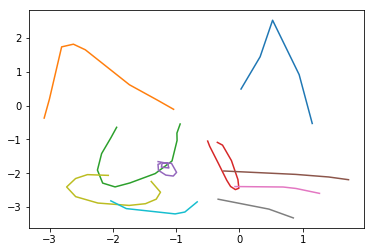

epoch 18701 in 0.178 s: loss = -0.2801, LR = -0.3087, LKL = 0.0286
epoch 18702 in 0.173 s: loss = -0.2584, LR = -0.2867, LKL = 0.0284
epoch 18703 in 0.173 s: loss = -0.3313, LR = -0.3601, LKL = 0.0288
epoch 18704 in 0.175 s: loss = -0.3192, LR = -0.3479, LKL = 0.0286
epoch 18705 in 0.173 s: loss = -0.3218, LR = -0.3503, LKL = 0.0285
epoch 18706 in 0.175 s: loss = -0.3423, LR = -0.3710, LKL = 0.0287
epoch 18707 in 0.175 s: loss = -0.2306, LR = -0.2590, LKL = 0.0284
epoch 18708 in 0.172 s: loss = -0.2440, LR = -0.2724, LKL = 0.0284
epoch 18709 in 0.174 s: loss = -0.3012, LR = -0.3297, LKL = 0.0285
epoch 18710 in 0.172 s: loss = -0.2699, LR = -0.2983, LKL = 0.0284
epoch 18711 in 0.175 s: loss = -0.3297, LR = -0.3584, LKL = 0.0287
epoch 18712 in 0.177 s: loss = -0.3117, LR = -0.3403, LKL = 0.0286
epoch 18713 in 0.174 s: loss = -0.2835, LR = -0.3122, LKL = 0.0287
epoch 18714 in 0.178 s: loss = -0.3127, LR = -0.3412, LKL = 0.0285
epoch 18715 in 0.177 s: loss = -0.3018, LR = -0.3304, LKL = 0.

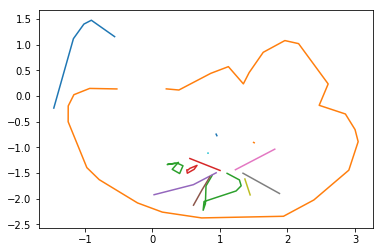

epoch 18801 in 0.175 s: loss = -0.3598, LR = -0.3885, LKL = 0.0287
epoch 18802 in 0.174 s: loss = -0.3360, LR = -0.3645, LKL = 0.0285
epoch 18803 in 0.175 s: loss = -0.3519, LR = -0.3805, LKL = 0.0285
epoch 18804 in 0.173 s: loss = -0.2518, LR = -0.2803, LKL = 0.0285
epoch 18805 in 0.174 s: loss = -0.3234, LR = -0.3520, LKL = 0.0286
epoch 18806 in 0.172 s: loss = -0.3590, LR = -0.3875, LKL = 0.0286
epoch 18807 in 0.173 s: loss = -0.3134, LR = -0.3419, LKL = 0.0285
epoch 18808 in 0.177 s: loss = -0.2886, LR = -0.3170, LKL = 0.0284
epoch 18809 in 0.178 s: loss = -0.3088, LR = -0.3374, LKL = 0.0286
epoch 18810 in 0.174 s: loss = -0.3326, LR = -0.3613, LKL = 0.0286
epoch 18811 in 0.173 s: loss = -0.3415, LR = -0.3700, LKL = 0.0286
epoch 18812 in 0.173 s: loss = -0.2863, LR = -0.3148, LKL = 0.0285
epoch 18813 in 0.175 s: loss = -0.2813, LR = -0.3098, LKL = 0.0286
epoch 18814 in 0.172 s: loss = -0.3164, LR = -0.3451, LKL = 0.0287
epoch 18815 in 0.177 s: loss = -0.3142, LR = -0.3427, LKL = 0.

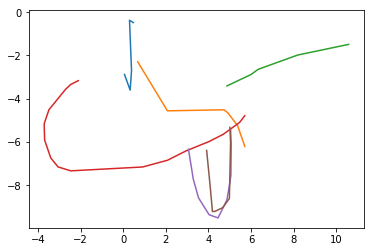

epoch 18901 in 0.174 s: loss = -0.2872, LR = -0.3156, LKL = 0.0284
epoch 18902 in 0.178 s: loss = -0.3298, LR = -0.3584, LKL = 0.0286
epoch 18903 in 0.174 s: loss = -0.3724, LR = -0.4010, LKL = 0.0287
epoch 18904 in 0.174 s: loss = -0.3028, LR = -0.3312, LKL = 0.0284
epoch 18905 in 0.175 s: loss = -0.2885, LR = -0.3169, LKL = 0.0285
epoch 18906 in 0.174 s: loss = -0.3687, LR = -0.3973, LKL = 0.0286
epoch 18907 in 0.177 s: loss = -0.3539, LR = -0.3826, LKL = 0.0287
epoch 18908 in 0.174 s: loss = -0.3170, LR = -0.3453, LKL = 0.0284
epoch 18909 in 0.176 s: loss = -0.2886, LR = -0.3170, LKL = 0.0284
epoch 18910 in 0.171 s: loss = -0.2598, LR = -0.2881, LKL = 0.0283
epoch 18911 in 0.174 s: loss = -0.3725, LR = -0.4011, LKL = 0.0285
epoch 18912 in 0.177 s: loss = -0.3358, LR = -0.3644, LKL = 0.0286
epoch 18913 in 0.174 s: loss = -0.3186, LR = -0.3472, LKL = 0.0286
epoch 18914 in 0.172 s: loss = -0.3172, LR = -0.3455, LKL = 0.0283
epoch 18915 in 0.175 s: loss = -0.4276, LR = -0.4563, LKL = 0.

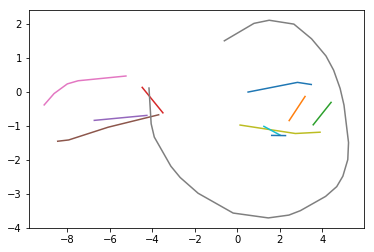

epoch 19001 in 0.172 s: loss = -0.2843, LR = -0.3126, LKL = 0.0283
epoch 19002 in 0.176 s: loss = -0.3210, LR = -0.3494, LKL = 0.0284
epoch 19003 in 0.172 s: loss = -0.3577, LR = -0.3862, LKL = 0.0285
epoch 19004 in 0.174 s: loss = -0.3167, LR = -0.3451, LKL = 0.0285
epoch 19005 in 0.172 s: loss = -0.2978, LR = -0.3263, LKL = 0.0285
epoch 19006 in 0.176 s: loss = -0.3050, LR = -0.3333, LKL = 0.0283
epoch 19007 in 0.172 s: loss = -0.2748, LR = -0.3034, LKL = 0.0285
epoch 19008 in 0.173 s: loss = -0.2753, LR = -0.3035, LKL = 0.0282
epoch 19009 in 0.172 s: loss = -0.3136, LR = -0.3423, LKL = 0.0287
epoch 19010 in 0.175 s: loss = -0.3132, LR = -0.3417, LKL = 0.0284
epoch 19011 in 0.173 s: loss = -0.3243, LR = -0.3529, LKL = 0.0285
epoch 19012 in 0.177 s: loss = -0.3302, LR = -0.3588, LKL = 0.0285
epoch 19013 in 0.173 s: loss = -0.3221, LR = -0.3507, LKL = 0.0286
epoch 19014 in 0.169 s: loss = -0.3096, LR = -0.3380, LKL = 0.0284
epoch 19015 in 0.172 s: loss = -0.3144, LR = -0.3427, LKL = 0.

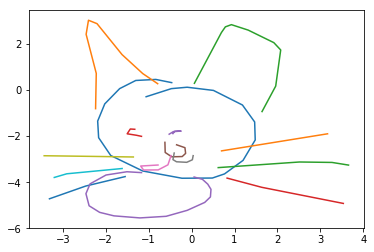

epoch 19101 in 0.175 s: loss = -0.2987, LR = -0.3271, LKL = 0.0284
epoch 19102 in 0.175 s: loss = -0.3477, LR = -0.3765, LKL = 0.0288
epoch 19103 in 0.173 s: loss = -0.2927, LR = -0.3213, LKL = 0.0286
epoch 19104 in 0.174 s: loss = -0.2801, LR = -0.3086, LKL = 0.0285
epoch 19105 in 0.173 s: loss = -0.3021, LR = -0.3305, LKL = 0.0284
epoch 19106 in 0.175 s: loss = -0.3347, LR = -0.3633, LKL = 0.0286
epoch 19107 in 0.174 s: loss = -0.3481, LR = -0.3767, LKL = 0.0287
epoch 19108 in 0.173 s: loss = -0.3494, LR = -0.3779, LKL = 0.0286
epoch 19109 in 0.174 s: loss = -0.2833, LR = -0.3119, LKL = 0.0286
epoch 19110 in 0.176 s: loss = -0.3608, LR = -0.3895, LKL = 0.0287
epoch 19111 in 0.176 s: loss = -0.3201, LR = -0.3488, LKL = 0.0287
epoch 19112 in 0.175 s: loss = -0.3250, LR = -0.3535, LKL = 0.0285
epoch 19113 in 0.175 s: loss = -0.3153, LR = -0.3440, LKL = 0.0287
epoch 19114 in 0.175 s: loss = -0.2768, LR = -0.3053, LKL = 0.0285
epoch 19115 in 0.174 s: loss = -0.3061, LR = -0.3345, LKL = 0.

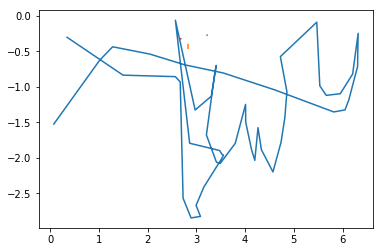

epoch 19201 in 0.174 s: loss = -0.3935, LR = -0.4223, LKL = 0.0288
epoch 19202 in 0.173 s: loss = -0.3255, LR = -0.3542, LKL = 0.0287
epoch 19203 in 0.174 s: loss = -0.2927, LR = -0.3213, LKL = 0.0286
epoch 19204 in 0.176 s: loss = -0.3094, LR = -0.3381, LKL = 0.0287
epoch 19205 in 0.172 s: loss = -0.2977, LR = -0.3263, LKL = 0.0286
epoch 19206 in 0.175 s: loss = -0.3084, LR = -0.3368, LKL = 0.0284
epoch 19207 in 0.173 s: loss = -0.3027, LR = -0.3312, LKL = 0.0285
epoch 19208 in 0.175 s: loss = -0.3371, LR = -0.3657, LKL = 0.0285
epoch 19209 in 0.176 s: loss = -0.2937, LR = -0.3221, LKL = 0.0284
epoch 19210 in 0.174 s: loss = -0.3592, LR = -0.3878, LKL = 0.0286
epoch 19211 in 0.176 s: loss = -0.3400, LR = -0.3686, LKL = 0.0286
epoch 19212 in 0.177 s: loss = -0.3448, LR = -0.3735, LKL = 0.0286
epoch 19213 in 0.178 s: loss = -0.3599, LR = -0.3886, LKL = 0.0287
epoch 19214 in 0.179 s: loss = -0.3106, LR = -0.3391, LKL = 0.0284
epoch 19215 in 0.177 s: loss = -0.2649, LR = -0.2935, LKL = 0.

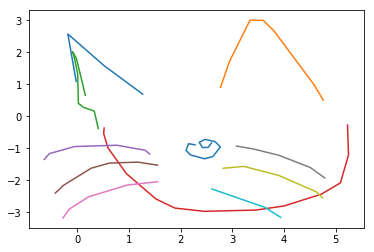

epoch 19301 in 0.175 s: loss = -0.3248, LR = -0.3533, LKL = 0.0285
epoch 19302 in 0.177 s: loss = -0.3612, LR = -0.3899, LKL = 0.0288
epoch 19303 in 0.177 s: loss = -0.3347, LR = -0.3633, LKL = 0.0286
epoch 19304 in 0.173 s: loss = -0.3563, LR = -0.3850, LKL = 0.0288
epoch 19305 in 0.178 s: loss = -0.3360, LR = -0.3646, LKL = 0.0286
epoch 19306 in 0.173 s: loss = -0.3365, LR = -0.3652, LKL = 0.0287
epoch 19307 in 0.171 s: loss = -0.3771, LR = -0.4059, LKL = 0.0289
epoch 19308 in 0.178 s: loss = -0.3350, LR = -0.3638, LKL = 0.0288
epoch 19309 in 0.177 s: loss = -0.3447, LR = -0.3734, LKL = 0.0287
epoch 19310 in 0.173 s: loss = -0.2974, LR = -0.3259, LKL = 0.0285
epoch 19311 in 0.176 s: loss = -0.3192, LR = -0.3478, LKL = 0.0285
epoch 19312 in 0.179 s: loss = -0.2671, LR = -0.2956, LKL = 0.0286
epoch 19313 in 0.176 s: loss = -0.2590, LR = -0.2876, LKL = 0.0286
epoch 19314 in 0.174 s: loss = -0.3176, LR = -0.3463, LKL = 0.0287
epoch 19315 in 0.175 s: loss = -0.2925, LR = -0.3211, LKL = 0.

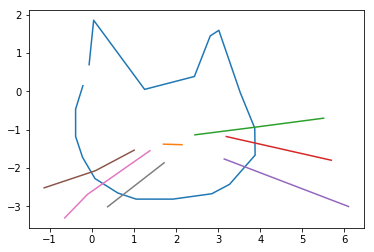

epoch 19401 in 0.175 s: loss = -0.2311, LR = -0.2598, LKL = 0.0287
epoch 19402 in 0.172 s: loss = -0.2242, LR = -0.2528, LKL = 0.0286
epoch 19403 in 0.175 s: loss = -0.2621, LR = -0.2907, LKL = 0.0286
epoch 19404 in 0.177 s: loss = -0.2477, LR = -0.2762, LKL = 0.0285
epoch 19405 in 0.177 s: loss = -0.2260, LR = -0.2546, LKL = 0.0286
epoch 19406 in 0.177 s: loss = -0.2306, LR = -0.2592, LKL = 0.0286
epoch 19407 in 0.177 s: loss = -0.3747, LR = -0.4035, LKL = 0.0288
epoch 19408 in 0.173 s: loss = -0.3319, LR = -0.3606, LKL = 0.0288
epoch 19409 in 0.179 s: loss = -0.3328, LR = -0.3614, LKL = 0.0286
epoch 19410 in 0.180 s: loss = -0.2711, LR = -0.2999, LKL = 0.0288
epoch 19411 in 0.179 s: loss = -0.3737, LR = -0.4025, LKL = 0.0288
epoch 19412 in 0.178 s: loss = -0.3183, LR = -0.3472, LKL = 0.0289
epoch 19413 in 0.178 s: loss = -0.2890, LR = -0.3175, LKL = 0.0285
epoch 19414 in 0.175 s: loss = -0.3225, LR = -0.3511, LKL = 0.0287
epoch 19415 in 0.175 s: loss = -0.3289, LR = -0.3576, LKL = 0.

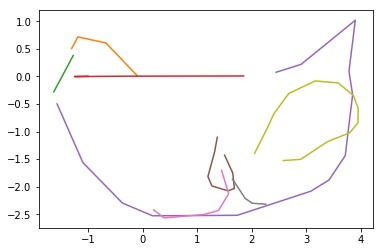

epoch 19501 in 0.178 s: loss = -0.3041, LR = -0.3329, LKL = 0.0288
epoch 19502 in 0.176 s: loss = -0.3325, LR = -0.3612, LKL = 0.0287
epoch 19503 in 0.176 s: loss = -0.2688, LR = -0.2972, LKL = 0.0285
epoch 19504 in 0.173 s: loss = -0.3162, LR = -0.3449, LKL = 0.0287
epoch 19505 in 0.178 s: loss = -0.2962, LR = -0.3250, LKL = 0.0288
epoch 19506 in 0.170 s: loss = -0.3454, LR = -0.3742, LKL = 0.0288
epoch 19507 in 0.172 s: loss = -0.3304, LR = -0.3593, LKL = 0.0288
epoch 19508 in 0.170 s: loss = -0.2878, LR = -0.3163, LKL = 0.0285
epoch 19509 in 0.178 s: loss = -0.3561, LR = -0.3847, LKL = 0.0286
epoch 19510 in 0.174 s: loss = -0.3492, LR = -0.3783, LKL = 0.0290
epoch 19511 in 0.178 s: loss = -0.3001, LR = -0.3288, LKL = 0.0288
epoch 19512 in 0.169 s: loss = -0.3082, LR = -0.3370, LKL = 0.0288
epoch 19513 in 0.172 s: loss = -0.2882, LR = -0.3169, LKL = 0.0287
epoch 19514 in 0.176 s: loss = -0.3795, LR = -0.4082, LKL = 0.0287
epoch 19515 in 0.177 s: loss = -0.3282, LR = -0.3569, LKL = 0.

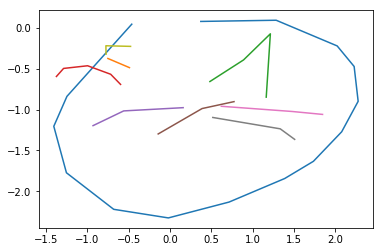

epoch 19601 in 0.175 s: loss = -0.3637, LR = -0.3926, LKL = 0.0288
epoch 19602 in 0.174 s: loss = -0.2894, LR = -0.3181, LKL = 0.0286
epoch 19603 in 0.176 s: loss = -0.3202, LR = -0.3489, LKL = 0.0287
epoch 19604 in 0.178 s: loss = -0.3390, LR = -0.3677, LKL = 0.0287
epoch 19605 in 0.175 s: loss = -0.2707, LR = -0.2993, LKL = 0.0286
epoch 19606 in 0.176 s: loss = -0.3199, LR = -0.3488, LKL = 0.0289
epoch 19607 in 0.179 s: loss = -0.3040, LR = -0.3326, LKL = 0.0286
epoch 19608 in 0.179 s: loss = -0.2793, LR = -0.3079, LKL = 0.0286
epoch 19609 in 0.175 s: loss = -0.3239, LR = -0.3526, LKL = 0.0287
epoch 19610 in 0.177 s: loss = -0.3278, LR = -0.3565, LKL = 0.0287
epoch 19611 in 0.176 s: loss = -0.3983, LR = -0.4273, LKL = 0.0290
epoch 19612 in 0.175 s: loss = -0.2778, LR = -0.3066, LKL = 0.0287
epoch 19613 in 0.179 s: loss = -0.3420, LR = -0.3707, LKL = 0.0288
epoch 19614 in 0.175 s: loss = -0.3146, LR = -0.3433, LKL = 0.0288
epoch 19615 in 0.176 s: loss = -0.2916, LR = -0.3202, LKL = 0.

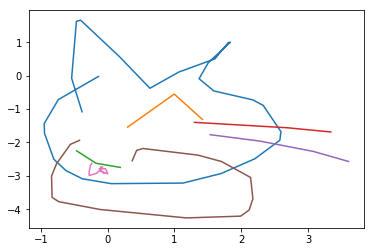

epoch 19701 in 0.173 s: loss = -0.2974, LR = -0.3261, LKL = 0.0287
epoch 19702 in 0.179 s: loss = -0.3024, LR = -0.3311, LKL = 0.0287
epoch 19703 in 0.179 s: loss = -0.2872, LR = -0.3159, LKL = 0.0287
epoch 19704 in 0.178 s: loss = -0.3243, LR = -0.3528, LKL = 0.0285
epoch 19705 in 0.177 s: loss = -0.3551, LR = -0.3840, LKL = 0.0289
epoch 19706 in 0.178 s: loss = -0.2875, LR = -0.3161, LKL = 0.0287
epoch 19707 in 0.178 s: loss = -0.3115, LR = -0.3400, LKL = 0.0285
epoch 19708 in 0.177 s: loss = -0.3002, LR = -0.3289, LKL = 0.0287
epoch 19709 in 0.180 s: loss = -0.3446, LR = -0.3734, LKL = 0.0288
epoch 19710 in 0.175 s: loss = -0.2897, LR = -0.3185, LKL = 0.0288
epoch 19711 in 0.176 s: loss = -0.3206, LR = -0.3494, LKL = 0.0288
epoch 19712 in 0.179 s: loss = -0.2358, LR = -0.2645, LKL = 0.0287
epoch 19713 in 0.178 s: loss = -0.3526, LR = -0.3815, LKL = 0.0288
epoch 19714 in 0.179 s: loss = -0.3518, LR = -0.3807, LKL = 0.0289
epoch 19715 in 0.176 s: loss = -0.3232, LR = -0.3519, LKL = 0.

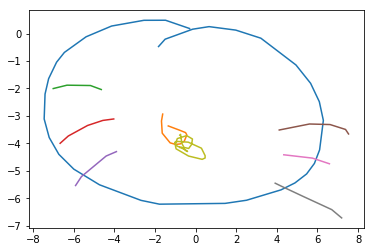

epoch 19801 in 0.173 s: loss = -0.2940, LR = -0.3228, LKL = 0.0288
epoch 19802 in 0.174 s: loss = -0.3582, LR = -0.3871, LKL = 0.0289
epoch 19803 in 0.176 s: loss = -0.3523, LR = -0.3810, LKL = 0.0287
epoch 19804 in 0.177 s: loss = -0.3724, LR = -0.4013, LKL = 0.0289
epoch 19805 in 0.175 s: loss = -0.2921, LR = -0.3209, LKL = 0.0288
epoch 19806 in 0.178 s: loss = -0.3364, LR = -0.3652, LKL = 0.0288
epoch 19807 in 0.175 s: loss = -0.3259, LR = -0.3546, LKL = 0.0287
epoch 19808 in 0.175 s: loss = -0.3881, LR = -0.4171, LKL = 0.0290
epoch 19809 in 0.175 s: loss = -0.3178, LR = -0.3465, LKL = 0.0288
epoch 19810 in 0.177 s: loss = -0.3818, LR = -0.4109, LKL = 0.0290
epoch 19811 in 0.175 s: loss = -0.3451, LR = -0.3739, LKL = 0.0288
epoch 19812 in 0.176 s: loss = -0.3118, LR = -0.3406, LKL = 0.0287
epoch 19813 in 0.177 s: loss = -0.3594, LR = -0.3884, LKL = 0.0290
epoch 19814 in 0.176 s: loss = -0.2987, LR = -0.3275, LKL = 0.0289
epoch 19815 in 0.176 s: loss = -0.3654, LR = -0.3943, LKL = 0.

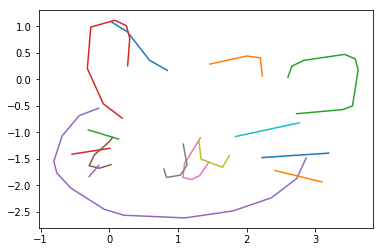

epoch 19901 in 0.178 s: loss = -0.3292, LR = -0.3580, LKL = 0.0288
epoch 19902 in 0.173 s: loss = -0.3040, LR = -0.3326, LKL = 0.0286
epoch 19903 in 0.174 s: loss = -0.3421, LR = -0.3709, LKL = 0.0288
epoch 19904 in 0.174 s: loss = -0.3189, LR = -0.3479, LKL = 0.0289
epoch 19905 in 0.176 s: loss = -0.3643, LR = -0.3934, LKL = 0.0291
epoch 19906 in 0.174 s: loss = -0.2894, LR = -0.3181, LKL = 0.0287
epoch 19907 in 0.173 s: loss = -0.3143, LR = -0.3431, LKL = 0.0288
epoch 19908 in 0.177 s: loss = -0.3085, LR = -0.3376, LKL = 0.0291
epoch 19909 in 0.175 s: loss = -0.3739, LR = -0.4028, LKL = 0.0288
epoch 19910 in 0.177 s: loss = -0.2866, LR = -0.3153, LKL = 0.0287
epoch 19911 in 0.177 s: loss = -0.3258, LR = -0.3546, LKL = 0.0288
epoch 19912 in 0.174 s: loss = -0.2937, LR = -0.3225, LKL = 0.0288
epoch 19913 in 0.175 s: loss = -0.3015, LR = -0.3305, LKL = 0.0290
epoch 19914 in 0.177 s: loss = -0.3612, LR = -0.3902, LKL = 0.0291
epoch 19915 in 0.179 s: loss = -0.3162, LR = -0.3451, LKL = 0.

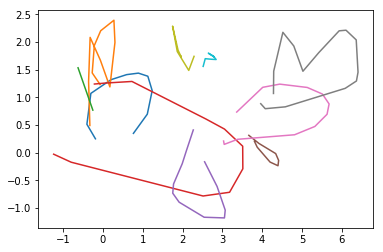

epoch 20001 in 0.176 s: loss = -0.2602, LR = -0.2891, LKL = 0.0289
epoch 20002 in 0.171 s: loss = -0.3481, LR = -0.3770, LKL = 0.0289
epoch 20003 in 0.175 s: loss = -0.2407, LR = -0.2696, LKL = 0.0290
epoch 20004 in 0.173 s: loss = -0.2708, LR = -0.2997, LKL = 0.0289
epoch 20005 in 0.173 s: loss = -0.3149, LR = -0.3438, LKL = 0.0289
epoch 20006 in 0.172 s: loss = -0.2863, LR = -0.3150, LKL = 0.0288
epoch 20007 in 0.172 s: loss = -0.3023, LR = -0.3311, LKL = 0.0288
epoch 20008 in 0.174 s: loss = -0.3249, LR = -0.3537, LKL = 0.0288
epoch 20009 in 0.176 s: loss = -0.3097, LR = -0.3387, LKL = 0.0289
epoch 20010 in 0.173 s: loss = -0.3557, LR = -0.3850, LKL = 0.0293
epoch 20011 in 0.174 s: loss = -0.3409, LR = -0.3697, LKL = 0.0287
epoch 20012 in 0.174 s: loss = -0.3294, LR = -0.3581, LKL = 0.0288
epoch 20013 in 0.174 s: loss = -0.2466, LR = -0.2754, LKL = 0.0289
epoch 20014 in 0.171 s: loss = -0.3624, LR = -0.3914, LKL = 0.0291
epoch 20015 in 0.174 s: loss = -0.4186, LR = -0.4477, LKL = 0.

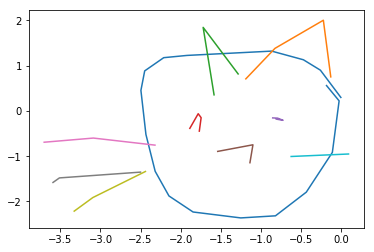

epoch 20101 in 0.177 s: loss = -0.3658, LR = -0.3948, LKL = 0.0290
epoch 20102 in 0.177 s: loss = -0.3251, LR = -0.3541, LKL = 0.0290
epoch 20103 in 0.178 s: loss = -0.3491, LR = -0.3780, LKL = 0.0289
epoch 20104 in 0.175 s: loss = -0.2626, LR = -0.2911, LKL = 0.0286
epoch 20105 in 0.176 s: loss = -0.2915, LR = -0.3203, LKL = 0.0288
epoch 20106 in 0.175 s: loss = -0.3823, LR = -0.4114, LKL = 0.0291
epoch 20107 in 0.177 s: loss = -0.2979, LR = -0.3267, LKL = 0.0288
epoch 20108 in 0.175 s: loss = -0.3400, LR = -0.3689, LKL = 0.0290
epoch 20109 in 0.176 s: loss = -0.3701, LR = -0.3991, LKL = 0.0290
epoch 20110 in 0.178 s: loss = -0.3252, LR = -0.3541, LKL = 0.0289
epoch 20111 in 0.181 s: loss = -0.3099, LR = -0.3387, LKL = 0.0288
epoch 20112 in 0.175 s: loss = -0.3171, LR = -0.3461, LKL = 0.0290
epoch 20113 in 0.174 s: loss = -0.4046, LR = -0.4336, LKL = 0.0290
epoch 20114 in 0.173 s: loss = -0.3571, LR = -0.3861, LKL = 0.0290
epoch 20115 in 0.171 s: loss = -0.3388, LR = -0.3678, LKL = 0.

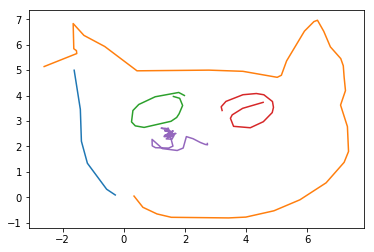

epoch 20201 in 0.173 s: loss = -0.3760, LR = -0.4051, LKL = 0.0291
epoch 20202 in 0.171 s: loss = -0.3782, LR = -0.4073, LKL = 0.0291
epoch 20203 in 0.173 s: loss = -0.3756, LR = -0.4045, LKL = 0.0289
epoch 20204 in 0.171 s: loss = -0.3898, LR = -0.4190, LKL = 0.0292
epoch 20205 in 0.175 s: loss = -0.3112, LR = -0.3402, LKL = 0.0290
epoch 20206 in 0.172 s: loss = -0.3367, LR = -0.3657, LKL = 0.0290
epoch 20207 in 0.176 s: loss = -0.3440, LR = -0.3729, LKL = 0.0290
epoch 20208 in 0.175 s: loss = -0.3773, LR = -0.4065, LKL = 0.0292
epoch 20209 in 0.178 s: loss = -0.4457, LR = -0.4749, LKL = 0.0291
epoch 20210 in 0.176 s: loss = -0.3117, LR = -0.3406, LKL = 0.0289
epoch 20211 in 0.177 s: loss = -0.4117, LR = -0.4407, LKL = 0.0291
epoch 20212 in 0.176 s: loss = -0.3307, LR = -0.3597, LKL = 0.0290
epoch 20213 in 0.176 s: loss = -0.3215, LR = -0.3505, LKL = 0.0291
epoch 20214 in 0.175 s: loss = -0.2686, LR = -0.2977, LKL = 0.0291
epoch 20215 in 0.177 s: loss = -0.3230, LR = -0.3521, LKL = 0.

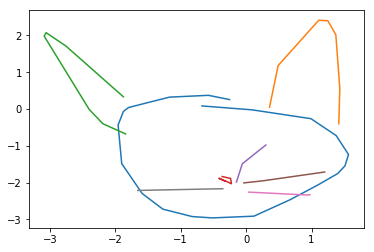

epoch 20301 in 0.181 s: loss = -0.2891, LR = -0.3182, LKL = 0.0291
epoch 20302 in 0.175 s: loss = -0.3216, LR = -0.3506, LKL = 0.0290
epoch 20303 in 0.175 s: loss = -0.3675, LR = -0.3965, LKL = 0.0289
epoch 20304 in 0.174 s: loss = -0.3238, LR = -0.3529, LKL = 0.0291
epoch 20305 in 0.177 s: loss = -0.3079, LR = -0.3368, LKL = 0.0289
epoch 20306 in 0.177 s: loss = -0.2539, LR = -0.2831, LKL = 0.0292
epoch 20307 in 0.176 s: loss = -0.3222, LR = -0.3511, LKL = 0.0290
epoch 20308 in 0.181 s: loss = -0.3122, LR = -0.3413, LKL = 0.0291
epoch 20309 in 0.178 s: loss = -0.3542, LR = -0.3834, LKL = 0.0292
epoch 20310 in 0.177 s: loss = -0.2843, LR = -0.3132, LKL = 0.0289
epoch 20311 in 0.180 s: loss = -0.3879, LR = -0.4168, LKL = 0.0289
epoch 20312 in 0.179 s: loss = -0.3045, LR = -0.3335, LKL = 0.0290
epoch 20313 in 0.174 s: loss = -0.3551, LR = -0.3843, LKL = 0.0292
epoch 20314 in 0.176 s: loss = -0.3655, LR = -0.3949, LKL = 0.0294
epoch 20315 in 0.178 s: loss = -0.3400, LR = -0.3689, LKL = 0.

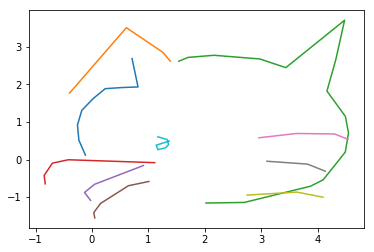

epoch 20401 in 0.176 s: loss = -0.3013, LR = -0.3305, LKL = 0.0291
epoch 20402 in 0.174 s: loss = -0.3791, LR = -0.4083, LKL = 0.0292
epoch 20403 in 0.176 s: loss = -0.3273, LR = -0.3564, LKL = 0.0291
epoch 20404 in 0.175 s: loss = -0.3759, LR = -0.4051, LKL = 0.0292
epoch 20405 in 0.177 s: loss = -0.3002, LR = -0.3293, LKL = 0.0291
epoch 20406 in 0.176 s: loss = -0.3416, LR = -0.3708, LKL = 0.0292
epoch 20407 in 0.179 s: loss = -0.3618, LR = -0.3910, LKL = 0.0293
epoch 20408 in 0.176 s: loss = -0.3196, LR = -0.3487, LKL = 0.0290
epoch 20409 in 0.179 s: loss = -0.3541, LR = -0.3832, LKL = 0.0292
epoch 20410 in 0.175 s: loss = -0.3659, LR = -0.3950, LKL = 0.0292
epoch 20411 in 0.178 s: loss = -0.3350, LR = -0.3642, LKL = 0.0292
epoch 20412 in 0.174 s: loss = -0.3324, LR = -0.3612, LKL = 0.0288
epoch 20413 in 0.179 s: loss = -0.3474, LR = -0.3764, LKL = 0.0290
epoch 20414 in 0.178 s: loss = -0.3259, LR = -0.3552, LKL = 0.0292
epoch 20415 in 0.178 s: loss = -0.2969, LR = -0.3260, LKL = 0.

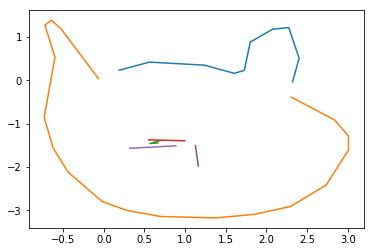

epoch 20501 in 0.174 s: loss = -0.3344, LR = -0.3635, LKL = 0.0292
epoch 20502 in 0.175 s: loss = -0.3575, LR = -0.3868, LKL = 0.0293
epoch 20503 in 0.176 s: loss = -0.2935, LR = -0.3225, LKL = 0.0290
epoch 20504 in 0.173 s: loss = -0.3621, LR = -0.3915, LKL = 0.0293
epoch 20505 in 0.174 s: loss = -0.3406, LR = -0.3699, LKL = 0.0293
epoch 20506 in 0.175 s: loss = -0.2712, LR = -0.3003, LKL = 0.0291
epoch 20507 in 0.180 s: loss = -0.3335, LR = -0.3628, LKL = 0.0293
epoch 20508 in 0.175 s: loss = -0.3239, LR = -0.3531, LKL = 0.0292
epoch 20509 in 0.175 s: loss = -0.2872, LR = -0.3165, LKL = 0.0293
epoch 20510 in 0.175 s: loss = -0.3648, LR = -0.3941, LKL = 0.0293
epoch 20511 in 0.175 s: loss = -0.2955, LR = -0.3246, LKL = 0.0291
epoch 20512 in 0.176 s: loss = -0.3446, LR = -0.3739, LKL = 0.0293
epoch 20513 in 0.177 s: loss = -0.3315, LR = -0.3606, LKL = 0.0291
epoch 20514 in 0.171 s: loss = -0.3177, LR = -0.3470, LKL = 0.0293
epoch 20515 in 0.175 s: loss = -0.3554, LR = -0.3846, LKL = 0.

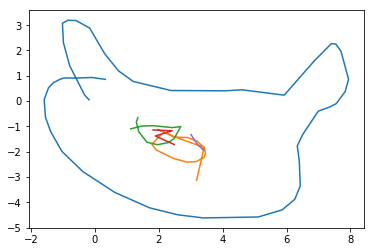

epoch 20601 in 0.176 s: loss = -0.3087, LR = -0.3380, LKL = 0.0293
epoch 20602 in 0.177 s: loss = -0.3827, LR = -0.4120, LKL = 0.0293
epoch 20603 in 0.179 s: loss = -0.2160, LR = -0.2450, LKL = 0.0290
epoch 20604 in 0.173 s: loss = -0.2963, LR = -0.3254, LKL = 0.0291
epoch 20605 in 0.173 s: loss = -0.3277, LR = -0.3569, LKL = 0.0292
epoch 20606 in 0.179 s: loss = -0.3582, LR = -0.3874, LKL = 0.0291
epoch 20607 in 0.175 s: loss = -0.3401, LR = -0.3694, LKL = 0.0293
epoch 20608 in 0.175 s: loss = -0.3271, LR = -0.3564, LKL = 0.0293
epoch 20609 in 0.177 s: loss = -0.3503, LR = -0.3796, LKL = 0.0293
epoch 20610 in 0.175 s: loss = -0.3674, LR = -0.3966, LKL = 0.0292
epoch 20611 in 0.177 s: loss = -0.3535, LR = -0.3826, LKL = 0.0291
epoch 20612 in 0.179 s: loss = -0.2921, LR = -0.3213, LKL = 0.0292
epoch 20613 in 0.179 s: loss = -0.3192, LR = -0.3482, LKL = 0.0290
epoch 20614 in 0.173 s: loss = -0.3127, LR = -0.3418, LKL = 0.0291
epoch 20615 in 0.174 s: loss = -0.2708, LR = -0.3000, LKL = 0.

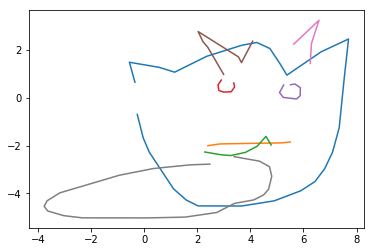

epoch 20701 in 0.174 s: loss = -0.3744, LR = -0.4037, LKL = 0.0293
epoch 20702 in 0.175 s: loss = -0.3859, LR = -0.4150, LKL = 0.0291
epoch 20703 in 0.173 s: loss = -0.3529, LR = -0.3821, LKL = 0.0292
epoch 20704 in 0.176 s: loss = -0.3657, LR = -0.3950, LKL = 0.0294
epoch 20705 in 0.179 s: loss = -0.3529, LR = -0.3823, LKL = 0.0294
epoch 20706 in 0.175 s: loss = -0.3272, LR = -0.3565, LKL = 0.0292
epoch 20707 in 0.177 s: loss = -0.3326, LR = -0.3618, LKL = 0.0292
epoch 20708 in 0.176 s: loss = -0.3318, LR = -0.3611, LKL = 0.0293
epoch 20709 in 0.178 s: loss = -0.4073, LR = -0.4365, LKL = 0.0292
epoch 20710 in 0.175 s: loss = -0.3492, LR = -0.3784, LKL = 0.0292
epoch 20711 in 0.175 s: loss = -0.3497, LR = -0.3789, LKL = 0.0292
epoch 20712 in 0.176 s: loss = -0.3883, LR = -0.4177, LKL = 0.0294
epoch 20713 in 0.177 s: loss = -0.4031, LR = -0.4325, LKL = 0.0294
epoch 20714 in 0.176 s: loss = -0.3012, LR = -0.3304, LKL = 0.0292
epoch 20715 in 0.179 s: loss = -0.3299, LR = -0.3590, LKL = 0.

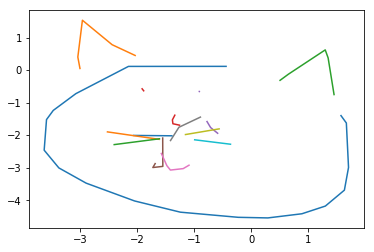

epoch 20801 in 0.176 s: loss = -0.3118, LR = -0.3411, LKL = 0.0293
epoch 20802 in 0.174 s: loss = -0.3659, LR = -0.3952, LKL = 0.0293
epoch 20803 in 0.177 s: loss = -0.2886, LR = -0.3177, LKL = 0.0291
epoch 20804 in 0.174 s: loss = -0.3110, LR = -0.3404, LKL = 0.0294
epoch 20805 in 0.181 s: loss = -0.3720, LR = -0.4015, LKL = 0.0294
epoch 20806 in 0.175 s: loss = -0.3655, LR = -0.3948, LKL = 0.0293
epoch 20807 in 0.178 s: loss = -0.3628, LR = -0.3919, LKL = 0.0290
epoch 20808 in 0.174 s: loss = -0.3466, LR = -0.3759, LKL = 0.0293
epoch 20809 in 0.180 s: loss = -0.2740, LR = -0.3033, LKL = 0.0292
epoch 20810 in 0.177 s: loss = -0.3504, LR = -0.3797, LKL = 0.0293
epoch 20811 in 0.179 s: loss = -0.2673, LR = -0.2963, LKL = 0.0290
epoch 20812 in 0.174 s: loss = -0.3770, LR = -0.4064, LKL = 0.0294
epoch 20813 in 0.175 s: loss = -0.2598, LR = -0.2891, LKL = 0.0293
epoch 20814 in 0.173 s: loss = -0.2978, LR = -0.3270, LKL = 0.0292
epoch 20815 in 0.180 s: loss = -0.3782, LR = -0.4077, LKL = 0.

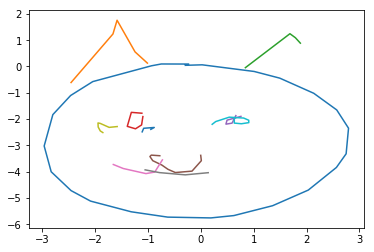

epoch 20901 in 0.174 s: loss = -0.3242, LR = -0.3535, LKL = 0.0293
epoch 20902 in 0.177 s: loss = -0.2718, LR = -0.3010, LKL = 0.0292
epoch 20903 in 0.178 s: loss = -0.3994, LR = -0.4289, LKL = 0.0295
epoch 20904 in 0.171 s: loss = -0.3336, LR = -0.3628, LKL = 0.0292
epoch 20905 in 0.174 s: loss = -0.3957, LR = -0.4250, LKL = 0.0293
epoch 20906 in 0.171 s: loss = -0.3175, LR = -0.3467, LKL = 0.0292
epoch 20907 in 0.175 s: loss = -0.3263, LR = -0.3557, LKL = 0.0294
epoch 20908 in 0.172 s: loss = -0.3047, LR = -0.3340, LKL = 0.0292
epoch 20909 in 0.175 s: loss = -0.3251, LR = -0.3545, LKL = 0.0294
epoch 20910 in 0.174 s: loss = -0.2949, LR = -0.3243, LKL = 0.0294
epoch 20911 in 0.173 s: loss = -0.3356, LR = -0.3650, LKL = 0.0294
epoch 20912 in 0.176 s: loss = -0.3655, LR = -0.3949, LKL = 0.0293
epoch 20913 in 0.178 s: loss = -0.3302, LR = -0.3595, LKL = 0.0293
epoch 20914 in 0.172 s: loss = -0.3891, LR = -0.4183, LKL = 0.0293
epoch 20915 in 0.174 s: loss = -0.3821, LR = -0.4114, LKL = 0.

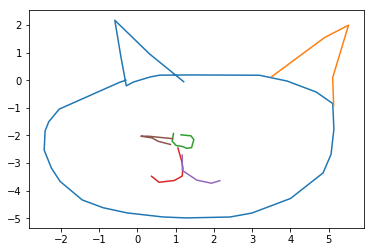

epoch 21001 in 0.177 s: loss = -0.2940, LR = -0.3233, LKL = 0.0293
epoch 21002 in 0.172 s: loss = -0.3287, LR = -0.3582, LKL = 0.0294
epoch 21003 in 0.175 s: loss = -0.3208, LR = -0.3502, LKL = 0.0294
epoch 21004 in 0.174 s: loss = -0.2719, LR = -0.3012, LKL = 0.0293
epoch 21005 in 0.180 s: loss = -0.2840, LR = -0.3134, LKL = 0.0294
epoch 21006 in 0.175 s: loss = -0.2945, LR = -0.3238, LKL = 0.0294
epoch 21007 in 0.177 s: loss = -0.3144, LR = -0.3436, LKL = 0.0292
epoch 21008 in 0.175 s: loss = -0.3008, LR = -0.3301, LKL = 0.0293
epoch 21009 in 0.178 s: loss = -0.3695, LR = -0.3990, LKL = 0.0295
epoch 21010 in 0.175 s: loss = -0.4061, LR = -0.4356, LKL = 0.0295
epoch 21011 in 0.178 s: loss = -0.2992, LR = -0.3284, LKL = 0.0291
epoch 21012 in 0.173 s: loss = -0.4011, LR = -0.4308, LKL = 0.0296
epoch 21013 in 0.179 s: loss = -0.3469, LR = -0.3763, LKL = 0.0294
epoch 21014 in 0.175 s: loss = -0.3697, LR = -0.3991, LKL = 0.0294
epoch 21015 in 0.179 s: loss = -0.3081, LR = -0.3376, LKL = 0.

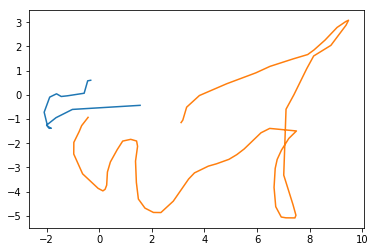

epoch 21101 in 0.177 s: loss = -0.3562, LR = -0.3856, LKL = 0.0295
epoch 21102 in 0.175 s: loss = -0.3423, LR = -0.3719, LKL = 0.0296
epoch 21103 in 0.176 s: loss = -0.2911, LR = -0.3203, LKL = 0.0292
epoch 21104 in 0.174 s: loss = -0.3150, LR = -0.3446, LKL = 0.0295
epoch 21105 in 0.175 s: loss = -0.2808, LR = -0.3102, LKL = 0.0293
epoch 21106 in 0.175 s: loss = -0.2920, LR = -0.3213, LKL = 0.0293
epoch 21107 in 0.178 s: loss = -0.2848, LR = -0.3142, LKL = 0.0293
epoch 21108 in 0.172 s: loss = -0.2415, LR = -0.2706, LKL = 0.0292
epoch 21109 in 0.172 s: loss = -0.3220, LR = -0.3516, LKL = 0.0296
epoch 21110 in 0.172 s: loss = -0.2824, LR = -0.3118, LKL = 0.0294
epoch 21111 in 0.175 s: loss = -0.2981, LR = -0.3276, LKL = 0.0294
epoch 21112 in 0.174 s: loss = -0.3351, LR = -0.3649, LKL = 0.0297
epoch 21113 in 0.174 s: loss = -0.2814, LR = -0.3109, LKL = 0.0294
epoch 21114 in 0.172 s: loss = -0.2727, LR = -0.3021, LKL = 0.0294
epoch 21115 in 0.174 s: loss = -0.3300, LR = -0.3595, LKL = 0.

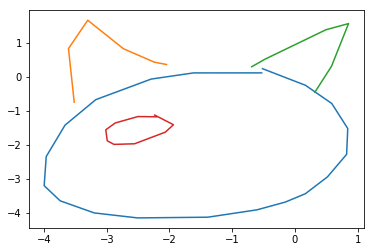

epoch 21201 in 0.172 s: loss = -0.3835, LR = -0.4131, LKL = 0.0296
epoch 21202 in 0.176 s: loss = -0.3166, LR = -0.3460, LKL = 0.0294
epoch 21203 in 0.175 s: loss = -0.3563, LR = -0.3857, LKL = 0.0294
epoch 21204 in 0.176 s: loss = -0.3499, LR = -0.3795, LKL = 0.0297
epoch 21205 in 0.179 s: loss = -0.3253, LR = -0.3548, LKL = 0.0295
epoch 21206 in 0.177 s: loss = -0.3342, LR = -0.3637, LKL = 0.0295
epoch 21207 in 0.176 s: loss = -0.3070, LR = -0.3362, LKL = 0.0292
epoch 21208 in 0.179 s: loss = -0.3631, LR = -0.3926, LKL = 0.0296
epoch 21209 in 0.175 s: loss = -0.3265, LR = -0.3561, LKL = 0.0297
epoch 21210 in 0.180 s: loss = -0.3336, LR = -0.3632, LKL = 0.0296
epoch 21211 in 0.175 s: loss = -0.3821, LR = -0.4117, LKL = 0.0296
epoch 21212 in 0.177 s: loss = -0.3500, LR = -0.3793, LKL = 0.0293
epoch 21213 in 0.178 s: loss = -0.3029, LR = -0.3323, LKL = 0.0294
epoch 21214 in 0.176 s: loss = -0.3594, LR = -0.3889, LKL = 0.0295
epoch 21215 in 0.178 s: loss = -0.3985, LR = -0.4282, LKL = 0.

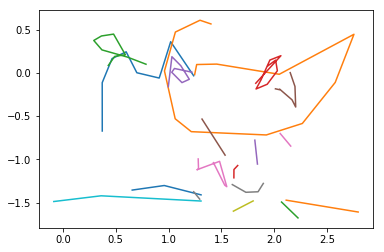

epoch 21301 in 0.175 s: loss = -0.3604, LR = -0.3899, LKL = 0.0295
epoch 21302 in 0.171 s: loss = -0.3085, LR = -0.3378, LKL = 0.0293
epoch 21303 in 0.171 s: loss = -0.2476, LR = -0.2769, LKL = 0.0293
epoch 21304 in 0.170 s: loss = -0.3075, LR = -0.3368, LKL = 0.0293
epoch 21305 in 0.172 s: loss = -0.3420, LR = -0.3716, LKL = 0.0295
epoch 21306 in 0.171 s: loss = -0.3294, LR = -0.3587, LKL = 0.0293
epoch 21307 in 0.169 s: loss = -0.3206, LR = -0.3501, LKL = 0.0295
epoch 21308 in 0.170 s: loss = -0.3295, LR = -0.3590, LKL = 0.0295
epoch 21309 in 0.174 s: loss = -0.2775, LR = -0.3069, LKL = 0.0294
epoch 21310 in 0.171 s: loss = -0.3213, LR = -0.3510, LKL = 0.0296
epoch 21311 in 0.172 s: loss = -0.2906, LR = -0.3201, LKL = 0.0295
epoch 21312 in 0.170 s: loss = -0.3326, LR = -0.3622, LKL = 0.0295
epoch 21313 in 0.171 s: loss = -0.2719, LR = -0.3012, LKL = 0.0293
epoch 21314 in 0.170 s: loss = -0.3801, LR = -0.4097, LKL = 0.0295
epoch 21315 in 0.173 s: loss = -0.3097, LR = -0.3392, LKL = 0.

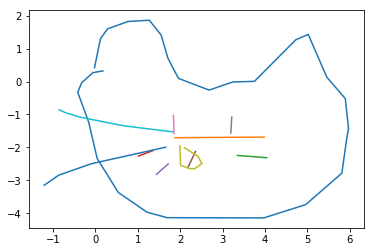

epoch 21401 in 0.176 s: loss = -0.3099, LR = -0.3391, LKL = 0.0292
epoch 21402 in 0.174 s: loss = -0.3865, LR = -0.4162, LKL = 0.0297
epoch 21403 in 0.177 s: loss = -0.3250, LR = -0.3546, LKL = 0.0296
epoch 21404 in 0.175 s: loss = -0.3496, LR = -0.3791, LKL = 0.0295
epoch 21405 in 0.179 s: loss = -0.3612, LR = -0.3907, LKL = 0.0295
epoch 21406 in 0.174 s: loss = -0.2998, LR = -0.3293, LKL = 0.0295
epoch 21407 in 0.176 s: loss = -0.3391, LR = -0.3686, LKL = 0.0295
epoch 21408 in 0.175 s: loss = -0.3601, LR = -0.3897, LKL = 0.0297
epoch 21409 in 0.180 s: loss = -0.3644, LR = -0.3941, LKL = 0.0297
epoch 21410 in 0.176 s: loss = -0.3081, LR = -0.3376, LKL = 0.0295
epoch 21411 in 0.178 s: loss = -0.3052, LR = -0.3348, LKL = 0.0296
epoch 21412 in 0.176 s: loss = -0.3637, LR = -0.3933, LKL = 0.0296
epoch 21413 in 0.178 s: loss = -0.3349, LR = -0.3644, LKL = 0.0295
epoch 21414 in 0.176 s: loss = -0.2979, LR = -0.3275, LKL = 0.0295
epoch 21415 in 0.176 s: loss = -0.3450, LR = -0.3749, LKL = 0.

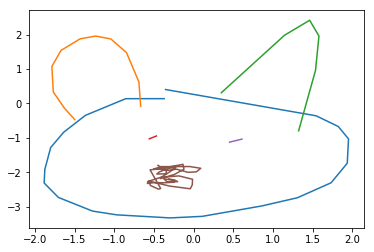

epoch 21501 in 0.174 s: loss = -0.3606, LR = -0.3901, LKL = 0.0295
epoch 21502 in 0.175 s: loss = -0.3427, LR = -0.3722, LKL = 0.0295
epoch 21503 in 0.178 s: loss = -0.3891, LR = -0.4186, LKL = 0.0295
epoch 21504 in 0.176 s: loss = -0.3358, LR = -0.3653, LKL = 0.0295
epoch 21505 in 0.176 s: loss = -0.4213, LR = -0.4510, LKL = 0.0297
epoch 21506 in 0.179 s: loss = -0.3879, LR = -0.4174, LKL = 0.0296
epoch 21507 in 0.180 s: loss = -0.3756, LR = -0.4051, LKL = 0.0295
epoch 21508 in 0.177 s: loss = -0.4052, LR = -0.4346, LKL = 0.0294
epoch 21509 in 0.176 s: loss = -0.2808, LR = -0.3103, LKL = 0.0295
epoch 21510 in 0.178 s: loss = -0.3619, LR = -0.3914, LKL = 0.0295
epoch 21511 in 0.177 s: loss = -0.3362, LR = -0.3657, LKL = 0.0295
epoch 21512 in 0.177 s: loss = -0.3445, LR = -0.3741, LKL = 0.0296
epoch 21513 in 0.178 s: loss = -0.3346, LR = -0.3642, LKL = 0.0296
epoch 21514 in 0.175 s: loss = -0.3722, LR = -0.4018, LKL = 0.0296
epoch 21515 in 0.176 s: loss = -0.3906, LR = -0.4201, LKL = 0.

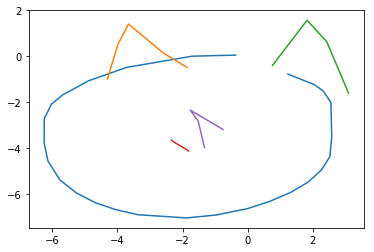

epoch 21601 in 0.175 s: loss = -0.3556, LR = -0.3850, LKL = 0.0293
epoch 21602 in 0.175 s: loss = -0.3043, LR = -0.3340, LKL = 0.0297
epoch 21603 in 0.178 s: loss = -0.3055, LR = -0.3350, LKL = 0.0295
epoch 21604 in 0.176 s: loss = -0.3408, LR = -0.3704, LKL = 0.0296
epoch 21605 in 0.181 s: loss = -0.2616, LR = -0.2907, LKL = 0.0292
epoch 21606 in 0.178 s: loss = -0.3081, LR = -0.3375, LKL = 0.0294
epoch 21607 in 0.177 s: loss = -0.3856, LR = -0.4152, LKL = 0.0296
epoch 21608 in 0.175 s: loss = -0.3507, LR = -0.3802, LKL = 0.0295
epoch 21609 in 0.177 s: loss = -0.3385, LR = -0.3682, LKL = 0.0297
epoch 21610 in 0.177 s: loss = -0.2929, LR = -0.3225, LKL = 0.0296
epoch 21611 in 0.176 s: loss = -0.3911, LR = -0.4207, LKL = 0.0296
epoch 21612 in 0.173 s: loss = -0.3162, LR = -0.3458, LKL = 0.0297
epoch 21613 in 0.178 s: loss = -0.3008, LR = -0.3303, LKL = 0.0295
epoch 21614 in 0.174 s: loss = -0.3470, LR = -0.3768, LKL = 0.0298
epoch 21615 in 0.181 s: loss = -0.4060, LR = -0.4357, LKL = 0.

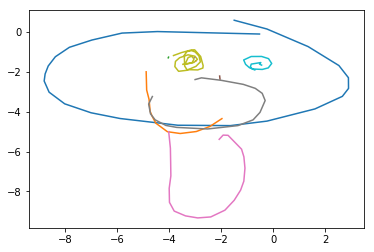

epoch 21701 in 0.172 s: loss = -0.3354, LR = -0.3649, LKL = 0.0295
epoch 21702 in 0.175 s: loss = -0.3712, LR = -0.4009, LKL = 0.0297
epoch 21703 in 0.175 s: loss = -0.3773, LR = -0.4069, LKL = 0.0296
epoch 21704 in 0.175 s: loss = -0.3430, LR = -0.3726, LKL = 0.0296
epoch 21705 in 0.174 s: loss = -0.3105, LR = -0.3401, LKL = 0.0296
epoch 21706 in 0.174 s: loss = -0.4055, LR = -0.4351, LKL = 0.0296
epoch 21707 in 0.175 s: loss = -0.3125, LR = -0.3420, LKL = 0.0295
epoch 21708 in 0.179 s: loss = -0.3014, LR = -0.3309, LKL = 0.0295
epoch 21709 in 0.175 s: loss = -0.3229, LR = -0.3523, LKL = 0.0294
epoch 21710 in 0.175 s: loss = -0.4056, LR = -0.4353, LKL = 0.0298
epoch 21711 in 0.174 s: loss = -0.3540, LR = -0.3836, LKL = 0.0297
epoch 21712 in 0.176 s: loss = -0.3487, LR = -0.3783, LKL = 0.0296
epoch 21713 in 0.174 s: loss = -0.3757, LR = -0.4055, LKL = 0.0297
epoch 21714 in 0.175 s: loss = -0.3368, LR = -0.3664, LKL = 0.0296
epoch 21715 in 0.175 s: loss = -0.3022, LR = -0.3317, LKL = 0.

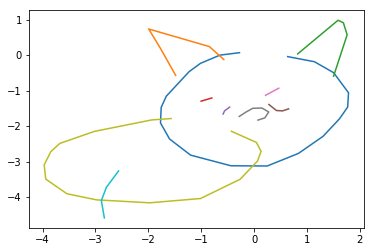

epoch 21801 in 0.178 s: loss = -0.3496, LR = -0.3791, LKL = 0.0295
epoch 21802 in 0.179 s: loss = -0.3693, LR = -0.3989, LKL = 0.0296
epoch 21803 in 0.176 s: loss = -0.3472, LR = -0.3768, LKL = 0.0296
epoch 21804 in 0.179 s: loss = -0.3427, LR = -0.3723, LKL = 0.0297
epoch 21805 in 0.179 s: loss = -0.3272, LR = -0.3569, LKL = 0.0297
epoch 21806 in 0.177 s: loss = -0.2999, LR = -0.3293, LKL = 0.0294
epoch 21807 in 0.177 s: loss = -0.3344, LR = -0.3639, LKL = 0.0295
epoch 21808 in 0.178 s: loss = -0.3398, LR = -0.3693, LKL = 0.0294
epoch 21809 in 0.177 s: loss = -0.3498, LR = -0.3795, LKL = 0.0297
epoch 21810 in 0.178 s: loss = -0.4111, LR = -0.4407, LKL = 0.0296
epoch 21811 in 0.181 s: loss = -0.3244, LR = -0.3539, LKL = 0.0295
epoch 21812 in 0.180 s: loss = -0.3083, LR = -0.3378, LKL = 0.0295
epoch 21813 in 0.178 s: loss = -0.2788, LR = -0.3082, LKL = 0.0295
epoch 21814 in 0.179 s: loss = -0.3784, LR = -0.4082, LKL = 0.0298
epoch 21815 in 0.177 s: loss = -0.3722, LR = -0.4018, LKL = 0.

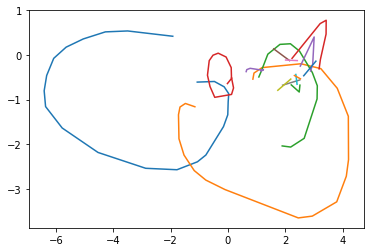

epoch 21901 in 0.174 s: loss = -0.2977, LR = -0.3273, LKL = 0.0296
epoch 21902 in 0.176 s: loss = -0.3110, LR = -0.3404, LKL = 0.0294
epoch 21903 in 0.176 s: loss = -0.3319, LR = -0.3615, LKL = 0.0296
epoch 21904 in 0.177 s: loss = -0.3926, LR = -0.4224, LKL = 0.0298
epoch 21905 in 0.177 s: loss = -0.4169, LR = -0.4468, LKL = 0.0299
epoch 21906 in 0.177 s: loss = -0.3354, LR = -0.3649, LKL = 0.0295
epoch 21907 in 0.177 s: loss = -0.3827, LR = -0.4126, LKL = 0.0299
epoch 21908 in 0.176 s: loss = -0.3982, LR = -0.4279, LKL = 0.0298
epoch 21909 in 0.176 s: loss = -0.3804, LR = -0.4102, LKL = 0.0298
epoch 21910 in 0.176 s: loss = -0.3052, LR = -0.3348, LKL = 0.0296
epoch 21911 in 0.177 s: loss = -0.3210, LR = -0.3506, LKL = 0.0296
epoch 21912 in 0.175 s: loss = -0.3618, LR = -0.3915, LKL = 0.0297
epoch 21913 in 0.178 s: loss = -0.3821, LR = -0.4118, LKL = 0.0297
epoch 21914 in 0.176 s: loss = -0.3224, LR = -0.3520, LKL = 0.0296
epoch 21915 in 0.176 s: loss = -0.3758, LR = -0.4054, LKL = 0.

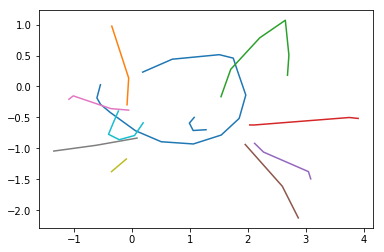

epoch 22001 in 0.173 s: loss = -0.3423, LR = -0.3720, LKL = 0.0297
epoch 22002 in 0.173 s: loss = -0.3346, LR = -0.3642, LKL = 0.0296
epoch 22003 in 0.172 s: loss = -0.3209, LR = -0.3506, LKL = 0.0297
epoch 22004 in 0.179 s: loss = -0.3222, LR = -0.3519, LKL = 0.0297
epoch 22005 in 0.176 s: loss = -0.3562, LR = -0.3860, LKL = 0.0298
epoch 22006 in 0.177 s: loss = -0.3325, LR = -0.3622, LKL = 0.0297
epoch 22007 in 0.177 s: loss = -0.3323, LR = -0.3619, LKL = 0.0297
epoch 22008 in 0.176 s: loss = -0.3998, LR = -0.4297, LKL = 0.0299
epoch 22009 in 0.176 s: loss = -0.3245, LR = -0.3541, LKL = 0.0296
epoch 22010 in 0.176 s: loss = -0.3717, LR = -0.4014, LKL = 0.0297
epoch 22011 in 0.176 s: loss = -0.3924, LR = -0.4222, LKL = 0.0298
epoch 22012 in 0.176 s: loss = -0.3159, LR = -0.3455, LKL = 0.0296
epoch 22013 in 0.177 s: loss = -0.3059, LR = -0.3355, LKL = 0.0296
epoch 22014 in 0.177 s: loss = -0.2727, LR = -0.3024, LKL = 0.0297
epoch 22015 in 0.176 s: loss = -0.2829, LR = -0.3126, LKL = 0.

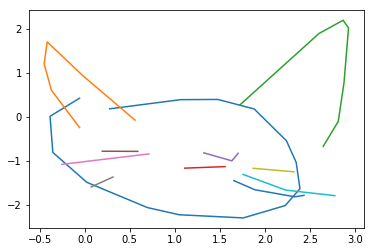

epoch 22101 in 0.177 s: loss = -0.3014, LR = -0.3311, LKL = 0.0297
epoch 22102 in 0.175 s: loss = -0.3683, LR = -0.3981, LKL = 0.0298
epoch 22103 in 0.174 s: loss = -0.3635, LR = -0.3932, LKL = 0.0298
epoch 22104 in 0.177 s: loss = -0.3938, LR = -0.4237, LKL = 0.0299
epoch 22105 in 0.182 s: loss = -0.4140, LR = -0.4437, LKL = 0.0297
epoch 22106 in 0.181 s: loss = -0.3265, LR = -0.3560, LKL = 0.0296
epoch 22107 in 0.176 s: loss = -0.3142, LR = -0.3439, LKL = 0.0297
epoch 22108 in 0.175 s: loss = -0.3915, LR = -0.4210, LKL = 0.0295
epoch 22109 in 0.178 s: loss = -0.4049, LR = -0.4346, LKL = 0.0298
epoch 22110 in 0.176 s: loss = -0.3879, LR = -0.4176, LKL = 0.0297
epoch 22111 in 0.181 s: loss = -0.3730, LR = -0.4028, LKL = 0.0297
epoch 22112 in 0.178 s: loss = -0.4013, LR = -0.4313, LKL = 0.0300
epoch 22113 in 0.176 s: loss = -0.3288, LR = -0.3584, LKL = 0.0297
epoch 22114 in 0.179 s: loss = -0.4007, LR = -0.4304, LKL = 0.0297
epoch 22115 in 0.181 s: loss = -0.3233, LR = -0.3530, LKL = 0.

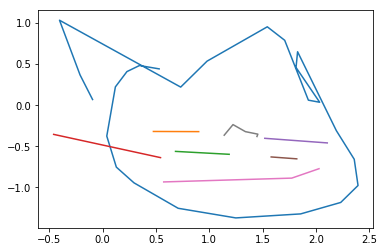

epoch 22201 in 0.173 s: loss = -0.3549, LR = -0.3847, LKL = 0.0298
epoch 22202 in 0.174 s: loss = -0.3103, LR = -0.3399, LKL = 0.0296
epoch 22203 in 0.175 s: loss = -0.3356, LR = -0.3654, LKL = 0.0297
epoch 22204 in 0.176 s: loss = -0.3288, LR = -0.3586, LKL = 0.0299
epoch 22205 in 0.177 s: loss = -0.3962, LR = -0.4260, LKL = 0.0298
epoch 22206 in 0.177 s: loss = -0.3669, LR = -0.3965, LKL = 0.0296
epoch 22207 in 0.178 s: loss = -0.3365, LR = -0.3662, LKL = 0.0297
epoch 22208 in 0.175 s: loss = -0.3987, LR = -0.4287, LKL = 0.0299
epoch 22209 in 0.175 s: loss = -0.3644, LR = -0.3941, LKL = 0.0297
epoch 22210 in 0.176 s: loss = -0.3694, LR = -0.3994, LKL = 0.0300
epoch 22211 in 0.175 s: loss = -0.3839, LR = -0.4136, LKL = 0.0297
epoch 22212 in 0.173 s: loss = -0.3526, LR = -0.3821, LKL = 0.0295
epoch 22213 in 0.176 s: loss = -0.3927, LR = -0.4225, LKL = 0.0299
epoch 22214 in 0.175 s: loss = -0.3587, LR = -0.3885, LKL = 0.0298
epoch 22215 in 0.178 s: loss = -0.3304, LR = -0.3601, LKL = 0.

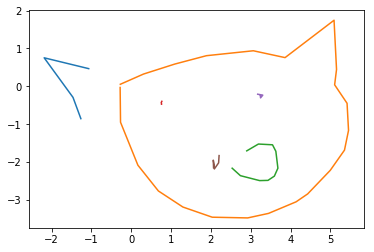

epoch 22301 in 0.173 s: loss = -0.3821, LR = -0.4119, LKL = 0.0299
epoch 22302 in 0.177 s: loss = -0.3161, LR = -0.3458, LKL = 0.0298
epoch 22303 in 0.178 s: loss = -0.3664, LR = -0.3962, LKL = 0.0298
epoch 22304 in 0.174 s: loss = -0.3457, LR = -0.3754, LKL = 0.0297
epoch 22305 in 0.175 s: loss = -0.3242, LR = -0.3537, LKL = 0.0295
epoch 22306 in 0.176 s: loss = -0.3567, LR = -0.3864, LKL = 0.0297
epoch 22307 in 0.175 s: loss = -0.3469, LR = -0.3765, LKL = 0.0296
epoch 22308 in 0.174 s: loss = -0.3400, LR = -0.3697, LKL = 0.0297
epoch 22309 in 0.176 s: loss = -0.3333, LR = -0.3630, LKL = 0.0297
epoch 22310 in 0.176 s: loss = -0.3606, LR = -0.3904, LKL = 0.0298
epoch 22311 in 0.176 s: loss = -0.3372, LR = -0.3669, LKL = 0.0297
epoch 22312 in 0.178 s: loss = -0.3541, LR = -0.3835, LKL = 0.0295
epoch 22313 in 0.176 s: loss = -0.3048, LR = -0.3342, LKL = 0.0295
epoch 22314 in 0.175 s: loss = -0.3418, LR = -0.3716, LKL = 0.0298
epoch 22315 in 0.176 s: loss = -0.3574, LR = -0.3872, LKL = 0.

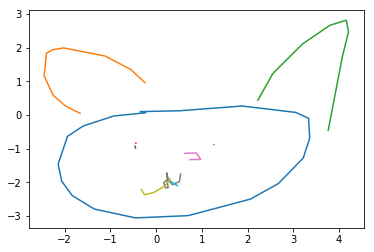

epoch 22401 in 0.174 s: loss = -0.3063, LR = -0.3358, LKL = 0.0294
epoch 22402 in 0.175 s: loss = -0.4017, LR = -0.4314, LKL = 0.0297
epoch 22403 in 0.178 s: loss = -0.3242, LR = -0.3540, LKL = 0.0298
epoch 22404 in 0.177 s: loss = -0.3282, LR = -0.3578, LKL = 0.0297
epoch 22405 in 0.180 s: loss = -0.3899, LR = -0.4198, LKL = 0.0299
epoch 22406 in 0.175 s: loss = -0.3080, LR = -0.3376, LKL = 0.0296
epoch 22407 in 0.178 s: loss = -0.3492, LR = -0.3788, LKL = 0.0296
epoch 22408 in 0.173 s: loss = -0.3046, LR = -0.3342, LKL = 0.0297
epoch 22409 in 0.176 s: loss = -0.3414, LR = -0.3713, LKL = 0.0299
epoch 22410 in 0.176 s: loss = -0.3044, LR = -0.3339, LKL = 0.0295
epoch 22411 in 0.178 s: loss = -0.3919, LR = -0.4218, LKL = 0.0299
epoch 22412 in 0.177 s: loss = -0.4075, LR = -0.4375, LKL = 0.0299
epoch 22413 in 0.178 s: loss = -0.3545, LR = -0.3843, LKL = 0.0298
epoch 22414 in 0.178 s: loss = -0.3640, LR = -0.3939, LKL = 0.0299
epoch 22415 in 0.179 s: loss = -0.2766, LR = -0.3061, LKL = 0.

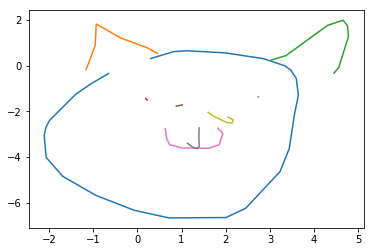

epoch 22501 in 0.173 s: loss = -0.3402, LR = -0.3699, LKL = 0.0297
epoch 22502 in 0.174 s: loss = -0.3961, LR = -0.4260, LKL = 0.0299
epoch 22503 in 0.175 s: loss = -0.3661, LR = -0.3959, LKL = 0.0298
epoch 22504 in 0.174 s: loss = -0.2991, LR = -0.3286, LKL = 0.0296
epoch 22505 in 0.171 s: loss = -0.3362, LR = -0.3657, LKL = 0.0296
epoch 22506 in 0.176 s: loss = -0.4020, LR = -0.4320, LKL = 0.0299
epoch 22507 in 0.171 s: loss = -0.4069, LR = -0.4366, LKL = 0.0297
epoch 22508 in 0.173 s: loss = -0.3335, LR = -0.3635, LKL = 0.0299
epoch 22509 in 0.175 s: loss = -0.3982, LR = -0.4280, LKL = 0.0298
epoch 22510 in 0.174 s: loss = -0.3517, LR = -0.3815, LKL = 0.0297
epoch 22511 in 0.173 s: loss = -0.3570, LR = -0.3868, LKL = 0.0298
epoch 22512 in 0.175 s: loss = -0.3819, LR = -0.4117, LKL = 0.0298
epoch 22513 in 0.178 s: loss = -0.3947, LR = -0.4244, LKL = 0.0297
epoch 22514 in 0.176 s: loss = -0.3834, LR = -0.4134, LKL = 0.0300
epoch 22515 in 0.175 s: loss = -0.3721, LR = -0.4019, LKL = 0.

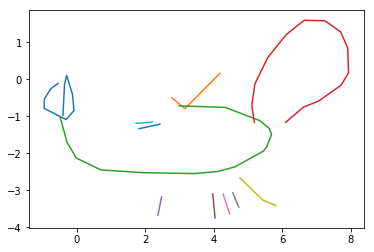

epoch 22601 in 0.176 s: loss = -0.3941, LR = -0.4239, LKL = 0.0299
epoch 22602 in 0.173 s: loss = -0.3459, LR = -0.3757, LKL = 0.0297
epoch 22603 in 0.176 s: loss = -0.3295, LR = -0.3592, LKL = 0.0297
epoch 22604 in 0.171 s: loss = -0.4000, LR = -0.4300, LKL = 0.0300
epoch 22605 in 0.173 s: loss = -0.3829, LR = -0.4127, LKL = 0.0298
epoch 22606 in 0.173 s: loss = -0.3966, LR = -0.4265, LKL = 0.0298
epoch 22607 in 0.174 s: loss = -0.3505, LR = -0.3803, LKL = 0.0298
epoch 22608 in 0.176 s: loss = -0.3376, LR = -0.3673, LKL = 0.0298
epoch 22609 in 0.174 s: loss = -0.3598, LR = -0.3895, LKL = 0.0297
epoch 22610 in 0.173 s: loss = -0.3310, LR = -0.3609, LKL = 0.0299
epoch 22611 in 0.173 s: loss = -0.3259, LR = -0.3557, LKL = 0.0297
epoch 22612 in 0.174 s: loss = -0.3306, LR = -0.3604, LKL = 0.0298
epoch 22613 in 0.178 s: loss = -0.3522, LR = -0.3820, LKL = 0.0299
epoch 22614 in 0.173 s: loss = -0.3660, LR = -0.3959, LKL = 0.0298
epoch 22615 in 0.175 s: loss = -0.3877, LR = -0.4175, LKL = 0.

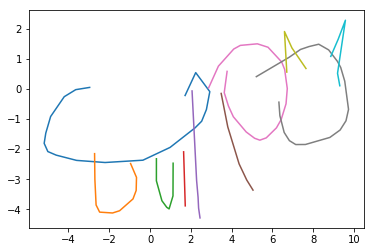

epoch 22701 in 0.173 s: loss = -0.2970, LR = -0.3268, LKL = 0.0298
epoch 22702 in 0.173 s: loss = -0.2993, LR = -0.3292, LKL = 0.0299
epoch 22703 in 0.178 s: loss = -0.3444, LR = -0.3743, LKL = 0.0299
epoch 22704 in 0.175 s: loss = -0.2568, LR = -0.2864, LKL = 0.0296
epoch 22705 in 0.177 s: loss = -0.3945, LR = -0.4245, LKL = 0.0300
epoch 22706 in 0.176 s: loss = -0.3411, LR = -0.3711, LKL = 0.0300
epoch 22707 in 0.174 s: loss = -0.2624, LR = -0.2923, LKL = 0.0299
epoch 22708 in 0.173 s: loss = -0.2532, LR = -0.2829, LKL = 0.0297
epoch 22709 in 0.178 s: loss = -0.2489, LR = -0.2788, LKL = 0.0299
epoch 22710 in 0.174 s: loss = -0.3659, LR = -0.3958, LKL = 0.0300
epoch 22711 in 0.174 s: loss = -0.3750, LR = -0.4051, LKL = 0.0301
epoch 22712 in 0.175 s: loss = -0.3336, LR = -0.3634, LKL = 0.0298
epoch 22713 in 0.179 s: loss = -0.3924, LR = -0.4224, LKL = 0.0300
epoch 22714 in 0.175 s: loss = -0.3006, LR = -0.3306, LKL = 0.0300
epoch 22715 in 0.178 s: loss = -0.2815, LR = -0.3112, LKL = 0.

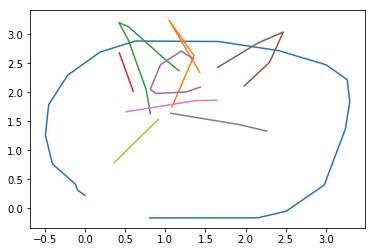

epoch 22801 in 0.173 s: loss = -0.3659, LR = -0.3958, LKL = 0.0300
epoch 22802 in 0.177 s: loss = -0.3906, LR = -0.4205, LKL = 0.0299
epoch 22803 in 0.178 s: loss = -0.3422, LR = -0.3721, LKL = 0.0299
epoch 22804 in 0.180 s: loss = -0.4118, LR = -0.4418, LKL = 0.0301
epoch 22805 in 0.176 s: loss = -0.3556, LR = -0.3856, LKL = 0.0300
epoch 22806 in 0.178 s: loss = -0.3846, LR = -0.4146, LKL = 0.0300
epoch 22807 in 0.178 s: loss = -0.3210, LR = -0.3510, LKL = 0.0299
epoch 22808 in 0.179 s: loss = -0.3462, LR = -0.3760, LKL = 0.0298
epoch 22809 in 0.177 s: loss = -0.3259, LR = -0.3559, LKL = 0.0299
epoch 22810 in 0.177 s: loss = -0.4107, LR = -0.4406, LKL = 0.0300
epoch 22811 in 0.175 s: loss = -0.3276, LR = -0.3577, LKL = 0.0300
epoch 22812 in 0.177 s: loss = -0.3631, LR = -0.3932, LKL = 0.0300
epoch 22813 in 0.179 s: loss = -0.2934, LR = -0.3231, LKL = 0.0297
epoch 22814 in 0.179 s: loss = -0.3573, LR = -0.3872, LKL = 0.0299
epoch 22815 in 0.178 s: loss = -0.4037, LR = -0.4336, LKL = 0.

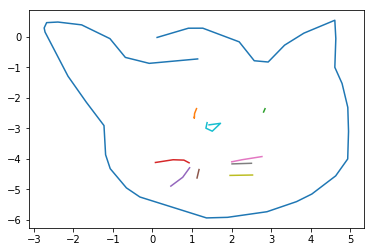

epoch 22901 in 0.176 s: loss = -0.3560, LR = -0.3859, LKL = 0.0299
epoch 22902 in 0.177 s: loss = -0.3442, LR = -0.3742, LKL = 0.0300
epoch 22903 in 0.177 s: loss = -0.3640, LR = -0.3940, LKL = 0.0300
epoch 22904 in 0.173 s: loss = -0.4118, LR = -0.4418, LKL = 0.0300
epoch 22905 in 0.176 s: loss = -0.3593, LR = -0.3892, LKL = 0.0299
epoch 22906 in 0.177 s: loss = -0.3610, LR = -0.3910, LKL = 0.0300
epoch 22907 in 0.176 s: loss = -0.2949, LR = -0.3247, LKL = 0.0297
epoch 22908 in 0.176 s: loss = -0.3920, LR = -0.4221, LKL = 0.0301
epoch 22909 in 0.176 s: loss = -0.3749, LR = -0.4049, LKL = 0.0300
epoch 22910 in 0.173 s: loss = -0.3800, LR = -0.4100, LKL = 0.0300
epoch 22911 in 0.177 s: loss = -0.3320, LR = -0.3618, LKL = 0.0298
epoch 22912 in 0.179 s: loss = -0.3950, LR = -0.4253, LKL = 0.0303
epoch 22913 in 0.176 s: loss = -0.3581, LR = -0.3881, LKL = 0.0299
epoch 22914 in 0.177 s: loss = -0.4011, LR = -0.4314, LKL = 0.0303
epoch 22915 in 0.176 s: loss = -0.4074, LR = -0.4376, LKL = 0.

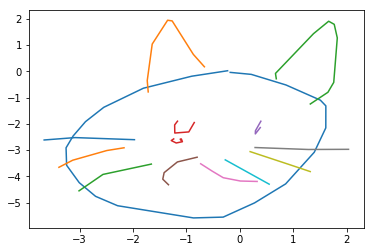

epoch 23001 in 0.174 s: loss = -0.3210, LR = -0.3509, LKL = 0.0299
epoch 23002 in 0.179 s: loss = -0.3696, LR = -0.3998, LKL = 0.0302
epoch 23003 in 0.175 s: loss = -0.2925, LR = -0.3225, LKL = 0.0301
epoch 23004 in 0.176 s: loss = -0.3685, LR = -0.3987, LKL = 0.0302
epoch 23005 in 0.177 s: loss = -0.3624, LR = -0.3924, LKL = 0.0300
epoch 23006 in 0.175 s: loss = -0.3650, LR = -0.3951, LKL = 0.0302
epoch 23007 in 0.176 s: loss = -0.3668, LR = -0.3969, LKL = 0.0301
epoch 23008 in 0.176 s: loss = -0.3596, LR = -0.3897, LKL = 0.0301
epoch 23009 in 0.180 s: loss = -0.3582, LR = -0.3882, LKL = 0.0300
epoch 23010 in 0.175 s: loss = -0.3387, LR = -0.3687, LKL = 0.0300
epoch 23011 in 0.178 s: loss = -0.3618, LR = -0.3919, LKL = 0.0302
epoch 23012 in 0.176 s: loss = -0.4068, LR = -0.4369, LKL = 0.0301
epoch 23013 in 0.178 s: loss = -0.4319, LR = -0.4620, LKL = 0.0301
epoch 23014 in 0.180 s: loss = -0.3913, LR = -0.4214, LKL = 0.0301
epoch 23015 in 0.176 s: loss = -0.3804, LR = -0.4105, LKL = 0.

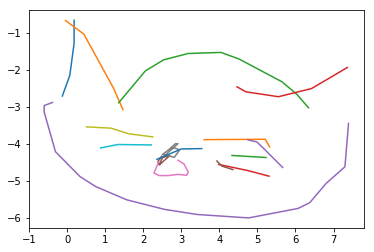

epoch 23101 in 0.174 s: loss = -0.3768, LR = -0.4068, LKL = 0.0300
epoch 23102 in 0.176 s: loss = -0.3888, LR = -0.4189, LKL = 0.0300
epoch 23103 in 0.176 s: loss = -0.3069, LR = -0.3367, LKL = 0.0298
epoch 23104 in 0.174 s: loss = -0.3435, LR = -0.3734, LKL = 0.0300
epoch 23105 in 0.175 s: loss = -0.3225, LR = -0.3525, LKL = 0.0301
epoch 23106 in 0.176 s: loss = -0.3358, LR = -0.3658, LKL = 0.0301
epoch 23107 in 0.177 s: loss = -0.3177, LR = -0.3478, LKL = 0.0300
epoch 23108 in 0.175 s: loss = -0.3161, LR = -0.3460, LKL = 0.0299
epoch 23109 in 0.176 s: loss = -0.3698, LR = -0.4000, LKL = 0.0303
epoch 23110 in 0.175 s: loss = -0.3734, LR = -0.4035, LKL = 0.0301
epoch 23111 in 0.177 s: loss = -0.3458, LR = -0.3758, LKL = 0.0300
epoch 23112 in 0.176 s: loss = -0.3685, LR = -0.3984, LKL = 0.0300
epoch 23113 in 0.175 s: loss = -0.3921, LR = -0.4220, LKL = 0.0300
epoch 23114 in 0.175 s: loss = -0.3430, LR = -0.3731, LKL = 0.0301
epoch 23115 in 0.176 s: loss = -0.3763, LR = -0.4064, LKL = 0.

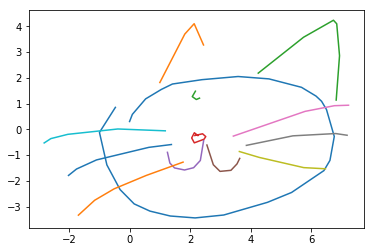

epoch 23201 in 0.174 s: loss = -0.3429, LR = -0.3731, LKL = 0.0302
epoch 23202 in 0.178 s: loss = -0.3324, LR = -0.3622, LKL = 0.0299
epoch 23203 in 0.178 s: loss = -0.3588, LR = -0.3889, LKL = 0.0301
epoch 23204 in 0.176 s: loss = -0.3609, LR = -0.3910, LKL = 0.0301
epoch 23205 in 0.178 s: loss = -0.2329, LR = -0.2626, LKL = 0.0297
epoch 23206 in 0.175 s: loss = -0.3407, LR = -0.3710, LKL = 0.0303
epoch 23207 in 0.172 s: loss = -0.3198, LR = -0.3498, LKL = 0.0300
epoch 23208 in 0.175 s: loss = -0.3416, LR = -0.3717, LKL = 0.0301
epoch 23209 in 0.176 s: loss = -0.1844, LR = -0.2143, LKL = 0.0299
epoch 23210 in 0.177 s: loss = -0.2698, LR = -0.2998, LKL = 0.0300
epoch 23211 in 0.176 s: loss = -0.3240, LR = -0.3541, LKL = 0.0301
epoch 23212 in 0.177 s: loss = -0.2702, LR = -0.3004, LKL = 0.0302
epoch 23213 in 0.176 s: loss = -0.3521, LR = -0.3824, LKL = 0.0302
epoch 23214 in 0.171 s: loss = -0.3609, LR = -0.3911, LKL = 0.0303
epoch 23215 in 0.175 s: loss = -0.3320, LR = -0.3621, LKL = 0.

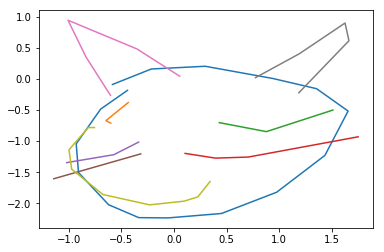

epoch 23301 in 0.177 s: loss = -0.2716, LR = -0.3015, LKL = 0.0300
epoch 23302 in 0.175 s: loss = -0.3881, LR = -0.4183, LKL = 0.0302
epoch 23303 in 0.177 s: loss = -0.4064, LR = -0.4364, LKL = 0.0300
epoch 23304 in 0.177 s: loss = -0.3597, LR = -0.3899, LKL = 0.0302
epoch 23305 in 0.173 s: loss = -0.4015, LR = -0.4317, LKL = 0.0302
epoch 23306 in 0.175 s: loss = -0.4179, LR = -0.4479, LKL = 0.0301
epoch 23307 in 0.177 s: loss = -0.3442, LR = -0.3743, LKL = 0.0301
epoch 23308 in 0.176 s: loss = -0.3120, LR = -0.3420, LKL = 0.0301
epoch 23309 in 0.175 s: loss = -0.2919, LR = -0.3216, LKL = 0.0298
epoch 23310 in 0.179 s: loss = -0.2995, LR = -0.3294, LKL = 0.0299
epoch 23311 in 0.180 s: loss = -0.4041, LR = -0.4343, LKL = 0.0302
epoch 23312 in 0.177 s: loss = -0.3923, LR = -0.4225, LKL = 0.0302
epoch 23313 in 0.177 s: loss = -0.3566, LR = -0.3866, LKL = 0.0301
epoch 23314 in 0.178 s: loss = -0.4007, LR = -0.4309, LKL = 0.0302
epoch 23315 in 0.175 s: loss = -0.3570, LR = -0.3871, LKL = 0.

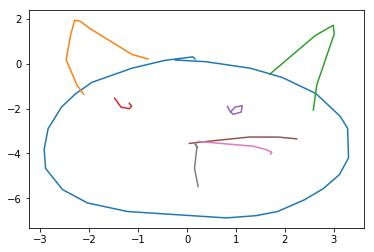

epoch 23401 in 0.172 s: loss = -0.3287, LR = -0.3586, LKL = 0.0299
epoch 23402 in 0.176 s: loss = -0.3494, LR = -0.3795, LKL = 0.0301
epoch 23403 in 0.177 s: loss = -0.3719, LR = -0.4021, LKL = 0.0302
epoch 23404 in 0.180 s: loss = -0.3765, LR = -0.4064, LKL = 0.0300
epoch 23405 in 0.176 s: loss = -0.3981, LR = -0.4284, LKL = 0.0303
epoch 23406 in 0.177 s: loss = -0.3368, LR = -0.3669, LKL = 0.0301
epoch 23407 in 0.178 s: loss = -0.3901, LR = -0.4204, LKL = 0.0304
epoch 23408 in 0.177 s: loss = -0.3156, LR = -0.3459, LKL = 0.0303
epoch 23409 in 0.176 s: loss = -0.3401, LR = -0.3701, LKL = 0.0300
epoch 23410 in 0.180 s: loss = -0.3707, LR = -0.4009, LKL = 0.0301
epoch 23411 in 0.176 s: loss = -0.4104, LR = -0.4406, LKL = 0.0302
epoch 23412 in 0.177 s: loss = -0.3096, LR = -0.3395, LKL = 0.0299
epoch 23413 in 0.176 s: loss = -0.4232, LR = -0.4534, LKL = 0.0302
epoch 23414 in 0.180 s: loss = -0.3299, LR = -0.3600, LKL = 0.0301
epoch 23415 in 0.176 s: loss = -0.3442, LR = -0.3743, LKL = 0.

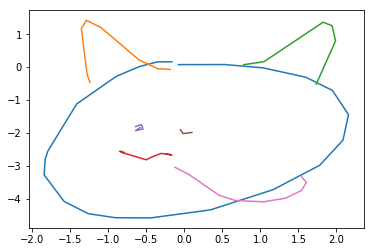

epoch 23501 in 0.176 s: loss = -0.4009, LR = -0.4311, LKL = 0.0301
epoch 23502 in 0.176 s: loss = -0.3317, LR = -0.3617, LKL = 0.0300
epoch 23503 in 0.177 s: loss = -0.2802, LR = -0.3099, LKL = 0.0298
epoch 23504 in 0.178 s: loss = -0.4231, LR = -0.4532, LKL = 0.0301
epoch 23505 in 0.177 s: loss = -0.3485, LR = -0.3787, LKL = 0.0302
epoch 23506 in 0.177 s: loss = -0.4387, LR = -0.4689, LKL = 0.0302
epoch 23507 in 0.178 s: loss = -0.3947, LR = -0.4251, LKL = 0.0305
epoch 23508 in 0.175 s: loss = -0.3102, LR = -0.3402, LKL = 0.0300
epoch 23509 in 0.178 s: loss = -0.3390, LR = -0.3689, LKL = 0.0300
epoch 23510 in 0.177 s: loss = -0.3527, LR = -0.3829, LKL = 0.0302
epoch 23511 in 0.179 s: loss = -0.3919, LR = -0.4223, LKL = 0.0305
epoch 23512 in 0.174 s: loss = -0.3608, LR = -0.3910, LKL = 0.0302
epoch 23513 in 0.177 s: loss = -0.3528, LR = -0.3829, LKL = 0.0301
epoch 23514 in 0.178 s: loss = -0.3598, LR = -0.3898, LKL = 0.0301
epoch 23515 in 0.177 s: loss = -0.3838, LR = -0.4140, LKL = 0.

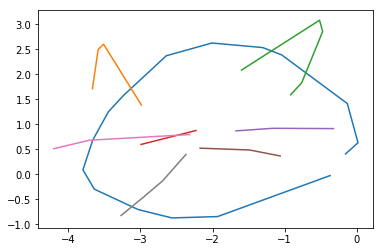

epoch 23601 in 0.174 s: loss = -0.3239, LR = -0.3539, LKL = 0.0300
epoch 23602 in 0.175 s: loss = -0.3593, LR = -0.3896, LKL = 0.0303
epoch 23603 in 0.178 s: loss = -0.3235, LR = -0.3537, LKL = 0.0302
epoch 23604 in 0.177 s: loss = -0.3617, LR = -0.3919, LKL = 0.0302
epoch 23605 in 0.177 s: loss = -0.3767, LR = -0.4070, LKL = 0.0303
epoch 23606 in 0.177 s: loss = -0.3516, LR = -0.3816, LKL = 0.0300
epoch 23607 in 0.178 s: loss = -0.3657, LR = -0.3959, LKL = 0.0302
epoch 23608 in 0.177 s: loss = -0.3970, LR = -0.4272, LKL = 0.0303
epoch 23609 in 0.177 s: loss = -0.3569, LR = -0.3870, LKL = 0.0302
epoch 23610 in 0.179 s: loss = -0.3272, LR = -0.3573, LKL = 0.0301
epoch 23611 in 0.179 s: loss = -0.3655, LR = -0.3957, LKL = 0.0302
epoch 23612 in 0.176 s: loss = -0.3472, LR = -0.3774, LKL = 0.0302
epoch 23613 in 0.178 s: loss = -0.3890, LR = -0.4193, LKL = 0.0303
epoch 23614 in 0.176 s: loss = -0.3456, LR = -0.3758, LKL = 0.0302
epoch 23615 in 0.177 s: loss = -0.4071, LR = -0.4375, LKL = 0.

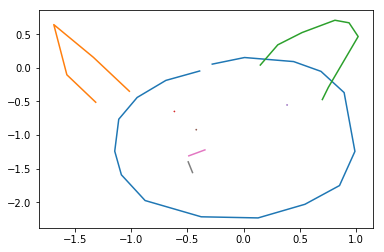

epoch 23701 in 0.176 s: loss = -0.4393, LR = -0.4696, LKL = 0.0304
epoch 23702 in 0.177 s: loss = -0.3091, LR = -0.3393, LKL = 0.0302
epoch 23703 in 0.176 s: loss = -0.4295, LR = -0.4598, LKL = 0.0303
epoch 23704 in 0.182 s: loss = -0.4459, LR = -0.4764, LKL = 0.0305
epoch 23705 in 0.177 s: loss = -0.3677, LR = -0.3982, LKL = 0.0304
epoch 23706 in 0.174 s: loss = -0.3899, LR = -0.4203, LKL = 0.0303
epoch 23707 in 0.177 s: loss = -0.4275, LR = -0.4578, LKL = 0.0303
epoch 23708 in 0.171 s: loss = -0.4210, LR = -0.4514, LKL = 0.0303
epoch 23709 in 0.175 s: loss = -0.3810, LR = -0.4114, LKL = 0.0304
epoch 23710 in 0.178 s: loss = -0.4460, LR = -0.4765, LKL = 0.0306
epoch 23711 in 0.177 s: loss = -0.3376, LR = -0.3681, LKL = 0.0305
epoch 23712 in 0.173 s: loss = -0.4019, LR = -0.4323, LKL = 0.0304
epoch 23713 in 0.177 s: loss = -0.3138, LR = -0.3439, LKL = 0.0302
epoch 23714 in 0.179 s: loss = -0.3788, LR = -0.4090, LKL = 0.0302
epoch 23715 in 0.177 s: loss = -0.3333, LR = -0.3636, LKL = 0.

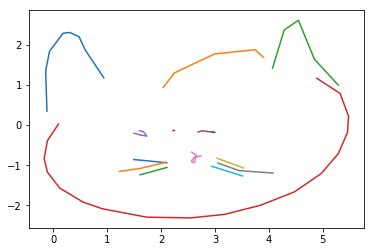

epoch 23801 in 0.172 s: loss = -0.3870, LR = -0.4175, LKL = 0.0305
epoch 23802 in 0.175 s: loss = -0.3361, LR = -0.3664, LKL = 0.0302
epoch 23803 in 0.176 s: loss = -0.3891, LR = -0.4195, LKL = 0.0304
epoch 23804 in 0.175 s: loss = -0.3332, LR = -0.3634, LKL = 0.0301
epoch 23805 in 0.177 s: loss = -0.3436, LR = -0.3739, LKL = 0.0304
epoch 23806 in 0.175 s: loss = -0.3469, LR = -0.3772, LKL = 0.0303
epoch 23807 in 0.178 s: loss = -0.2387, LR = -0.2689, LKL = 0.0302
epoch 23808 in 0.175 s: loss = -0.3932, LR = -0.4236, LKL = 0.0304
epoch 23809 in 0.180 s: loss = -0.3071, LR = -0.3374, LKL = 0.0302
epoch 23810 in 0.174 s: loss = -0.3505, LR = -0.3808, LKL = 0.0302
epoch 23811 in 0.173 s: loss = -0.2775, LR = -0.3076, LKL = 0.0301
epoch 23812 in 0.174 s: loss = -0.3433, LR = -0.3735, LKL = 0.0302
epoch 23813 in 0.177 s: loss = -0.3532, LR = -0.3834, LKL = 0.0302
epoch 23814 in 0.176 s: loss = -0.2662, LR = -0.2964, LKL = 0.0302
epoch 23815 in 0.178 s: loss = -0.3162, LR = -0.3465, LKL = 0.

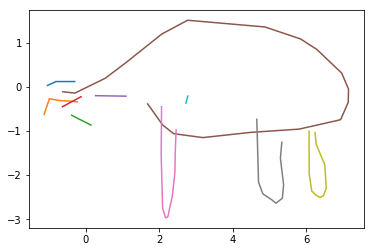

epoch 23901 in 0.173 s: loss = -0.3643, LR = -0.3945, LKL = 0.0302
epoch 23902 in 0.174 s: loss = -0.3562, LR = -0.3865, LKL = 0.0303
epoch 23903 in 0.180 s: loss = -0.3143, LR = -0.3447, LKL = 0.0303
epoch 23904 in 0.174 s: loss = -0.3626, LR = -0.3930, LKL = 0.0304
epoch 23905 in 0.170 s: loss = -0.3722, LR = -0.4024, LKL = 0.0302
epoch 23906 in 0.175 s: loss = -0.3992, LR = -0.4295, LKL = 0.0303
epoch 23907 in 0.174 s: loss = -0.3867, LR = -0.4170, LKL = 0.0303
epoch 23908 in 0.171 s: loss = -0.3470, LR = -0.3771, LKL = 0.0301
epoch 23909 in 0.172 s: loss = -0.3511, LR = -0.3814, LKL = 0.0303
epoch 23910 in 0.173 s: loss = -0.3560, LR = -0.3863, LKL = 0.0303
epoch 23911 in 0.173 s: loss = -0.3863, LR = -0.4167, LKL = 0.0304
epoch 23912 in 0.173 s: loss = -0.3796, LR = -0.4098, LKL = 0.0303
epoch 23913 in 0.177 s: loss = -0.3751, LR = -0.4053, LKL = 0.0302
epoch 23914 in 0.173 s: loss = -0.3618, LR = -0.3923, LKL = 0.0306
epoch 23915 in 0.171 s: loss = -0.3492, LR = -0.3796, LKL = 0.

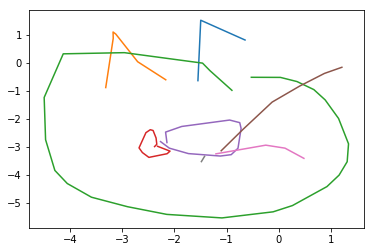

epoch 24001 in 0.175 s: loss = -0.3758, LR = -0.4063, LKL = 0.0305
epoch 24002 in 0.172 s: loss = -0.3280, LR = -0.3585, LKL = 0.0304
epoch 24003 in 0.174 s: loss = -0.2400, LR = -0.2702, LKL = 0.0302
epoch 24004 in 0.173 s: loss = -0.3742, LR = -0.4046, LKL = 0.0304
epoch 24005 in 0.176 s: loss = -0.3388, LR = -0.3692, LKL = 0.0305
epoch 24006 in 0.174 s: loss = -0.3371, LR = -0.3676, LKL = 0.0305
epoch 24007 in 0.172 s: loss = -0.3443, LR = -0.3745, LKL = 0.0303
epoch 24008 in 0.173 s: loss = -0.3269, LR = -0.3570, LKL = 0.0302
epoch 24009 in 0.176 s: loss = -0.3530, LR = -0.3835, LKL = 0.0304
epoch 24010 in 0.174 s: loss = -0.4021, LR = -0.4327, LKL = 0.0306
epoch 24011 in 0.173 s: loss = -0.3567, LR = -0.3871, LKL = 0.0304
epoch 24012 in 0.171 s: loss = -0.3715, LR = -0.4019, LKL = 0.0303
epoch 24013 in 0.173 s: loss = -0.3871, LR = -0.4177, LKL = 0.0306
epoch 24014 in 0.172 s: loss = -0.3801, LR = -0.4106, LKL = 0.0305
epoch 24015 in 0.177 s: loss = -0.3901, LR = -0.4205, LKL = 0.

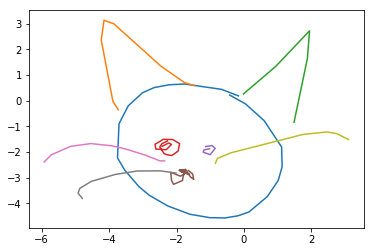

epoch 24101 in 0.177 s: loss = -0.2856, LR = -0.3160, LKL = 0.0305
epoch 24102 in 0.174 s: loss = -0.4087, LR = -0.4392, LKL = 0.0305
epoch 24103 in 0.173 s: loss = -0.3740, LR = -0.4042, LKL = 0.0302
epoch 24104 in 0.173 s: loss = -0.3561, LR = -0.3866, LKL = 0.0305
epoch 24105 in 0.172 s: loss = -0.3694, LR = -0.3998, LKL = 0.0303
epoch 24106 in 0.174 s: loss = -0.3276, LR = -0.3578, LKL = 0.0303
epoch 24107 in 0.177 s: loss = -0.3762, LR = -0.4065, LKL = 0.0304
epoch 24108 in 0.173 s: loss = -0.3533, LR = -0.3838, LKL = 0.0305
epoch 24109 in 0.172 s: loss = -0.3543, LR = -0.3848, LKL = 0.0306
epoch 24110 in 0.175 s: loss = -0.4183, LR = -0.4489, LKL = 0.0306
epoch 24111 in 0.176 s: loss = -0.3694, LR = -0.3999, LKL = 0.0305
epoch 24112 in 0.175 s: loss = -0.3697, LR = -0.4001, LKL = 0.0304
epoch 24113 in 0.173 s: loss = -0.3540, LR = -0.3845, LKL = 0.0305
epoch 24114 in 0.174 s: loss = -0.4307, LR = -0.4613, LKL = 0.0306
epoch 24115 in 0.172 s: loss = -0.3747, LR = -0.4052, LKL = 0.

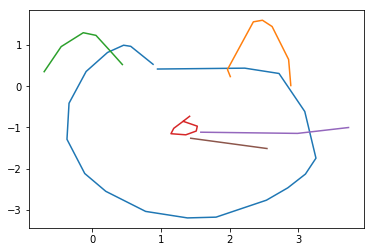

epoch 24201 in 0.176 s: loss = -0.3322, LR = -0.3626, LKL = 0.0304
epoch 24202 in 0.173 s: loss = -0.3295, LR = -0.3599, LKL = 0.0304
epoch 24203 in 0.171 s: loss = -0.3030, LR = -0.3335, LKL = 0.0305
epoch 24204 in 0.172 s: loss = -0.4034, LR = -0.4340, LKL = 0.0306
epoch 24205 in 0.172 s: loss = -0.3644, LR = -0.3949, LKL = 0.0305
epoch 24206 in 0.174 s: loss = -0.3024, LR = -0.3328, LKL = 0.0304
epoch 24207 in 0.174 s: loss = -0.3797, LR = -0.4103, LKL = 0.0305
epoch 24208 in 0.171 s: loss = -0.4360, LR = -0.4667, LKL = 0.0307
epoch 24209 in 0.174 s: loss = -0.3649, LR = -0.3952, LKL = 0.0304
epoch 24210 in 0.172 s: loss = -0.3713, LR = -0.4018, LKL = 0.0305
epoch 24211 in 0.175 s: loss = -0.3623, LR = -0.3928, LKL = 0.0305
epoch 24212 in 0.174 s: loss = -0.3412, LR = -0.3716, LKL = 0.0304
epoch 24213 in 0.172 s: loss = -0.4247, LR = -0.4553, LKL = 0.0306
epoch 24214 in 0.172 s: loss = -0.4703, LR = -0.5012, LKL = 0.0309
epoch 24215 in 0.173 s: loss = -0.3604, LR = -0.3908, LKL = 0.

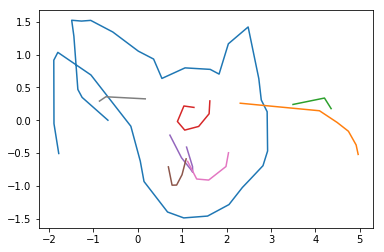

epoch 24301 in 0.175 s: loss = -0.3455, LR = -0.3761, LKL = 0.0306
epoch 24302 in 0.172 s: loss = -0.3616, LR = -0.3921, LKL = 0.0305
epoch 24303 in 0.175 s: loss = -0.3474, LR = -0.3779, LKL = 0.0305
epoch 24304 in 0.171 s: loss = -0.3953, LR = -0.4259, LKL = 0.0306
epoch 24305 in 0.173 s: loss = -0.3691, LR = -0.3994, LKL = 0.0303
epoch 24306 in 0.172 s: loss = -0.3606, LR = -0.3912, LKL = 0.0306
epoch 24307 in 0.177 s: loss = -0.3328, LR = -0.3631, LKL = 0.0303
epoch 24308 in 0.172 s: loss = -0.4055, LR = -0.4363, LKL = 0.0308
epoch 24309 in 0.173 s: loss = -0.3810, LR = -0.4114, LKL = 0.0304
epoch 24310 in 0.171 s: loss = -0.3656, LR = -0.3959, LKL = 0.0303
epoch 24311 in 0.173 s: loss = -0.3554, LR = -0.3857, LKL = 0.0303
epoch 24312 in 0.172 s: loss = -0.3439, LR = -0.3744, LKL = 0.0305
epoch 24313 in 0.174 s: loss = -0.3887, LR = -0.4191, LKL = 0.0304
epoch 24314 in 0.171 s: loss = -0.3983, LR = -0.4289, LKL = 0.0306
epoch 24315 in 0.174 s: loss = -0.3855, LR = -0.4160, LKL = 0.

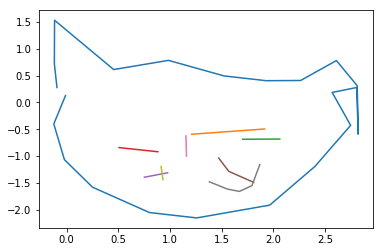

epoch 24401 in 0.174 s: loss = -0.3517, LR = -0.3824, LKL = 0.0307
epoch 24402 in 0.175 s: loss = -0.3670, LR = -0.3975, LKL = 0.0304
epoch 24403 in 0.173 s: loss = -0.3861, LR = -0.4169, LKL = 0.0308
epoch 24404 in 0.174 s: loss = -0.3463, LR = -0.3768, LKL = 0.0304
epoch 24405 in 0.172 s: loss = -0.4187, LR = -0.4495, LKL = 0.0308
epoch 24406 in 0.173 s: loss = -0.4158, LR = -0.4467, LKL = 0.0309
epoch 24407 in 0.175 s: loss = -0.3592, LR = -0.3898, LKL = 0.0306
epoch 24408 in 0.173 s: loss = -0.3882, LR = -0.4188, LKL = 0.0307
epoch 24409 in 0.172 s: loss = -0.3733, LR = -0.4037, LKL = 0.0304
epoch 24410 in 0.173 s: loss = -0.3740, LR = -0.4047, LKL = 0.0306
epoch 24411 in 0.173 s: loss = -0.3471, LR = -0.3776, LKL = 0.0305
epoch 24412 in 0.176 s: loss = -0.4349, LR = -0.4656, LKL = 0.0307
epoch 24413 in 0.172 s: loss = -0.3361, LR = -0.3665, LKL = 0.0304
epoch 24414 in 0.173 s: loss = -0.4663, LR = -0.4967, LKL = 0.0305
epoch 24415 in 0.172 s: loss = -0.3457, LR = -0.3762, LKL = 0.

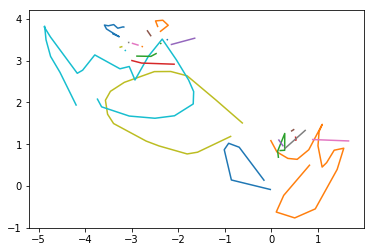

epoch 24501 in 0.178 s: loss = -0.3508, LR = -0.3813, LKL = 0.0305
epoch 24502 in 0.176 s: loss = -0.3732, LR = -0.4037, LKL = 0.0306
epoch 24503 in 0.172 s: loss = -0.3998, LR = -0.4305, LKL = 0.0307
epoch 24504 in 0.172 s: loss = -0.3972, LR = -0.4278, LKL = 0.0307
epoch 24505 in 0.175 s: loss = -0.4033, LR = -0.4338, LKL = 0.0305
epoch 24506 in 0.173 s: loss = -0.3551, LR = -0.3856, LKL = 0.0305
epoch 24507 in 0.173 s: loss = -0.3560, LR = -0.3866, LKL = 0.0306
epoch 24508 in 0.171 s: loss = -0.3936, LR = -0.4242, LKL = 0.0305
epoch 24509 in 0.174 s: loss = -0.3855, LR = -0.4161, LKL = 0.0305
epoch 24510 in 0.174 s: loss = -0.4297, LR = -0.4604, LKL = 0.0307
epoch 24511 in 0.176 s: loss = -0.3828, LR = -0.4133, LKL = 0.0305
epoch 24512 in 0.175 s: loss = -0.4609, LR = -0.4916, LKL = 0.0307
epoch 24513 in 0.173 s: loss = -0.2980, LR = -0.3283, LKL = 0.0303
epoch 24514 in 0.173 s: loss = -0.3428, LR = -0.3734, LKL = 0.0306
epoch 24515 in 0.175 s: loss = -0.4298, LR = -0.4606, LKL = 0.

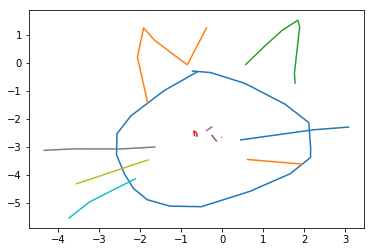

epoch 24601 in 0.177 s: loss = -0.3820, LR = -0.4125, LKL = 0.0305
epoch 24602 in 0.174 s: loss = -0.3999, LR = -0.4304, LKL = 0.0305
epoch 24603 in 0.173 s: loss = -0.4291, LR = -0.4597, LKL = 0.0306
epoch 24604 in 0.176 s: loss = -0.4149, LR = -0.4453, LKL = 0.0305
epoch 24605 in 0.173 s: loss = -0.3868, LR = -0.4172, LKL = 0.0304
epoch 24606 in 0.172 s: loss = -0.3169, LR = -0.3476, LKL = 0.0307
epoch 24607 in 0.174 s: loss = -0.3834, LR = -0.4139, LKL = 0.0305
epoch 24608 in 0.171 s: loss = -0.3776, LR = -0.4082, LKL = 0.0306
epoch 24609 in 0.174 s: loss = -0.3521, LR = -0.3828, LKL = 0.0306
epoch 24610 in 0.173 s: loss = -0.3423, LR = -0.3727, LKL = 0.0305
epoch 24611 in 0.176 s: loss = -0.3840, LR = -0.4148, LKL = 0.0307
epoch 24612 in 0.174 s: loss = -0.3410, LR = -0.3714, LKL = 0.0303
epoch 24613 in 0.172 s: loss = -0.3906, LR = -0.4212, LKL = 0.0305
epoch 24614 in 0.176 s: loss = -0.4185, LR = -0.4489, LKL = 0.0303
epoch 24615 in 0.174 s: loss = -0.3404, LR = -0.3707, LKL = 0.

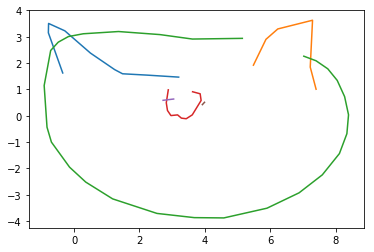

epoch 24701 in 0.174 s: loss = -0.3773, LR = -0.4080, LKL = 0.0306
epoch 24702 in 0.174 s: loss = -0.3401, LR = -0.3707, LKL = 0.0307
epoch 24703 in 0.178 s: loss = -0.4039, LR = -0.4346, LKL = 0.0306
epoch 24704 in 0.175 s: loss = -0.3453, LR = -0.3759, LKL = 0.0305
epoch 24705 in 0.174 s: loss = -0.3654, LR = -0.3959, LKL = 0.0304
epoch 24706 in 0.176 s: loss = -0.4262, LR = -0.4569, LKL = 0.0307
epoch 24707 in 0.178 s: loss = -0.4253, LR = -0.4560, LKL = 0.0307
epoch 24708 in 0.174 s: loss = -0.4489, LR = -0.4799, LKL = 0.0310
epoch 24709 in 0.178 s: loss = -0.3131, LR = -0.3437, LKL = 0.0305
epoch 24710 in 0.175 s: loss = -0.3995, LR = -0.4301, LKL = 0.0306
epoch 24711 in 0.173 s: loss = -0.4389, LR = -0.4696, LKL = 0.0306
epoch 24712 in 0.174 s: loss = -0.3824, LR = -0.4128, LKL = 0.0305
epoch 24713 in 0.178 s: loss = -0.3697, LR = -0.4002, LKL = 0.0305
epoch 24714 in 0.175 s: loss = -0.3994, LR = -0.4300, LKL = 0.0306
epoch 24715 in 0.174 s: loss = -0.3793, LR = -0.4099, LKL = 0.

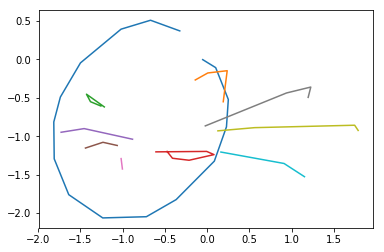

epoch 24801 in 0.173 s: loss = -0.3899, LR = -0.4203, LKL = 0.0304
epoch 24802 in 0.174 s: loss = -0.3304, LR = -0.3609, LKL = 0.0305
epoch 24803 in 0.174 s: loss = -0.4251, LR = -0.4559, LKL = 0.0308
epoch 24804 in 0.176 s: loss = -0.3941, LR = -0.4247, LKL = 0.0306
epoch 24805 in 0.176 s: loss = -0.3826, LR = -0.4133, LKL = 0.0308
epoch 24806 in 0.175 s: loss = -0.3447, LR = -0.3751, LKL = 0.0305
epoch 24807 in 0.178 s: loss = -0.3888, LR = -0.4192, LKL = 0.0304
epoch 24808 in 0.177 s: loss = -0.4014, LR = -0.4320, LKL = 0.0306
epoch 24809 in 0.176 s: loss = -0.4051, LR = -0.4358, LKL = 0.0306
epoch 24810 in 0.175 s: loss = -0.4207, LR = -0.4513, LKL = 0.0306
epoch 24811 in 0.176 s: loss = -0.3963, LR = -0.4270, LKL = 0.0307
epoch 24812 in 0.172 s: loss = -0.3657, LR = -0.3963, LKL = 0.0306
epoch 24813 in 0.177 s: loss = -0.3834, LR = -0.4140, LKL = 0.0305
epoch 24814 in 0.175 s: loss = -0.3743, LR = -0.4049, LKL = 0.0306
epoch 24815 in 0.176 s: loss = -0.3269, LR = -0.3573, LKL = 0.

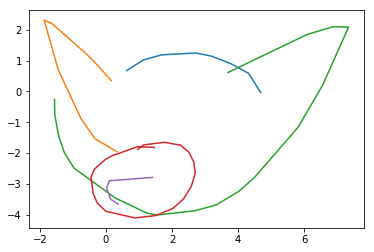

epoch 24901 in 0.175 s: loss = -0.4402, LR = -0.4710, LKL = 0.0307
epoch 24902 in 0.178 s: loss = -0.3845, LR = -0.4152, LKL = 0.0307
epoch 24903 in 0.179 s: loss = -0.3983, LR = -0.4291, LKL = 0.0308
epoch 24904 in 0.176 s: loss = -0.4151, LR = -0.4459, LKL = 0.0307
epoch 24905 in 0.176 s: loss = -0.3953, LR = -0.4259, LKL = 0.0306
epoch 24906 in 0.176 s: loss = -0.3990, LR = -0.4296, LKL = 0.0306
epoch 24907 in 0.178 s: loss = -0.3576, LR = -0.3883, LKL = 0.0307
epoch 24908 in 0.177 s: loss = -0.3672, LR = -0.3977, LKL = 0.0306
epoch 24909 in 0.176 s: loss = -0.3942, LR = -0.4249, LKL = 0.0307
epoch 24910 in 0.176 s: loss = -0.3662, LR = -0.3970, LKL = 0.0308
epoch 24911 in 0.178 s: loss = -0.3561, LR = -0.3868, LKL = 0.0306
epoch 24912 in 0.177 s: loss = -0.3452, LR = -0.3758, LKL = 0.0306
epoch 24913 in 0.181 s: loss = -0.3545, LR = -0.3851, LKL = 0.0306
epoch 24914 in 0.176 s: loss = -0.3605, LR = -0.3912, LKL = 0.0307
epoch 24915 in 0.176 s: loss = -0.4171, LR = -0.4478, LKL = 0.

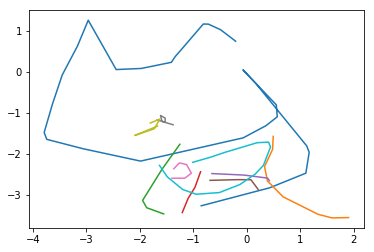

epoch 25001 in 0.177 s: loss = -0.3579, LR = -0.3885, LKL = 0.0306
epoch 25002 in 0.176 s: loss = -0.4008, LR = -0.4317, LKL = 0.0309
epoch 25003 in 0.178 s: loss = -0.3204, LR = -0.3510, LKL = 0.0306
epoch 25004 in 0.180 s: loss = -0.3741, LR = -0.4047, LKL = 0.0306
epoch 25005 in 0.175 s: loss = -0.4039, LR = -0.4345, LKL = 0.0307
epoch 25006 in 0.177 s: loss = -0.3973, LR = -0.4280, LKL = 0.0307
epoch 25007 in 0.178 s: loss = -0.4034, LR = -0.4341, LKL = 0.0307
epoch 25008 in 0.177 s: loss = -0.3433, LR = -0.3738, LKL = 0.0305
epoch 25009 in 0.180 s: loss = -0.3679, LR = -0.3985, LKL = 0.0306
epoch 25010 in 0.176 s: loss = -0.3802, LR = -0.4112, LKL = 0.0310
epoch 25011 in 0.177 s: loss = -0.3679, LR = -0.3985, LKL = 0.0307
epoch 25012 in 0.173 s: loss = -0.3650, LR = -0.3959, LKL = 0.0309
epoch 25013 in 0.176 s: loss = -0.3609, LR = -0.3918, LKL = 0.0309
epoch 25014 in 0.179 s: loss = -0.3844, LR = -0.4151, LKL = 0.0307
epoch 25015 in 0.176 s: loss = -0.2994, LR = -0.3297, LKL = 0.

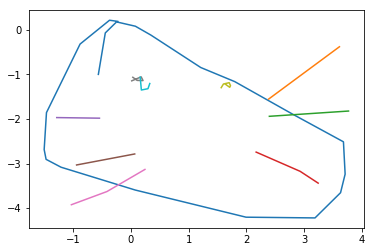

epoch 25101 in 0.175 s: loss = -0.3947, LR = -0.4255, LKL = 0.0308
epoch 25102 in 0.172 s: loss = -0.3361, LR = -0.3669, LKL = 0.0308
epoch 25103 in 0.172 s: loss = -0.3483, LR = -0.3790, LKL = 0.0306
epoch 25104 in 0.176 s: loss = -0.3491, LR = -0.3796, LKL = 0.0305
epoch 25105 in 0.174 s: loss = -0.3896, LR = -0.4202, LKL = 0.0306
epoch 25106 in 0.175 s: loss = -0.3847, LR = -0.4155, LKL = 0.0307
epoch 25107 in 0.175 s: loss = -0.3930, LR = -0.4236, LKL = 0.0306
epoch 25108 in 0.178 s: loss = -0.4038, LR = -0.4347, LKL = 0.0309
epoch 25109 in 0.176 s: loss = -0.4541, LR = -0.4849, LKL = 0.0308
epoch 25110 in 0.175 s: loss = -0.4277, LR = -0.4585, LKL = 0.0309
epoch 25111 in 0.175 s: loss = -0.3843, LR = -0.4150, LKL = 0.0307
epoch 25112 in 0.175 s: loss = -0.4197, LR = -0.4505, LKL = 0.0308
epoch 25113 in 0.175 s: loss = -0.3671, LR = -0.3982, LKL = 0.0310
epoch 25114 in 0.171 s: loss = -0.3568, LR = -0.3875, LKL = 0.0307
epoch 25115 in 0.175 s: loss = -0.3841, LR = -0.4147, LKL = 0.

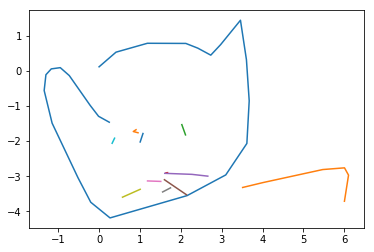

epoch 25201 in 0.177 s: loss = -0.3629, LR = -0.3937, LKL = 0.0307
epoch 25202 in 0.183 s: loss = -0.3449, LR = -0.3754, LKL = 0.0305
epoch 25203 in 0.174 s: loss = -0.4249, LR = -0.4558, LKL = 0.0309
epoch 25204 in 0.177 s: loss = -0.4111, LR = -0.4419, LKL = 0.0308
epoch 25205 in 0.177 s: loss = -0.4168, LR = -0.4477, LKL = 0.0309
epoch 25206 in 0.176 s: loss = -0.3789, LR = -0.4096, LKL = 0.0307
epoch 25207 in 0.173 s: loss = -0.3914, LR = -0.4223, LKL = 0.0308
epoch 25208 in 0.172 s: loss = -0.3844, LR = -0.4151, LKL = 0.0307
epoch 25209 in 0.174 s: loss = -0.4736, LR = -0.5048, LKL = 0.0311
epoch 25210 in 0.169 s: loss = -0.4218, LR = -0.4526, LKL = 0.0308
epoch 25211 in 0.179 s: loss = -0.3970, LR = -0.4278, LKL = 0.0308
epoch 25212 in 0.178 s: loss = -0.3796, LR = -0.4103, LKL = 0.0307
epoch 25213 in 0.179 s: loss = -0.3750, LR = -0.4056, LKL = 0.0306
epoch 25214 in 0.178 s: loss = -0.4782, LR = -0.5094, LKL = 0.0311
epoch 25215 in 0.179 s: loss = -0.3491, LR = -0.3798, LKL = 0.

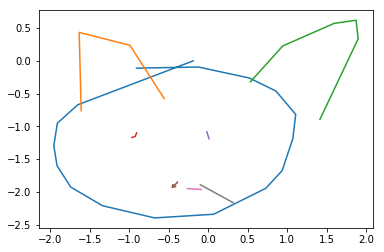

epoch 25301 in 0.180 s: loss = -0.3089, LR = -0.3396, LKL = 0.0307
epoch 25302 in 0.173 s: loss = -0.4041, LR = -0.4349, LKL = 0.0308
epoch 25303 in 0.174 s: loss = -0.3859, LR = -0.4167, LKL = 0.0308
epoch 25304 in 0.180 s: loss = -0.3348, LR = -0.3655, LKL = 0.0307
epoch 25305 in 0.176 s: loss = -0.3609, LR = -0.3915, LKL = 0.0306
epoch 25306 in 0.178 s: loss = -0.3860, LR = -0.4167, LKL = 0.0308
epoch 25307 in 0.179 s: loss = -0.3651, LR = -0.3959, LKL = 0.0308
epoch 25308 in 0.177 s: loss = -0.4195, LR = -0.4505, LKL = 0.0310
epoch 25309 in 0.177 s: loss = -0.3411, LR = -0.3717, LKL = 0.0307
epoch 25310 in 0.174 s: loss = -0.3773, LR = -0.4081, LKL = 0.0308
epoch 25311 in 0.178 s: loss = -0.3874, LR = -0.4182, LKL = 0.0307
epoch 25312 in 0.174 s: loss = -0.3643, LR = -0.3950, LKL = 0.0307
epoch 25313 in 0.173 s: loss = -0.3762, LR = -0.4070, LKL = 0.0308
epoch 25314 in 0.177 s: loss = -0.3984, LR = -0.4292, LKL = 0.0309
epoch 25315 in 0.176 s: loss = -0.3624, LR = -0.3931, LKL = 0.

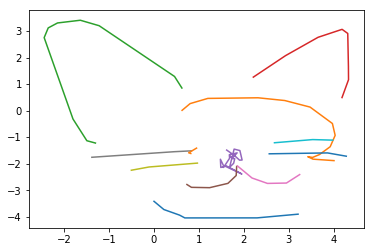

epoch 25401 in 0.173 s: loss = -0.4224, LR = -0.4532, LKL = 0.0309
epoch 25402 in 0.179 s: loss = -0.3658, LR = -0.3967, LKL = 0.0309
epoch 25403 in 0.176 s: loss = -0.4242, LR = -0.4552, LKL = 0.0311
epoch 25404 in 0.175 s: loss = -0.3264, LR = -0.3570, LKL = 0.0306
epoch 25405 in 0.176 s: loss = -0.3499, LR = -0.3807, LKL = 0.0307
epoch 25406 in 0.174 s: loss = -0.4035, LR = -0.4345, LKL = 0.0311
epoch 25407 in 0.176 s: loss = -0.3643, LR = -0.3949, LKL = 0.0306
epoch 25408 in 0.176 s: loss = -0.4019, LR = -0.4328, LKL = 0.0309
epoch 25409 in 0.177 s: loss = -0.3650, LR = -0.3957, LKL = 0.0307
epoch 25410 in 0.172 s: loss = -0.3923, LR = -0.4232, LKL = 0.0309
epoch 25411 in 0.173 s: loss = -0.3806, LR = -0.4114, LKL = 0.0309
epoch 25412 in 0.177 s: loss = -0.3888, LR = -0.4195, LKL = 0.0307
epoch 25413 in 0.174 s: loss = -0.4508, LR = -0.4815, LKL = 0.0307
epoch 25414 in 0.176 s: loss = -0.3410, LR = -0.3716, LKL = 0.0307
epoch 25415 in 0.175 s: loss = -0.3104, LR = -0.3409, LKL = 0.

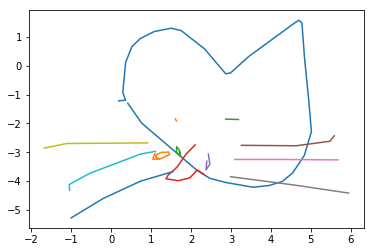

epoch 25501 in 0.172 s: loss = -0.3879, LR = -0.4187, LKL = 0.0308
epoch 25502 in 0.176 s: loss = -0.3986, LR = -0.4296, LKL = 0.0310
epoch 25503 in 0.176 s: loss = -0.3601, LR = -0.3909, LKL = 0.0308
epoch 25504 in 0.177 s: loss = -0.3265, LR = -0.3573, LKL = 0.0308
epoch 25505 in 0.178 s: loss = -0.4304, LR = -0.4614, LKL = 0.0310
epoch 25506 in 0.176 s: loss = -0.3931, LR = -0.4241, LKL = 0.0310
epoch 25507 in 0.177 s: loss = -0.3898, LR = -0.4204, LKL = 0.0306
epoch 25508 in 0.179 s: loss = -0.3203, LR = -0.3510, LKL = 0.0307
epoch 25509 in 0.172 s: loss = -0.3808, LR = -0.4115, LKL = 0.0307
epoch 25510 in 0.181 s: loss = -0.3643, LR = -0.3951, LKL = 0.0308
epoch 25511 in 0.175 s: loss = -0.3378, LR = -0.3683, LKL = 0.0305
epoch 25512 in 0.179 s: loss = -0.3359, LR = -0.3667, LKL = 0.0307
epoch 25513 in 0.176 s: loss = -0.3990, LR = -0.4299, LKL = 0.0309
epoch 25514 in 0.176 s: loss = -0.3445, LR = -0.3752, LKL = 0.0308
epoch 25515 in 0.178 s: loss = -0.3587, LR = -0.3897, LKL = 0.

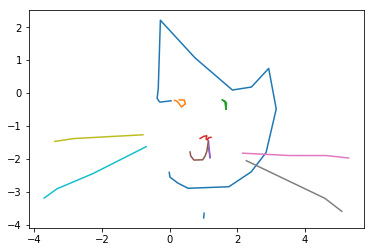

epoch 25601 in 0.176 s: loss = -0.3553, LR = -0.3861, LKL = 0.0308
epoch 25602 in 0.173 s: loss = -0.3992, LR = -0.4301, LKL = 0.0309
epoch 25603 in 0.175 s: loss = -0.3597, LR = -0.3907, LKL = 0.0310
epoch 25604 in 0.177 s: loss = -0.3642, LR = -0.3948, LKL = 0.0306
epoch 25605 in 0.176 s: loss = -0.3354, LR = -0.3663, LKL = 0.0309
epoch 25606 in 0.176 s: loss = -0.3814, LR = -0.4121, LKL = 0.0307
epoch 25607 in 0.178 s: loss = -0.4537, LR = -0.4846, LKL = 0.0310
epoch 25608 in 0.176 s: loss = -0.4100, LR = -0.4409, LKL = 0.0309
epoch 25609 in 0.178 s: loss = -0.3968, LR = -0.4276, LKL = 0.0309
epoch 25610 in 0.175 s: loss = -0.4141, LR = -0.4450, LKL = 0.0309
epoch 25611 in 0.177 s: loss = -0.3351, LR = -0.3659, LKL = 0.0308
epoch 25612 in 0.174 s: loss = -0.3995, LR = -0.4304, LKL = 0.0309
epoch 25613 in 0.179 s: loss = -0.3517, LR = -0.3824, LKL = 0.0307
epoch 25614 in 0.169 s: loss = -0.3905, LR = -0.4214, LKL = 0.0309
epoch 25615 in 0.176 s: loss = -0.4004, LR = -0.4311, LKL = 0.

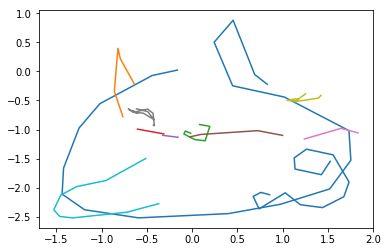

epoch 25701 in 0.176 s: loss = -0.4372, LR = -0.4681, LKL = 0.0310
epoch 25702 in 0.177 s: loss = -0.4311, LR = -0.4621, LKL = 0.0310
epoch 25703 in 0.176 s: loss = -0.4353, LR = -0.4662, LKL = 0.0310
epoch 25704 in 0.178 s: loss = -0.4024, LR = -0.4331, LKL = 0.0307
epoch 25705 in 0.175 s: loss = -0.3744, LR = -0.4050, LKL = 0.0305
epoch 25706 in 0.174 s: loss = -0.3564, LR = -0.3872, LKL = 0.0308
epoch 25707 in 0.174 s: loss = -0.4090, LR = -0.4401, LKL = 0.0310
epoch 25708 in 0.176 s: loss = -0.4106, LR = -0.4416, LKL = 0.0310
epoch 25709 in 0.176 s: loss = -0.4033, LR = -0.4342, LKL = 0.0309
epoch 25710 in 0.179 s: loss = -0.3459, LR = -0.3767, LKL = 0.0309
epoch 25711 in 0.177 s: loss = -0.3898, LR = -0.4207, LKL = 0.0309
epoch 25712 in 0.175 s: loss = -0.3479, LR = -0.3786, LKL = 0.0307
epoch 25713 in 0.175 s: loss = -0.4257, LR = -0.4566, LKL = 0.0309
epoch 25714 in 0.174 s: loss = -0.3533, LR = -0.3840, LKL = 0.0307
epoch 25715 in 0.175 s: loss = -0.3366, LR = -0.3674, LKL = 0.

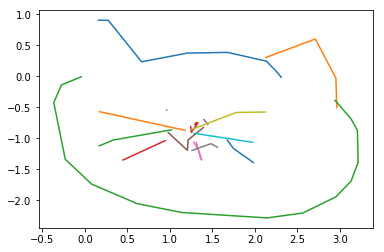

epoch 25801 in 0.175 s: loss = -0.3486, LR = -0.3794, LKL = 0.0308
epoch 25802 in 0.173 s: loss = -0.3488, LR = -0.3795, LKL = 0.0308
epoch 25803 in 0.177 s: loss = -0.4587, LR = -0.4898, LKL = 0.0312
epoch 25804 in 0.176 s: loss = -0.3878, LR = -0.4187, LKL = 0.0309
epoch 25805 in 0.177 s: loss = -0.4654, LR = -0.4967, LKL = 0.0313
epoch 25806 in 0.176 s: loss = -0.3797, LR = -0.4106, LKL = 0.0309
epoch 25807 in 0.178 s: loss = -0.4284, LR = -0.4593, LKL = 0.0309
epoch 25808 in 0.176 s: loss = -0.3863, LR = -0.4176, LKL = 0.0313
epoch 25809 in 0.180 s: loss = -0.4208, LR = -0.4518, LKL = 0.0310
epoch 25810 in 0.179 s: loss = -0.4369, LR = -0.4680, LKL = 0.0310
epoch 25811 in 0.177 s: loss = -0.4008, LR = -0.4317, LKL = 0.0309
epoch 25812 in 0.177 s: loss = -0.3543, LR = -0.3853, LKL = 0.0310
epoch 25813 in 0.178 s: loss = -0.4048, LR = -0.4359, LKL = 0.0311
epoch 25814 in 0.177 s: loss = -0.3864, LR = -0.4173, LKL = 0.0309
epoch 25815 in 0.176 s: loss = -0.4067, LR = -0.4375, LKL = 0.

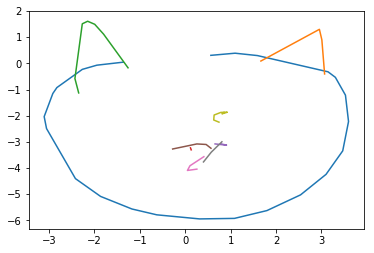

epoch 25901 in 0.174 s: loss = -0.3755, LR = -0.4067, LKL = 0.0312
epoch 25902 in 0.173 s: loss = -0.4097, LR = -0.4406, LKL = 0.0309
epoch 25903 in 0.175 s: loss = -0.3728, LR = -0.4040, LKL = 0.0312
epoch 25904 in 0.175 s: loss = -0.4274, LR = -0.4586, LKL = 0.0312
epoch 25905 in 0.179 s: loss = -0.4044, LR = -0.4355, LKL = 0.0310
epoch 25906 in 0.178 s: loss = -0.3728, LR = -0.4037, LKL = 0.0309
epoch 25907 in 0.176 s: loss = -0.3806, LR = -0.4118, LKL = 0.0311
epoch 25908 in 0.173 s: loss = -0.3847, LR = -0.4158, LKL = 0.0311
epoch 25909 in 0.173 s: loss = -0.4543, LR = -0.4854, LKL = 0.0311
epoch 25910 in 0.176 s: loss = -0.3519, LR = -0.3828, LKL = 0.0308
epoch 25911 in 0.177 s: loss = -0.4010, LR = -0.4319, LKL = 0.0310
epoch 25912 in 0.176 s: loss = -0.3803, LR = -0.4112, LKL = 0.0309
epoch 25913 in 0.175 s: loss = -0.3927, LR = -0.4237, LKL = 0.0311
epoch 25914 in 0.176 s: loss = -0.3991, LR = -0.4301, LKL = 0.0310
epoch 25915 in 0.177 s: loss = -0.3767, LR = -0.4077, LKL = 0.

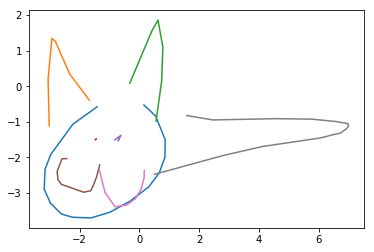

epoch 26001 in 0.174 s: loss = -0.3926, LR = -0.4237, LKL = 0.0311
epoch 26002 in 0.173 s: loss = -0.4244, LR = -0.4554, LKL = 0.0310
epoch 26003 in 0.174 s: loss = -0.3389, LR = -0.3700, LKL = 0.0311
epoch 26004 in 0.175 s: loss = -0.4181, LR = -0.4491, LKL = 0.0310
epoch 26005 in 0.178 s: loss = -0.4081, LR = -0.4393, LKL = 0.0312
epoch 26006 in 0.174 s: loss = -0.4269, LR = -0.4583, LKL = 0.0314
epoch 26007 in 0.176 s: loss = -0.3737, LR = -0.4046, LKL = 0.0309
epoch 26008 in 0.174 s: loss = -0.4250, LR = -0.4563, LKL = 0.0313
epoch 26009 in 0.175 s: loss = -0.3739, LR = -0.4048, LKL = 0.0309
epoch 26010 in 0.176 s: loss = -0.4097, LR = -0.4408, LKL = 0.0310
epoch 26011 in 0.175 s: loss = -0.3374, LR = -0.3682, LKL = 0.0308
epoch 26012 in 0.172 s: loss = -0.3375, LR = -0.3685, LKL = 0.0309
epoch 26013 in 0.175 s: loss = -0.3850, LR = -0.4160, LKL = 0.0311
epoch 26014 in 0.174 s: loss = -0.4386, LR = -0.4697, LKL = 0.0310
epoch 26015 in 0.178 s: loss = -0.3776, LR = -0.4087, LKL = 0.

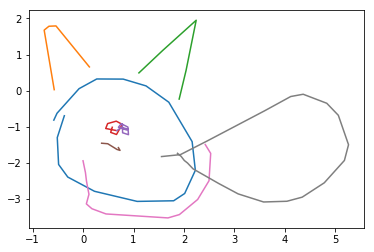

epoch 26101 in 0.175 s: loss = -0.4149, LR = -0.4460, LKL = 0.0311
epoch 26102 in 0.170 s: loss = -0.3482, LR = -0.3792, LKL = 0.0310
epoch 26103 in 0.174 s: loss = -0.3488, LR = -0.3799, LKL = 0.0311
epoch 26104 in 0.174 s: loss = -0.3680, LR = -0.3990, LKL = 0.0310
epoch 26105 in 0.178 s: loss = -0.3933, LR = -0.4244, LKL = 0.0311
epoch 26106 in 0.176 s: loss = -0.3074, LR = -0.3380, LKL = 0.0306
epoch 26107 in 0.176 s: loss = -0.4123, LR = -0.4434, LKL = 0.0311
epoch 26108 in 0.172 s: loss = -0.3657, LR = -0.3968, LKL = 0.0311
epoch 26109 in 0.174 s: loss = -0.3429, LR = -0.3740, LKL = 0.0311
epoch 26110 in 0.174 s: loss = -0.3573, LR = -0.3883, LKL = 0.0309
epoch 26111 in 0.176 s: loss = -0.3537, LR = -0.3846, LKL = 0.0309
epoch 26112 in 0.175 s: loss = -0.4022, LR = -0.4333, LKL = 0.0311
epoch 26113 in 0.173 s: loss = -0.3713, LR = -0.4023, LKL = 0.0311
epoch 26114 in 0.170 s: loss = -0.3764, LR = -0.4075, LKL = 0.0311
epoch 26115 in 0.176 s: loss = -0.3615, LR = -0.3926, LKL = 0.

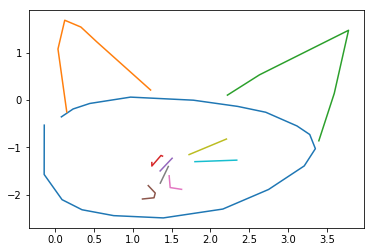

epoch 26201 in 0.173 s: loss = -0.4395, LR = -0.4706, LKL = 0.0311
epoch 26202 in 0.176 s: loss = -0.3576, LR = -0.3886, LKL = 0.0310
epoch 26203 in 0.176 s: loss = -0.3392, LR = -0.3702, LKL = 0.0310
epoch 26204 in 0.175 s: loss = -0.4018, LR = -0.4327, LKL = 0.0309
epoch 26205 in 0.176 s: loss = -0.3888, LR = -0.4198, LKL = 0.0310
epoch 26206 in 0.173 s: loss = -0.3525, LR = -0.3835, LKL = 0.0310
epoch 26207 in 0.173 s: loss = -0.3750, LR = -0.4059, LKL = 0.0309
epoch 26208 in 0.175 s: loss = -0.3888, LR = -0.4198, LKL = 0.0310
epoch 26209 in 0.177 s: loss = -0.3314, LR = -0.3624, LKL = 0.0310
epoch 26210 in 0.176 s: loss = -0.3180, LR = -0.3490, LKL = 0.0310
epoch 26211 in 0.174 s: loss = -0.3867, LR = -0.4178, LKL = 0.0311
epoch 26212 in 0.172 s: loss = -0.4798, LR = -0.5111, LKL = 0.0312
epoch 26213 in 0.176 s: loss = -0.3501, LR = -0.3813, LKL = 0.0312
epoch 26214 in 0.176 s: loss = -0.3744, LR = -0.4055, LKL = 0.0311
epoch 26215 in 0.176 s: loss = -0.4082, LR = -0.4392, LKL = 0.

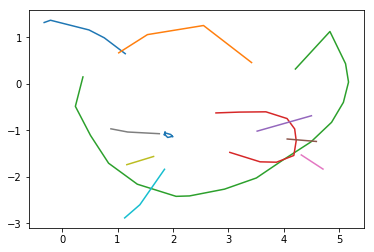

epoch 26301 in 0.176 s: loss = -0.4799, LR = -0.5112, LKL = 0.0313
epoch 26302 in 0.177 s: loss = -0.3309, LR = -0.3618, LKL = 0.0309
epoch 26303 in 0.175 s: loss = -0.3483, LR = -0.3792, LKL = 0.0309
epoch 26304 in 0.174 s: loss = -0.4130, LR = -0.4441, LKL = 0.0311
epoch 26305 in 0.178 s: loss = -0.4448, LR = -0.4761, LKL = 0.0313
epoch 26306 in 0.177 s: loss = -0.3884, LR = -0.4196, LKL = 0.0312
epoch 26307 in 0.178 s: loss = -0.4140, LR = -0.4449, LKL = 0.0309
epoch 26308 in 0.175 s: loss = -0.3484, LR = -0.3793, LKL = 0.0309
epoch 26309 in 0.177 s: loss = -0.3435, LR = -0.3746, LKL = 0.0311
epoch 26310 in 0.177 s: loss = -0.3719, LR = -0.4033, LKL = 0.0314
epoch 26311 in 0.180 s: loss = -0.4571, LR = -0.4882, LKL = 0.0312
epoch 26312 in 0.177 s: loss = -0.4135, LR = -0.4446, LKL = 0.0311
epoch 26313 in 0.180 s: loss = -0.4191, LR = -0.4504, LKL = 0.0313
epoch 26314 in 0.176 s: loss = -0.4000, LR = -0.4310, LKL = 0.0310
epoch 26315 in 0.177 s: loss = -0.3706, LR = -0.4016, LKL = 0.

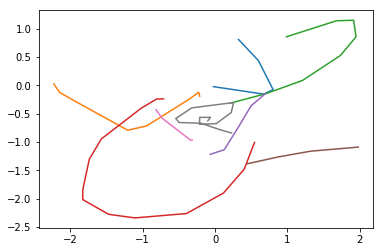

epoch 26401 in 0.178 s: loss = -0.4302, LR = -0.4613, LKL = 0.0311
epoch 26402 in 0.170 s: loss = -0.4090, LR = -0.4402, LKL = 0.0312
epoch 26403 in 0.176 s: loss = -0.4367, LR = -0.4681, LKL = 0.0315
epoch 26404 in 0.173 s: loss = -0.3856, LR = -0.4166, LKL = 0.0309
epoch 26405 in 0.180 s: loss = -0.3528, LR = -0.3838, LKL = 0.0310
epoch 26406 in 0.175 s: loss = -0.4362, LR = -0.4675, LKL = 0.0313
epoch 26407 in 0.175 s: loss = -0.3668, LR = -0.3980, LKL = 0.0312
epoch 26408 in 0.173 s: loss = -0.3903, LR = -0.4214, LKL = 0.0311
epoch 26409 in 0.172 s: loss = -0.4437, LR = -0.4748, LKL = 0.0311
epoch 26410 in 0.167 s: loss = -0.3772, LR = -0.4085, LKL = 0.0313
epoch 26411 in 0.179 s: loss = -0.3417, LR = -0.3727, LKL = 0.0311
epoch 26412 in 0.175 s: loss = -0.4285, LR = -0.4595, LKL = 0.0310
epoch 26413 in 0.176 s: loss = -0.4717, LR = -0.5029, LKL = 0.0312
epoch 26414 in 0.173 s: loss = -0.3997, LR = -0.4308, LKL = 0.0310
epoch 26415 in 0.180 s: loss = -0.4353, LR = -0.4665, LKL = 0.

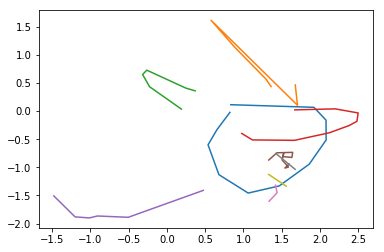

epoch 26501 in 0.174 s: loss = -0.3365, LR = -0.3675, LKL = 0.0310
epoch 26502 in 0.174 s: loss = -0.4464, LR = -0.4776, LKL = 0.0312
epoch 26503 in 0.173 s: loss = -0.3680, LR = -0.3992, LKL = 0.0312
epoch 26504 in 0.173 s: loss = -0.3580, LR = -0.3892, LKL = 0.0311
epoch 26505 in 0.175 s: loss = -0.4345, LR = -0.4658, LKL = 0.0312
epoch 26506 in 0.174 s: loss = -0.4141, LR = -0.4452, LKL = 0.0311
epoch 26507 in 0.177 s: loss = -0.3955, LR = -0.4266, LKL = 0.0311
epoch 26508 in 0.177 s: loss = -0.4261, LR = -0.4574, LKL = 0.0314
epoch 26509 in 0.176 s: loss = -0.4021, LR = -0.4334, LKL = 0.0313
epoch 26510 in 0.178 s: loss = -0.3717, LR = -0.4030, LKL = 0.0313
epoch 26511 in 0.176 s: loss = -0.4075, LR = -0.4386, LKL = 0.0311
epoch 26512 in 0.176 s: loss = -0.4114, LR = -0.4426, LKL = 0.0312
epoch 26513 in 0.177 s: loss = -0.3747, LR = -0.4059, LKL = 0.0312
epoch 26514 in 0.175 s: loss = -0.4250, LR = -0.4563, LKL = 0.0313
epoch 26515 in 0.176 s: loss = -0.4012, LR = -0.4324, LKL = 0.

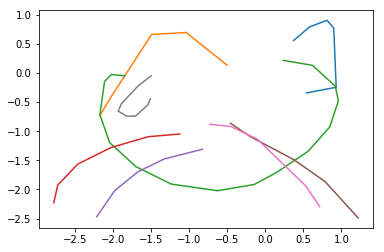

epoch 26601 in 0.175 s: loss = -0.3597, LR = -0.3908, LKL = 0.0311
epoch 26602 in 0.176 s: loss = -0.4032, LR = -0.4344, LKL = 0.0312
epoch 26603 in 0.176 s: loss = -0.4069, LR = -0.4381, LKL = 0.0312
epoch 26604 in 0.177 s: loss = -0.4324, LR = -0.4637, LKL = 0.0313
epoch 26605 in 0.174 s: loss = -0.4328, LR = -0.4642, LKL = 0.0313
epoch 26606 in 0.172 s: loss = -0.3860, LR = -0.4172, LKL = 0.0312
epoch 26607 in 0.170 s: loss = -0.4048, LR = -0.4361, LKL = 0.0313
epoch 26608 in 0.176 s: loss = -0.4090, LR = -0.4402, LKL = 0.0313
epoch 26609 in 0.177 s: loss = -0.3466, LR = -0.3778, LKL = 0.0312
epoch 26610 in 0.175 s: loss = -0.4102, LR = -0.4415, LKL = 0.0314
epoch 26611 in 0.178 s: loss = -0.3349, LR = -0.3660, LKL = 0.0311
epoch 26612 in 0.178 s: loss = -0.3314, LR = -0.3626, LKL = 0.0312
epoch 26613 in 0.175 s: loss = -0.4103, LR = -0.4416, LKL = 0.0313
epoch 26614 in 0.177 s: loss = -0.3674, LR = -0.3984, LKL = 0.0310
epoch 26615 in 0.176 s: loss = -0.3755, LR = -0.4069, LKL = 0.

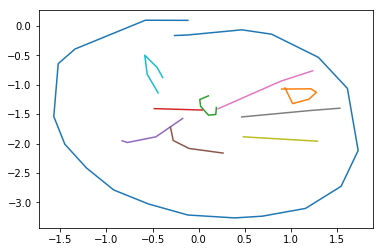

epoch 26701 in 0.174 s: loss = -0.4549, LR = -0.4863, LKL = 0.0314
epoch 26702 in 0.180 s: loss = -0.4254, LR = -0.4568, LKL = 0.0314
epoch 26703 in 0.177 s: loss = -0.4143, LR = -0.4457, LKL = 0.0314
epoch 26704 in 0.173 s: loss = -0.3319, LR = -0.3631, LKL = 0.0311
epoch 26705 in 0.176 s: loss = -0.3264, LR = -0.3576, LKL = 0.0312
epoch 26706 in 0.178 s: loss = -0.3865, LR = -0.4177, LKL = 0.0312
epoch 26707 in 0.177 s: loss = -0.3757, LR = -0.4069, LKL = 0.0312
epoch 26708 in 0.176 s: loss = -0.3462, LR = -0.3774, LKL = 0.0312
epoch 26709 in 0.178 s: loss = -0.3658, LR = -0.3972, LKL = 0.0314
epoch 26710 in 0.176 s: loss = -0.4532, LR = -0.4847, LKL = 0.0315
epoch 26711 in 0.176 s: loss = -0.3577, LR = -0.3888, LKL = 0.0312
epoch 26712 in 0.176 s: loss = -0.4159, LR = -0.4471, LKL = 0.0312
epoch 26713 in 0.177 s: loss = -0.4085, LR = -0.4398, LKL = 0.0314
epoch 26714 in 0.171 s: loss = -0.4596, LR = -0.4912, LKL = 0.0315
epoch 26715 in 0.175 s: loss = -0.4422, LR = -0.4736, LKL = 0.

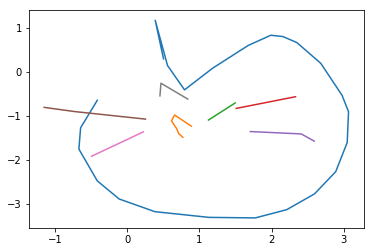

epoch 26801 in 0.174 s: loss = -0.4095, LR = -0.4410, LKL = 0.0316
epoch 26802 in 0.173 s: loss = -0.4046, LR = -0.4358, LKL = 0.0312
epoch 26803 in 0.174 s: loss = -0.4476, LR = -0.4790, LKL = 0.0314
epoch 26804 in 0.174 s: loss = -0.3902, LR = -0.4214, LKL = 0.0312
epoch 26805 in 0.175 s: loss = -0.3793, LR = -0.4106, LKL = 0.0313
epoch 26806 in 0.172 s: loss = -0.3937, LR = -0.4251, LKL = 0.0314
epoch 26807 in 0.172 s: loss = -0.4323, LR = -0.4636, LKL = 0.0313
epoch 26808 in 0.174 s: loss = -0.3760, LR = -0.4074, LKL = 0.0313
epoch 26809 in 0.177 s: loss = -0.4351, LR = -0.4664, LKL = 0.0314
epoch 26810 in 0.176 s: loss = -0.3596, LR = -0.3908, LKL = 0.0312
epoch 26811 in 0.178 s: loss = -0.3319, LR = -0.3630, LKL = 0.0311
epoch 26812 in 0.174 s: loss = -0.4041, LR = -0.4354, LKL = 0.0313
epoch 26813 in 0.177 s: loss = -0.3640, LR = -0.3952, LKL = 0.0313
epoch 26814 in 0.174 s: loss = -0.4099, LR = -0.4415, LKL = 0.0316
epoch 26815 in 0.177 s: loss = -0.3705, LR = -0.4019, LKL = 0.

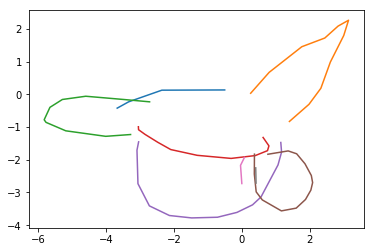

epoch 26901 in 0.174 s: loss = -0.3871, LR = -0.4182, LKL = 0.0311
epoch 26902 in 0.172 s: loss = -0.3738, LR = -0.4050, LKL = 0.0312
epoch 26903 in 0.172 s: loss = -0.3561, LR = -0.3874, LKL = 0.0313
epoch 26904 in 0.174 s: loss = -0.4314, LR = -0.4629, LKL = 0.0315
epoch 26905 in 0.176 s: loss = -0.3881, LR = -0.4193, LKL = 0.0312
epoch 26906 in 0.174 s: loss = -0.4063, LR = -0.4377, LKL = 0.0314
epoch 26907 in 0.172 s: loss = -0.3781, LR = -0.4095, LKL = 0.0314
epoch 26908 in 0.178 s: loss = -0.3903, LR = -0.4215, LKL = 0.0312
epoch 26909 in 0.172 s: loss = -0.3791, LR = -0.4104, LKL = 0.0313
epoch 26910 in 0.174 s: loss = -0.3701, LR = -0.4013, LKL = 0.0312
epoch 26911 in 0.175 s: loss = -0.3514, LR = -0.3827, LKL = 0.0313
epoch 26912 in 0.174 s: loss = -0.4026, LR = -0.4341, LKL = 0.0315
epoch 26913 in 0.179 s: loss = -0.4495, LR = -0.4808, LKL = 0.0313
epoch 26914 in 0.176 s: loss = -0.3632, LR = -0.3944, LKL = 0.0312
epoch 26915 in 0.177 s: loss = -0.4078, LR = -0.4392, LKL = 0.

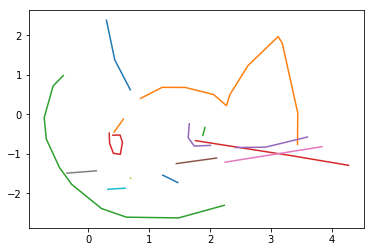

epoch 27001 in 0.175 s: loss = -0.3687, LR = -0.4002, LKL = 0.0315
epoch 27002 in 0.173 s: loss = -0.3674, LR = -0.3987, LKL = 0.0313
epoch 27003 in 0.177 s: loss = -0.3226, LR = -0.3535, LKL = 0.0309
epoch 27004 in 0.173 s: loss = -0.4139, LR = -0.4450, LKL = 0.0311
epoch 27005 in 0.173 s: loss = -0.4585, LR = -0.4899, LKL = 0.0314
epoch 27006 in 0.175 s: loss = -0.4897, LR = -0.5212, LKL = 0.0315
epoch 27007 in 0.176 s: loss = -0.4873, LR = -0.5187, LKL = 0.0314
epoch 27008 in 0.176 s: loss = -0.4253, LR = -0.4566, LKL = 0.0313
epoch 27009 in 0.174 s: loss = -0.4421, LR = -0.4737, LKL = 0.0315
epoch 27010 in 0.178 s: loss = -0.3627, LR = -0.3940, LKL = 0.0313
epoch 27011 in 0.173 s: loss = -0.3876, LR = -0.4190, LKL = 0.0314
epoch 27012 in 0.170 s: loss = -0.3794, LR = -0.4107, LKL = 0.0313
epoch 27013 in 0.177 s: loss = -0.3867, LR = -0.4182, LKL = 0.0315
epoch 27014 in 0.176 s: loss = -0.3800, LR = -0.4112, LKL = 0.0311
epoch 27015 in 0.174 s: loss = -0.3907, LR = -0.4221, LKL = 0.

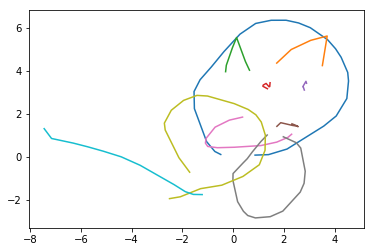

epoch 27101 in 0.177 s: loss = -0.3258, LR = -0.3571, LKL = 0.0313
epoch 27102 in 0.174 s: loss = -0.4129, LR = -0.4444, LKL = 0.0315
epoch 27103 in 0.181 s: loss = -0.3940, LR = -0.4255, LKL = 0.0314
epoch 27104 in 0.176 s: loss = -0.3649, LR = -0.3964, LKL = 0.0314
epoch 27105 in 0.174 s: loss = -0.3628, LR = -0.3940, LKL = 0.0312
epoch 27106 in 0.175 s: loss = -0.3634, LR = -0.3946, LKL = 0.0312
epoch 27107 in 0.172 s: loss = -0.3234, LR = -0.3546, LKL = 0.0312
epoch 27108 in 0.174 s: loss = -0.4029, LR = -0.4343, LKL = 0.0314
epoch 27109 in 0.176 s: loss = -0.3450, LR = -0.3762, LKL = 0.0312
epoch 27110 in 0.171 s: loss = -0.3302, LR = -0.3616, LKL = 0.0314
epoch 27111 in 0.176 s: loss = -0.3977, LR = -0.4291, LKL = 0.0313
epoch 27112 in 0.176 s: loss = -0.4600, LR = -0.4918, LKL = 0.0318
epoch 27113 in 0.178 s: loss = -0.4176, LR = -0.4491, LKL = 0.0315
epoch 27114 in 0.174 s: loss = -0.4041, LR = -0.4355, LKL = 0.0314
epoch 27115 in 0.174 s: loss = -0.4336, LR = -0.4651, LKL = 0.

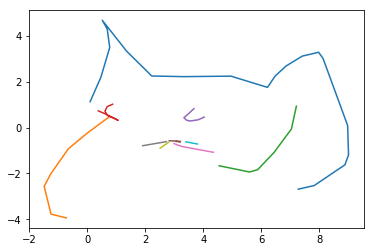

epoch 27201 in 0.173 s: loss = -0.4616, LR = -0.4930, LKL = 0.0314
epoch 27202 in 0.173 s: loss = -0.3506, LR = -0.3819, LKL = 0.0313
epoch 27203 in 0.173 s: loss = -0.4163, LR = -0.4477, LKL = 0.0314
epoch 27204 in 0.174 s: loss = -0.3649, LR = -0.3963, LKL = 0.0314
epoch 27205 in 0.173 s: loss = -0.3969, LR = -0.4283, LKL = 0.0314
epoch 27206 in 0.173 s: loss = -0.3353, LR = -0.3666, LKL = 0.0314
epoch 27207 in 0.175 s: loss = -0.3602, LR = -0.3915, LKL = 0.0313
epoch 27208 in 0.175 s: loss = -0.4036, LR = -0.4350, LKL = 0.0313
epoch 27209 in 0.174 s: loss = -0.4650, LR = -0.4964, LKL = 0.0314
epoch 27210 in 0.173 s: loss = -0.2858, LR = -0.3168, LKL = 0.0310
epoch 27211 in 0.173 s: loss = -0.4418, LR = -0.4732, LKL = 0.0314
epoch 27212 in 0.173 s: loss = -0.2975, LR = -0.3287, LKL = 0.0312
epoch 27213 in 0.175 s: loss = -0.4217, LR = -0.4531, LKL = 0.0314
epoch 27214 in 0.173 s: loss = -0.3615, LR = -0.3929, LKL = 0.0313
epoch 27215 in 0.171 s: loss = -0.4770, LR = -0.5085, LKL = 0.

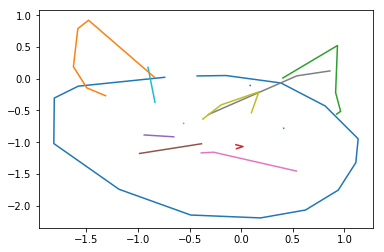

epoch 27301 in 0.175 s: loss = -0.3878, LR = -0.4192, LKL = 0.0314
epoch 27302 in 0.175 s: loss = -0.3824, LR = -0.4138, LKL = 0.0314
epoch 27303 in 0.172 s: loss = -0.4003, LR = -0.4318, LKL = 0.0314
epoch 27304 in 0.171 s: loss = -0.4006, LR = -0.4320, LKL = 0.0315
epoch 27305 in 0.177 s: loss = -0.2817, LR = -0.3130, LKL = 0.0314
epoch 27306 in 0.171 s: loss = -0.3903, LR = -0.4215, LKL = 0.0313
epoch 27307 in 0.173 s: loss = -0.4125, LR = -0.4441, LKL = 0.0316
epoch 27308 in 0.173 s: loss = -0.4096, LR = -0.4412, LKL = 0.0316
epoch 27309 in 0.175 s: loss = -0.3932, LR = -0.4245, LKL = 0.0314
epoch 27310 in 0.173 s: loss = -0.3501, LR = -0.3813, LKL = 0.0313
epoch 27311 in 0.172 s: loss = -0.4137, LR = -0.4453, LKL = 0.0315
epoch 27312 in 0.175 s: loss = -0.3466, LR = -0.3780, LKL = 0.0314
epoch 27313 in 0.173 s: loss = -0.4034, LR = -0.4347, LKL = 0.0313
epoch 27314 in 0.175 s: loss = -0.3906, LR = -0.4220, LKL = 0.0314
epoch 27315 in 0.175 s: loss = -0.3821, LR = -0.4134, LKL = 0.

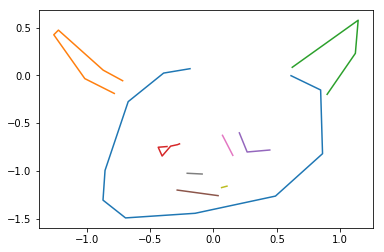

epoch 27401 in 0.177 s: loss = -0.3811, LR = -0.4125, LKL = 0.0314
epoch 27402 in 0.172 s: loss = -0.4032, LR = -0.4347, LKL = 0.0314
epoch 27403 in 0.174 s: loss = -0.3701, LR = -0.4016, LKL = 0.0315
epoch 27404 in 0.176 s: loss = -0.3078, LR = -0.3391, LKL = 0.0313
epoch 27405 in 0.179 s: loss = -0.3400, LR = -0.3715, LKL = 0.0315
epoch 27406 in 0.175 s: loss = -0.4328, LR = -0.4642, LKL = 0.0315
epoch 27407 in 0.177 s: loss = -0.3920, LR = -0.4236, LKL = 0.0316
epoch 27408 in 0.174 s: loss = -0.4188, LR = -0.4504, LKL = 0.0316
epoch 27409 in 0.177 s: loss = -0.3509, LR = -0.3823, LKL = 0.0314
epoch 27410 in 0.173 s: loss = -0.4482, LR = -0.4798, LKL = 0.0316
epoch 27411 in 0.177 s: loss = -0.3440, LR = -0.3755, LKL = 0.0314
epoch 27412 in 0.177 s: loss = -0.3504, LR = -0.3816, LKL = 0.0313
epoch 27413 in 0.178 s: loss = -0.4243, LR = -0.4559, LKL = 0.0315
epoch 27414 in 0.177 s: loss = -0.4253, LR = -0.4567, LKL = 0.0314
epoch 27415 in 0.178 s: loss = -0.4119, LR = -0.4432, LKL = 0.

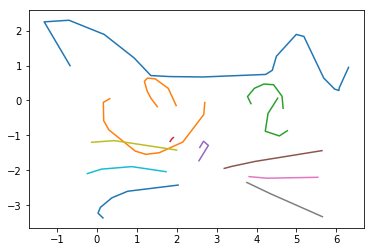

epoch 27501 in 0.177 s: loss = -0.4247, LR = -0.4563, LKL = 0.0316
epoch 27502 in 0.175 s: loss = -0.4508, LR = -0.4824, LKL = 0.0315
epoch 27503 in 0.178 s: loss = -0.4355, LR = -0.4673, LKL = 0.0318
epoch 27504 in 0.173 s: loss = -0.4559, LR = -0.4875, LKL = 0.0316
epoch 27505 in 0.174 s: loss = -0.4383, LR = -0.4697, LKL = 0.0314
epoch 27506 in 0.178 s: loss = -0.3233, LR = -0.3548, LKL = 0.0315
epoch 27507 in 0.176 s: loss = -0.4181, LR = -0.4494, LKL = 0.0313
epoch 27508 in 0.175 s: loss = -0.3369, LR = -0.3682, LKL = 0.0313
epoch 27509 in 0.177 s: loss = -0.4559, LR = -0.4874, LKL = 0.0315
epoch 27510 in 0.173 s: loss = -0.4054, LR = -0.4368, LKL = 0.0315
epoch 27511 in 0.174 s: loss = -0.4426, LR = -0.4742, LKL = 0.0315
epoch 27512 in 0.173 s: loss = -0.4335, LR = -0.4652, LKL = 0.0316
epoch 27513 in 0.176 s: loss = -0.4137, LR = -0.4451, LKL = 0.0314
epoch 27514 in 0.173 s: loss = -0.4270, LR = -0.4582, LKL = 0.0312
epoch 27515 in 0.173 s: loss = -0.4142, LR = -0.4457, LKL = 0.

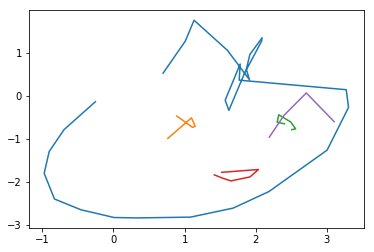

epoch 27601 in 0.175 s: loss = -0.3802, LR = -0.4115, LKL = 0.0313
epoch 27602 in 0.174 s: loss = -0.4773, LR = -0.5088, LKL = 0.0315
epoch 27603 in 0.174 s: loss = -0.4467, LR = -0.4783, LKL = 0.0315
epoch 27604 in 0.171 s: loss = -0.3810, LR = -0.4123, LKL = 0.0313
epoch 27605 in 0.171 s: loss = -0.3831, LR = -0.4146, LKL = 0.0315
epoch 27606 in 0.175 s: loss = -0.3757, LR = -0.4071, LKL = 0.0314
epoch 27607 in 0.174 s: loss = -0.3205, LR = -0.3519, LKL = 0.0314
epoch 27608 in 0.172 s: loss = -0.3971, LR = -0.4286, LKL = 0.0315
epoch 27609 in 0.174 s: loss = -0.4184, LR = -0.4500, LKL = 0.0316
epoch 27610 in 0.174 s: loss = -0.4396, LR = -0.4712, LKL = 0.0315
epoch 27611 in 0.178 s: loss = -0.4699, LR = -0.5014, LKL = 0.0315
epoch 27612 in 0.173 s: loss = -0.4366, LR = -0.4681, LKL = 0.0315
epoch 27613 in 0.174 s: loss = -0.4339, LR = -0.4653, LKL = 0.0315
epoch 27614 in 0.175 s: loss = -0.3881, LR = -0.4193, LKL = 0.0311
epoch 27615 in 0.176 s: loss = -0.3671, LR = -0.3984, LKL = 0.

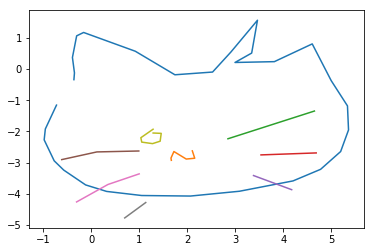

epoch 27701 in 0.177 s: loss = -0.3632, LR = -0.3947, LKL = 0.0316
epoch 27702 in 0.173 s: loss = -0.4144, LR = -0.4457, LKL = 0.0313
epoch 27703 in 0.178 s: loss = -0.4625, LR = -0.4939, LKL = 0.0314
epoch 27704 in 0.172 s: loss = -0.4148, LR = -0.4464, LKL = 0.0316
epoch 27705 in 0.174 s: loss = -0.3949, LR = -0.4263, LKL = 0.0314
epoch 27706 in 0.171 s: loss = -0.4378, LR = -0.4692, LKL = 0.0314
epoch 27707 in 0.176 s: loss = -0.4154, LR = -0.4469, LKL = 0.0315
epoch 27708 in 0.171 s: loss = -0.3974, LR = -0.4287, LKL = 0.0314
epoch 27709 in 0.173 s: loss = -0.3677, LR = -0.3991, LKL = 0.0314
epoch 27710 in 0.176 s: loss = -0.4128, LR = -0.4444, LKL = 0.0317
epoch 27711 in 0.176 s: loss = -0.4065, LR = -0.4379, LKL = 0.0314
epoch 27712 in 0.171 s: loss = -0.4286, LR = -0.4599, LKL = 0.0313
epoch 27713 in 0.175 s: loss = -0.4488, LR = -0.4802, LKL = 0.0315
epoch 27714 in 0.173 s: loss = -0.4170, LR = -0.4483, LKL = 0.0314
epoch 27715 in 0.173 s: loss = -0.2576, LR = -0.2886, LKL = 0.

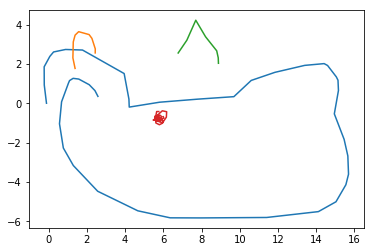

epoch 27801 in 0.176 s: loss = -0.3522, LR = -0.3836, LKL = 0.0314
epoch 27802 in 0.173 s: loss = -0.3476, LR = -0.3790, LKL = 0.0314
epoch 27803 in 0.174 s: loss = -0.4354, LR = -0.4670, LKL = 0.0316
epoch 27804 in 0.177 s: loss = -0.4313, LR = -0.4628, LKL = 0.0315
epoch 27805 in 0.176 s: loss = -0.3788, LR = -0.4102, LKL = 0.0314
epoch 27806 in 0.175 s: loss = -0.3917, LR = -0.4230, LKL = 0.0314
epoch 27807 in 0.179 s: loss = -0.4374, LR = -0.4691, LKL = 0.0317
epoch 27808 in 0.178 s: loss = -0.3756, LR = -0.4070, LKL = 0.0313
epoch 27809 in 0.178 s: loss = -0.3879, LR = -0.4194, LKL = 0.0315
epoch 27810 in 0.172 s: loss = -0.3345, LR = -0.3659, LKL = 0.0314
epoch 27811 in 0.178 s: loss = -0.3933, LR = -0.4248, LKL = 0.0315
epoch 27812 in 0.175 s: loss = -0.3958, LR = -0.4273, LKL = 0.0315
epoch 27813 in 0.177 s: loss = -0.4129, LR = -0.4444, LKL = 0.0315
epoch 27814 in 0.178 s: loss = -0.4409, LR = -0.4725, LKL = 0.0316
epoch 27815 in 0.176 s: loss = -0.3921, LR = -0.4238, LKL = 0.

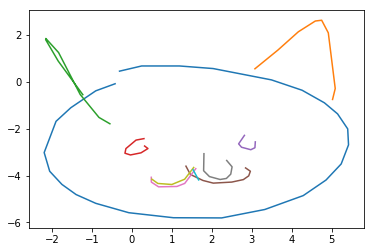

epoch 27901 in 0.173 s: loss = -0.3996, LR = -0.4311, LKL = 0.0315
epoch 27902 in 0.179 s: loss = -0.4312, LR = -0.4626, LKL = 0.0315
epoch 27903 in 0.174 s: loss = -0.3665, LR = -0.3980, LKL = 0.0315
epoch 27904 in 0.175 s: loss = -0.3619, LR = -0.3934, LKL = 0.0314
epoch 27905 in 0.176 s: loss = -0.4156, LR = -0.4472, LKL = 0.0316
epoch 27906 in 0.175 s: loss = -0.3276, LR = -0.3588, LKL = 0.0312
epoch 27907 in 0.175 s: loss = -0.4604, LR = -0.4919, LKL = 0.0314
epoch 27908 in 0.174 s: loss = -0.3502, LR = -0.3813, LKL = 0.0312
epoch 27909 in 0.171 s: loss = -0.3539, LR = -0.3852, LKL = 0.0313
epoch 27910 in 0.174 s: loss = -0.3454, LR = -0.3767, LKL = 0.0313
epoch 27911 in 0.175 s: loss = -0.4119, LR = -0.4434, LKL = 0.0315
epoch 27912 in 0.175 s: loss = -0.4496, LR = -0.4812, LKL = 0.0316
epoch 27913 in 0.174 s: loss = -0.4165, LR = -0.4481, LKL = 0.0315
epoch 27914 in 0.175 s: loss = -0.3791, LR = -0.4105, LKL = 0.0314
epoch 27915 in 0.176 s: loss = -0.4444, LR = -0.4759, LKL = 0.

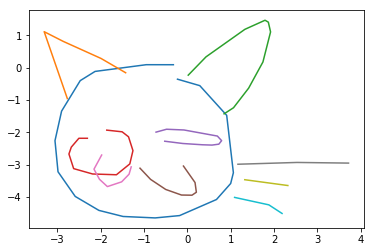

epoch 28001 in 0.178 s: loss = -0.4578, LR = -0.4895, LKL = 0.0317
epoch 28002 in 0.175 s: loss = -0.4127, LR = -0.4442, LKL = 0.0314
epoch 28003 in 0.174 s: loss = -0.4188, LR = -0.4504, LKL = 0.0315
epoch 28004 in 0.177 s: loss = -0.4601, LR = -0.4917, LKL = 0.0316
epoch 28005 in 0.178 s: loss = -0.3862, LR = -0.4176, LKL = 0.0314
epoch 28006 in 0.177 s: loss = -0.3742, LR = -0.4057, LKL = 0.0315
epoch 28007 in 0.179 s: loss = -0.4200, LR = -0.4516, LKL = 0.0316
epoch 28008 in 0.174 s: loss = -0.4200, LR = -0.4517, LKL = 0.0317
epoch 28009 in 0.173 s: loss = -0.4623, LR = -0.4939, LKL = 0.0316
epoch 28010 in 0.175 s: loss = -0.3913, LR = -0.4229, LKL = 0.0316
epoch 28011 in 0.180 s: loss = -0.3756, LR = -0.4072, LKL = 0.0316
epoch 28012 in 0.177 s: loss = -0.4261, LR = -0.4576, LKL = 0.0315
epoch 28013 in 0.177 s: loss = -0.4446, LR = -0.4765, LKL = 0.0319
epoch 28014 in 0.175 s: loss = -0.3293, LR = -0.3608, LKL = 0.0315
epoch 28015 in 0.178 s: loss = -0.3625, LR = -0.3938, LKL = 0.

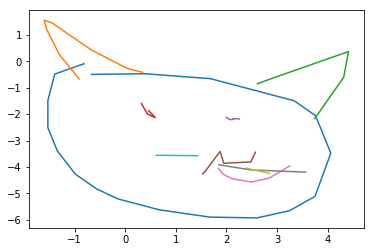

epoch 28101 in 0.175 s: loss = -0.3833, LR = -0.4149, LKL = 0.0316
epoch 28102 in 0.173 s: loss = -0.4561, LR = -0.4878, LKL = 0.0317
epoch 28103 in 0.173 s: loss = -0.3986, LR = -0.4302, LKL = 0.0316
epoch 28104 in 0.170 s: loss = -0.4126, LR = -0.4443, LKL = 0.0317
epoch 28105 in 0.178 s: loss = -0.4244, LR = -0.4557, LKL = 0.0313
epoch 28106 in 0.171 s: loss = -0.3688, LR = -0.4004, LKL = 0.0316
epoch 28107 in 0.175 s: loss = -0.3608, LR = -0.3924, LKL = 0.0315
epoch 28108 in 0.173 s: loss = -0.4099, LR = -0.4414, LKL = 0.0315
epoch 28109 in 0.175 s: loss = -0.4503, LR = -0.4820, LKL = 0.0317
epoch 28110 in 0.170 s: loss = -0.3501, LR = -0.3817, LKL = 0.0316
epoch 28111 in 0.176 s: loss = -0.3815, LR = -0.4129, LKL = 0.0314
epoch 28112 in 0.174 s: loss = -0.4289, LR = -0.4604, LKL = 0.0315
epoch 28113 in 0.174 s: loss = -0.4324, LR = -0.4640, LKL = 0.0316
epoch 28114 in 0.171 s: loss = -0.3879, LR = -0.4195, LKL = 0.0316
epoch 28115 in 0.177 s: loss = -0.4561, LR = -0.4875, LKL = 0.

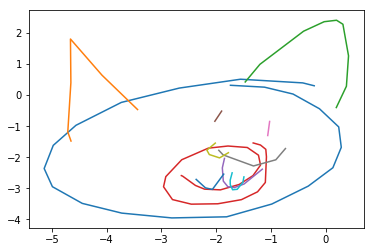

epoch 28201 in 0.174 s: loss = -0.3809, LR = -0.4124, LKL = 0.0315
epoch 28202 in 0.176 s: loss = -0.4867, LR = -0.5183, LKL = 0.0316
epoch 28203 in 0.176 s: loss = -0.4156, LR = -0.4472, LKL = 0.0316
epoch 28204 in 0.176 s: loss = -0.3978, LR = -0.4292, LKL = 0.0314
epoch 28205 in 0.176 s: loss = -0.4462, LR = -0.4779, LKL = 0.0317
epoch 28206 in 0.176 s: loss = -0.4293, LR = -0.4608, LKL = 0.0315
epoch 28207 in 0.173 s: loss = -0.4243, LR = -0.4559, LKL = 0.0317
epoch 28208 in 0.172 s: loss = -0.4158, LR = -0.4474, LKL = 0.0315
epoch 28209 in 0.178 s: loss = -0.3748, LR = -0.4064, LKL = 0.0316
epoch 28210 in 0.175 s: loss = -0.4310, LR = -0.4625, LKL = 0.0315
epoch 28211 in 0.176 s: loss = -0.4636, LR = -0.4953, LKL = 0.0317
epoch 28212 in 0.177 s: loss = -0.3795, LR = -0.4110, LKL = 0.0315
epoch 28213 in 0.175 s: loss = -0.4199, LR = -0.4517, LKL = 0.0317
epoch 28214 in 0.175 s: loss = -0.4223, LR = -0.4538, LKL = 0.0315
epoch 28215 in 0.177 s: loss = -0.3470, LR = -0.3785, LKL = 0.

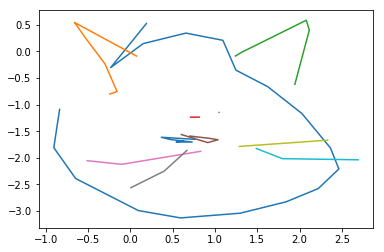

epoch 28301 in 0.177 s: loss = -0.3780, LR = -0.4095, LKL = 0.0315
epoch 28302 in 0.177 s: loss = -0.3749, LR = -0.4064, LKL = 0.0316
epoch 28303 in 0.179 s: loss = -0.3150, LR = -0.3463, LKL = 0.0313
epoch 28304 in 0.175 s: loss = -0.4382, LR = -0.4700, LKL = 0.0318
epoch 28305 in 0.178 s: loss = -0.3780, LR = -0.4096, LKL = 0.0316
epoch 28306 in 0.179 s: loss = -0.4373, LR = -0.4689, LKL = 0.0317
epoch 28307 in 0.174 s: loss = -0.4094, LR = -0.4409, LKL = 0.0315
epoch 28308 in 0.177 s: loss = -0.4448, LR = -0.4765, LKL = 0.0317
epoch 28309 in 0.174 s: loss = -0.3638, LR = -0.3952, LKL = 0.0314
epoch 28310 in 0.174 s: loss = -0.3777, LR = -0.4091, LKL = 0.0314
epoch 28311 in 0.174 s: loss = -0.4213, LR = -0.4529, LKL = 0.0316
epoch 28312 in 0.173 s: loss = -0.3650, LR = -0.3964, LKL = 0.0314
epoch 28313 in 0.174 s: loss = -0.4539, LR = -0.4857, LKL = 0.0318
epoch 28314 in 0.173 s: loss = -0.4454, LR = -0.4770, LKL = 0.0316
epoch 28315 in 0.176 s: loss = -0.4667, LR = -0.4984, LKL = 0.

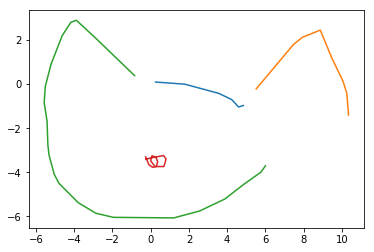

epoch 28401 in 0.176 s: loss = -0.4004, LR = -0.4322, LKL = 0.0317
epoch 28402 in 0.175 s: loss = -0.4178, LR = -0.4494, LKL = 0.0317
epoch 28403 in 0.176 s: loss = -0.4829, LR = -0.5145, LKL = 0.0317
epoch 28404 in 0.175 s: loss = -0.3716, LR = -0.4034, LKL = 0.0317
epoch 28405 in 0.181 s: loss = -0.4510, LR = -0.4828, LKL = 0.0318
epoch 28406 in 0.175 s: loss = -0.4616, LR = -0.4932, LKL = 0.0316
epoch 28407 in 0.174 s: loss = -0.4544, LR = -0.4862, LKL = 0.0318
epoch 28408 in 0.179 s: loss = -0.5069, LR = -0.5388, LKL = 0.0319
epoch 28409 in 0.179 s: loss = -0.4241, LR = -0.4557, LKL = 0.0316
epoch 28410 in 0.177 s: loss = -0.4314, LR = -0.4632, LKL = 0.0319
epoch 28411 in 0.175 s: loss = -0.4442, LR = -0.4759, LKL = 0.0318
epoch 28412 in 0.172 s: loss = -0.4415, LR = -0.4730, LKL = 0.0315
epoch 28413 in 0.175 s: loss = -0.3404, LR = -0.3720, LKL = 0.0316
epoch 28414 in 0.176 s: loss = -0.3308, LR = -0.3621, LKL = 0.0313
epoch 28415 in 0.182 s: loss = -0.3861, LR = -0.4178, LKL = 0.

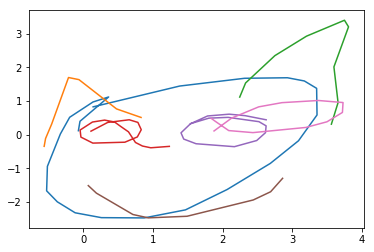

epoch 28501 in 0.176 s: loss = -0.4071, LR = -0.4385, LKL = 0.0314
epoch 28502 in 0.176 s: loss = -0.3955, LR = -0.4273, LKL = 0.0318
epoch 28503 in 0.177 s: loss = -0.3407, LR = -0.3723, LKL = 0.0316
epoch 28504 in 0.176 s: loss = -0.3536, LR = -0.3854, LKL = 0.0318
epoch 28505 in 0.176 s: loss = -0.4328, LR = -0.4644, LKL = 0.0316
epoch 28506 in 0.177 s: loss = -0.4070, LR = -0.4385, LKL = 0.0315
epoch 28507 in 0.180 s: loss = -0.4133, LR = -0.4450, LKL = 0.0317
epoch 28508 in 0.176 s: loss = -0.4635, LR = -0.4953, LKL = 0.0318
epoch 28509 in 0.172 s: loss = -0.4075, LR = -0.4391, LKL = 0.0316
epoch 28510 in 0.179 s: loss = -0.3924, LR = -0.4240, LKL = 0.0316
epoch 28511 in 0.174 s: loss = -0.4213, LR = -0.4529, LKL = 0.0315
epoch 28512 in 0.173 s: loss = -0.3939, LR = -0.4256, LKL = 0.0317
epoch 28513 in 0.175 s: loss = -0.4129, LR = -0.4448, LKL = 0.0318
epoch 28514 in 0.175 s: loss = -0.4372, LR = -0.4688, LKL = 0.0316
epoch 28515 in 0.178 s: loss = -0.4224, LR = -0.4540, LKL = 0.

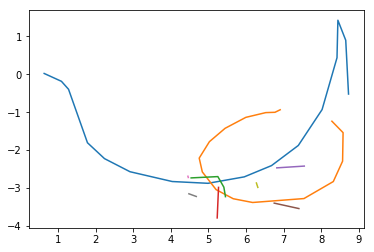

epoch 28601 in 0.177 s: loss = -0.4155, LR = -0.4474, LKL = 0.0318
epoch 28602 in 0.175 s: loss = -0.4080, LR = -0.4398, LKL = 0.0318
epoch 28603 in 0.178 s: loss = -0.3800, LR = -0.4117, LKL = 0.0317
epoch 28604 in 0.176 s: loss = -0.3741, LR = -0.4054, LKL = 0.0314
epoch 28605 in 0.178 s: loss = -0.4119, LR = -0.4436, LKL = 0.0317
epoch 28606 in 0.178 s: loss = -0.4149, LR = -0.4466, LKL = 0.0317
epoch 28607 in 0.175 s: loss = -0.3254, LR = -0.3571, LKL = 0.0316
epoch 28608 in 0.176 s: loss = -0.4008, LR = -0.4325, LKL = 0.0317
epoch 28609 in 0.177 s: loss = -0.4282, LR = -0.4600, LKL = 0.0319
epoch 28610 in 0.170 s: loss = -0.4259, LR = -0.4576, LKL = 0.0318
epoch 28611 in 0.178 s: loss = -0.3505, LR = -0.3821, LKL = 0.0316
epoch 28612 in 0.177 s: loss = -0.4404, LR = -0.4722, LKL = 0.0318
epoch 28613 in 0.177 s: loss = -0.3774, LR = -0.4091, LKL = 0.0317
epoch 28614 in 0.177 s: loss = -0.4038, LR = -0.4353, LKL = 0.0315
epoch 28615 in 0.176 s: loss = -0.4929, LR = -0.5251, LKL = 0.

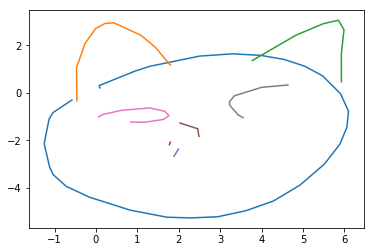

epoch 28701 in 0.174 s: loss = -0.3778, LR = -0.4094, LKL = 0.0316
epoch 28702 in 0.179 s: loss = -0.4281, LR = -0.4597, LKL = 0.0317
epoch 28703 in 0.173 s: loss = -0.3795, LR = -0.4112, LKL = 0.0317
epoch 28704 in 0.173 s: loss = -0.4531, LR = -0.4849, LKL = 0.0318
epoch 28705 in 0.181 s: loss = -0.3031, LR = -0.3349, LKL = 0.0318
epoch 28706 in 0.178 s: loss = -0.3215, LR = -0.3530, LKL = 0.0316
epoch 28707 in 0.178 s: loss = -0.3986, LR = -0.4304, LKL = 0.0318
epoch 28708 in 0.177 s: loss = -0.4223, LR = -0.4541, LKL = 0.0319
epoch 28709 in 0.175 s: loss = -0.3769, LR = -0.4086, LKL = 0.0317
epoch 28710 in 0.175 s: loss = -0.4021, LR = -0.4338, LKL = 0.0317
epoch 28711 in 0.174 s: loss = -0.3638, LR = -0.3954, LKL = 0.0316
epoch 28712 in 0.177 s: loss = -0.4096, LR = -0.4414, LKL = 0.0317
epoch 28713 in 0.173 s: loss = -0.3426, LR = -0.3743, LKL = 0.0317
epoch 28714 in 0.171 s: loss = -0.3450, LR = -0.3766, LKL = 0.0317
epoch 28715 in 0.177 s: loss = -0.4364, LR = -0.4682, LKL = 0.

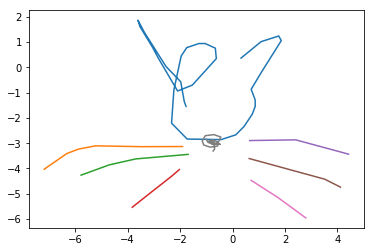

epoch 28801 in 0.172 s: loss = -0.3916, LR = -0.4233, LKL = 0.0317
epoch 28802 in 0.173 s: loss = -0.4279, LR = -0.4597, LKL = 0.0318
epoch 28803 in 0.174 s: loss = -0.4150, LR = -0.4469, LKL = 0.0319
epoch 28804 in 0.174 s: loss = -0.3990, LR = -0.4309, LKL = 0.0320
epoch 28805 in 0.174 s: loss = -0.3724, LR = -0.4043, LKL = 0.0319
epoch 28806 in 0.174 s: loss = -0.4049, LR = -0.4365, LKL = 0.0316
epoch 28807 in 0.172 s: loss = -0.4464, LR = -0.4785, LKL = 0.0321
epoch 28808 in 0.176 s: loss = -0.4071, LR = -0.4390, LKL = 0.0319
epoch 28809 in 0.173 s: loss = -0.3086, LR = -0.3403, LKL = 0.0317
epoch 28810 in 0.172 s: loss = -0.4449, LR = -0.4766, LKL = 0.0317
epoch 28811 in 0.172 s: loss = -0.4526, LR = -0.4845, LKL = 0.0319
epoch 28812 in 0.173 s: loss = -0.3654, LR = -0.3971, LKL = 0.0316
epoch 28813 in 0.173 s: loss = -0.4282, LR = -0.4600, LKL = 0.0318
epoch 28814 in 0.173 s: loss = -0.3557, LR = -0.3875, LKL = 0.0318
epoch 28815 in 0.172 s: loss = -0.4125, LR = -0.4442, LKL = 0.

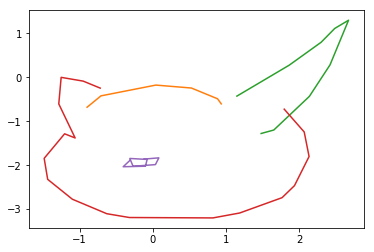

epoch 28901 in 0.175 s: loss = -0.4131, LR = -0.4450, LKL = 0.0319
epoch 28902 in 0.170 s: loss = -0.4250, LR = -0.4567, LKL = 0.0318
epoch 28903 in 0.173 s: loss = -0.3615, LR = -0.3935, LKL = 0.0319
epoch 28904 in 0.173 s: loss = -0.4627, LR = -0.4946, LKL = 0.0319
epoch 28905 in 0.174 s: loss = -0.4392, LR = -0.4710, LKL = 0.0318
epoch 28906 in 0.173 s: loss = -0.4366, LR = -0.4683, LKL = 0.0317
epoch 28907 in 0.176 s: loss = -0.4196, LR = -0.4513, LKL = 0.0317
epoch 28908 in 0.176 s: loss = -0.3711, LR = -0.4026, LKL = 0.0316
epoch 28909 in 0.172 s: loss = -0.3722, LR = -0.4039, LKL = 0.0317
epoch 28910 in 0.178 s: loss = -0.4459, LR = -0.4778, LKL = 0.0319
epoch 28911 in 0.175 s: loss = -0.4471, LR = -0.4791, LKL = 0.0320
epoch 28912 in 0.174 s: loss = -0.3724, LR = -0.4043, LKL = 0.0319
epoch 28913 in 0.173 s: loss = -0.3686, LR = -0.4004, LKL = 0.0318
epoch 28914 in 0.173 s: loss = -0.5078, LR = -0.5395, LKL = 0.0318
epoch 28915 in 0.174 s: loss = -0.4488, LR = -0.4806, LKL = 0.

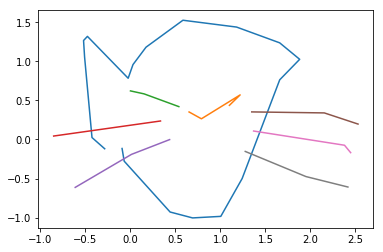

epoch 29001 in 0.175 s: loss = -0.4432, LR = -0.4752, LKL = 0.0320
epoch 29002 in 0.175 s: loss = -0.4222, LR = -0.4540, LKL = 0.0318
epoch 29003 in 0.175 s: loss = -0.4038, LR = -0.4358, LKL = 0.0319
epoch 29004 in 0.174 s: loss = -0.4499, LR = -0.4819, LKL = 0.0319
epoch 29005 in 0.178 s: loss = -0.4248, LR = -0.4568, LKL = 0.0320
epoch 29006 in 0.176 s: loss = -0.4431, LR = -0.4751, LKL = 0.0320
epoch 29007 in 0.176 s: loss = -0.4675, LR = -0.4996, LKL = 0.0321
epoch 29008 in 0.177 s: loss = -0.3908, LR = -0.4226, LKL = 0.0318
epoch 29009 in 0.176 s: loss = -0.4624, LR = -0.4943, LKL = 0.0320
epoch 29010 in 0.178 s: loss = -0.4416, LR = -0.4734, LKL = 0.0318
epoch 29011 in 0.171 s: loss = -0.4708, LR = -0.5027, LKL = 0.0318
epoch 29012 in 0.176 s: loss = -0.4239, LR = -0.4556, LKL = 0.0317
epoch 29013 in 0.176 s: loss = -0.4290, LR = -0.4610, LKL = 0.0320
epoch 29014 in 0.175 s: loss = -0.4355, LR = -0.4675, LKL = 0.0320
epoch 29015 in 0.179 s: loss = -0.3999, LR = -0.4317, LKL = 0.

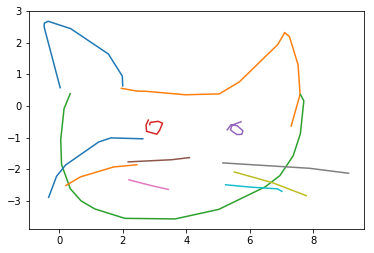

epoch 29101 in 0.179 s: loss = -0.3674, LR = -0.3992, LKL = 0.0319
epoch 29102 in 0.175 s: loss = -0.4114, LR = -0.4435, LKL = 0.0320
epoch 29103 in 0.175 s: loss = -0.3642, LR = -0.3961, LKL = 0.0319
epoch 29104 in 0.175 s: loss = -0.4350, LR = -0.4670, LKL = 0.0319
epoch 29105 in 0.176 s: loss = -0.4483, LR = -0.4804, LKL = 0.0321
epoch 29106 in 0.178 s: loss = -0.4168, LR = -0.4485, LKL = 0.0317
epoch 29107 in 0.177 s: loss = -0.4687, LR = -0.5009, LKL = 0.0322
epoch 29108 in 0.174 s: loss = -0.5019, LR = -0.5342, LKL = 0.0322
epoch 29109 in 0.177 s: loss = -0.3559, LR = -0.3877, LKL = 0.0318
epoch 29110 in 0.176 s: loss = -0.4014, LR = -0.4333, LKL = 0.0319
epoch 29111 in 0.181 s: loss = -0.4389, LR = -0.4707, LKL = 0.0318
epoch 29112 in 0.174 s: loss = -0.3960, LR = -0.4278, LKL = 0.0318
epoch 29113 in 0.170 s: loss = -0.4139, LR = -0.4456, LKL = 0.0317
epoch 29114 in 0.177 s: loss = -0.4230, LR = -0.4548, LKL = 0.0318
epoch 29115 in 0.177 s: loss = -0.3935, LR = -0.4255, LKL = 0.

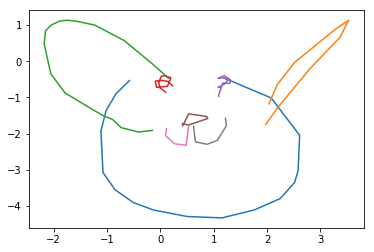

epoch 29201 in 0.176 s: loss = -0.3907, LR = -0.4226, LKL = 0.0320
epoch 29202 in 0.173 s: loss = -0.4387, LR = -0.4707, LKL = 0.0320
epoch 29203 in 0.176 s: loss = -0.4115, LR = -0.4434, LKL = 0.0319
epoch 29204 in 0.171 s: loss = -0.3854, LR = -0.4174, LKL = 0.0319
epoch 29205 in 0.174 s: loss = -0.4501, LR = -0.4819, LKL = 0.0318
epoch 29206 in 0.175 s: loss = -0.3700, LR = -0.4020, LKL = 0.0320
epoch 29207 in 0.176 s: loss = -0.3732, LR = -0.4050, LKL = 0.0318
epoch 29208 in 0.175 s: loss = -0.4449, LR = -0.4767, LKL = 0.0318
epoch 29209 in 0.176 s: loss = -0.3579, LR = -0.3897, LKL = 0.0317
epoch 29210 in 0.175 s: loss = -0.4051, LR = -0.4368, LKL = 0.0317
epoch 29211 in 0.175 s: loss = -0.3473, LR = -0.3789, LKL = 0.0317
epoch 29212 in 0.172 s: loss = -0.4106, LR = -0.4423, LKL = 0.0317
epoch 29213 in 0.177 s: loss = -0.4336, LR = -0.4655, LKL = 0.0319
epoch 29214 in 0.175 s: loss = -0.4138, LR = -0.4458, LKL = 0.0320
epoch 29215 in 0.175 s: loss = -0.3978, LR = -0.4296, LKL = 0.

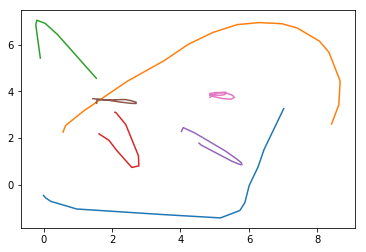

epoch 29301 in 0.174 s: loss = -0.3456, LR = -0.3774, LKL = 0.0318
epoch 29302 in 0.175 s: loss = -0.4168, LR = -0.4489, LKL = 0.0320
epoch 29303 in 0.177 s: loss = -0.4040, LR = -0.4360, LKL = 0.0320
epoch 29304 in 0.170 s: loss = -0.4517, LR = -0.4838, LKL = 0.0322
epoch 29305 in 0.177 s: loss = -0.4145, LR = -0.4463, LKL = 0.0318
epoch 29306 in 0.178 s: loss = -0.4486, LR = -0.4804, LKL = 0.0319
epoch 29307 in 0.176 s: loss = -0.4702, LR = -0.5023, LKL = 0.0321
epoch 29308 in 0.178 s: loss = -0.3789, LR = -0.4109, LKL = 0.0320
epoch 29309 in 0.177 s: loss = -0.4262, LR = -0.4583, LKL = 0.0321
epoch 29310 in 0.174 s: loss = -0.3965, LR = -0.4283, LKL = 0.0318
epoch 29311 in 0.173 s: loss = -0.3620, LR = -0.3940, LKL = 0.0320
epoch 29312 in 0.174 s: loss = -0.4295, LR = -0.4615, LKL = 0.0320
epoch 29313 in 0.173 s: loss = -0.3677, LR = -0.3997, LKL = 0.0319
epoch 29314 in 0.176 s: loss = -0.4241, LR = -0.4563, LKL = 0.0321
epoch 29315 in 0.177 s: loss = -0.3966, LR = -0.4286, LKL = 0.

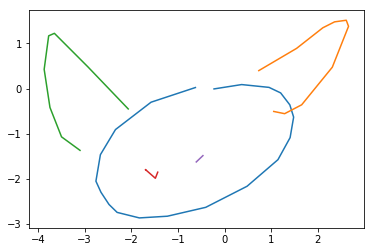

epoch 29401 in 0.173 s: loss = -0.4950, LR = -0.5272, LKL = 0.0322
epoch 29402 in 0.177 s: loss = -0.4324, LR = -0.4645, LKL = 0.0322
epoch 29403 in 0.175 s: loss = -0.4068, LR = -0.4386, LKL = 0.0318
epoch 29404 in 0.174 s: loss = -0.3763, LR = -0.4081, LKL = 0.0318
epoch 29405 in 0.175 s: loss = -0.4122, LR = -0.4442, LKL = 0.0320
epoch 29406 in 0.174 s: loss = -0.4328, LR = -0.4646, LKL = 0.0318
epoch 29407 in 0.173 s: loss = -0.3893, LR = -0.4212, LKL = 0.0319
epoch 29408 in 0.173 s: loss = -0.3880, LR = -0.4201, LKL = 0.0320
epoch 29409 in 0.171 s: loss = -0.4206, LR = -0.4527, LKL = 0.0320
epoch 29410 in 0.173 s: loss = -0.4155, LR = -0.4474, LKL = 0.0319
epoch 29411 in 0.172 s: loss = -0.4181, LR = -0.4502, LKL = 0.0321
epoch 29412 in 0.174 s: loss = -0.4307, LR = -0.4626, LKL = 0.0319
epoch 29413 in 0.174 s: loss = -0.4667, LR = -0.4988, LKL = 0.0322
epoch 29414 in 0.174 s: loss = -0.3529, LR = -0.3848, LKL = 0.0320
epoch 29415 in 0.175 s: loss = -0.4330, LR = -0.4650, LKL = 0.

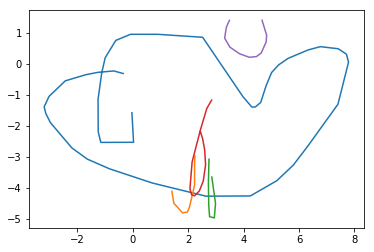

epoch 29501 in 0.173 s: loss = -0.4857, LR = -0.5177, LKL = 0.0319
epoch 29502 in 0.175 s: loss = -0.4872, LR = -0.5193, LKL = 0.0320
epoch 29503 in 0.179 s: loss = -0.4109, LR = -0.4429, LKL = 0.0320
epoch 29504 in 0.179 s: loss = -0.3891, LR = -0.4212, LKL = 0.0321
epoch 29505 in 0.172 s: loss = -0.4569, LR = -0.4888, LKL = 0.0319
epoch 29506 in 0.176 s: loss = -0.3907, LR = -0.4226, LKL = 0.0318
epoch 29507 in 0.178 s: loss = -0.4024, LR = -0.4343, LKL = 0.0319
epoch 29508 in 0.178 s: loss = -0.4229, LR = -0.4550, LKL = 0.0321
epoch 29509 in 0.177 s: loss = -0.3753, LR = -0.4074, LKL = 0.0321
epoch 29510 in 0.175 s: loss = -0.3888, LR = -0.4208, LKL = 0.0319
epoch 29511 in 0.175 s: loss = -0.4470, LR = -0.4790, LKL = 0.0320
epoch 29512 in 0.176 s: loss = -0.4086, LR = -0.4406, LKL = 0.0320
epoch 29513 in 0.177 s: loss = -0.4600, LR = -0.4921, LKL = 0.0322
epoch 29514 in 0.178 s: loss = -0.4462, LR = -0.4784, LKL = 0.0322
epoch 29515 in 0.177 s: loss = -0.4121, LR = -0.4440, LKL = 0.

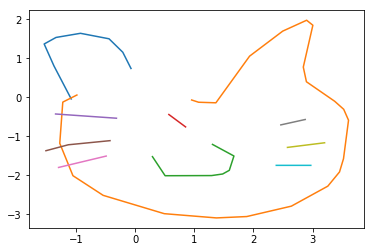

epoch 29601 in 0.173 s: loss = -0.4063, LR = -0.4384, LKL = 0.0321
epoch 29602 in 0.173 s: loss = -0.4046, LR = -0.4366, LKL = 0.0319
epoch 29603 in 0.175 s: loss = -0.3370, LR = -0.3687, LKL = 0.0318
epoch 29604 in 0.173 s: loss = -0.4280, LR = -0.4600, LKL = 0.0320
epoch 29605 in 0.175 s: loss = -0.3606, LR = -0.3922, LKL = 0.0317
epoch 29606 in 0.176 s: loss = -0.4022, LR = -0.4342, LKL = 0.0319
epoch 29607 in 0.176 s: loss = -0.3959, LR = -0.4280, LKL = 0.0321
epoch 29608 in 0.176 s: loss = -0.3394, LR = -0.3712, LKL = 0.0318
epoch 29609 in 0.179 s: loss = -0.4306, LR = -0.4626, LKL = 0.0320
epoch 29610 in 0.173 s: loss = -0.3827, LR = -0.4145, LKL = 0.0318
epoch 29611 in 0.175 s: loss = -0.4183, LR = -0.4502, LKL = 0.0319
epoch 29612 in 0.172 s: loss = -0.3822, LR = -0.4141, LKL = 0.0319
epoch 29613 in 0.175 s: loss = -0.3792, LR = -0.4112, LKL = 0.0320
epoch 29614 in 0.178 s: loss = -0.4125, LR = -0.4448, LKL = 0.0322
epoch 29615 in 0.175 s: loss = -0.3873, LR = -0.4190, LKL = 0.

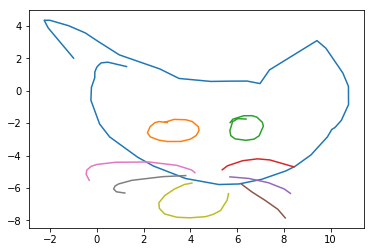

epoch 29701 in 0.174 s: loss = -0.4409, LR = -0.4730, LKL = 0.0321
epoch 29702 in 0.172 s: loss = -0.4567, LR = -0.4889, LKL = 0.0321
epoch 29703 in 0.178 s: loss = -0.3655, LR = -0.3975, LKL = 0.0320
epoch 29704 in 0.176 s: loss = -0.4744, LR = -0.5065, LKL = 0.0321
epoch 29705 in 0.174 s: loss = -0.4358, LR = -0.4678, LKL = 0.0321
epoch 29706 in 0.176 s: loss = -0.4646, LR = -0.4968, LKL = 0.0322
epoch 29707 in 0.181 s: loss = -0.3473, LR = -0.3792, LKL = 0.0319
epoch 29708 in 0.177 s: loss = -0.3833, LR = -0.4154, LKL = 0.0322
epoch 29709 in 0.175 s: loss = -0.3891, LR = -0.4209, LKL = 0.0318
epoch 29710 in 0.176 s: loss = -0.4015, LR = -0.4335, LKL = 0.0320
epoch 29711 in 0.175 s: loss = -0.4092, LR = -0.4412, LKL = 0.0321
epoch 29712 in 0.177 s: loss = -0.3898, LR = -0.4220, LKL = 0.0322
epoch 29713 in 0.178 s: loss = -0.4042, LR = -0.4362, LKL = 0.0320
epoch 29714 in 0.175 s: loss = -0.4548, LR = -0.4868, LKL = 0.0320
epoch 29715 in 0.177 s: loss = -0.4234, LR = -0.4554, LKL = 0.

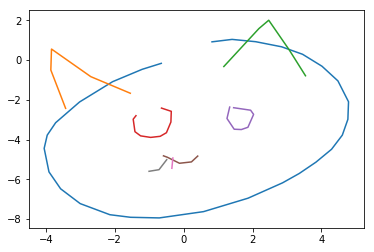

epoch 29801 in 0.175 s: loss = -0.4656, LR = -0.4976, LKL = 0.0320
epoch 29802 in 0.174 s: loss = -0.4032, LR = -0.4351, LKL = 0.0319
epoch 29803 in 0.175 s: loss = -0.4172, LR = -0.4493, LKL = 0.0321
epoch 29804 in 0.177 s: loss = -0.4285, LR = -0.4608, LKL = 0.0322
epoch 29805 in 0.176 s: loss = -0.4820, LR = -0.5142, LKL = 0.0322
epoch 29806 in 0.172 s: loss = -0.4324, LR = -0.4647, LKL = 0.0323
epoch 29807 in 0.175 s: loss = -0.4410, LR = -0.4730, LKL = 0.0320
epoch 29808 in 0.175 s: loss = -0.3821, LR = -0.4141, LKL = 0.0320
epoch 29809 in 0.180 s: loss = -0.3621, LR = -0.3942, LKL = 0.0321
epoch 29810 in 0.175 s: loss = -0.3959, LR = -0.4279, LKL = 0.0319
epoch 29811 in 0.175 s: loss = -0.3752, LR = -0.4072, LKL = 0.0320
epoch 29812 in 0.176 s: loss = -0.4534, LR = -0.4855, LKL = 0.0321
epoch 29813 in 0.174 s: loss = -0.4855, LR = -0.5179, LKL = 0.0324
epoch 29814 in 0.172 s: loss = -0.4217, LR = -0.4538, LKL = 0.0321
epoch 29815 in 0.175 s: loss = -0.4074, LR = -0.4392, LKL = 0.

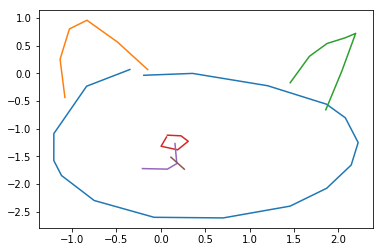

epoch 29901 in 0.174 s: loss = -0.3636, LR = -0.3955, LKL = 0.0319
epoch 29902 in 0.177 s: loss = -0.4043, LR = -0.4362, LKL = 0.0319
epoch 29903 in 0.175 s: loss = -0.3465, LR = -0.3785, LKL = 0.0320
epoch 29904 in 0.179 s: loss = -0.4375, LR = -0.4697, LKL = 0.0322
epoch 29905 in 0.175 s: loss = -0.3349, LR = -0.3667, LKL = 0.0318
epoch 29906 in 0.174 s: loss = -0.3074, LR = -0.3394, LKL = 0.0320
epoch 29907 in 0.178 s: loss = -0.4245, LR = -0.4567, LKL = 0.0321
epoch 29908 in 0.181 s: loss = -0.4191, LR = -0.4513, LKL = 0.0322
epoch 29909 in 0.177 s: loss = -0.4340, LR = -0.4659, LKL = 0.0319
epoch 29910 in 0.178 s: loss = -0.4072, LR = -0.4392, LKL = 0.0319
epoch 29911 in 0.175 s: loss = -0.4437, LR = -0.4758, LKL = 0.0321
epoch 29912 in 0.175 s: loss = -0.3737, LR = -0.4055, LKL = 0.0318
epoch 29913 in 0.177 s: loss = -0.4579, LR = -0.4900, LKL = 0.0320
epoch 29914 in 0.179 s: loss = -0.3691, LR = -0.4008, LKL = 0.0318
epoch 29915 in 0.176 s: loss = -0.3900, LR = -0.4218, LKL = 0.

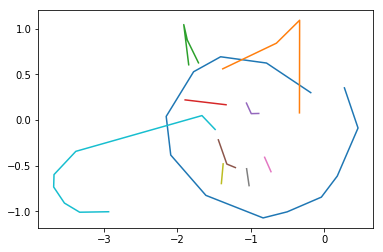

epoch 30001 in 0.172 s: loss = -0.4039, LR = -0.4356, LKL = 0.0317
epoch 30002 in 0.173 s: loss = -0.3806, LR = -0.4127, LKL = 0.0321
epoch 30003 in 0.176 s: loss = -0.4090, LR = -0.4410, LKL = 0.0320
epoch 30004 in 0.176 s: loss = -0.4473, LR = -0.4795, LKL = 0.0323
epoch 30005 in 0.178 s: loss = -0.4913, LR = -0.5236, LKL = 0.0323
epoch 30006 in 0.175 s: loss = -0.4279, LR = -0.4601, LKL = 0.0322
epoch 30007 in 0.177 s: loss = -0.4158, LR = -0.4479, LKL = 0.0322
epoch 30008 in 0.182 s: loss = -0.3709, LR = -0.4029, LKL = 0.0320
epoch 30009 in 0.176 s: loss = -0.4252, LR = -0.4574, LKL = 0.0322
epoch 30010 in 0.175 s: loss = -0.4512, LR = -0.4835, LKL = 0.0323
epoch 30011 in 0.173 s: loss = -0.3641, LR = -0.3960, LKL = 0.0319
epoch 30012 in 0.173 s: loss = -0.4562, LR = -0.4883, LKL = 0.0321
epoch 30013 in 0.175 s: loss = -0.3905, LR = -0.4226, LKL = 0.0320
epoch 30014 in 0.177 s: loss = -0.4630, LR = -0.4953, LKL = 0.0323
epoch 30015 in 0.178 s: loss = -0.5011, LR = -0.5335, LKL = 0.

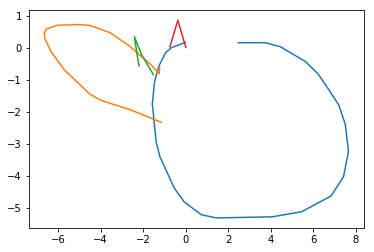

epoch 30101 in 0.176 s: loss = -0.3489, LR = -0.3810, LKL = 0.0321
epoch 30102 in 0.174 s: loss = -0.3963, LR = -0.4286, LKL = 0.0323
epoch 30103 in 0.176 s: loss = -0.4460, LR = -0.4782, LKL = 0.0322
epoch 30104 in 0.176 s: loss = -0.3429, LR = -0.3749, LKL = 0.0320
epoch 30105 in 0.177 s: loss = -0.3527, LR = -0.3850, LKL = 0.0322
epoch 30106 in 0.176 s: loss = -0.4060, LR = -0.4382, LKL = 0.0322
epoch 30107 in 0.177 s: loss = -0.4139, LR = -0.4459, LKL = 0.0320
epoch 30108 in 0.176 s: loss = -0.4406, LR = -0.4727, LKL = 0.0321
epoch 30109 in 0.174 s: loss = -0.4002, LR = -0.4323, LKL = 0.0321
epoch 30110 in 0.175 s: loss = -0.3436, LR = -0.3757, LKL = 0.0321
epoch 30111 in 0.175 s: loss = -0.4548, LR = -0.4870, LKL = 0.0323
epoch 30112 in 0.174 s: loss = -0.4410, LR = -0.4731, LKL = 0.0320
epoch 30113 in 0.173 s: loss = -0.4214, LR = -0.4537, LKL = 0.0323
epoch 30114 in 0.175 s: loss = -0.4546, LR = -0.4867, LKL = 0.0322
epoch 30115 in 0.173 s: loss = -0.4320, LR = -0.4641, LKL = 0.

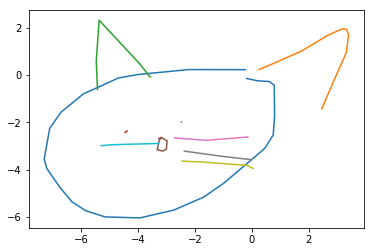

epoch 30201 in 0.175 s: loss = -0.4652, LR = -0.4977, LKL = 0.0324
epoch 30202 in 0.175 s: loss = -0.5054, LR = -0.5375, LKL = 0.0321
epoch 30203 in 0.174 s: loss = -0.4533, LR = -0.4855, LKL = 0.0322
epoch 30204 in 0.174 s: loss = -0.4428, LR = -0.4748, LKL = 0.0320
epoch 30205 in 0.177 s: loss = -0.4782, LR = -0.5106, LKL = 0.0324
epoch 30206 in 0.175 s: loss = -0.4355, LR = -0.4677, LKL = 0.0322
epoch 30207 in 0.177 s: loss = -0.3836, LR = -0.4156, LKL = 0.0320
epoch 30208 in 0.172 s: loss = -0.4527, LR = -0.4849, LKL = 0.0322
epoch 30209 in 0.173 s: loss = -0.4488, LR = -0.4810, LKL = 0.0322
epoch 30210 in 0.176 s: loss = -0.4343, LR = -0.4666, LKL = 0.0323
epoch 30211 in 0.176 s: loss = -0.4768, LR = -0.5091, LKL = 0.0323
epoch 30212 in 0.176 s: loss = -0.4323, LR = -0.4645, LKL = 0.0322
epoch 30213 in 0.174 s: loss = -0.4084, LR = -0.4406, LKL = 0.0322
epoch 30214 in 0.175 s: loss = -0.4473, LR = -0.4795, LKL = 0.0322
epoch 30215 in 0.176 s: loss = -0.4044, LR = -0.4366, LKL = 0.

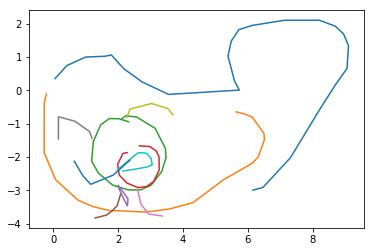

epoch 30301 in 0.176 s: loss = -0.4049, LR = -0.4371, LKL = 0.0322
epoch 30302 in 0.178 s: loss = -0.3771, LR = -0.4092, LKL = 0.0321
epoch 30303 in 0.177 s: loss = -0.4118, LR = -0.4442, LKL = 0.0324
epoch 30304 in 0.174 s: loss = -0.3650, LR = -0.3971, LKL = 0.0321
epoch 30305 in 0.174 s: loss = -0.4314, LR = -0.4635, LKL = 0.0321
epoch 30306 in 0.175 s: loss = -0.3908, LR = -0.4229, LKL = 0.0322
epoch 30307 in 0.179 s: loss = -0.4092, LR = -0.4414, LKL = 0.0321
epoch 30308 in 0.176 s: loss = -0.4154, LR = -0.4475, LKL = 0.0321
epoch 30309 in 0.177 s: loss = -0.4097, LR = -0.4417, LKL = 0.0320
epoch 30310 in 0.171 s: loss = -0.4045, LR = -0.4366, LKL = 0.0321
epoch 30311 in 0.174 s: loss = -0.3795, LR = -0.4116, LKL = 0.0322
epoch 30312 in 0.174 s: loss = -0.4400, LR = -0.4722, LKL = 0.0322
epoch 30313 in 0.178 s: loss = -0.4231, LR = -0.4553, LKL = 0.0322
epoch 30314 in 0.174 s: loss = -0.3418, LR = -0.3740, LKL = 0.0322
epoch 30315 in 0.172 s: loss = -0.4365, LR = -0.4687, LKL = 0.

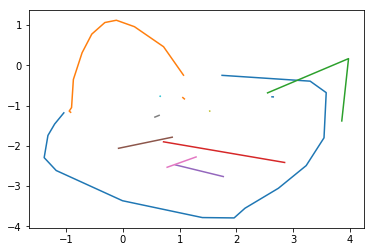

epoch 30401 in 0.180 s: loss = -0.3923, LR = -0.4247, LKL = 0.0323
epoch 30402 in 0.174 s: loss = -0.4272, LR = -0.4595, LKL = 0.0323
epoch 30403 in 0.175 s: loss = -0.4419, LR = -0.4743, LKL = 0.0325
epoch 30404 in 0.179 s: loss = -0.4177, LR = -0.4499, LKL = 0.0322
epoch 30405 in 0.179 s: loss = -0.4165, LR = -0.4486, LKL = 0.0321
epoch 30406 in 0.174 s: loss = -0.4207, LR = -0.4529, LKL = 0.0321
epoch 30407 in 0.180 s: loss = -0.4149, LR = -0.4475, LKL = 0.0326
epoch 30408 in 0.171 s: loss = -0.4405, LR = -0.4728, LKL = 0.0323
epoch 30409 in 0.176 s: loss = -0.3835, LR = -0.4157, LKL = 0.0322
epoch 30410 in 0.176 s: loss = -0.4370, LR = -0.4695, LKL = 0.0325
epoch 30411 in 0.179 s: loss = -0.4870, LR = -0.5193, LKL = 0.0323
epoch 30412 in 0.173 s: loss = -0.5199, LR = -0.5522, LKL = 0.0323
epoch 30413 in 0.175 s: loss = -0.3882, LR = -0.4202, LKL = 0.0320
epoch 30414 in 0.170 s: loss = -0.4288, LR = -0.4611, LKL = 0.0323
epoch 30415 in 0.171 s: loss = -0.3930, LR = -0.4252, LKL = 0.

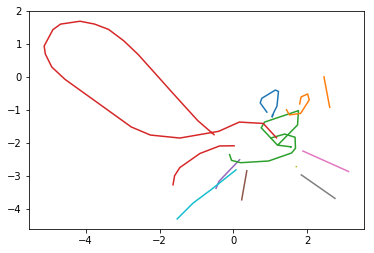

epoch 30501 in 0.175 s: loss = -0.4032, LR = -0.4354, LKL = 0.0322
epoch 30502 in 0.177 s: loss = -0.5009, LR = -0.5334, LKL = 0.0326
epoch 30503 in 0.177 s: loss = -0.4640, LR = -0.4963, LKL = 0.0324
epoch 30504 in 0.176 s: loss = -0.4603, LR = -0.4929, LKL = 0.0326
epoch 30505 in 0.179 s: loss = -0.4147, LR = -0.4470, LKL = 0.0323
epoch 30506 in 0.178 s: loss = -0.3956, LR = -0.4278, LKL = 0.0322
epoch 30507 in 0.178 s: loss = -0.4147, LR = -0.4470, LKL = 0.0323
epoch 30508 in 0.176 s: loss = -0.3659, LR = -0.3981, LKL = 0.0322
epoch 30509 in 0.178 s: loss = -0.4176, LR = -0.4497, LKL = 0.0322
epoch 30510 in 0.178 s: loss = -0.4219, LR = -0.4542, LKL = 0.0323
epoch 30511 in 0.173 s: loss = -0.4964, LR = -0.5290, LKL = 0.0326
epoch 30512 in 0.171 s: loss = -0.4600, LR = -0.4923, LKL = 0.0323
epoch 30513 in 0.175 s: loss = -0.4461, LR = -0.4785, LKL = 0.0323
epoch 30514 in 0.178 s: loss = -0.4230, LR = -0.4555, LKL = 0.0324
epoch 30515 in 0.177 s: loss = -0.4294, LR = -0.4616, LKL = 0.

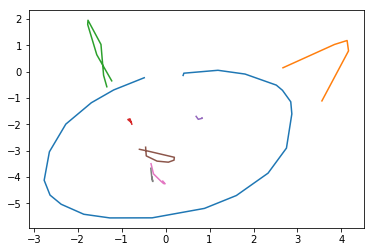

epoch 30601 in 0.174 s: loss = -0.4140, LR = -0.4464, LKL = 0.0323
epoch 30602 in 0.176 s: loss = -0.4467, LR = -0.4791, LKL = 0.0324
epoch 30603 in 0.177 s: loss = -0.3871, LR = -0.4195, LKL = 0.0324
epoch 30604 in 0.176 s: loss = -0.4238, LR = -0.4562, LKL = 0.0324
epoch 30605 in 0.176 s: loss = -0.4018, LR = -0.4341, LKL = 0.0323
epoch 30606 in 0.172 s: loss = -0.4498, LR = -0.4821, LKL = 0.0324
epoch 30607 in 0.175 s: loss = -0.4378, LR = -0.4701, LKL = 0.0323
epoch 30608 in 0.172 s: loss = -0.4082, LR = -0.4405, LKL = 0.0323
epoch 30609 in 0.173 s: loss = -0.4174, LR = -0.4498, LKL = 0.0324
epoch 30610 in 0.175 s: loss = -0.3723, LR = -0.4045, LKL = 0.0322
epoch 30611 in 0.177 s: loss = -0.5177, LR = -0.5502, LKL = 0.0325
epoch 30612 in 0.177 s: loss = -0.4415, LR = -0.4738, LKL = 0.0322
epoch 30613 in 0.175 s: loss = -0.4438, LR = -0.4760, LKL = 0.0322
epoch 30614 in 0.176 s: loss = -0.3923, LR = -0.4245, LKL = 0.0322
epoch 30615 in 0.177 s: loss = -0.3852, LR = -0.4176, LKL = 0.

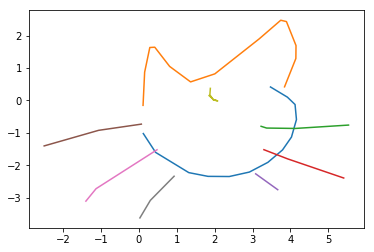

epoch 30701 in 0.176 s: loss = -0.4228, LR = -0.4552, LKL = 0.0324
epoch 30702 in 0.175 s: loss = -0.4344, LR = -0.4667, LKL = 0.0323
epoch 30703 in 0.177 s: loss = -0.4249, LR = -0.4573, LKL = 0.0324
epoch 30704 in 0.177 s: loss = -0.4397, LR = -0.4721, LKL = 0.0324
epoch 30705 in 0.178 s: loss = -0.4149, LR = -0.4473, LKL = 0.0324
epoch 30706 in 0.173 s: loss = -0.4248, LR = -0.4571, LKL = 0.0323
epoch 30707 in 0.179 s: loss = -0.4904, LR = -0.5228, LKL = 0.0325
epoch 30708 in 0.175 s: loss = -0.4677, LR = -0.5002, LKL = 0.0325
epoch 30709 in 0.178 s: loss = -0.4514, LR = -0.4836, LKL = 0.0322
epoch 30710 in 0.174 s: loss = -0.3902, LR = -0.4224, LKL = 0.0322
epoch 30711 in 0.178 s: loss = -0.3975, LR = -0.4296, LKL = 0.0321
epoch 30712 in 0.172 s: loss = -0.4304, LR = -0.4628, LKL = 0.0323
epoch 30713 in 0.177 s: loss = -0.4357, LR = -0.4681, LKL = 0.0324
epoch 30714 in 0.177 s: loss = -0.3963, LR = -0.4285, LKL = 0.0322
epoch 30715 in 0.178 s: loss = -0.3857, LR = -0.4178, LKL = 0.

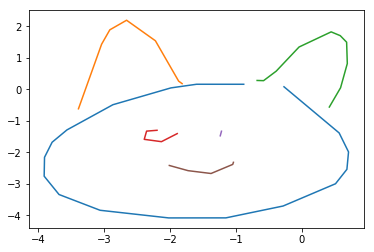

epoch 30801 in 0.177 s: loss = -0.4832, LR = -0.5158, LKL = 0.0326
epoch 30802 in 0.174 s: loss = -0.3779, LR = -0.4101, LKL = 0.0322
epoch 30803 in 0.176 s: loss = -0.4595, LR = -0.4917, LKL = 0.0322
epoch 30804 in 0.175 s: loss = -0.3792, LR = -0.4114, LKL = 0.0322
epoch 30805 in 0.178 s: loss = -0.4022, LR = -0.4347, LKL = 0.0325
epoch 30806 in 0.173 s: loss = -0.4373, LR = -0.4696, LKL = 0.0323
epoch 30807 in 0.177 s: loss = -0.3891, LR = -0.4213, LKL = 0.0322
epoch 30808 in 0.170 s: loss = -0.3780, LR = -0.4103, LKL = 0.0322
epoch 30809 in 0.178 s: loss = -0.3412, LR = -0.3734, LKL = 0.0322
epoch 30810 in 0.175 s: loss = -0.3664, LR = -0.3986, LKL = 0.0322
epoch 30811 in 0.180 s: loss = -0.4114, LR = -0.4438, LKL = 0.0323
epoch 30812 in 0.173 s: loss = -0.4328, LR = -0.4653, LKL = 0.0324
epoch 30813 in 0.178 s: loss = -0.3600, LR = -0.3924, LKL = 0.0323
epoch 30814 in 0.175 s: loss = -0.4375, LR = -0.4699, LKL = 0.0324
epoch 30815 in 0.180 s: loss = -0.4006, LR = -0.4330, LKL = 0.

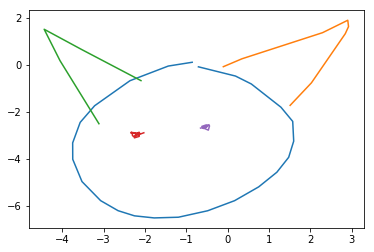

epoch 30901 in 0.173 s: loss = -0.3659, LR = -0.3981, LKL = 0.0322
epoch 30902 in 0.179 s: loss = -0.3675, LR = -0.3998, LKL = 0.0323
epoch 30903 in 0.179 s: loss = -0.4029, LR = -0.4351, LKL = 0.0322
epoch 30904 in 0.174 s: loss = -0.4076, LR = -0.4398, LKL = 0.0323
epoch 30905 in 0.174 s: loss = -0.4138, LR = -0.4462, LKL = 0.0324
epoch 30906 in 0.175 s: loss = -0.4334, LR = -0.4660, LKL = 0.0325
epoch 30907 in 0.176 s: loss = -0.4055, LR = -0.4376, LKL = 0.0321
epoch 30908 in 0.176 s: loss = -0.3974, LR = -0.4296, LKL = 0.0323
epoch 30909 in 0.182 s: loss = -0.4305, LR = -0.4629, LKL = 0.0324
epoch 30910 in 0.175 s: loss = -0.4599, LR = -0.4925, LKL = 0.0326
epoch 30911 in 0.176 s: loss = -0.3924, LR = -0.4247, LKL = 0.0322
epoch 30912 in 0.182 s: loss = -0.4848, LR = -0.5174, LKL = 0.0325
epoch 30913 in 0.180 s: loss = -0.4543, LR = -0.4870, LKL = 0.0326
epoch 30914 in 0.177 s: loss = -0.4163, LR = -0.4487, LKL = 0.0324
epoch 30915 in 0.178 s: loss = -0.4809, LR = -0.5133, LKL = 0.

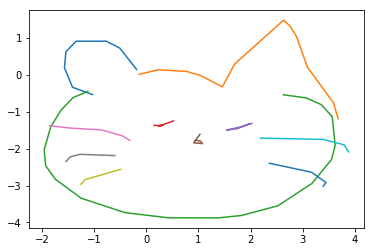

epoch 31001 in 0.174 s: loss = -0.4608, LR = -0.4930, LKL = 0.0322
epoch 31002 in 0.173 s: loss = -0.4436, LR = -0.4760, LKL = 0.0324
epoch 31003 in 0.175 s: loss = -0.3812, LR = -0.4137, LKL = 0.0324
epoch 31004 in 0.174 s: loss = -0.4139, LR = -0.4464, LKL = 0.0326
epoch 31005 in 0.174 s: loss = -0.4292, LR = -0.4616, LKL = 0.0325
epoch 31006 in 0.174 s: loss = -0.4614, LR = -0.4937, LKL = 0.0323
epoch 31007 in 0.176 s: loss = -0.3454, LR = -0.3778, LKL = 0.0324
epoch 31008 in 0.173 s: loss = -0.4389, LR = -0.4712, LKL = 0.0324
epoch 31009 in 0.174 s: loss = -0.4495, LR = -0.4818, LKL = 0.0324
epoch 31010 in 0.175 s: loss = -0.4416, LR = -0.4738, LKL = 0.0322
epoch 31011 in 0.176 s: loss = -0.3583, LR = -0.3906, LKL = 0.0323
epoch 31012 in 0.174 s: loss = -0.3608, LR = -0.3931, LKL = 0.0322
epoch 31013 in 0.174 s: loss = -0.4889, LR = -0.5214, LKL = 0.0325
epoch 31014 in 0.175 s: loss = -0.4337, LR = -0.4662, LKL = 0.0325
epoch 31015 in 0.177 s: loss = -0.4463, LR = -0.4789, LKL = 0.

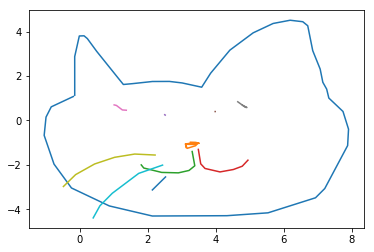

epoch 31101 in 0.174 s: loss = -0.4656, LR = -0.4981, LKL = 0.0325
epoch 31102 in 0.172 s: loss = -0.4093, LR = -0.4413, LKL = 0.0320
epoch 31103 in 0.173 s: loss = -0.4510, LR = -0.4832, LKL = 0.0322
epoch 31104 in 0.173 s: loss = -0.4970, LR = -0.5295, LKL = 0.0325
epoch 31105 in 0.172 s: loss = -0.3801, LR = -0.4123, LKL = 0.0322
epoch 31106 in 0.170 s: loss = -0.4224, LR = -0.4548, LKL = 0.0324
epoch 31107 in 0.173 s: loss = -0.4544, LR = -0.4870, LKL = 0.0326
epoch 31108 in 0.173 s: loss = -0.3439, LR = -0.3763, LKL = 0.0324
epoch 31109 in 0.175 s: loss = -0.4326, LR = -0.4650, LKL = 0.0324
epoch 31110 in 0.173 s: loss = -0.4152, LR = -0.4477, LKL = 0.0325
epoch 31111 in 0.171 s: loss = -0.4852, LR = -0.5178, LKL = 0.0326
epoch 31112 in 0.172 s: loss = -0.3822, LR = -0.4143, LKL = 0.0322
epoch 31113 in 0.174 s: loss = -0.4055, LR = -0.4379, LKL = 0.0324
epoch 31114 in 0.172 s: loss = -0.4326, LR = -0.4650, LKL = 0.0324
epoch 31115 in 0.172 s: loss = -0.4237, LR = -0.4565, LKL = 0.

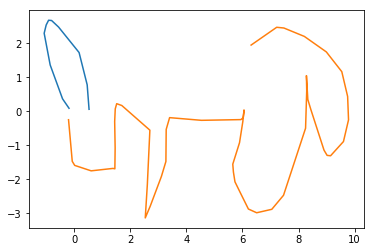

epoch 31201 in 0.176 s: loss = -0.4284, LR = -0.4608, LKL = 0.0324
epoch 31202 in 0.172 s: loss = -0.4180, LR = -0.4504, LKL = 0.0324
epoch 31203 in 0.174 s: loss = -0.4545, LR = -0.4868, LKL = 0.0324
epoch 31204 in 0.175 s: loss = -0.3926, LR = -0.4250, LKL = 0.0324
epoch 31205 in 0.175 s: loss = -0.4326, LR = -0.4652, LKL = 0.0326
epoch 31206 in 0.174 s: loss = -0.3638, LR = -0.3960, LKL = 0.0322
epoch 31207 in 0.173 s: loss = -0.4392, LR = -0.4716, LKL = 0.0324
epoch 31208 in 0.176 s: loss = -0.3613, LR = -0.3936, LKL = 0.0323
epoch 31209 in 0.178 s: loss = -0.4103, LR = -0.4426, LKL = 0.0323
epoch 31210 in 0.176 s: loss = -0.4058, LR = -0.4379, LKL = 0.0322
epoch 31211 in 0.175 s: loss = -0.4254, LR = -0.4577, LKL = 0.0323
epoch 31212 in 0.173 s: loss = -0.3726, LR = -0.4050, LKL = 0.0324
epoch 31213 in 0.174 s: loss = -0.4081, LR = -0.4405, LKL = 0.0324
epoch 31214 in 0.175 s: loss = -0.4848, LR = -0.5175, LKL = 0.0327
epoch 31215 in 0.174 s: loss = -0.4070, LR = -0.4393, LKL = 0.

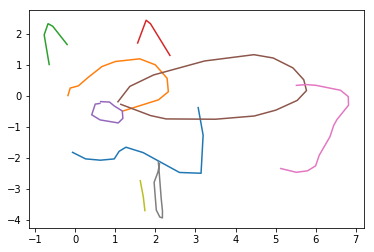

epoch 31301 in 0.173 s: loss = -0.4154, LR = -0.4478, LKL = 0.0324
epoch 31302 in 0.172 s: loss = -0.3855, LR = -0.4180, LKL = 0.0325
epoch 31303 in 0.175 s: loss = -0.4625, LR = -0.4953, LKL = 0.0328
epoch 31304 in 0.171 s: loss = -0.4699, LR = -0.5025, LKL = 0.0325
epoch 31305 in 0.172 s: loss = -0.4705, LR = -0.5030, LKL = 0.0325
epoch 31306 in 0.172 s: loss = -0.3789, LR = -0.4112, LKL = 0.0323
epoch 31307 in 0.171 s: loss = -0.3841, LR = -0.4163, LKL = 0.0322
epoch 31308 in 0.171 s: loss = -0.4188, LR = -0.4514, LKL = 0.0326
epoch 31309 in 0.175 s: loss = -0.4311, LR = -0.4636, LKL = 0.0325
epoch 31310 in 0.170 s: loss = -0.4218, LR = -0.4544, LKL = 0.0327
epoch 31311 in 0.170 s: loss = -0.4377, LR = -0.4704, LKL = 0.0327
epoch 31312 in 0.171 s: loss = -0.3956, LR = -0.4280, LKL = 0.0324
epoch 31313 in 0.174 s: loss = -0.4475, LR = -0.4802, LKL = 0.0327
epoch 31314 in 0.172 s: loss = -0.4169, LR = -0.4494, LKL = 0.0324
epoch 31315 in 0.172 s: loss = -0.3797, LR = -0.4120, LKL = 0.

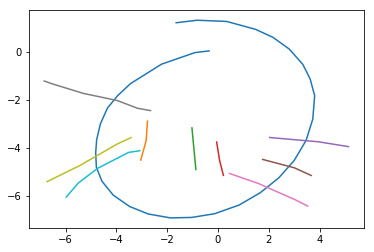

epoch 31401 in 0.176 s: loss = -0.4151, LR = -0.4477, LKL = 0.0326
epoch 31402 in 0.174 s: loss = -0.3678, LR = -0.4003, LKL = 0.0325
epoch 31403 in 0.172 s: loss = -0.4140, LR = -0.4465, LKL = 0.0325
epoch 31404 in 0.174 s: loss = -0.3711, LR = -0.4036, LKL = 0.0324
epoch 31405 in 0.173 s: loss = -0.4018, LR = -0.4342, LKL = 0.0324
epoch 31406 in 0.173 s: loss = -0.3884, LR = -0.4208, LKL = 0.0324
epoch 31407 in 0.177 s: loss = -0.4595, LR = -0.4921, LKL = 0.0326
epoch 31408 in 0.174 s: loss = -0.4580, LR = -0.4907, LKL = 0.0327
epoch 31409 in 0.171 s: loss = -0.4252, LR = -0.4580, LKL = 0.0328
epoch 31410 in 0.173 s: loss = -0.4483, LR = -0.4808, LKL = 0.0325
epoch 31411 in 0.175 s: loss = -0.4406, LR = -0.4732, LKL = 0.0326
epoch 31412 in 0.174 s: loss = -0.4033, LR = -0.4358, LKL = 0.0325
epoch 31413 in 0.173 s: loss = -0.4133, LR = -0.4458, LKL = 0.0324
epoch 31414 in 0.173 s: loss = -0.4062, LR = -0.4387, LKL = 0.0325
epoch 31415 in 0.174 s: loss = -0.4864, LR = -0.5189, LKL = 0.

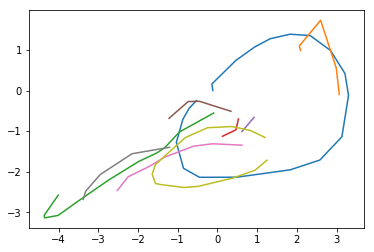

epoch 31501 in 0.173 s: loss = -0.4129, LR = -0.4455, LKL = 0.0327
epoch 31502 in 0.173 s: loss = -0.4381, LR = -0.4707, LKL = 0.0326
epoch 31503 in 0.173 s: loss = -0.3555, LR = -0.3880, LKL = 0.0326
epoch 31504 in 0.172 s: loss = -0.4229, LR = -0.4554, LKL = 0.0324
epoch 31505 in 0.173 s: loss = -0.4354, LR = -0.4680, LKL = 0.0327
epoch 31506 in 0.172 s: loss = -0.4485, LR = -0.4811, LKL = 0.0326
epoch 31507 in 0.172 s: loss = -0.4570, LR = -0.4894, LKL = 0.0324
epoch 31508 in 0.171 s: loss = -0.3708, LR = -0.4031, LKL = 0.0322
epoch 31509 in 0.177 s: loss = -0.3999, LR = -0.4321, LKL = 0.0322
epoch 31510 in 0.171 s: loss = -0.4263, LR = -0.4588, LKL = 0.0325
epoch 31511 in 0.171 s: loss = -0.3923, LR = -0.4248, LKL = 0.0325
epoch 31512 in 0.172 s: loss = -0.4234, LR = -0.4558, LKL = 0.0324
epoch 31513 in 0.173 s: loss = -0.4581, LR = -0.4907, LKL = 0.0326
epoch 31514 in 0.172 s: loss = -0.4455, LR = -0.4781, LKL = 0.0326
epoch 31515 in 0.173 s: loss = -0.4371, LR = -0.4695, LKL = 0.

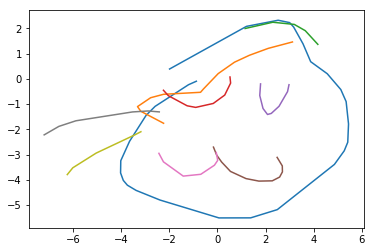

epoch 31601 in 0.177 s: loss = -0.4165, LR = -0.4490, LKL = 0.0325
epoch 31602 in 0.174 s: loss = -0.4267, LR = -0.4594, LKL = 0.0327
epoch 31603 in 0.173 s: loss = -0.4718, LR = -0.5042, LKL = 0.0325
epoch 31604 in 0.174 s: loss = -0.3816, LR = -0.4139, LKL = 0.0323
epoch 31605 in 0.173 s: loss = -0.3843, LR = -0.4169, LKL = 0.0326
epoch 31606 in 0.173 s: loss = -0.3902, LR = -0.4226, LKL = 0.0325
epoch 31607 in 0.171 s: loss = -0.4065, LR = -0.4388, LKL = 0.0323
epoch 31608 in 0.174 s: loss = -0.4246, LR = -0.4572, LKL = 0.0326
epoch 31609 in 0.175 s: loss = -0.3529, LR = -0.3854, LKL = 0.0325
epoch 31610 in 0.176 s: loss = -0.4504, LR = -0.4833, LKL = 0.0329
epoch 31611 in 0.175 s: loss = -0.4472, LR = -0.4797, LKL = 0.0326
epoch 31612 in 0.173 s: loss = -0.4542, LR = -0.4868, LKL = 0.0326
epoch 31613 in 0.173 s: loss = -0.4746, LR = -0.5071, LKL = 0.0325
epoch 31614 in 0.176 s: loss = -0.4292, LR = -0.4617, LKL = 0.0325
epoch 31615 in 0.173 s: loss = -0.3849, LR = -0.4174, LKL = 0.

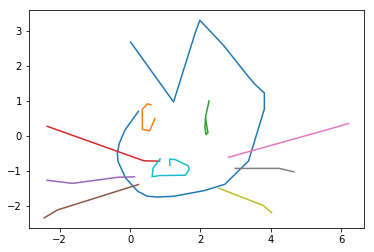

epoch 31701 in 0.178 s: loss = -0.4243, LR = -0.4567, LKL = 0.0324
epoch 31702 in 0.172 s: loss = -0.4169, LR = -0.4496, LKL = 0.0327
epoch 31703 in 0.170 s: loss = -0.4012, LR = -0.4338, LKL = 0.0326
epoch 31704 in 0.173 s: loss = -0.4510, LR = -0.4837, LKL = 0.0327
epoch 31705 in 0.175 s: loss = -0.4986, LR = -0.5312, LKL = 0.0327
epoch 31706 in 0.173 s: loss = -0.4516, LR = -0.4843, LKL = 0.0326
epoch 31707 in 0.173 s: loss = -0.4012, LR = -0.4337, LKL = 0.0325
epoch 31708 in 0.171 s: loss = -0.4385, LR = -0.4712, LKL = 0.0326
epoch 31709 in 0.174 s: loss = -0.3775, LR = -0.4098, LKL = 0.0323
epoch 31710 in 0.171 s: loss = -0.4574, LR = -0.4900, LKL = 0.0325
epoch 31711 in 0.177 s: loss = -0.4707, LR = -0.5031, LKL = 0.0325
epoch 31712 in 0.172 s: loss = -0.3931, LR = -0.4258, LKL = 0.0328
epoch 31713 in 0.171 s: loss = -0.4071, LR = -0.4397, LKL = 0.0327
epoch 31714 in 0.174 s: loss = -0.4629, LR = -0.4955, LKL = 0.0327
epoch 31715 in 0.175 s: loss = -0.4262, LR = -0.4588, LKL = 0.

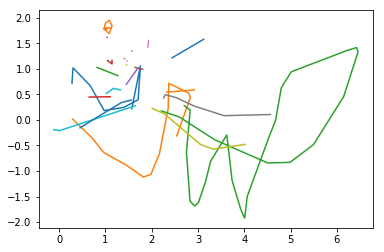

epoch 31801 in 0.176 s: loss = -0.4347, LR = -0.4673, LKL = 0.0326
epoch 31802 in 0.176 s: loss = -0.4800, LR = -0.5127, LKL = 0.0327
epoch 31803 in 0.173 s: loss = -0.4433, LR = -0.4759, LKL = 0.0326
epoch 31804 in 0.174 s: loss = -0.4652, LR = -0.4980, LKL = 0.0329
epoch 31805 in 0.174 s: loss = -0.4513, LR = -0.4838, LKL = 0.0326
epoch 31806 in 0.174 s: loss = -0.4053, LR = -0.4378, LKL = 0.0324
epoch 31807 in 0.177 s: loss = -0.3789, LR = -0.4116, LKL = 0.0327
epoch 31808 in 0.178 s: loss = -0.4182, LR = -0.4508, LKL = 0.0326
epoch 31809 in 0.174 s: loss = -0.4157, LR = -0.4485, LKL = 0.0328
epoch 31810 in 0.173 s: loss = -0.3435, LR = -0.3758, LKL = 0.0323
epoch 31811 in 0.175 s: loss = -0.4533, LR = -0.4859, LKL = 0.0326
epoch 31812 in 0.174 s: loss = -0.3470, LR = -0.3793, LKL = 0.0324
epoch 31813 in 0.174 s: loss = -0.4051, LR = -0.4377, LKL = 0.0326
epoch 31814 in 0.175 s: loss = -0.3913, LR = -0.4237, LKL = 0.0324
epoch 31815 in 0.174 s: loss = -0.4664, LR = -0.4990, LKL = 0.

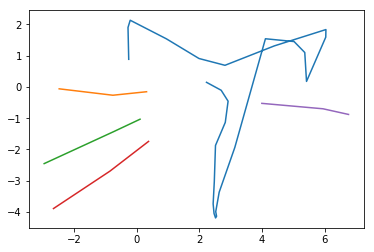

epoch 31901 in 0.175 s: loss = -0.3764, LR = -0.4089, LKL = 0.0325
epoch 31902 in 0.174 s: loss = -0.4541, LR = -0.4869, LKL = 0.0328
epoch 31903 in 0.174 s: loss = -0.4193, LR = -0.4518, LKL = 0.0324
epoch 31904 in 0.172 s: loss = -0.4615, LR = -0.4943, LKL = 0.0328
epoch 31905 in 0.171 s: loss = -0.4156, LR = -0.4483, LKL = 0.0326
epoch 31906 in 0.174 s: loss = -0.3658, LR = -0.3983, LKL = 0.0325
epoch 31907 in 0.174 s: loss = -0.3753, LR = -0.4077, LKL = 0.0324
epoch 31908 in 0.175 s: loss = -0.4078, LR = -0.4402, LKL = 0.0324
epoch 31909 in 0.173 s: loss = -0.4519, LR = -0.4848, LKL = 0.0328
epoch 31910 in 0.171 s: loss = -0.4230, LR = -0.4555, LKL = 0.0325
epoch 31911 in 0.174 s: loss = -0.3630, LR = -0.3955, LKL = 0.0325
epoch 31912 in 0.174 s: loss = -0.4250, LR = -0.4575, LKL = 0.0325
epoch 31913 in 0.173 s: loss = -0.4405, LR = -0.4730, LKL = 0.0325
epoch 31914 in 0.171 s: loss = -0.4784, LR = -0.5111, LKL = 0.0327
epoch 31915 in 0.171 s: loss = -0.3690, LR = -0.4015, LKL = 0.

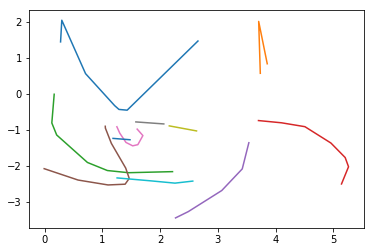

epoch 32001 in 0.174 s: loss = -0.4091, LR = -0.4419, LKL = 0.0328
epoch 32002 in 0.172 s: loss = -0.4355, LR = -0.4681, LKL = 0.0326
epoch 32003 in 0.172 s: loss = -0.3828, LR = -0.4154, LKL = 0.0326
epoch 32004 in 0.171 s: loss = -0.4667, LR = -0.4996, LKL = 0.0329
epoch 32005 in 0.172 s: loss = -0.4643, LR = -0.4970, LKL = 0.0327
epoch 32006 in 0.171 s: loss = -0.4050, LR = -0.4375, LKL = 0.0325
epoch 32007 in 0.176 s: loss = -0.4357, LR = -0.4684, LKL = 0.0327
epoch 32008 in 0.171 s: loss = -0.3829, LR = -0.4157, LKL = 0.0328
epoch 32009 in 0.173 s: loss = -0.4664, LR = -0.4991, LKL = 0.0327
epoch 32010 in 0.171 s: loss = -0.4945, LR = -0.5273, LKL = 0.0328
epoch 32011 in 0.173 s: loss = -0.4498, LR = -0.4827, LKL = 0.0329
epoch 32012 in 0.171 s: loss = -0.4036, LR = -0.4363, LKL = 0.0326
epoch 32013 in 0.173 s: loss = -0.4210, LR = -0.4538, LKL = 0.0327
epoch 32014 in 0.171 s: loss = -0.4753, LR = -0.5080, LKL = 0.0327
epoch 32015 in 0.172 s: loss = -0.4079, LR = -0.4406, LKL = 0.

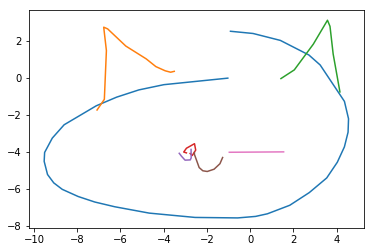

epoch 32101 in 0.174 s: loss = -0.4818, LR = -0.5147, LKL = 0.0329
epoch 32102 in 0.175 s: loss = -0.4527, LR = -0.4854, LKL = 0.0327
epoch 32103 in 0.174 s: loss = -0.3670, LR = -0.3994, LKL = 0.0324
epoch 32104 in 0.174 s: loss = -0.4104, LR = -0.4429, LKL = 0.0325
epoch 32105 in 0.171 s: loss = -0.4363, LR = -0.4691, LKL = 0.0327
epoch 32106 in 0.174 s: loss = -0.4016, LR = -0.4342, LKL = 0.0326
epoch 32107 in 0.177 s: loss = -0.4195, LR = -0.4522, LKL = 0.0327
epoch 32108 in 0.174 s: loss = -0.4671, LR = -0.5001, LKL = 0.0330
epoch 32109 in 0.175 s: loss = -0.3923, LR = -0.4250, LKL = 0.0326
epoch 32110 in 0.171 s: loss = -0.4071, LR = -0.4398, LKL = 0.0327
epoch 32111 in 0.173 s: loss = -0.4359, LR = -0.4687, LKL = 0.0328
epoch 32112 in 0.174 s: loss = -0.4730, LR = -0.5056, LKL = 0.0327
epoch 32113 in 0.174 s: loss = -0.3965, LR = -0.4291, LKL = 0.0326
epoch 32114 in 0.174 s: loss = -0.3696, LR = -0.4021, LKL = 0.0324
epoch 32115 in 0.171 s: loss = -0.4785, LR = -0.5113, LKL = 0.

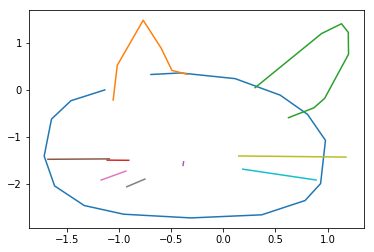

epoch 32201 in 0.174 s: loss = -0.4435, LR = -0.4763, LKL = 0.0328
epoch 32202 in 0.178 s: loss = -0.4746, LR = -0.5074, LKL = 0.0328
epoch 32203 in 0.171 s: loss = -0.4776, LR = -0.5105, LKL = 0.0329
epoch 32204 in 0.171 s: loss = -0.3909, LR = -0.4234, LKL = 0.0325
epoch 32205 in 0.173 s: loss = -0.3936, LR = -0.4261, LKL = 0.0325
epoch 32206 in 0.174 s: loss = -0.3762, LR = -0.4086, LKL = 0.0324
epoch 32207 in 0.175 s: loss = -0.4513, LR = -0.4841, LKL = 0.0328
epoch 32208 in 0.173 s: loss = -0.4424, LR = -0.4752, LKL = 0.0328
epoch 32209 in 0.171 s: loss = -0.4169, LR = -0.4495, LKL = 0.0325
epoch 32210 in 0.173 s: loss = -0.4433, LR = -0.4759, LKL = 0.0326
epoch 32211 in 0.174 s: loss = -0.3685, LR = -0.4011, LKL = 0.0326
epoch 32212 in 0.178 s: loss = -0.3682, LR = -0.4009, LKL = 0.0327
epoch 32213 in 0.171 s: loss = -0.4075, LR = -0.4400, LKL = 0.0326
epoch 32214 in 0.172 s: loss = -0.5028, LR = -0.5358, LKL = 0.0330
epoch 32215 in 0.174 s: loss = -0.4470, LR = -0.4797, LKL = 0.

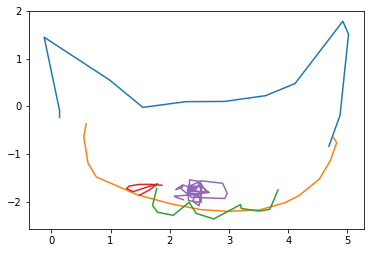

epoch 32301 in 0.176 s: loss = -0.4355, LR = -0.4683, LKL = 0.0328
epoch 32302 in 0.175 s: loss = -0.4183, LR = -0.4510, LKL = 0.0327
epoch 32303 in 0.175 s: loss = -0.4207, LR = -0.4532, LKL = 0.0325
epoch 32304 in 0.172 s: loss = -0.5285, LR = -0.5615, LKL = 0.0330
epoch 32305 in 0.174 s: loss = -0.4124, LR = -0.4450, LKL = 0.0326
epoch 32306 in 0.174 s: loss = -0.4531, LR = -0.4860, LKL = 0.0328
epoch 32307 in 0.175 s: loss = -0.4812, LR = -0.5141, LKL = 0.0328
epoch 32308 in 0.174 s: loss = -0.4755, LR = -0.5084, LKL = 0.0328
epoch 32309 in 0.173 s: loss = -0.5203, LR = -0.5532, LKL = 0.0329
epoch 32310 in 0.173 s: loss = -0.4625, LR = -0.4952, LKL = 0.0328
epoch 32311 in 0.174 s: loss = -0.4845, LR = -0.5172, LKL = 0.0327
epoch 32312 in 0.174 s: loss = -0.4525, LR = -0.4854, LKL = 0.0329
epoch 32313 in 0.176 s: loss = -0.4310, LR = -0.4635, LKL = 0.0325
epoch 32314 in 0.172 s: loss = -0.4417, LR = -0.4744, LKL = 0.0327
epoch 32315 in 0.174 s: loss = -0.4323, LR = -0.4648, LKL = 0.

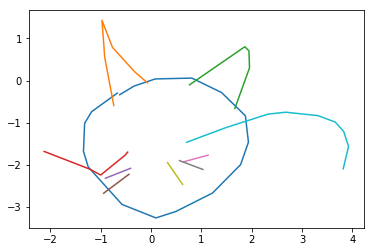

epoch 32401 in 0.176 s: loss = -0.4842, LR = -0.5171, LKL = 0.0328
epoch 32402 in 0.173 s: loss = -0.5108, LR = -0.5438, LKL = 0.0330
epoch 32403 in 0.173 s: loss = -0.4501, LR = -0.4828, LKL = 0.0327
epoch 32404 in 0.174 s: loss = -0.4301, LR = -0.4629, LKL = 0.0328
epoch 32405 in 0.175 s: loss = -0.4363, LR = -0.4689, LKL = 0.0326
epoch 32406 in 0.174 s: loss = -0.4359, LR = -0.4687, LKL = 0.0328
epoch 32407 in 0.173 s: loss = -0.4255, LR = -0.4582, LKL = 0.0328
epoch 32408 in 0.174 s: loss = -0.3328, LR = -0.3654, LKL = 0.0326
epoch 32409 in 0.177 s: loss = -0.4730, LR = -0.5058, LKL = 0.0328
epoch 32410 in 0.171 s: loss = -0.4423, LR = -0.4751, LKL = 0.0328
epoch 32411 in 0.174 s: loss = -0.4031, LR = -0.4358, LKL = 0.0328
epoch 32412 in 0.173 s: loss = -0.4498, LR = -0.4825, LKL = 0.0327
epoch 32413 in 0.174 s: loss = -0.4527, LR = -0.4853, LKL = 0.0326
epoch 32414 in 0.173 s: loss = -0.3820, LR = -0.4147, LKL = 0.0327
epoch 32415 in 0.175 s: loss = -0.4114, LR = -0.4440, LKL = 0.

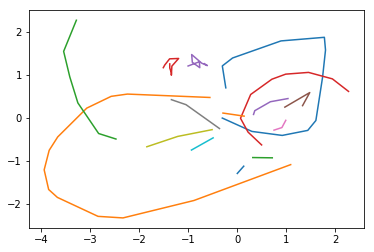

epoch 32501 in 0.176 s: loss = -0.4470, LR = -0.4799, LKL = 0.0329
epoch 32502 in 0.175 s: loss = -0.4957, LR = -0.5287, LKL = 0.0330
epoch 32503 in 0.174 s: loss = -0.4476, LR = -0.4803, LKL = 0.0327
epoch 32504 in 0.171 s: loss = -0.5049, LR = -0.5378, LKL = 0.0328
epoch 32505 in 0.174 s: loss = -0.4196, LR = -0.4523, LKL = 0.0327
epoch 32506 in 0.173 s: loss = -0.4317, LR = -0.4645, LKL = 0.0328
epoch 32507 in 0.174 s: loss = -0.4013, LR = -0.4340, LKL = 0.0327
epoch 32508 in 0.173 s: loss = -0.4293, LR = -0.4620, LKL = 0.0328
epoch 32509 in 0.172 s: loss = -0.3881, LR = -0.4209, LKL = 0.0328
epoch 32510 in 0.172 s: loss = -0.4150, LR = -0.4476, LKL = 0.0327
epoch 32511 in 0.175 s: loss = -0.4580, LR = -0.4907, LKL = 0.0327
epoch 32512 in 0.173 s: loss = -0.4299, LR = -0.4627, LKL = 0.0327
epoch 32513 in 0.174 s: loss = -0.4789, LR = -0.5118, LKL = 0.0329
epoch 32514 in 0.171 s: loss = -0.5085, LR = -0.5417, LKL = 0.0331
epoch 32515 in 0.173 s: loss = -0.4294, LR = -0.4622, LKL = 0.

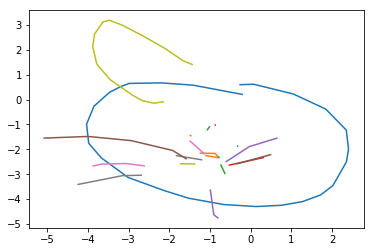

epoch 32601 in 0.175 s: loss = -0.3942, LR = -0.4270, LKL = 0.0328
epoch 32602 in 0.173 s: loss = -0.4031, LR = -0.4359, LKL = 0.0328
epoch 32603 in 0.173 s: loss = -0.4500, LR = -0.4827, LKL = 0.0328
epoch 32604 in 0.173 s: loss = -0.4576, LR = -0.4903, LKL = 0.0327
epoch 32605 in 0.173 s: loss = -0.4332, LR = -0.4662, LKL = 0.0330
epoch 32606 in 0.173 s: loss = -0.4816, LR = -0.5145, LKL = 0.0328
epoch 32607 in 0.177 s: loss = -0.4233, LR = -0.4559, LKL = 0.0326
epoch 32608 in 0.174 s: loss = -0.5314, LR = -0.5645, LKL = 0.0330
epoch 32609 in 0.173 s: loss = -0.4315, LR = -0.4643, LKL = 0.0327
epoch 32610 in 0.176 s: loss = -0.3821, LR = -0.4147, LKL = 0.0326
epoch 32611 in 0.174 s: loss = -0.3909, LR = -0.4235, LKL = 0.0327
epoch 32612 in 0.173 s: loss = -0.3823, LR = -0.4149, LKL = 0.0326
epoch 32613 in 0.174 s: loss = -0.4096, LR = -0.4425, LKL = 0.0329
epoch 32614 in 0.173 s: loss = -0.5213, LR = -0.5541, LKL = 0.0328
epoch 32615 in 0.173 s: loss = -0.3926, LR = -0.4253, LKL = 0.

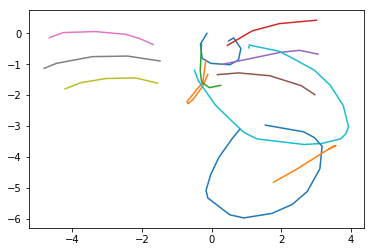

epoch 32701 in 0.174 s: loss = -0.4256, LR = -0.4583, LKL = 0.0327
epoch 32702 in 0.173 s: loss = -0.4305, LR = -0.4634, LKL = 0.0329
epoch 32703 in 0.175 s: loss = -0.4525, LR = -0.4856, LKL = 0.0331
epoch 32704 in 0.174 s: loss = -0.4364, LR = -0.4692, LKL = 0.0328
epoch 32705 in 0.174 s: loss = -0.4549, LR = -0.4876, LKL = 0.0327
epoch 32706 in 0.172 s: loss = -0.4543, LR = -0.4873, LKL = 0.0330
epoch 32707 in 0.172 s: loss = -0.5011, LR = -0.5342, LKL = 0.0330
epoch 32708 in 0.174 s: loss = -0.3811, LR = -0.4139, LKL = 0.0329
epoch 32709 in 0.173 s: loss = -0.3931, LR = -0.4256, LKL = 0.0325
epoch 32710 in 0.173 s: loss = -0.3958, LR = -0.4287, LKL = 0.0329
epoch 32711 in 0.174 s: loss = -0.4879, LR = -0.5208, LKL = 0.0329
epoch 32712 in 0.173 s: loss = -0.3528, LR = -0.3854, LKL = 0.0327
epoch 32713 in 0.176 s: loss = -0.3994, LR = -0.4321, LKL = 0.0326
epoch 32714 in 0.174 s: loss = -0.3869, LR = -0.4197, LKL = 0.0327
epoch 32715 in 0.174 s: loss = -0.3458, LR = -0.3784, LKL = 0.

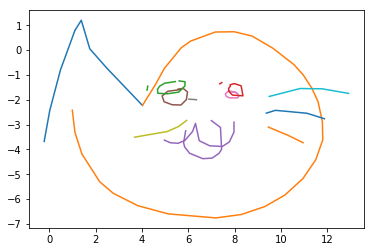

epoch 32801 in 0.172 s: loss = -0.4360, LR = -0.4688, LKL = 0.0327
epoch 32802 in 0.173 s: loss = -0.3991, LR = -0.4318, LKL = 0.0327
epoch 32803 in 0.173 s: loss = -0.4672, LR = -0.4999, LKL = 0.0327
epoch 32804 in 0.174 s: loss = -0.4056, LR = -0.4385, LKL = 0.0329
epoch 32805 in 0.172 s: loss = -0.4222, LR = -0.4552, LKL = 0.0330
epoch 32806 in 0.171 s: loss = -0.4374, LR = -0.4701, LKL = 0.0328
epoch 32807 in 0.174 s: loss = -0.4369, LR = -0.4699, LKL = 0.0330
epoch 32808 in 0.173 s: loss = -0.4098, LR = -0.4425, LKL = 0.0327
epoch 32809 in 0.175 s: loss = -0.4183, LR = -0.4511, LKL = 0.0328
epoch 32810 in 0.171 s: loss = -0.4485, LR = -0.4813, LKL = 0.0328
epoch 32811 in 0.171 s: loss = -0.4257, LR = -0.4585, LKL = 0.0328
epoch 32812 in 0.174 s: loss = -0.4503, LR = -0.4831, LKL = 0.0328
epoch 32813 in 0.173 s: loss = -0.4240, LR = -0.4568, LKL = 0.0328
epoch 32814 in 0.173 s: loss = -0.4704, LR = -0.5034, LKL = 0.0330
epoch 32815 in 0.173 s: loss = -0.4489, LR = -0.4816, LKL = 0.

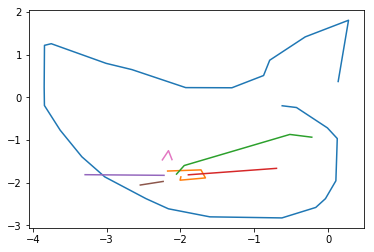

epoch 32901 in 0.175 s: loss = -0.3841, LR = -0.4168, LKL = 0.0327
epoch 32902 in 0.178 s: loss = -0.3686, LR = -0.4015, LKL = 0.0328
epoch 32903 in 0.175 s: loss = -0.4429, LR = -0.4756, LKL = 0.0327
epoch 32904 in 0.175 s: loss = -0.4062, LR = -0.4390, LKL = 0.0327
epoch 32905 in 0.172 s: loss = -0.4400, LR = -0.4728, LKL = 0.0328
epoch 32906 in 0.175 s: loss = -0.3727, LR = -0.4052, LKL = 0.0325
epoch 32907 in 0.174 s: loss = -0.4885, LR = -0.5213, LKL = 0.0327
epoch 32908 in 0.175 s: loss = -0.4902, LR = -0.5233, LKL = 0.0331
epoch 32909 in 0.175 s: loss = -0.4472, LR = -0.4801, LKL = 0.0328
epoch 32910 in 0.175 s: loss = -0.4071, LR = -0.4398, LKL = 0.0327
epoch 32911 in 0.174 s: loss = -0.4275, LR = -0.4604, LKL = 0.0329
epoch 32912 in 0.178 s: loss = -0.4160, LR = -0.4489, LKL = 0.0329
epoch 32913 in 0.175 s: loss = -0.4264, LR = -0.4590, LKL = 0.0326
epoch 32914 in 0.176 s: loss = -0.4574, LR = -0.4902, LKL = 0.0328
epoch 32915 in 0.174 s: loss = -0.4161, LR = -0.4488, LKL = 0.

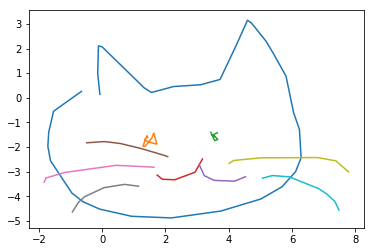

epoch 33001 in 0.175 s: loss = -0.4180, LR = -0.4505, LKL = 0.0325
epoch 33002 in 0.174 s: loss = -0.4461, LR = -0.4791, LKL = 0.0329
epoch 33003 in 0.171 s: loss = -0.5015, LR = -0.5348, LKL = 0.0333
epoch 33004 in 0.173 s: loss = -0.3734, LR = -0.4062, LKL = 0.0328
epoch 33005 in 0.173 s: loss = -0.4462, LR = -0.4792, LKL = 0.0330
epoch 33006 in 0.175 s: loss = -0.4251, LR = -0.4580, LKL = 0.0329
epoch 33007 in 0.171 s: loss = -0.4677, LR = -0.5008, LKL = 0.0331
epoch 33008 in 0.176 s: loss = -0.3920, LR = -0.4249, LKL = 0.0328
epoch 33009 in 0.171 s: loss = -0.4450, LR = -0.4778, LKL = 0.0328
epoch 33010 in 0.173 s: loss = -0.4176, LR = -0.4503, LKL = 0.0327
epoch 33011 in 0.173 s: loss = -0.4331, LR = -0.4661, LKL = 0.0330
epoch 33012 in 0.174 s: loss = -0.3883, LR = -0.4209, LKL = 0.0327
epoch 33013 in 0.171 s: loss = -0.4639, LR = -0.4969, LKL = 0.0330
epoch 33014 in 0.172 s: loss = -0.4231, LR = -0.4558, LKL = 0.0327
epoch 33015 in 0.172 s: loss = -0.3785, LR = -0.4111, LKL = 0.

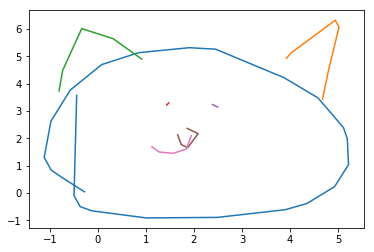

epoch 33101 in 0.174 s: loss = -0.4878, LR = -0.5208, LKL = 0.0330
epoch 33102 in 0.177 s: loss = -0.4998, LR = -0.5330, LKL = 0.0332
epoch 33103 in 0.178 s: loss = -0.3913, LR = -0.4241, LKL = 0.0328
epoch 33104 in 0.173 s: loss = -0.5282, LR = -0.5613, LKL = 0.0331
epoch 33105 in 0.175 s: loss = -0.4680, LR = -0.5010, LKL = 0.0330
epoch 33106 in 0.175 s: loss = -0.4247, LR = -0.4575, LKL = 0.0328
epoch 33107 in 0.173 s: loss = -0.4386, LR = -0.4715, LKL = 0.0329
epoch 33108 in 0.177 s: loss = -0.4333, LR = -0.4659, LKL = 0.0326
epoch 33109 in 0.174 s: loss = -0.4300, LR = -0.4626, LKL = 0.0327
epoch 33110 in 0.174 s: loss = -0.4371, LR = -0.4700, LKL = 0.0329
epoch 33111 in 0.172 s: loss = -0.4475, LR = -0.4805, LKL = 0.0330
epoch 33112 in 0.177 s: loss = -0.4105, LR = -0.4433, LKL = 0.0328
epoch 33113 in 0.178 s: loss = -0.4469, LR = -0.4799, LKL = 0.0330
epoch 33114 in 0.173 s: loss = -0.4602, LR = -0.4931, LKL = 0.0329
epoch 33115 in 0.175 s: loss = -0.3850, LR = -0.4181, LKL = 0.

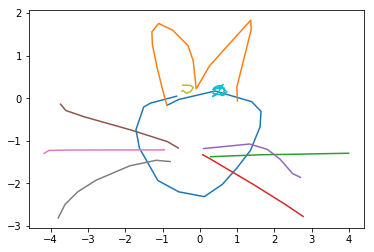

epoch 33201 in 0.174 s: loss = -0.4583, LR = -0.4914, LKL = 0.0330
epoch 33202 in 0.173 s: loss = -0.4672, LR = -0.5002, LKL = 0.0330
epoch 33203 in 0.176 s: loss = -0.4120, LR = -0.4450, LKL = 0.0329
epoch 33204 in 0.172 s: loss = -0.4376, LR = -0.4702, LKL = 0.0326
epoch 33205 in 0.173 s: loss = -0.4329, LR = -0.4657, LKL = 0.0328
epoch 33206 in 0.173 s: loss = -0.4347, LR = -0.4674, LKL = 0.0327
epoch 33207 in 0.174 s: loss = -0.4662, LR = -0.4992, LKL = 0.0330
epoch 33208 in 0.176 s: loss = -0.4389, LR = -0.4716, LKL = 0.0327
epoch 33209 in 0.173 s: loss = -0.4799, LR = -0.5129, LKL = 0.0329
epoch 33210 in 0.174 s: loss = -0.4762, LR = -0.5089, LKL = 0.0327
epoch 33211 in 0.172 s: loss = -0.4230, LR = -0.4559, LKL = 0.0329
epoch 33212 in 0.173 s: loss = -0.5031, LR = -0.5362, LKL = 0.0330
epoch 33213 in 0.176 s: loss = -0.4206, LR = -0.4534, LKL = 0.0328
epoch 33214 in 0.173 s: loss = -0.3816, LR = -0.4141, LKL = 0.0325
epoch 33215 in 0.173 s: loss = -0.4481, LR = -0.4811, LKL = 0.

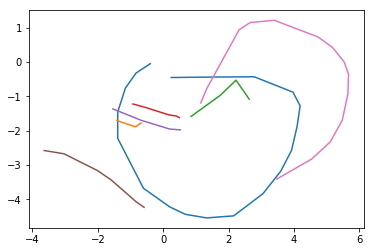

epoch 33301 in 0.178 s: loss = -0.4192, LR = -0.4520, LKL = 0.0329
epoch 33302 in 0.175 s: loss = -0.4235, LR = -0.4566, LKL = 0.0331
epoch 33303 in 0.173 s: loss = -0.3929, LR = -0.4258, LKL = 0.0329
epoch 33304 in 0.174 s: loss = -0.4244, LR = -0.4571, LKL = 0.0327
epoch 33305 in 0.172 s: loss = -0.4057, LR = -0.4385, LKL = 0.0329
epoch 33306 in 0.174 s: loss = -0.4271, LR = -0.4602, LKL = 0.0332
epoch 33307 in 0.174 s: loss = -0.4711, LR = -0.5041, LKL = 0.0330
epoch 33308 in 0.172 s: loss = -0.4582, LR = -0.4911, LKL = 0.0329
epoch 33309 in 0.173 s: loss = -0.5021, LR = -0.5353, LKL = 0.0332
epoch 33310 in 0.173 s: loss = -0.4425, LR = -0.4756, LKL = 0.0331
epoch 33311 in 0.177 s: loss = -0.3901, LR = -0.4228, LKL = 0.0327
epoch 33312 in 0.175 s: loss = -0.4049, LR = -0.4376, LKL = 0.0327
epoch 33313 in 0.174 s: loss = -0.3723, LR = -0.4047, LKL = 0.0324
epoch 33314 in 0.174 s: loss = -0.4756, LR = -0.5086, LKL = 0.0331
epoch 33315 in 0.172 s: loss = -0.3704, LR = -0.4033, LKL = 0.

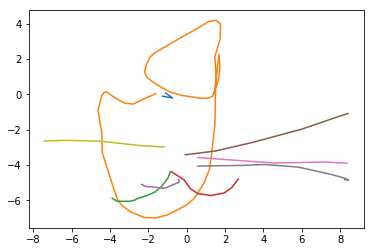

epoch 33401 in 0.178 s: loss = -0.4978, LR = -0.5309, LKL = 0.0331
epoch 33402 in 0.172 s: loss = -0.4120, LR = -0.4449, LKL = 0.0329
epoch 33403 in 0.175 s: loss = -0.4536, LR = -0.4865, LKL = 0.0328
epoch 33404 in 0.172 s: loss = -0.4415, LR = -0.4742, LKL = 0.0327
epoch 33405 in 0.174 s: loss = -0.4017, LR = -0.4345, LKL = 0.0328
epoch 33406 in 0.175 s: loss = -0.4482, LR = -0.4812, LKL = 0.0330
epoch 33407 in 0.173 s: loss = -0.4751, LR = -0.5080, LKL = 0.0329
epoch 33408 in 0.174 s: loss = -0.4868, LR = -0.5201, LKL = 0.0333
epoch 33409 in 0.175 s: loss = -0.4299, LR = -0.4627, LKL = 0.0328
epoch 33410 in 0.174 s: loss = -0.4483, LR = -0.4813, LKL = 0.0329
epoch 33411 in 0.176 s: loss = -0.3899, LR = -0.4228, LKL = 0.0328
epoch 33412 in 0.171 s: loss = -0.4561, LR = -0.4892, LKL = 0.0331
epoch 33413 in 0.175 s: loss = -0.4675, LR = -0.5004, LKL = 0.0330
epoch 33414 in 0.172 s: loss = -0.4576, LR = -0.4903, LKL = 0.0328
epoch 33415 in 0.174 s: loss = -0.3895, LR = -0.4223, LKL = 0.

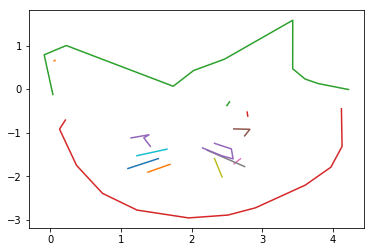

epoch 33501 in 0.179 s: loss = -0.4325, LR = -0.4653, LKL = 0.0328
epoch 33502 in 0.175 s: loss = -0.4436, LR = -0.4765, LKL = 0.0329
epoch 33503 in 0.174 s: loss = -0.3776, LR = -0.4104, LKL = 0.0329
epoch 33504 in 0.174 s: loss = -0.4752, LR = -0.5082, LKL = 0.0330
epoch 33505 in 0.172 s: loss = -0.4766, LR = -0.5095, LKL = 0.0330
epoch 33506 in 0.174 s: loss = -0.4480, LR = -0.4811, LKL = 0.0332
epoch 33507 in 0.175 s: loss = -0.4838, LR = -0.5168, LKL = 0.0331
epoch 33508 in 0.172 s: loss = -0.4439, LR = -0.4772, LKL = 0.0333
epoch 33509 in 0.173 s: loss = -0.4394, LR = -0.4724, LKL = 0.0329
epoch 33510 in 0.173 s: loss = -0.4185, LR = -0.4514, LKL = 0.0329
epoch 33511 in 0.177 s: loss = -0.5056, LR = -0.5387, LKL = 0.0331
epoch 33512 in 0.175 s: loss = -0.4627, LR = -0.4959, LKL = 0.0332
epoch 33513 in 0.173 s: loss = -0.4989, LR = -0.5318, LKL = 0.0329
epoch 33514 in 0.174 s: loss = -0.3824, LR = -0.4152, LKL = 0.0328
epoch 33515 in 0.171 s: loss = -0.3288, LR = -0.3614, LKL = 0.

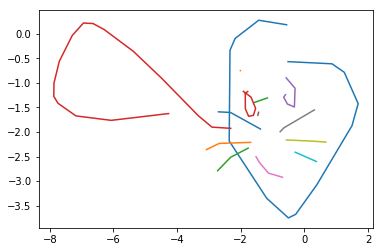

epoch 33601 in 0.176 s: loss = -0.3953, LR = -0.4280, LKL = 0.0326
epoch 33602 in 0.174 s: loss = -0.4473, LR = -0.4805, LKL = 0.0332
epoch 33603 in 0.176 s: loss = -0.4381, LR = -0.4710, LKL = 0.0329
epoch 33604 in 0.175 s: loss = -0.3850, LR = -0.4179, LKL = 0.0328
epoch 33605 in 0.175 s: loss = -0.4626, LR = -0.4954, LKL = 0.0328
epoch 33606 in 0.176 s: loss = -0.3925, LR = -0.4252, LKL = 0.0327
epoch 33607 in 0.177 s: loss = -0.4778, LR = -0.5109, LKL = 0.0331
epoch 33608 in 0.174 s: loss = -0.4696, LR = -0.5026, LKL = 0.0330
epoch 33609 in 0.173 s: loss = -0.4650, LR = -0.4980, LKL = 0.0330
epoch 33610 in 0.174 s: loss = -0.4496, LR = -0.4825, LKL = 0.0329
epoch 33611 in 0.175 s: loss = -0.4666, LR = -0.4998, LKL = 0.0331
epoch 33612 in 0.174 s: loss = -0.4169, LR = -0.4497, LKL = 0.0329
epoch 33613 in 0.176 s: loss = -0.4142, LR = -0.4473, LKL = 0.0330
epoch 33614 in 0.175 s: loss = -0.4672, LR = -0.5003, LKL = 0.0331
epoch 33615 in 0.175 s: loss = -0.4265, LR = -0.4595, LKL = 0.

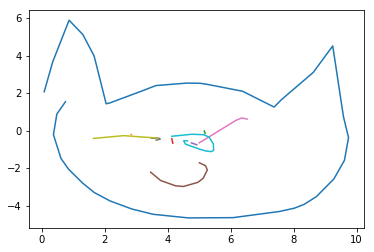

epoch 33701 in 0.180 s: loss = -0.3955, LR = -0.4284, LKL = 0.0328
epoch 33702 in 0.173 s: loss = -0.4234, LR = -0.4564, LKL = 0.0330
epoch 33703 in 0.171 s: loss = -0.3674, LR = -0.4003, LKL = 0.0329
epoch 33704 in 0.173 s: loss = -0.4813, LR = -0.5145, LKL = 0.0332
epoch 33705 in 0.177 s: loss = -0.4417, LR = -0.4745, LKL = 0.0328
epoch 33706 in 0.175 s: loss = -0.3560, LR = -0.3888, LKL = 0.0328
epoch 33707 in 0.174 s: loss = -0.4694, LR = -0.5025, LKL = 0.0331
epoch 33708 in 0.171 s: loss = -0.4632, LR = -0.4962, LKL = 0.0330
epoch 33709 in 0.175 s: loss = -0.4377, LR = -0.4707, LKL = 0.0330
epoch 33710 in 0.173 s: loss = -0.4050, LR = -0.4376, LKL = 0.0326
epoch 33711 in 0.177 s: loss = -0.4919, LR = -0.5249, LKL = 0.0330
epoch 33712 in 0.172 s: loss = -0.4416, LR = -0.4747, LKL = 0.0331
epoch 33713 in 0.171 s: loss = -0.4414, LR = -0.4745, LKL = 0.0330
epoch 33714 in 0.173 s: loss = -0.3464, LR = -0.3793, LKL = 0.0329
epoch 33715 in 0.176 s: loss = -0.4275, LR = -0.4604, LKL = 0.

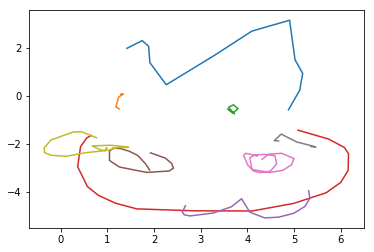

epoch 33801 in 0.179 s: loss = -0.4082, LR = -0.4411, LKL = 0.0329
epoch 33802 in 0.171 s: loss = -0.4087, LR = -0.4418, LKL = 0.0331
epoch 33803 in 0.173 s: loss = -0.4944, LR = -0.5273, LKL = 0.0330
epoch 33804 in 0.172 s: loss = -0.3738, LR = -0.4065, LKL = 0.0327
epoch 33805 in 0.175 s: loss = -0.3825, LR = -0.4152, LKL = 0.0327
epoch 33806 in 0.173 s: loss = -0.3876, LR = -0.4206, LKL = 0.0330
epoch 33807 in 0.176 s: loss = -0.3967, LR = -0.4296, LKL = 0.0329
epoch 33808 in 0.172 s: loss = -0.4158, LR = -0.4489, LKL = 0.0332
epoch 33809 in 0.173 s: loss = -0.4569, LR = -0.4901, LKL = 0.0332
epoch 33810 in 0.172 s: loss = -0.3342, LR = -0.3669, LKL = 0.0327
epoch 33811 in 0.177 s: loss = -0.4511, LR = -0.4842, LKL = 0.0331
epoch 33812 in 0.171 s: loss = -0.4381, LR = -0.4710, LKL = 0.0329
epoch 33813 in 0.173 s: loss = -0.4261, LR = -0.4591, LKL = 0.0330
epoch 33814 in 0.172 s: loss = -0.4783, LR = -0.5114, LKL = 0.0332
epoch 33815 in 0.175 s: loss = -0.4551, LR = -0.4878, LKL = 0.

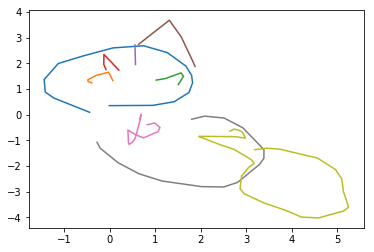

epoch 33901 in 0.175 s: loss = -0.4653, LR = -0.4982, LKL = 0.0329
epoch 33902 in 0.174 s: loss = -0.4822, LR = -0.5154, LKL = 0.0333
epoch 33903 in 0.173 s: loss = -0.4698, LR = -0.5030, LKL = 0.0333
epoch 33904 in 0.174 s: loss = -0.4606, LR = -0.4936, LKL = 0.0330
epoch 33905 in 0.176 s: loss = -0.4522, LR = -0.4852, LKL = 0.0330
epoch 33906 in 0.175 s: loss = -0.3564, LR = -0.3894, LKL = 0.0330
epoch 33907 in 0.174 s: loss = -0.3903, LR = -0.4230, LKL = 0.0327
epoch 33908 in 0.173 s: loss = -0.4093, LR = -0.4422, LKL = 0.0329
epoch 33909 in 0.176 s: loss = -0.4478, LR = -0.4809, LKL = 0.0331
epoch 33910 in 0.173 s: loss = -0.3783, LR = -0.4110, LKL = 0.0328
epoch 33911 in 0.173 s: loss = -0.4516, LR = -0.4847, LKL = 0.0331
epoch 33912 in 0.174 s: loss = -0.3961, LR = -0.4289, LKL = 0.0328
epoch 33913 in 0.173 s: loss = -0.4773, LR = -0.5105, LKL = 0.0332
epoch 33914 in 0.173 s: loss = -0.4064, LR = -0.4391, LKL = 0.0328
epoch 33915 in 0.176 s: loss = -0.4036, LR = -0.4364, LKL = 0.

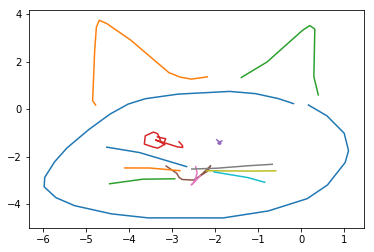

epoch 34001 in 0.181 s: loss = -0.4222, LR = -0.4552, LKL = 0.0331
epoch 34002 in 0.172 s: loss = -0.4682, LR = -0.5013, LKL = 0.0330
epoch 34003 in 0.173 s: loss = -0.4689, LR = -0.5021, LKL = 0.0332
epoch 34004 in 0.172 s: loss = -0.4976, LR = -0.5310, LKL = 0.0334
epoch 34005 in 0.173 s: loss = -0.4568, LR = -0.4898, LKL = 0.0330
epoch 34006 in 0.174 s: loss = -0.4175, LR = -0.4505, LKL = 0.0331
epoch 34007 in 0.173 s: loss = -0.5169, LR = -0.5501, LKL = 0.0332
epoch 34008 in 0.173 s: loss = -0.4596, LR = -0.4929, LKL = 0.0333
epoch 34009 in 0.173 s: loss = -0.4112, LR = -0.4442, LKL = 0.0329
epoch 34010 in 0.171 s: loss = -0.4639, LR = -0.4971, LKL = 0.0332
epoch 34011 in 0.178 s: loss = -0.4402, LR = -0.4731, LKL = 0.0329
epoch 34012 in 0.171 s: loss = -0.4844, LR = -0.5174, LKL = 0.0330
epoch 34013 in 0.173 s: loss = -0.4517, LR = -0.4847, LKL = 0.0329
epoch 34014 in 0.172 s: loss = -0.4428, LR = -0.4759, LKL = 0.0331
epoch 34015 in 0.173 s: loss = -0.4539, LR = -0.4868, LKL = 0.

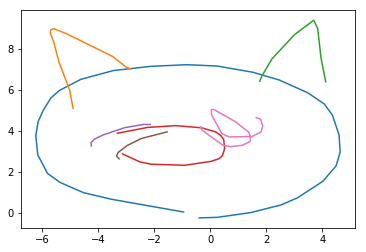

epoch 34101 in 0.179 s: loss = -0.4604, LR = -0.4933, LKL = 0.0329
epoch 34102 in 0.175 s: loss = -0.4355, LR = -0.4686, LKL = 0.0331
epoch 34103 in 0.178 s: loss = -0.4317, LR = -0.4649, LKL = 0.0332
epoch 34104 in 0.176 s: loss = -0.4480, LR = -0.4813, LKL = 0.0333
epoch 34105 in 0.176 s: loss = -0.3899, LR = -0.4230, LKL = 0.0331
epoch 34106 in 0.176 s: loss = -0.4513, LR = -0.4845, LKL = 0.0332
epoch 34107 in 0.179 s: loss = -0.4349, LR = -0.4679, LKL = 0.0330
epoch 34108 in 0.176 s: loss = -0.4903, LR = -0.5236, LKL = 0.0332
epoch 34109 in 0.174 s: loss = -0.4034, LR = -0.4362, LKL = 0.0328
epoch 34110 in 0.175 s: loss = -0.4796, LR = -0.5127, LKL = 0.0331
epoch 34111 in 0.178 s: loss = -0.4715, LR = -0.5047, LKL = 0.0333
epoch 34112 in 0.175 s: loss = -0.4015, LR = -0.4345, LKL = 0.0330
epoch 34113 in 0.177 s: loss = -0.4351, LR = -0.4683, LKL = 0.0332
epoch 34114 in 0.176 s: loss = -0.4450, LR = -0.4779, LKL = 0.0329
epoch 34115 in 0.176 s: loss = -0.4341, LR = -0.4669, LKL = 0.

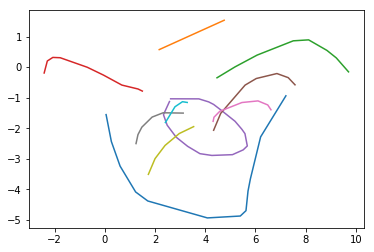

epoch 34201 in 0.175 s: loss = -0.4327, LR = -0.4656, LKL = 0.0329
epoch 34202 in 0.175 s: loss = -0.4084, LR = -0.4412, LKL = 0.0328
epoch 34203 in 0.173 s: loss = -0.4404, LR = -0.4734, LKL = 0.0330
epoch 34204 in 0.174 s: loss = -0.4714, LR = -0.5048, LKL = 0.0334
epoch 34205 in 0.175 s: loss = -0.3638, LR = -0.3966, LKL = 0.0328
epoch 34206 in 0.174 s: loss = -0.4408, LR = -0.4737, LKL = 0.0330
epoch 34207 in 0.172 s: loss = -0.4770, LR = -0.5102, LKL = 0.0332
epoch 34208 in 0.173 s: loss = -0.4408, LR = -0.4739, LKL = 0.0330
epoch 34209 in 0.172 s: loss = -0.4519, LR = -0.4851, LKL = 0.0332
epoch 34210 in 0.173 s: loss = -0.3941, LR = -0.4271, LKL = 0.0330
epoch 34211 in 0.173 s: loss = -0.4910, LR = -0.5242, LKL = 0.0331
epoch 34212 in 0.174 s: loss = -0.4241, LR = -0.4571, LKL = 0.0330
epoch 34213 in 0.172 s: loss = -0.4903, LR = -0.5234, LKL = 0.0331
epoch 34214 in 0.173 s: loss = -0.4724, LR = -0.5057, LKL = 0.0333
epoch 34215 in 0.175 s: loss = -0.4538, LR = -0.4869, LKL = 0.

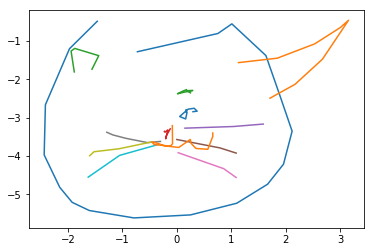

epoch 34301 in 0.173 s: loss = -0.4102, LR = -0.4432, LKL = 0.0330
epoch 34302 in 0.172 s: loss = -0.4410, LR = -0.4743, LKL = 0.0333
epoch 34303 in 0.172 s: loss = -0.4165, LR = -0.4496, LKL = 0.0331
epoch 34304 in 0.172 s: loss = -0.4023, LR = -0.4356, LKL = 0.0333
epoch 34305 in 0.171 s: loss = -0.4532, LR = -0.4864, LKL = 0.0332
epoch 34306 in 0.172 s: loss = -0.4287, LR = -0.4617, LKL = 0.0329
epoch 34307 in 0.171 s: loss = -0.4835, LR = -0.5166, LKL = 0.0331
epoch 34308 in 0.172 s: loss = -0.4920, LR = -0.5252, LKL = 0.0331
epoch 34309 in 0.172 s: loss = -0.4545, LR = -0.4877, LKL = 0.0332
epoch 34310 in 0.171 s: loss = -0.3755, LR = -0.4084, LKL = 0.0329
epoch 34311 in 0.171 s: loss = -0.3959, LR = -0.4289, LKL = 0.0330
epoch 34312 in 0.172 s: loss = -0.4950, LR = -0.5283, LKL = 0.0333
epoch 34313 in 0.172 s: loss = -0.4276, LR = -0.4608, LKL = 0.0332
epoch 34314 in 0.172 s: loss = -0.3904, LR = -0.4235, LKL = 0.0331
epoch 34315 in 0.171 s: loss = -0.4495, LR = -0.4828, LKL = 0.

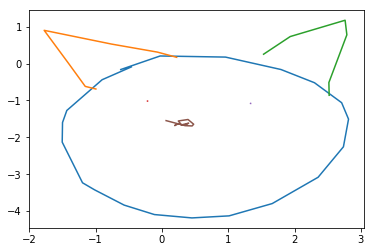

epoch 34401 in 0.176 s: loss = -0.4272, LR = -0.4604, LKL = 0.0332
epoch 34402 in 0.176 s: loss = -0.5429, LR = -0.5764, LKL = 0.0335
epoch 34403 in 0.180 s: loss = -0.4507, LR = -0.4839, LKL = 0.0332
epoch 34404 in 0.175 s: loss = -0.4605, LR = -0.4937, LKL = 0.0332
epoch 34405 in 0.172 s: loss = -0.4140, LR = -0.4471, LKL = 0.0331
epoch 34406 in 0.179 s: loss = -0.4332, LR = -0.4661, LKL = 0.0329
epoch 34407 in 0.175 s: loss = -0.4709, LR = -0.5041, LKL = 0.0332
epoch 34408 in 0.177 s: loss = -0.3907, LR = -0.4238, LKL = 0.0331
epoch 34409 in 0.175 s: loss = -0.4171, LR = -0.4502, LKL = 0.0331
epoch 34410 in 0.174 s: loss = -0.4809, LR = -0.5141, LKL = 0.0332
epoch 34411 in 0.176 s: loss = -0.5004, LR = -0.5337, LKL = 0.0333
epoch 34412 in 0.176 s: loss = -0.4114, LR = -0.4443, LKL = 0.0329
epoch 34413 in 0.180 s: loss = -0.4882, LR = -0.5215, LKL = 0.0333
epoch 34414 in 0.174 s: loss = -0.3827, LR = -0.4158, LKL = 0.0331
epoch 34415 in 0.173 s: loss = -0.4243, LR = -0.4573, LKL = 0.

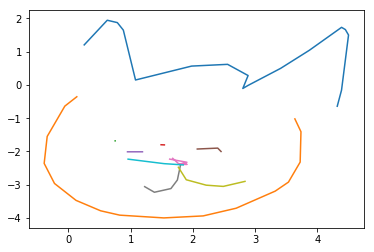

epoch 34501 in 0.177 s: loss = -0.4369, LR = -0.4700, LKL = 0.0331
epoch 34502 in 0.173 s: loss = -0.3684, LR = -0.4015, LKL = 0.0330
epoch 34503 in 0.178 s: loss = -0.4598, LR = -0.4930, LKL = 0.0332
epoch 34504 in 0.174 s: loss = -0.3876, LR = -0.4208, LKL = 0.0332
epoch 34505 in 0.171 s: loss = -0.3901, LR = -0.4232, LKL = 0.0331
epoch 34506 in 0.179 s: loss = -0.4918, LR = -0.5252, LKL = 0.0334
epoch 34507 in 0.177 s: loss = -0.4807, LR = -0.5137, LKL = 0.0330
epoch 34508 in 0.174 s: loss = -0.3705, LR = -0.4033, LKL = 0.0329
epoch 34509 in 0.173 s: loss = -0.4322, LR = -0.4651, LKL = 0.0329
epoch 34510 in 0.174 s: loss = -0.4513, LR = -0.4844, LKL = 0.0331
epoch 34511 in 0.175 s: loss = -0.4532, LR = -0.4862, LKL = 0.0330
epoch 34512 in 0.173 s: loss = -0.4075, LR = -0.4407, LKL = 0.0332
epoch 34513 in 0.178 s: loss = -0.3989, LR = -0.4317, LKL = 0.0328
epoch 34514 in 0.174 s: loss = -0.4249, LR = -0.4579, LKL = 0.0330
epoch 34515 in 0.171 s: loss = -0.4340, LR = -0.4673, LKL = 0.

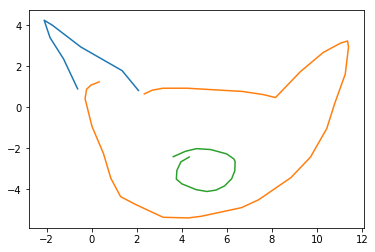

epoch 34601 in 0.175 s: loss = -0.4215, LR = -0.4545, LKL = 0.0330
epoch 34602 in 0.174 s: loss = -0.4515, LR = -0.4849, LKL = 0.0334
epoch 34603 in 0.174 s: loss = -0.4719, LR = -0.5053, LKL = 0.0333
epoch 34604 in 0.175 s: loss = -0.4182, LR = -0.4514, LKL = 0.0332
epoch 34605 in 0.175 s: loss = -0.4526, LR = -0.4858, LKL = 0.0332
epoch 34606 in 0.172 s: loss = -0.4281, LR = -0.4612, LKL = 0.0331
epoch 34607 in 0.174 s: loss = -0.4576, LR = -0.4909, LKL = 0.0334
epoch 34608 in 0.174 s: loss = -0.4409, LR = -0.4740, LKL = 0.0331
epoch 34609 in 0.178 s: loss = -0.3379, LR = -0.3712, LKL = 0.0333
epoch 34610 in 0.176 s: loss = -0.4752, LR = -0.5084, LKL = 0.0331
epoch 34611 in 0.174 s: loss = -0.4434, LR = -0.4766, LKL = 0.0332
epoch 34612 in 0.174 s: loss = -0.4991, LR = -0.5325, LKL = 0.0334
epoch 34613 in 0.174 s: loss = -0.4579, LR = -0.4909, LKL = 0.0331
epoch 34614 in 0.175 s: loss = -0.4515, LR = -0.4845, LKL = 0.0330
epoch 34615 in 0.175 s: loss = -0.4482, LR = -0.4812, LKL = 0.

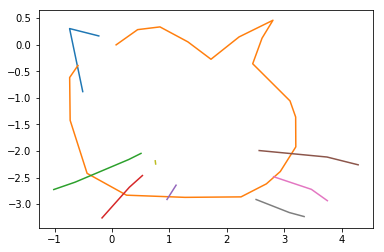

epoch 34701 in 0.179 s: loss = -0.4400, LR = -0.4732, LKL = 0.0332
epoch 34702 in 0.175 s: loss = -0.3804, LR = -0.4136, LKL = 0.0331
epoch 34703 in 0.173 s: loss = -0.4994, LR = -0.5326, LKL = 0.0332
epoch 34704 in 0.174 s: loss = -0.4819, LR = -0.5151, LKL = 0.0332
epoch 34705 in 0.173 s: loss = -0.4370, LR = -0.4701, LKL = 0.0332
epoch 34706 in 0.173 s: loss = -0.4345, LR = -0.4675, LKL = 0.0330
epoch 34707 in 0.175 s: loss = -0.3867, LR = -0.4198, LKL = 0.0331
epoch 34708 in 0.173 s: loss = -0.5169, LR = -0.5502, LKL = 0.0332
epoch 34709 in 0.171 s: loss = -0.4324, LR = -0.4656, LKL = 0.0332
epoch 34710 in 0.175 s: loss = -0.4468, LR = -0.4802, LKL = 0.0334
epoch 34711 in 0.177 s: loss = -0.5047, LR = -0.5379, LKL = 0.0332
epoch 34712 in 0.174 s: loss = -0.4812, LR = -0.5142, LKL = 0.0331
epoch 34713 in 0.173 s: loss = -0.3973, LR = -0.4305, LKL = 0.0332
epoch 34714 in 0.174 s: loss = -0.4313, LR = -0.4643, LKL = 0.0330
epoch 34715 in 0.172 s: loss = -0.4814, LR = -0.5146, LKL = 0.

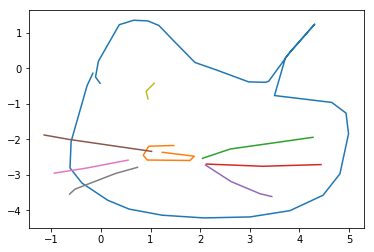

epoch 34801 in 0.194 s: loss = -0.4335, LR = -0.4666, LKL = 0.0331
epoch 34802 in 0.194 s: loss = -0.4893, LR = -0.5226, LKL = 0.0334
epoch 34803 in 0.197 s: loss = -0.4138, LR = -0.4470, LKL = 0.0332
epoch 34804 in 0.193 s: loss = -0.4683, LR = -0.5015, LKL = 0.0332
epoch 34805 in 0.197 s: loss = -0.4421, LR = -0.4754, LKL = 0.0333
epoch 34806 in 0.194 s: loss = -0.4006, LR = -0.4337, LKL = 0.0331
epoch 34807 in 0.195 s: loss = -0.4581, LR = -0.4915, LKL = 0.0334
epoch 34808 in 0.195 s: loss = -0.4450, LR = -0.4785, LKL = 0.0335
epoch 34809 in 0.193 s: loss = -0.3777, LR = -0.4107, LKL = 0.0331
epoch 34810 in 0.194 s: loss = -0.3905, LR = -0.4238, LKL = 0.0332
epoch 34811 in 0.193 s: loss = -0.4291, LR = -0.4622, LKL = 0.0331
epoch 34812 in 0.195 s: loss = -0.4440, LR = -0.4773, LKL = 0.0334
epoch 34813 in 0.196 s: loss = -0.4514, LR = -0.4847, LKL = 0.0333
epoch 34814 in 0.193 s: loss = -0.4078, LR = -0.4409, LKL = 0.0331
epoch 34815 in 0.194 s: loss = -0.4901, LR = -0.5233, LKL = 0.

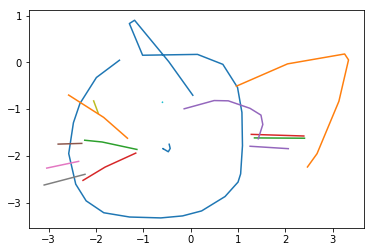

epoch 34901 in 0.195 s: loss = -0.4050, LR = -0.4379, LKL = 0.0329
epoch 34902 in 0.195 s: loss = -0.4248, LR = -0.4579, LKL = 0.0331
epoch 34903 in 0.199 s: loss = -0.4285, LR = -0.4619, LKL = 0.0334
epoch 34904 in 0.195 s: loss = -0.4458, LR = -0.4790, LKL = 0.0333
epoch 34905 in 0.193 s: loss = -0.3285, LR = -0.3616, LKL = 0.0330
epoch 34906 in 0.194 s: loss = -0.4206, LR = -0.4537, LKL = 0.0331
epoch 34907 in 0.188 s: loss = -0.4335, LR = -0.4668, LKL = 0.0333
epoch 34908 in 0.194 s: loss = -0.4053, LR = -0.4383, LKL = 0.0330
epoch 34909 in 0.192 s: loss = -0.4107, LR = -0.4441, LKL = 0.0334
epoch 34910 in 0.193 s: loss = -0.3934, LR = -0.4264, LKL = 0.0330
epoch 34911 in 0.194 s: loss = -0.4046, LR = -0.4376, LKL = 0.0329
epoch 34912 in 0.197 s: loss = -0.4649, LR = -0.4979, LKL = 0.0331
epoch 34913 in 0.197 s: loss = -0.5200, LR = -0.5535, LKL = 0.0335
epoch 34914 in 0.197 s: loss = -0.3950, LR = -0.4281, LKL = 0.0331
epoch 34915 in 0.191 s: loss = -0.4233, LR = -0.4565, LKL = 0.

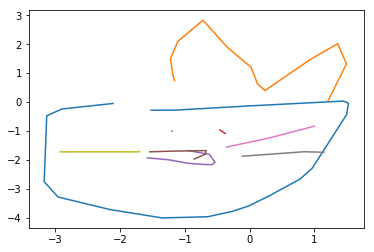

epoch 35001 in 0.179 s: loss = -0.5167, LR = -0.5502, LKL = 0.0335
epoch 35002 in 0.177 s: loss = -0.4773, LR = -0.5105, LKL = 0.0332
epoch 35003 in 0.178 s: loss = -0.3971, LR = -0.4302, LKL = 0.0332
epoch 35004 in 0.177 s: loss = -0.4250, LR = -0.4582, LKL = 0.0332
epoch 35005 in 0.177 s: loss = -0.4375, LR = -0.4707, LKL = 0.0332
epoch 35006 in 0.178 s: loss = -0.4427, LR = -0.4761, LKL = 0.0334
epoch 35007 in 0.173 s: loss = -0.4700, LR = -0.5033, LKL = 0.0333
epoch 35008 in 0.178 s: loss = -0.4232, LR = -0.4563, LKL = 0.0331
epoch 35009 in 0.177 s: loss = -0.4476, LR = -0.4809, LKL = 0.0333
epoch 35010 in 0.177 s: loss = -0.4562, LR = -0.4892, LKL = 0.0330
epoch 35011 in 0.179 s: loss = -0.4965, LR = -0.5299, LKL = 0.0334
epoch 35012 in 0.178 s: loss = -0.4193, LR = -0.4523, LKL = 0.0330
epoch 35013 in 0.176 s: loss = -0.4292, LR = -0.4624, LKL = 0.0332
epoch 35014 in 0.174 s: loss = -0.4031, LR = -0.4361, LKL = 0.0331
epoch 35015 in 0.178 s: loss = -0.4407, LR = -0.4740, LKL = 0.

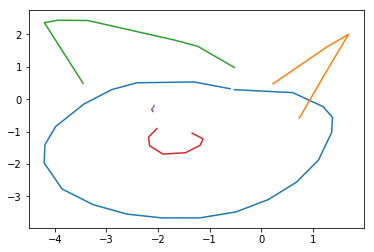

epoch 35101 in 0.176 s: loss = -0.4829, LR = -0.5164, LKL = 0.0335
epoch 35102 in 0.174 s: loss = -0.4353, LR = -0.4685, LKL = 0.0332
epoch 35103 in 0.173 s: loss = -0.5055, LR = -0.5390, LKL = 0.0335
epoch 35104 in 0.173 s: loss = -0.4820, LR = -0.5154, LKL = 0.0334
epoch 35105 in 0.174 s: loss = -0.4933, LR = -0.5267, LKL = 0.0335
epoch 35106 in 0.175 s: loss = -0.4597, LR = -0.4931, LKL = 0.0334
epoch 35107 in 0.172 s: loss = -0.4463, LR = -0.4796, LKL = 0.0334
epoch 35108 in 0.172 s: loss = -0.4316, LR = -0.4649, LKL = 0.0333
epoch 35109 in 0.175 s: loss = -0.4613, LR = -0.4947, LKL = 0.0334
epoch 35110 in 0.177 s: loss = -0.4507, LR = -0.4842, LKL = 0.0335
epoch 35111 in 0.174 s: loss = -0.3869, LR = -0.4202, LKL = 0.0333
epoch 35112 in 0.173 s: loss = -0.4677, LR = -0.5009, LKL = 0.0332
epoch 35113 in 0.173 s: loss = -0.4652, LR = -0.4984, LKL = 0.0332
epoch 35114 in 0.174 s: loss = -0.4651, LR = -0.4984, LKL = 0.0333
epoch 35115 in 0.174 s: loss = -0.5216, LR = -0.5552, LKL = 0.

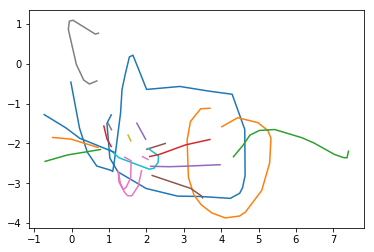

epoch 35201 in 0.175 s: loss = -0.4338, LR = -0.4672, LKL = 0.0334
epoch 35202 in 0.173 s: loss = -0.4008, LR = -0.4337, LKL = 0.0329
epoch 35203 in 0.173 s: loss = -0.4389, LR = -0.4722, LKL = 0.0333
epoch 35204 in 0.173 s: loss = -0.4164, LR = -0.4496, LKL = 0.0331
epoch 35205 in 0.173 s: loss = -0.5306, LR = -0.5641, LKL = 0.0335
epoch 35206 in 0.174 s: loss = -0.5054, LR = -0.5390, LKL = 0.0335
epoch 35207 in 0.170 s: loss = -0.4354, LR = -0.4685, LKL = 0.0331
epoch 35208 in 0.173 s: loss = -0.4380, LR = -0.4713, LKL = 0.0334
epoch 35209 in 0.170 s: loss = -0.4890, LR = -0.5225, LKL = 0.0335
epoch 35210 in 0.174 s: loss = -0.5132, LR = -0.5467, LKL = 0.0335
epoch 35211 in 0.172 s: loss = -0.4237, LR = -0.4570, LKL = 0.0333
epoch 35212 in 0.172 s: loss = -0.4201, LR = -0.4533, LKL = 0.0333
epoch 35213 in 0.171 s: loss = -0.4322, LR = -0.4653, LKL = 0.0332
epoch 35214 in 0.173 s: loss = -0.4525, LR = -0.4856, LKL = 0.0331
epoch 35215 in 0.173 s: loss = -0.4896, LR = -0.5231, LKL = 0.

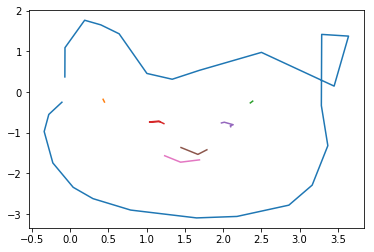

epoch 35301 in 0.177 s: loss = -0.4154, LR = -0.4486, LKL = 0.0332
epoch 35302 in 0.178 s: loss = -0.4267, LR = -0.4599, LKL = 0.0332
epoch 35303 in 0.176 s: loss = -0.4655, LR = -0.4991, LKL = 0.0336
epoch 35304 in 0.177 s: loss = -0.4348, LR = -0.4683, LKL = 0.0335
epoch 35305 in 0.177 s: loss = -0.4205, LR = -0.4538, LKL = 0.0333
epoch 35306 in 0.171 s: loss = -0.3926, LR = -0.4259, LKL = 0.0333
epoch 35307 in 0.174 s: loss = -0.4735, LR = -0.5070, LKL = 0.0335
epoch 35308 in 0.178 s: loss = -0.4208, LR = -0.4541, LKL = 0.0333
epoch 35309 in 0.175 s: loss = -0.4365, LR = -0.4697, LKL = 0.0332
epoch 35310 in 0.175 s: loss = -0.4329, LR = -0.4663, LKL = 0.0333
epoch 35311 in 0.178 s: loss = -0.4844, LR = -0.5180, LKL = 0.0336
epoch 35312 in 0.178 s: loss = -0.3997, LR = -0.4329, LKL = 0.0332
epoch 35313 in 0.175 s: loss = -0.4915, LR = -0.5249, LKL = 0.0333
epoch 35314 in 0.177 s: loss = -0.4853, LR = -0.5187, LKL = 0.0334
epoch 35315 in 0.177 s: loss = -0.4387, LR = -0.4721, LKL = 0.

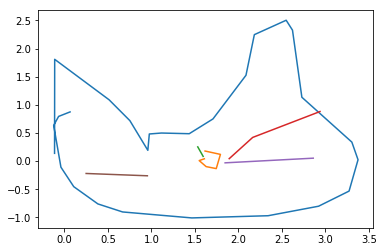

epoch 35401 in 0.175 s: loss = -0.3411, LR = -0.3741, LKL = 0.0330
epoch 35402 in 0.180 s: loss = -0.4196, LR = -0.4529, LKL = 0.0333
epoch 35403 in 0.176 s: loss = -0.4589, LR = -0.4921, LKL = 0.0332
epoch 35404 in 0.176 s: loss = -0.4877, LR = -0.5210, LKL = 0.0334
epoch 35405 in 0.176 s: loss = -0.4179, LR = -0.4512, LKL = 0.0333
epoch 35406 in 0.176 s: loss = -0.4769, LR = -0.5102, LKL = 0.0333
epoch 35407 in 0.175 s: loss = -0.5008, LR = -0.5344, LKL = 0.0337
epoch 35408 in 0.174 s: loss = -0.4486, LR = -0.4820, LKL = 0.0334
epoch 35409 in 0.171 s: loss = -0.4639, LR = -0.4973, LKL = 0.0335
epoch 35410 in 0.174 s: loss = -0.3968, LR = -0.4300, LKL = 0.0332
epoch 35411 in 0.174 s: loss = -0.4248, LR = -0.4582, LKL = 0.0334
epoch 35412 in 0.177 s: loss = -0.4642, LR = -0.4975, LKL = 0.0333
epoch 35413 in 0.175 s: loss = -0.4528, LR = -0.4861, LKL = 0.0333
epoch 35414 in 0.172 s: loss = -0.4656, LR = -0.4991, LKL = 0.0335
epoch 35415 in 0.174 s: loss = -0.4257, LR = -0.4593, LKL = 0.

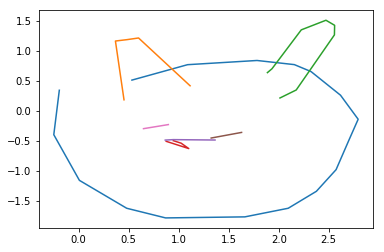

epoch 35501 in 0.173 s: loss = -0.4483, LR = -0.4817, LKL = 0.0334
epoch 35502 in 0.176 s: loss = -0.4170, LR = -0.4504, LKL = 0.0333
epoch 35503 in 0.178 s: loss = -0.4160, LR = -0.4492, LKL = 0.0332
epoch 35504 in 0.179 s: loss = -0.4747, LR = -0.5081, LKL = 0.0333
epoch 35505 in 0.175 s: loss = -0.4547, LR = -0.4880, LKL = 0.0333
epoch 35506 in 0.179 s: loss = -0.4410, LR = -0.4745, LKL = 0.0335
epoch 35507 in 0.171 s: loss = -0.3531, LR = -0.3861, LKL = 0.0330
epoch 35508 in 0.173 s: loss = -0.4251, LR = -0.4585, LKL = 0.0334
epoch 35509 in 0.177 s: loss = -0.4324, LR = -0.4659, LKL = 0.0335
epoch 35510 in 0.176 s: loss = -0.4750, LR = -0.5085, LKL = 0.0334
epoch 35511 in 0.173 s: loss = -0.4514, LR = -0.4846, LKL = 0.0332
epoch 35512 in 0.174 s: loss = -0.4597, LR = -0.4932, LKL = 0.0335
epoch 35513 in 0.174 s: loss = -0.4648, LR = -0.4982, LKL = 0.0334
epoch 35514 in 0.177 s: loss = -0.4052, LR = -0.4385, LKL = 0.0333
epoch 35515 in 0.176 s: loss = -0.4790, LR = -0.5124, LKL = 0.

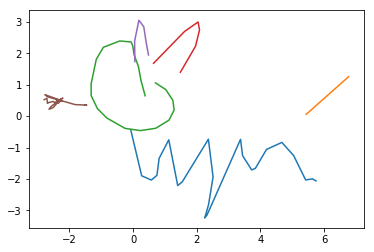

epoch 35601 in 0.175 s: loss = -0.4333, LR = -0.4666, LKL = 0.0334
epoch 35602 in 0.175 s: loss = -0.3547, LR = -0.3878, LKL = 0.0331
epoch 35603 in 0.176 s: loss = -0.4714, LR = -0.5048, LKL = 0.0334
epoch 35604 in 0.175 s: loss = -0.4575, LR = -0.4909, LKL = 0.0334
epoch 35605 in 0.177 s: loss = -0.4230, LR = -0.4564, LKL = 0.0334
epoch 35606 in 0.179 s: loss = -0.4425, LR = -0.4758, LKL = 0.0334
epoch 35607 in 0.175 s: loss = -0.3880, LR = -0.4212, LKL = 0.0332
epoch 35608 in 0.174 s: loss = -0.4186, LR = -0.4519, LKL = 0.0333
epoch 35609 in 0.177 s: loss = -0.3711, LR = -0.4042, LKL = 0.0332
epoch 35610 in 0.176 s: loss = -0.5003, LR = -0.5339, LKL = 0.0336
epoch 35611 in 0.172 s: loss = -0.3724, LR = -0.4057, LKL = 0.0332
epoch 35612 in 0.172 s: loss = -0.4836, LR = -0.5168, LKL = 0.0332
epoch 35613 in 0.172 s: loss = -0.4055, LR = -0.4386, LKL = 0.0331
epoch 35614 in 0.175 s: loss = -0.4791, LR = -0.5125, LKL = 0.0335
epoch 35615 in 0.173 s: loss = -0.5098, LR = -0.5435, LKL = 0.

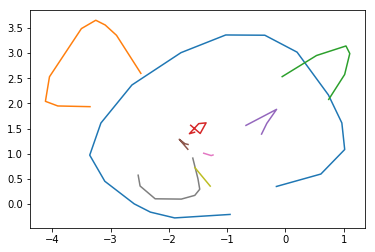

epoch 35701 in 0.175 s: loss = -0.4633, LR = -0.4969, LKL = 0.0335
epoch 35702 in 0.176 s: loss = -0.4694, LR = -0.5027, LKL = 0.0333
epoch 35703 in 0.180 s: loss = -0.4731, LR = -0.5064, LKL = 0.0334
epoch 35704 in 0.176 s: loss = -0.4066, LR = -0.4398, LKL = 0.0332
epoch 35705 in 0.180 s: loss = -0.5110, LR = -0.5446, LKL = 0.0337
epoch 35706 in 0.173 s: loss = -0.4664, LR = -0.4997, LKL = 0.0334
epoch 35707 in 0.176 s: loss = -0.3990, LR = -0.4323, LKL = 0.0332
epoch 35708 in 0.175 s: loss = -0.4291, LR = -0.4625, LKL = 0.0334
epoch 35709 in 0.179 s: loss = -0.4855, LR = -0.5189, LKL = 0.0334
epoch 35710 in 0.176 s: loss = -0.4751, LR = -0.5087, LKL = 0.0336
epoch 35711 in 0.176 s: loss = -0.4362, LR = -0.4695, LKL = 0.0333
epoch 35712 in 0.181 s: loss = -0.3851, LR = -0.4184, LKL = 0.0333
epoch 35713 in 0.178 s: loss = -0.4541, LR = -0.4876, LKL = 0.0335
epoch 35714 in 0.176 s: loss = -0.4523, LR = -0.4856, LKL = 0.0333
epoch 35715 in 0.176 s: loss = -0.4781, LR = -0.5114, LKL = 0.

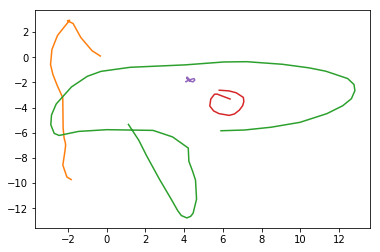

epoch 35801 in 0.173 s: loss = -0.4351, LR = -0.4686, LKL = 0.0334
epoch 35802 in 0.176 s: loss = -0.4767, LR = -0.5099, LKL = 0.0332
epoch 35803 in 0.176 s: loss = -0.4640, LR = -0.4973, LKL = 0.0334
epoch 35804 in 0.173 s: loss = -0.4419, LR = -0.4752, LKL = 0.0333
epoch 35805 in 0.173 s: loss = -0.4915, LR = -0.5250, LKL = 0.0336
epoch 35806 in 0.175 s: loss = -0.4890, LR = -0.5226, LKL = 0.0335
epoch 35807 in 0.174 s: loss = -0.4484, LR = -0.4817, LKL = 0.0334
epoch 35808 in 0.177 s: loss = -0.5061, LR = -0.5397, LKL = 0.0337
epoch 35809 in 0.176 s: loss = -0.4388, LR = -0.4723, LKL = 0.0335
epoch 35810 in 0.176 s: loss = -0.4683, LR = -0.5018, LKL = 0.0335
epoch 35811 in 0.175 s: loss = -0.4797, LR = -0.5131, LKL = 0.0334
epoch 35812 in 0.176 s: loss = -0.4470, LR = -0.4803, LKL = 0.0333
epoch 35813 in 0.177 s: loss = -0.4922, LR = -0.5255, LKL = 0.0333
epoch 35814 in 0.173 s: loss = -0.4883, LR = -0.5218, LKL = 0.0335
epoch 35815 in 0.176 s: loss = -0.4513, LR = -0.4844, LKL = 0.

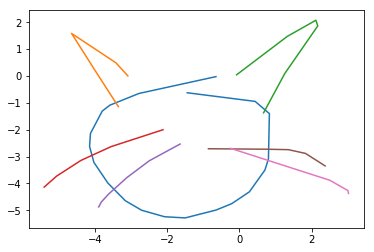

epoch 35901 in 0.173 s: loss = -0.4740, LR = -0.5075, LKL = 0.0335
epoch 35902 in 0.169 s: loss = -0.5044, LR = -0.5381, LKL = 0.0336
epoch 35903 in 0.176 s: loss = -0.4643, LR = -0.4979, LKL = 0.0335
epoch 35904 in 0.175 s: loss = -0.3071, LR = -0.3402, LKL = 0.0331
epoch 35905 in 0.175 s: loss = -0.4373, LR = -0.4707, LKL = 0.0334
epoch 35906 in 0.175 s: loss = -0.4636, LR = -0.4972, LKL = 0.0335
epoch 35907 in 0.174 s: loss = -0.4206, LR = -0.4542, LKL = 0.0335
epoch 35908 in 0.175 s: loss = -0.4356, LR = -0.4688, LKL = 0.0332
epoch 35909 in 0.175 s: loss = -0.4752, LR = -0.5085, LKL = 0.0333
epoch 35910 in 0.180 s: loss = -0.4575, LR = -0.4908, LKL = 0.0333
epoch 35911 in 0.175 s: loss = -0.4577, LR = -0.4911, LKL = 0.0334
epoch 35912 in 0.172 s: loss = -0.4789, LR = -0.5126, LKL = 0.0336
epoch 35913 in 0.178 s: loss = -0.5307, LR = -0.5642, LKL = 0.0335
epoch 35914 in 0.174 s: loss = -0.4434, LR = -0.4771, LKL = 0.0337
epoch 35915 in 0.179 s: loss = -0.4759, LR = -0.5094, LKL = 0.

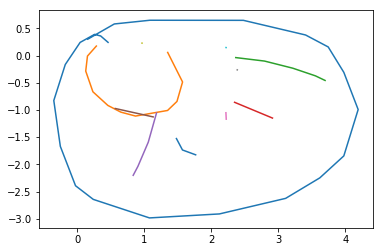

epoch 36001 in 0.177 s: loss = -0.4556, LR = -0.4892, LKL = 0.0336
epoch 36002 in 0.172 s: loss = -0.4032, LR = -0.4367, LKL = 0.0335
epoch 36003 in 0.176 s: loss = -0.3791, LR = -0.4124, LKL = 0.0333
epoch 36004 in 0.174 s: loss = -0.4481, LR = -0.4816, LKL = 0.0335
epoch 36005 in 0.175 s: loss = -0.3869, LR = -0.4201, LKL = 0.0332
epoch 36006 in 0.174 s: loss = -0.4174, LR = -0.4507, LKL = 0.0334
epoch 36007 in 0.175 s: loss = -0.4738, LR = -0.5073, LKL = 0.0336
epoch 36008 in 0.170 s: loss = -0.4492, LR = -0.4825, LKL = 0.0333
epoch 36009 in 0.174 s: loss = -0.4461, LR = -0.4797, LKL = 0.0336
epoch 36010 in 0.174 s: loss = -0.4118, LR = -0.4449, LKL = 0.0331
epoch 36011 in 0.178 s: loss = -0.5199, LR = -0.5535, LKL = 0.0336
epoch 36012 in 0.173 s: loss = -0.4276, LR = -0.4608, LKL = 0.0332
epoch 36013 in 0.174 s: loss = -0.4284, LR = -0.4616, LKL = 0.0332
epoch 36014 in 0.172 s: loss = -0.4783, LR = -0.5117, LKL = 0.0334
epoch 36015 in 0.174 s: loss = -0.4137, LR = -0.4471, LKL = 0.

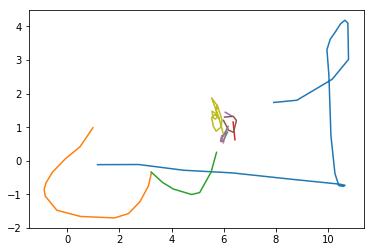

epoch 36101 in 0.174 s: loss = -0.4345, LR = -0.4678, LKL = 0.0334
epoch 36102 in 0.176 s: loss = -0.4631, LR = -0.4967, LKL = 0.0336
epoch 36103 in 0.177 s: loss = -0.4421, LR = -0.4755, LKL = 0.0335
epoch 36104 in 0.176 s: loss = -0.4405, LR = -0.4739, LKL = 0.0334
epoch 36105 in 0.180 s: loss = -0.4337, LR = -0.4671, LKL = 0.0334
epoch 36106 in 0.177 s: loss = -0.4601, LR = -0.4935, LKL = 0.0334
epoch 36107 in 0.177 s: loss = -0.4614, LR = -0.4951, LKL = 0.0337
epoch 36108 in 0.177 s: loss = -0.4157, LR = -0.4491, LKL = 0.0334
epoch 36109 in 0.178 s: loss = -0.4579, LR = -0.4915, LKL = 0.0336
epoch 36110 in 0.178 s: loss = -0.4731, LR = -0.5068, LKL = 0.0338
epoch 36111 in 0.174 s: loss = -0.4302, LR = -0.4637, LKL = 0.0335
epoch 36112 in 0.177 s: loss = -0.4807, LR = -0.5141, LKL = 0.0334
epoch 36113 in 0.176 s: loss = -0.4560, LR = -0.4894, LKL = 0.0334
epoch 36114 in 0.177 s: loss = -0.4024, LR = -0.4357, LKL = 0.0333
epoch 36115 in 0.177 s: loss = -0.4626, LR = -0.4962, LKL = 0.

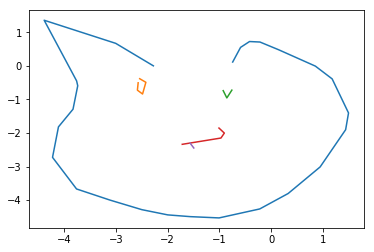

epoch 36201 in 0.173 s: loss = -0.4322, LR = -0.4656, LKL = 0.0333
epoch 36202 in 0.175 s: loss = -0.4158, LR = -0.4492, LKL = 0.0335
epoch 36203 in 0.174 s: loss = -0.3944, LR = -0.4278, LKL = 0.0333
epoch 36204 in 0.177 s: loss = -0.3862, LR = -0.4195, LKL = 0.0333
epoch 36205 in 0.176 s: loss = -0.4353, LR = -0.4689, LKL = 0.0335
epoch 36206 in 0.174 s: loss = -0.4104, LR = -0.4438, LKL = 0.0334
epoch 36207 in 0.174 s: loss = -0.3031, LR = -0.3366, LKL = 0.0334
epoch 36208 in 0.175 s: loss = -0.4938, LR = -0.5278, LKL = 0.0340
epoch 36209 in 0.178 s: loss = -0.4721, LR = -0.5058, LKL = 0.0337
epoch 36210 in 0.181 s: loss = -0.4787, LR = -0.5123, LKL = 0.0336
epoch 36211 in 0.176 s: loss = -0.4573, LR = -0.4909, LKL = 0.0337
epoch 36212 in 0.176 s: loss = -0.4626, LR = -0.4965, LKL = 0.0339
epoch 36213 in 0.178 s: loss = -0.3164, LR = -0.3496, LKL = 0.0332
epoch 36214 in 0.177 s: loss = -0.4570, LR = -0.4906, LKL = 0.0336
epoch 36215 in 0.177 s: loss = -0.4970, LR = -0.5306, LKL = 0.

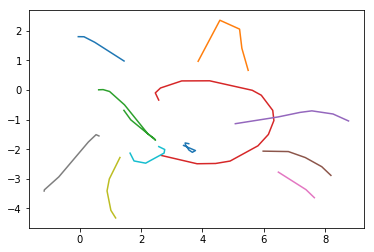

epoch 36301 in 0.175 s: loss = -0.4766, LR = -0.5103, LKL = 0.0338
epoch 36302 in 0.175 s: loss = -0.4808, LR = -0.5142, LKL = 0.0334
epoch 36303 in 0.179 s: loss = -0.4756, LR = -0.5093, LKL = 0.0338
epoch 36304 in 0.179 s: loss = -0.3752, LR = -0.4087, LKL = 0.0335
epoch 36305 in 0.176 s: loss = -0.4514, LR = -0.4848, LKL = 0.0334
epoch 36306 in 0.175 s: loss = -0.4981, LR = -0.5318, LKL = 0.0337
epoch 36307 in 0.175 s: loss = -0.3613, LR = -0.3944, LKL = 0.0332
epoch 36308 in 0.178 s: loss = -0.4593, LR = -0.4926, LKL = 0.0333
epoch 36309 in 0.172 s: loss = -0.5362, LR = -0.5698, LKL = 0.0336
epoch 36310 in 0.176 s: loss = -0.5072, LR = -0.5407, LKL = 0.0335
epoch 36311 in 0.177 s: loss = -0.4568, LR = -0.4902, LKL = 0.0334
epoch 36312 in 0.174 s: loss = -0.4184, LR = -0.4517, LKL = 0.0333
epoch 36313 in 0.181 s: loss = -0.4625, LR = -0.4961, LKL = 0.0337
epoch 36314 in 0.176 s: loss = -0.4227, LR = -0.4561, LKL = 0.0334
epoch 36315 in 0.178 s: loss = -0.4863, LR = -0.5199, LKL = 0.

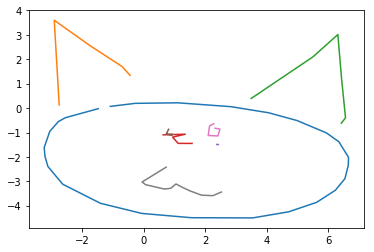

epoch 36401 in 0.180 s: loss = -0.4056, LR = -0.4392, LKL = 0.0336
epoch 36402 in 0.176 s: loss = -0.4435, LR = -0.4771, LKL = 0.0335
epoch 36403 in 0.173 s: loss = -0.4690, LR = -0.5025, LKL = 0.0336
epoch 36404 in 0.180 s: loss = -0.5016, LR = -0.5353, LKL = 0.0337
epoch 36405 in 0.174 s: loss = -0.4867, LR = -0.5203, LKL = 0.0336
epoch 36406 in 0.179 s: loss = -0.4504, LR = -0.4842, LKL = 0.0337
epoch 36407 in 0.176 s: loss = -0.5117, LR = -0.5456, LKL = 0.0338
epoch 36408 in 0.175 s: loss = -0.4523, LR = -0.4858, LKL = 0.0335
epoch 36409 in 0.173 s: loss = -0.5117, LR = -0.5454, LKL = 0.0337
epoch 36410 in 0.174 s: loss = -0.5137, LR = -0.5474, LKL = 0.0337
epoch 36411 in 0.176 s: loss = -0.4830, LR = -0.5166, LKL = 0.0336
epoch 36412 in 0.176 s: loss = -0.3981, LR = -0.4316, LKL = 0.0335
epoch 36413 in 0.174 s: loss = -0.3855, LR = -0.4189, LKL = 0.0334
epoch 36414 in 0.176 s: loss = -0.4202, LR = -0.4537, LKL = 0.0335
epoch 36415 in 0.176 s: loss = -0.4537, LR = -0.4874, LKL = 0.

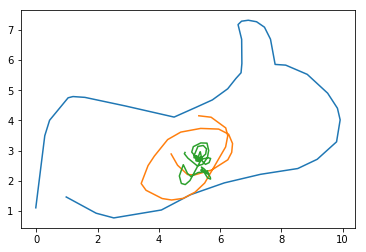

epoch 36501 in 0.175 s: loss = -0.3550, LR = -0.3882, LKL = 0.0333
epoch 36502 in 0.171 s: loss = -0.4236, LR = -0.4571, LKL = 0.0335
epoch 36503 in 0.177 s: loss = -0.4666, LR = -0.5002, LKL = 0.0337
epoch 36504 in 0.177 s: loss = -0.5225, LR = -0.5562, LKL = 0.0337
epoch 36505 in 0.177 s: loss = -0.4807, LR = -0.5143, LKL = 0.0336
epoch 36506 in 0.174 s: loss = -0.4723, LR = -0.5059, LKL = 0.0336
epoch 36507 in 0.171 s: loss = -0.4425, LR = -0.4760, LKL = 0.0335
epoch 36508 in 0.173 s: loss = -0.4804, LR = -0.5141, LKL = 0.0337
epoch 36509 in 0.174 s: loss = -0.4355, LR = -0.4692, LKL = 0.0336
epoch 36510 in 0.173 s: loss = -0.4047, LR = -0.4382, LKL = 0.0335
epoch 36511 in 0.175 s: loss = -0.4436, LR = -0.4769, LKL = 0.0333
epoch 36512 in 0.173 s: loss = -0.4761, LR = -0.5099, LKL = 0.0338
epoch 36513 in 0.175 s: loss = -0.4102, LR = -0.4436, LKL = 0.0335
epoch 36514 in 0.172 s: loss = -0.4726, LR = -0.5061, LKL = 0.0335
epoch 36515 in 0.178 s: loss = -0.4731, LR = -0.5065, LKL = 0.

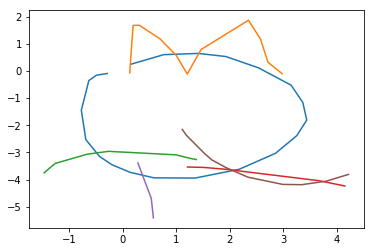

epoch 36601 in 0.175 s: loss = -0.4195, LR = -0.4532, LKL = 0.0338
epoch 36602 in 0.175 s: loss = -0.4295, LR = -0.4631, LKL = 0.0336
epoch 36603 in 0.176 s: loss = -0.4475, LR = -0.4811, LKL = 0.0336
epoch 36604 in 0.177 s: loss = -0.4523, LR = -0.4858, LKL = 0.0336
epoch 36605 in 0.178 s: loss = -0.4693, LR = -0.5029, LKL = 0.0337
epoch 36606 in 0.175 s: loss = -0.5047, LR = -0.5384, LKL = 0.0338
epoch 36607 in 0.176 s: loss = -0.4733, LR = -0.5070, LKL = 0.0337
epoch 36608 in 0.176 s: loss = -0.4837, LR = -0.5173, LKL = 0.0336
epoch 36609 in 0.178 s: loss = -0.4621, LR = -0.4960, LKL = 0.0339
epoch 36610 in 0.177 s: loss = -0.4583, LR = -0.4920, LKL = 0.0337
epoch 36611 in 0.176 s: loss = -0.4612, LR = -0.4948, LKL = 0.0336
epoch 36612 in 0.175 s: loss = -0.4606, LR = -0.4941, LKL = 0.0335
epoch 36613 in 0.177 s: loss = -0.4302, LR = -0.4635, LKL = 0.0334
epoch 36614 in 0.173 s: loss = -0.4475, LR = -0.4812, LKL = 0.0337
epoch 36615 in 0.177 s: loss = -0.4595, LR = -0.4931, LKL = 0.

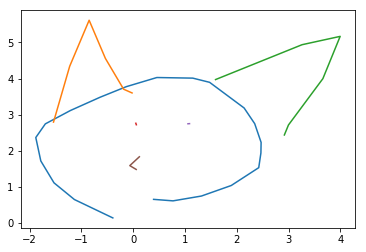

epoch 36701 in 0.174 s: loss = -0.4381, LR = -0.4717, LKL = 0.0335
epoch 36702 in 0.174 s: loss = -0.4365, LR = -0.4700, LKL = 0.0334
epoch 36703 in 0.179 s: loss = -0.4447, LR = -0.4782, LKL = 0.0336
epoch 36704 in 0.176 s: loss = -0.3294, LR = -0.3626, LKL = 0.0332
epoch 36705 in 0.178 s: loss = -0.4750, LR = -0.5087, LKL = 0.0337
epoch 36706 in 0.178 s: loss = -0.3876, LR = -0.4210, LKL = 0.0334
epoch 36707 in 0.176 s: loss = -0.5374, LR = -0.5712, LKL = 0.0338
epoch 36708 in 0.179 s: loss = -0.3816, LR = -0.4152, LKL = 0.0336
epoch 36709 in 0.179 s: loss = -0.4448, LR = -0.4785, LKL = 0.0337
epoch 36710 in 0.176 s: loss = -0.3971, LR = -0.4308, LKL = 0.0338
epoch 36711 in 0.178 s: loss = -0.4574, LR = -0.4912, LKL = 0.0338
epoch 36712 in 0.177 s: loss = -0.4665, LR = -0.5002, LKL = 0.0337
epoch 36713 in 0.177 s: loss = -0.4197, LR = -0.4531, LKL = 0.0334
epoch 36714 in 0.177 s: loss = -0.4538, LR = -0.4874, LKL = 0.0336
epoch 36715 in 0.177 s: loss = -0.4364, LR = -0.4700, LKL = 0.

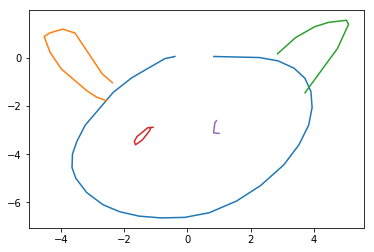

epoch 36801 in 0.178 s: loss = -0.4627, LR = -0.4963, LKL = 0.0337
epoch 36802 in 0.173 s: loss = -0.5581, LR = -0.5918, LKL = 0.0337
epoch 36803 in 0.173 s: loss = -0.4481, LR = -0.4817, LKL = 0.0336
epoch 36804 in 0.171 s: loss = -0.3948, LR = -0.4285, LKL = 0.0337
epoch 36805 in 0.177 s: loss = -0.4539, LR = -0.4874, LKL = 0.0335
epoch 36806 in 0.178 s: loss = -0.4346, LR = -0.4682, LKL = 0.0336
epoch 36807 in 0.178 s: loss = -0.4906, LR = -0.5243, LKL = 0.0337
epoch 36808 in 0.174 s: loss = -0.4278, LR = -0.4614, LKL = 0.0336
epoch 36809 in 0.177 s: loss = -0.4748, LR = -0.5084, LKL = 0.0336
epoch 36810 in 0.177 s: loss = -0.4853, LR = -0.5189, LKL = 0.0336
epoch 36811 in 0.178 s: loss = -0.4091, LR = -0.4427, LKL = 0.0336
epoch 36812 in 0.174 s: loss = -0.4273, LR = -0.4609, LKL = 0.0336
epoch 36813 in 0.178 s: loss = -0.5094, LR = -0.5433, LKL = 0.0338
epoch 36814 in 0.175 s: loss = -0.4726, LR = -0.5065, LKL = 0.0338
epoch 36815 in 0.178 s: loss = -0.4378, LR = -0.4714, LKL = 0.

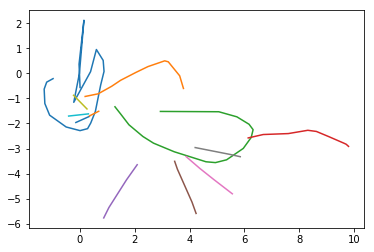

epoch 36901 in 0.176 s: loss = -0.5035, LR = -0.5373, LKL = 0.0338
epoch 36902 in 0.179 s: loss = -0.4445, LR = -0.4780, LKL = 0.0335
epoch 36903 in 0.173 s: loss = -0.3903, LR = -0.4237, LKL = 0.0334
epoch 36904 in 0.173 s: loss = -0.4636, LR = -0.4974, LKL = 0.0338
epoch 36905 in 0.175 s: loss = -0.5494, LR = -0.5832, LKL = 0.0338
epoch 36906 in 0.173 s: loss = -0.4610, LR = -0.4949, LKL = 0.0339
epoch 36907 in 0.172 s: loss = -0.5187, LR = -0.5525, LKL = 0.0338
epoch 36908 in 0.176 s: loss = -0.4581, LR = -0.4918, LKL = 0.0336
epoch 36909 in 0.174 s: loss = -0.4443, LR = -0.4777, LKL = 0.0334
epoch 36910 in 0.175 s: loss = -0.4190, LR = -0.4523, LKL = 0.0333
epoch 36911 in 0.175 s: loss = -0.4645, LR = -0.4981, LKL = 0.0336
epoch 36912 in 0.176 s: loss = -0.4391, LR = -0.4727, LKL = 0.0336
epoch 36913 in 0.178 s: loss = -0.4403, LR = -0.4742, LKL = 0.0339
epoch 36914 in 0.178 s: loss = -0.4660, LR = -0.4996, LKL = 0.0336
epoch 36915 in 0.175 s: loss = -0.4956, LR = -0.5293, LKL = 0.

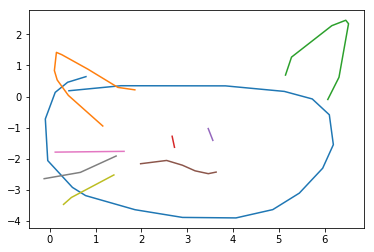

epoch 37001 in 0.175 s: loss = -0.3946, LR = -0.4285, LKL = 0.0338
epoch 37002 in 0.179 s: loss = -0.3750, LR = -0.4084, LKL = 0.0334
epoch 37003 in 0.175 s: loss = -0.4413, LR = -0.4751, LKL = 0.0337
epoch 37004 in 0.173 s: loss = -0.4860, LR = -0.5196, LKL = 0.0337
epoch 37005 in 0.173 s: loss = -0.4565, LR = -0.4902, LKL = 0.0338
epoch 37006 in 0.175 s: loss = -0.4687, LR = -0.5026, LKL = 0.0338
epoch 37007 in 0.176 s: loss = -0.4557, LR = -0.4892, LKL = 0.0335
epoch 37008 in 0.177 s: loss = -0.4506, LR = -0.4842, LKL = 0.0336
epoch 37009 in 0.175 s: loss = -0.4267, LR = -0.4602, LKL = 0.0335
epoch 37010 in 0.172 s: loss = -0.4267, LR = -0.4605, LKL = 0.0338
epoch 37011 in 0.177 s: loss = -0.4791, LR = -0.5127, LKL = 0.0336
epoch 37012 in 0.177 s: loss = -0.4565, LR = -0.4902, LKL = 0.0337
epoch 37013 in 0.176 s: loss = -0.4681, LR = -0.5019, LKL = 0.0337
epoch 37014 in 0.174 s: loss = -0.4264, LR = -0.4601, LKL = 0.0337
epoch 37015 in 0.172 s: loss = -0.3898, LR = -0.4231, LKL = 0.

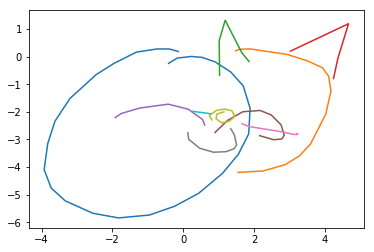

epoch 37101 in 0.173 s: loss = -0.4721, LR = -0.5058, LKL = 0.0337
epoch 37102 in 0.178 s: loss = -0.4738, LR = -0.5077, LKL = 0.0338
epoch 37103 in 0.173 s: loss = -0.4192, LR = -0.4527, LKL = 0.0335
epoch 37104 in 0.174 s: loss = -0.4496, LR = -0.4833, LKL = 0.0337
epoch 37105 in 0.174 s: loss = -0.4757, LR = -0.5095, LKL = 0.0337
epoch 37106 in 0.175 s: loss = -0.3954, LR = -0.4289, LKL = 0.0335
epoch 37107 in 0.172 s: loss = -0.3693, LR = -0.4030, LKL = 0.0337
epoch 37108 in 0.174 s: loss = -0.4581, LR = -0.4919, LKL = 0.0337
epoch 37109 in 0.175 s: loss = -0.4387, LR = -0.4722, LKL = 0.0334
epoch 37110 in 0.175 s: loss = -0.4562, LR = -0.4900, LKL = 0.0338
epoch 37111 in 0.176 s: loss = -0.5040, LR = -0.5378, LKL = 0.0338
epoch 37112 in 0.178 s: loss = -0.4849, LR = -0.5186, LKL = 0.0338
epoch 37113 in 0.173 s: loss = -0.4723, LR = -0.5058, LKL = 0.0335
epoch 37114 in 0.174 s: loss = -0.3805, LR = -0.4140, LKL = 0.0335
epoch 37115 in 0.171 s: loss = -0.5116, LR = -0.5455, LKL = 0.

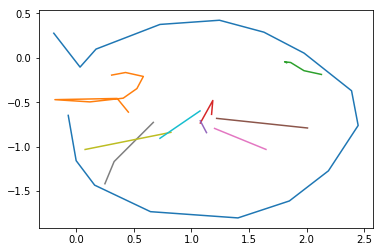

epoch 37201 in 0.175 s: loss = -0.3659, LR = -0.3993, LKL = 0.0334
epoch 37202 in 0.175 s: loss = -0.4258, LR = -0.4596, LKL = 0.0338
epoch 37203 in 0.172 s: loss = -0.4470, LR = -0.4807, LKL = 0.0337
epoch 37204 in 0.174 s: loss = -0.5433, LR = -0.5771, LKL = 0.0339
epoch 37205 in 0.172 s: loss = -0.4730, LR = -0.5065, LKL = 0.0336
epoch 37206 in 0.174 s: loss = -0.5055, LR = -0.5392, LKL = 0.0337
epoch 37207 in 0.179 s: loss = -0.4714, LR = -0.5052, LKL = 0.0337
epoch 37208 in 0.169 s: loss = -0.4296, LR = -0.4631, LKL = 0.0335
epoch 37209 in 0.171 s: loss = -0.4855, LR = -0.5193, LKL = 0.0338
epoch 37210 in 0.172 s: loss = -0.4344, LR = -0.4680, LKL = 0.0335
epoch 37211 in 0.173 s: loss = -0.4670, LR = -0.5007, LKL = 0.0337
epoch 37212 in 0.174 s: loss = -0.4992, LR = -0.5329, LKL = 0.0337
epoch 37213 in 0.173 s: loss = -0.4939, LR = -0.5279, LKL = 0.0340
epoch 37214 in 0.174 s: loss = -0.5329, LR = -0.5667, LKL = 0.0339
epoch 37215 in 0.175 s: loss = -0.4572, LR = -0.4909, LKL = 0.

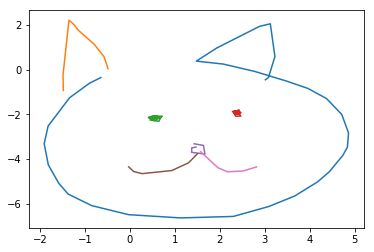

epoch 37301 in 0.174 s: loss = -0.4190, LR = -0.4526, LKL = 0.0336
epoch 37302 in 0.180 s: loss = -0.4764, LR = -0.5103, LKL = 0.0338
epoch 37303 in 0.175 s: loss = -0.5449, LR = -0.5790, LKL = 0.0341
epoch 37304 in 0.175 s: loss = -0.4809, LR = -0.5147, LKL = 0.0338
epoch 37305 in 0.177 s: loss = -0.4500, LR = -0.4837, LKL = 0.0336
epoch 37306 in 0.176 s: loss = -0.4724, LR = -0.5061, LKL = 0.0337
epoch 37307 in 0.178 s: loss = -0.3856, LR = -0.4189, LKL = 0.0334
epoch 37308 in 0.176 s: loss = -0.4473, LR = -0.4810, LKL = 0.0337
epoch 37309 in 0.176 s: loss = -0.4971, LR = -0.5308, LKL = 0.0337
epoch 37310 in 0.176 s: loss = -0.3982, LR = -0.4320, LKL = 0.0338
epoch 37311 in 0.175 s: loss = -0.4680, LR = -0.5017, LKL = 0.0337
epoch 37312 in 0.179 s: loss = -0.4877, LR = -0.5216, LKL = 0.0340
epoch 37313 in 0.177 s: loss = -0.4329, LR = -0.4664, LKL = 0.0335
epoch 37314 in 0.176 s: loss = -0.4769, LR = -0.5107, LKL = 0.0338
epoch 37315 in 0.177 s: loss = -0.4363, LR = -0.4699, LKL = 0.

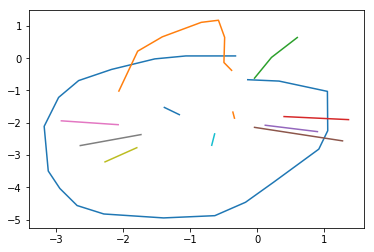

epoch 37401 in 0.175 s: loss = -0.3980, LR = -0.4317, LKL = 0.0337
epoch 37402 in 0.174 s: loss = -0.4440, LR = -0.4778, LKL = 0.0338
epoch 37403 in 0.174 s: loss = -0.4588, LR = -0.4925, LKL = 0.0337
epoch 37404 in 0.176 s: loss = -0.4557, LR = -0.4895, LKL = 0.0338
epoch 37405 in 0.179 s: loss = -0.3966, LR = -0.4302, LKL = 0.0336
epoch 37406 in 0.177 s: loss = -0.4688, LR = -0.5027, LKL = 0.0339
epoch 37407 in 0.178 s: loss = -0.3435, LR = -0.3770, LKL = 0.0335
epoch 37408 in 0.181 s: loss = -0.4762, LR = -0.5100, LKL = 0.0338
epoch 37409 in 0.178 s: loss = -0.5102, LR = -0.5441, LKL = 0.0339
epoch 37410 in 0.178 s: loss = -0.3898, LR = -0.4235, LKL = 0.0337
epoch 37411 in 0.177 s: loss = -0.4650, LR = -0.4986, LKL = 0.0336
epoch 37412 in 0.176 s: loss = -0.4796, LR = -0.5132, LKL = 0.0336
epoch 37413 in 0.176 s: loss = -0.4806, LR = -0.5146, LKL = 0.0340
epoch 37414 in 0.177 s: loss = -0.5014, LR = -0.5354, LKL = 0.0340
epoch 37415 in 0.181 s: loss = -0.4728, LR = -0.5066, LKL = 0.

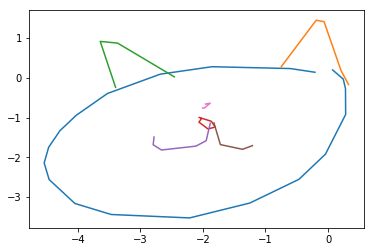

epoch 37501 in 0.175 s: loss = -0.4253, LR = -0.4591, LKL = 0.0338
epoch 37502 in 0.177 s: loss = -0.4134, LR = -0.4471, LKL = 0.0337
epoch 37503 in 0.177 s: loss = -0.4590, LR = -0.4927, LKL = 0.0337
epoch 37504 in 0.175 s: loss = -0.4266, LR = -0.4602, LKL = 0.0336
epoch 37505 in 0.177 s: loss = -0.4511, LR = -0.4847, LKL = 0.0336
epoch 37506 in 0.176 s: loss = -0.4725, LR = -0.5062, LKL = 0.0337
epoch 37507 in 0.178 s: loss = -0.4857, LR = -0.5192, LKL = 0.0335
epoch 37508 in 0.176 s: loss = -0.4024, LR = -0.4360, LKL = 0.0336
epoch 37509 in 0.177 s: loss = -0.4480, LR = -0.4818, LKL = 0.0338
epoch 37510 in 0.178 s: loss = -0.3979, LR = -0.4317, LKL = 0.0337
epoch 37511 in 0.177 s: loss = -0.4132, LR = -0.4469, LKL = 0.0337
epoch 37512 in 0.179 s: loss = -0.4303, LR = -0.4639, LKL = 0.0336
epoch 37513 in 0.174 s: loss = -0.3925, LR = -0.4261, LKL = 0.0336
epoch 37514 in 0.171 s: loss = -0.4384, LR = -0.4721, LKL = 0.0337
epoch 37515 in 0.176 s: loss = -0.4811, LR = -0.5149, LKL = 0.

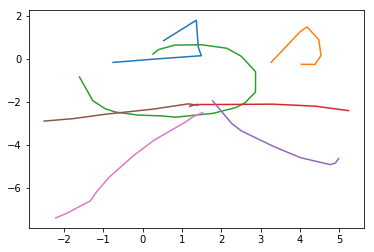

epoch 37601 in 0.177 s: loss = -0.4067, LR = -0.4403, LKL = 0.0336
epoch 37602 in 0.174 s: loss = -0.4195, LR = -0.4533, LKL = 0.0337
epoch 37603 in 0.180 s: loss = -0.4837, LR = -0.5176, LKL = 0.0339
epoch 37604 in 0.174 s: loss = -0.4558, LR = -0.4895, LKL = 0.0337
epoch 37605 in 0.174 s: loss = -0.4318, LR = -0.4654, LKL = 0.0336
epoch 37606 in 0.175 s: loss = -0.4448, LR = -0.4786, LKL = 0.0338
epoch 37607 in 0.176 s: loss = -0.4207, LR = -0.4543, LKL = 0.0336
epoch 37608 in 0.175 s: loss = -0.4410, LR = -0.4747, LKL = 0.0337
epoch 37609 in 0.177 s: loss = -0.4798, LR = -0.5134, LKL = 0.0337
epoch 37610 in 0.179 s: loss = -0.4367, LR = -0.4702, LKL = 0.0335
epoch 37611 in 0.178 s: loss = -0.4371, LR = -0.4708, LKL = 0.0338
epoch 37612 in 0.175 s: loss = -0.4485, LR = -0.4822, LKL = 0.0337
epoch 37613 in 0.178 s: loss = -0.4398, LR = -0.4734, LKL = 0.0336
epoch 37614 in 0.176 s: loss = -0.4552, LR = -0.4889, LKL = 0.0338
epoch 37615 in 0.176 s: loss = -0.4692, LR = -0.5030, LKL = 0.

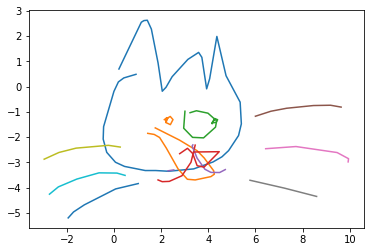

epoch 37701 in 0.178 s: loss = -0.3817, LR = -0.4154, LKL = 0.0338
epoch 37702 in 0.172 s: loss = -0.4596, LR = -0.4934, LKL = 0.0338
epoch 37703 in 0.175 s: loss = -0.4789, LR = -0.5128, LKL = 0.0338
epoch 37704 in 0.178 s: loss = -0.4299, LR = -0.4636, LKL = 0.0336
epoch 37705 in 0.177 s: loss = -0.4342, LR = -0.4679, LKL = 0.0336
epoch 37706 in 0.175 s: loss = -0.5114, LR = -0.5455, LKL = 0.0341
epoch 37707 in 0.176 s: loss = -0.4502, LR = -0.4839, LKL = 0.0336
epoch 37708 in 0.172 s: loss = -0.4477, LR = -0.4814, LKL = 0.0337
epoch 37709 in 0.178 s: loss = -0.4092, LR = -0.4430, LKL = 0.0338
epoch 37710 in 0.173 s: loss = -0.4043, LR = -0.4381, LKL = 0.0338
epoch 37711 in 0.176 s: loss = -0.4427, LR = -0.4764, LKL = 0.0337
epoch 37712 in 0.177 s: loss = -0.4872, LR = -0.5211, LKL = 0.0340
epoch 37713 in 0.175 s: loss = -0.4729, LR = -0.5068, LKL = 0.0338
epoch 37714 in 0.178 s: loss = -0.4394, LR = -0.4730, LKL = 0.0336
epoch 37715 in 0.175 s: loss = -0.4598, LR = -0.4936, LKL = 0.

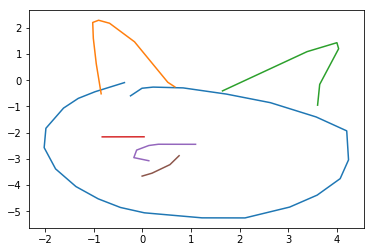

epoch 37801 in 0.177 s: loss = -0.4783, LR = -0.5123, LKL = 0.0340
epoch 37802 in 0.176 s: loss = -0.4665, LR = -0.5004, LKL = 0.0339
epoch 37803 in 0.175 s: loss = -0.4579, LR = -0.4917, LKL = 0.0338
epoch 37804 in 0.175 s: loss = -0.4226, LR = -0.4562, LKL = 0.0336
epoch 37805 in 0.178 s: loss = -0.4410, LR = -0.4747, LKL = 0.0338
epoch 37806 in 0.178 s: loss = -0.4162, LR = -0.4499, LKL = 0.0337
epoch 37807 in 0.174 s: loss = -0.4214, LR = -0.4551, LKL = 0.0337
epoch 37808 in 0.178 s: loss = -0.5068, LR = -0.5408, LKL = 0.0340
epoch 37809 in 0.176 s: loss = -0.4330, LR = -0.4670, LKL = 0.0340
epoch 37810 in 0.177 s: loss = -0.3897, LR = -0.4232, LKL = 0.0335
epoch 37811 in 0.178 s: loss = -0.3954, LR = -0.4291, LKL = 0.0337
epoch 37812 in 0.177 s: loss = -0.4726, LR = -0.5065, LKL = 0.0339
epoch 37813 in 0.178 s: loss = -0.4545, LR = -0.4884, LKL = 0.0339
epoch 37814 in 0.176 s: loss = -0.4474, LR = -0.4810, LKL = 0.0337
epoch 37815 in 0.180 s: loss = -0.4739, LR = -0.5076, LKL = 0.

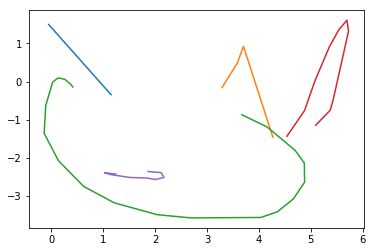

epoch 37901 in 0.177 s: loss = -0.4307, LR = -0.4646, LKL = 0.0339
epoch 37902 in 0.175 s: loss = -0.4180, LR = -0.4517, LKL = 0.0337
epoch 37903 in 0.177 s: loss = -0.4670, LR = -0.5006, LKL = 0.0336
epoch 37904 in 0.175 s: loss = -0.3865, LR = -0.4203, LKL = 0.0337
epoch 37905 in 0.175 s: loss = -0.5109, LR = -0.5448, LKL = 0.0339
epoch 37906 in 0.175 s: loss = -0.4565, LR = -0.4901, LKL = 0.0337
epoch 37907 in 0.181 s: loss = -0.4278, LR = -0.4616, LKL = 0.0338
epoch 37908 in 0.176 s: loss = -0.5089, LR = -0.5427, LKL = 0.0338
epoch 37909 in 0.177 s: loss = -0.5118, LR = -0.5457, LKL = 0.0338
epoch 37910 in 0.176 s: loss = -0.4639, LR = -0.4978, LKL = 0.0340
epoch 37911 in 0.179 s: loss = -0.4944, LR = -0.5285, LKL = 0.0341
epoch 37912 in 0.175 s: loss = -0.4070, LR = -0.4407, LKL = 0.0337
epoch 37913 in 0.177 s: loss = -0.4750, LR = -0.5089, LKL = 0.0339
epoch 37914 in 0.175 s: loss = -0.4242, LR = -0.4579, LKL = 0.0337
epoch 37915 in 0.178 s: loss = -0.4703, LR = -0.5043, LKL = 0.

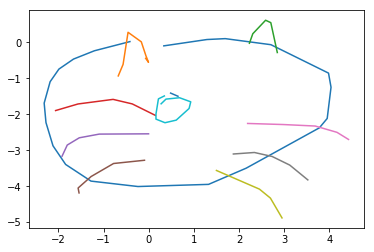

epoch 38001 in 0.176 s: loss = -0.4562, LR = -0.4903, LKL = 0.0341
epoch 38002 in 0.169 s: loss = -0.4924, LR = -0.5264, LKL = 0.0341
epoch 38003 in 0.177 s: loss = -0.5118, LR = -0.5456, LKL = 0.0338
epoch 38004 in 0.173 s: loss = -0.4868, LR = -0.5209, LKL = 0.0341
epoch 38005 in 0.170 s: loss = -0.4487, LR = -0.4824, LKL = 0.0337
epoch 38006 in 0.173 s: loss = -0.4952, LR = -0.5293, LKL = 0.0341
epoch 38007 in 0.176 s: loss = -0.4141, LR = -0.4479, LKL = 0.0338
epoch 38008 in 0.174 s: loss = -0.4302, LR = -0.4639, LKL = 0.0337
epoch 38009 in 0.178 s: loss = -0.4912, LR = -0.5250, LKL = 0.0338
epoch 38010 in 0.175 s: loss = -0.4735, LR = -0.5075, LKL = 0.0340
epoch 38011 in 0.177 s: loss = -0.4705, LR = -0.5044, LKL = 0.0338
epoch 38012 in 0.174 s: loss = -0.4420, LR = -0.4761, LKL = 0.0341
epoch 38013 in 0.177 s: loss = -0.5265, LR = -0.5605, LKL = 0.0339
epoch 38014 in 0.173 s: loss = -0.4405, LR = -0.4742, LKL = 0.0336
epoch 38015 in 0.176 s: loss = -0.4354, LR = -0.4693, LKL = 0.

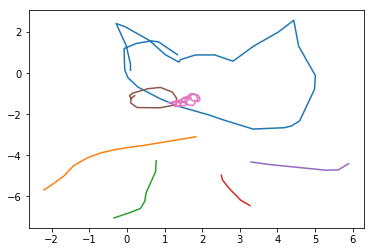

epoch 38101 in 0.177 s: loss = -0.3448, LR = -0.3787, LKL = 0.0338
epoch 38102 in 0.176 s: loss = -0.5110, LR = -0.5450, LKL = 0.0340
epoch 38103 in 0.176 s: loss = -0.5172, LR = -0.5511, LKL = 0.0339
epoch 38104 in 0.175 s: loss = -0.4534, LR = -0.4872, LKL = 0.0338
epoch 38105 in 0.174 s: loss = -0.4758, LR = -0.5095, LKL = 0.0337
epoch 38106 in 0.175 s: loss = -0.5120, LR = -0.5461, LKL = 0.0341
epoch 38107 in 0.180 s: loss = -0.5098, LR = -0.5436, LKL = 0.0338
epoch 38108 in 0.176 s: loss = -0.3987, LR = -0.4325, LKL = 0.0338
epoch 38109 in 0.176 s: loss = -0.4234, LR = -0.4570, LKL = 0.0336
epoch 38110 in 0.172 s: loss = -0.4294, LR = -0.4632, LKL = 0.0338
epoch 38111 in 0.174 s: loss = -0.4641, LR = -0.4979, LKL = 0.0338
epoch 38112 in 0.174 s: loss = -0.4352, LR = -0.4690, LKL = 0.0338
epoch 38113 in 0.177 s: loss = -0.4729, LR = -0.5068, LKL = 0.0339
epoch 38114 in 0.175 s: loss = -0.4153, LR = -0.4490, LKL = 0.0337
epoch 38115 in 0.180 s: loss = -0.4373, LR = -0.4712, LKL = 0.

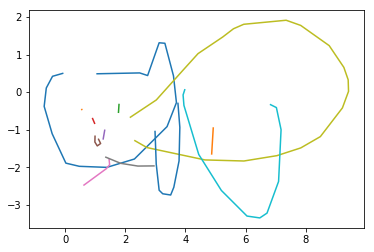

epoch 38201 in 0.176 s: loss = -0.4845, LR = -0.5184, LKL = 0.0339
epoch 38202 in 0.176 s: loss = -0.4674, LR = -0.5013, LKL = 0.0339
epoch 38203 in 0.177 s: loss = -0.4748, LR = -0.5086, LKL = 0.0338
epoch 38204 in 0.174 s: loss = -0.4801, LR = -0.5143, LKL = 0.0341
epoch 38205 in 0.176 s: loss = -0.4590, LR = -0.4928, LKL = 0.0338
epoch 38206 in 0.174 s: loss = -0.4645, LR = -0.4984, LKL = 0.0338
epoch 38207 in 0.177 s: loss = -0.5065, LR = -0.5405, LKL = 0.0340
epoch 38208 in 0.175 s: loss = -0.4830, LR = -0.5170, LKL = 0.0340
epoch 38209 in 0.177 s: loss = -0.4465, LR = -0.4801, LKL = 0.0336
epoch 38210 in 0.174 s: loss = -0.4616, LR = -0.4954, LKL = 0.0338
epoch 38211 in 0.175 s: loss = -0.4562, LR = -0.4900, LKL = 0.0337
epoch 38212 in 0.177 s: loss = -0.4699, LR = -0.5039, LKL = 0.0340
epoch 38213 in 0.175 s: loss = -0.4675, LR = -0.5014, LKL = 0.0339
epoch 38214 in 0.168 s: loss = -0.4215, LR = -0.4551, LKL = 0.0337
epoch 38215 in 0.177 s: loss = -0.4459, LR = -0.4798, LKL = 0.

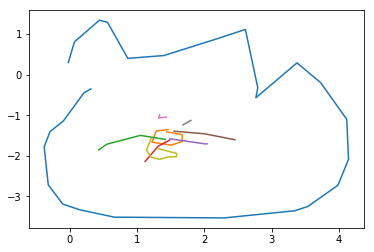

epoch 38301 in 0.177 s: loss = -0.4737, LR = -0.5077, LKL = 0.0340
epoch 38302 in 0.175 s: loss = -0.4908, LR = -0.5248, LKL = 0.0340
epoch 38303 in 0.177 s: loss = -0.4277, LR = -0.4614, LKL = 0.0337
epoch 38304 in 0.175 s: loss = -0.3866, LR = -0.4205, LKL = 0.0339
epoch 38305 in 0.180 s: loss = -0.4554, LR = -0.4893, LKL = 0.0339
epoch 38306 in 0.178 s: loss = -0.4294, LR = -0.4633, LKL = 0.0339
epoch 38307 in 0.180 s: loss = -0.4860, LR = -0.5201, LKL = 0.0340
epoch 38308 in 0.177 s: loss = -0.5120, LR = -0.5460, LKL = 0.0340
epoch 38309 in 0.175 s: loss = -0.4485, LR = -0.4824, LKL = 0.0339
epoch 38310 in 0.180 s: loss = -0.4698, LR = -0.5038, LKL = 0.0340
epoch 38311 in 0.179 s: loss = -0.4200, LR = -0.4538, LKL = 0.0338
epoch 38312 in 0.176 s: loss = -0.4585, LR = -0.4925, LKL = 0.0339
epoch 38313 in 0.177 s: loss = -0.4697, LR = -0.5038, LKL = 0.0341
epoch 38314 in 0.175 s: loss = -0.4191, LR = -0.4532, LKL = 0.0341
epoch 38315 in 0.179 s: loss = -0.4835, LR = -0.5175, LKL = 0.

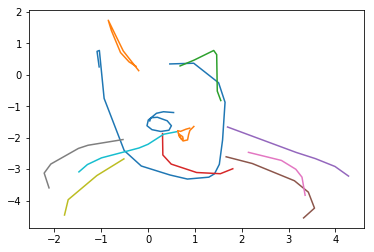

epoch 38401 in 0.173 s: loss = -0.5081, LR = -0.5419, LKL = 0.0338
epoch 38402 in 0.171 s: loss = -0.4491, LR = -0.4832, LKL = 0.0341
epoch 38403 in 0.177 s: loss = -0.4487, LR = -0.4827, LKL = 0.0340
epoch 38404 in 0.175 s: loss = -0.4521, LR = -0.4860, LKL = 0.0339
epoch 38405 in 0.176 s: loss = -0.4317, LR = -0.4658, LKL = 0.0341
epoch 38406 in 0.175 s: loss = -0.4803, LR = -0.5141, LKL = 0.0337
epoch 38407 in 0.177 s: loss = -0.4414, LR = -0.4753, LKL = 0.0339
epoch 38408 in 0.176 s: loss = -0.4695, LR = -0.5034, LKL = 0.0339
epoch 38409 in 0.177 s: loss = -0.4480, LR = -0.4818, LKL = 0.0338
epoch 38410 in 0.173 s: loss = -0.4622, LR = -0.4961, LKL = 0.0339
epoch 38411 in 0.173 s: loss = -0.5121, LR = -0.5461, LKL = 0.0340
epoch 38412 in 0.174 s: loss = -0.5297, LR = -0.5638, LKL = 0.0341
epoch 38413 in 0.176 s: loss = -0.4843, LR = -0.5182, LKL = 0.0340
epoch 38414 in 0.176 s: loss = -0.4794, LR = -0.5134, LKL = 0.0341
epoch 38415 in 0.176 s: loss = -0.4829, LR = -0.5169, LKL = 0.

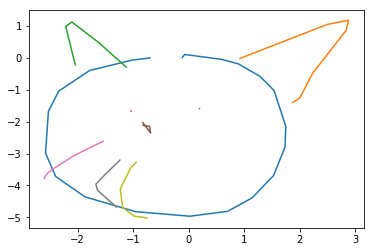

epoch 38501 in 0.175 s: loss = -0.4286, LR = -0.4624, LKL = 0.0338
epoch 38502 in 0.176 s: loss = -0.4921, LR = -0.5261, LKL = 0.0339
epoch 38503 in 0.175 s: loss = -0.4655, LR = -0.4996, LKL = 0.0341
epoch 38504 in 0.177 s: loss = -0.4482, LR = -0.4820, LKL = 0.0338
epoch 38505 in 0.177 s: loss = -0.3499, LR = -0.3834, LKL = 0.0335
epoch 38506 in 0.175 s: loss = -0.4504, LR = -0.4840, LKL = 0.0336
epoch 38507 in 0.181 s: loss = -0.4734, LR = -0.5073, LKL = 0.0339
epoch 38508 in 0.171 s: loss = -0.4259, LR = -0.4595, LKL = 0.0336
epoch 38509 in 0.175 s: loss = -0.5193, LR = -0.5532, LKL = 0.0339
epoch 38510 in 0.182 s: loss = -0.4489, LR = -0.4830, LKL = 0.0340
epoch 38511 in 0.175 s: loss = -0.4897, LR = -0.5238, LKL = 0.0341
epoch 38512 in 0.177 s: loss = -0.4587, LR = -0.4925, LKL = 0.0339
epoch 38513 in 0.174 s: loss = -0.4418, LR = -0.4756, LKL = 0.0339
epoch 38514 in 0.171 s: loss = -0.4998, LR = -0.5337, LKL = 0.0339
epoch 38515 in 0.175 s: loss = -0.4441, LR = -0.4781, LKL = 0.

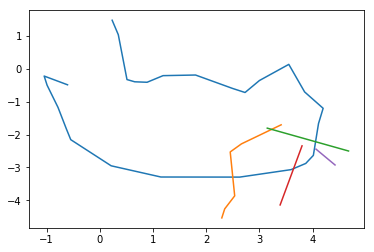

epoch 38601 in 0.177 s: loss = -0.4696, LR = -0.5034, LKL = 0.0338
epoch 38602 in 0.177 s: loss = -0.4504, LR = -0.4845, LKL = 0.0341
epoch 38603 in 0.176 s: loss = -0.4821, LR = -0.5160, LKL = 0.0339
epoch 38604 in 0.178 s: loss = -0.5107, LR = -0.5449, LKL = 0.0342
epoch 38605 in 0.175 s: loss = -0.4650, LR = -0.4989, LKL = 0.0339
epoch 38606 in 0.179 s: loss = -0.4594, LR = -0.4935, LKL = 0.0341
epoch 38607 in 0.176 s: loss = -0.4557, LR = -0.4895, LKL = 0.0339
epoch 38608 in 0.177 s: loss = -0.4532, LR = -0.4874, LKL = 0.0342
epoch 38609 in 0.177 s: loss = -0.4451, LR = -0.4789, LKL = 0.0338
epoch 38610 in 0.177 s: loss = -0.5037, LR = -0.5379, LKL = 0.0342
epoch 38611 in 0.176 s: loss = -0.4833, LR = -0.5172, LKL = 0.0339
epoch 38612 in 0.175 s: loss = -0.4746, LR = -0.5084, LKL = 0.0338
epoch 38613 in 0.174 s: loss = -0.4012, LR = -0.4348, LKL = 0.0336
epoch 38614 in 0.176 s: loss = -0.5204, LR = -0.5544, LKL = 0.0340
epoch 38615 in 0.172 s: loss = -0.4120, LR = -0.4457, LKL = 0.

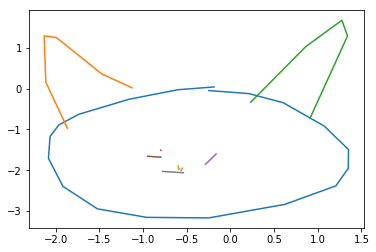

epoch 38701 in 0.176 s: loss = -0.5380, LR = -0.5721, LKL = 0.0341
epoch 38702 in 0.177 s: loss = -0.4825, LR = -0.5164, LKL = 0.0338
epoch 38703 in 0.174 s: loss = -0.4143, LR = -0.4479, LKL = 0.0336
epoch 38704 in 0.173 s: loss = -0.4880, LR = -0.5219, LKL = 0.0339
epoch 38705 in 0.174 s: loss = -0.4803, LR = -0.5144, LKL = 0.0341
epoch 38706 in 0.177 s: loss = -0.4243, LR = -0.4580, LKL = 0.0337
epoch 38707 in 0.173 s: loss = -0.4340, LR = -0.4679, LKL = 0.0339
epoch 38708 in 0.171 s: loss = -0.4415, LR = -0.4754, LKL = 0.0339
epoch 38709 in 0.177 s: loss = -0.4320, LR = -0.4660, LKL = 0.0340
epoch 38710 in 0.174 s: loss = -0.4805, LR = -0.5142, LKL = 0.0337
epoch 38711 in 0.173 s: loss = -0.4723, LR = -0.5062, LKL = 0.0340
epoch 38712 in 0.173 s: loss = -0.5246, LR = -0.5587, LKL = 0.0341
epoch 38713 in 0.171 s: loss = -0.4858, LR = -0.5196, LKL = 0.0338
epoch 38714 in 0.176 s: loss = -0.5183, LR = -0.5522, LKL = 0.0339
epoch 38715 in 0.181 s: loss = -0.4311, LR = -0.4647, LKL = 0.

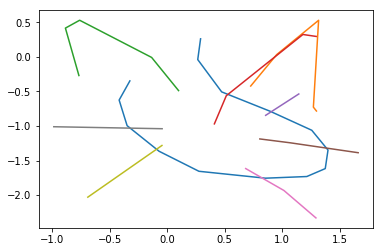

epoch 38801 in 0.174 s: loss = -0.4152, LR = -0.4489, LKL = 0.0337
epoch 38802 in 0.175 s: loss = -0.4668, LR = -0.5009, LKL = 0.0341
epoch 38803 in 0.173 s: loss = -0.4165, LR = -0.4503, LKL = 0.0338
epoch 38804 in 0.173 s: loss = -0.4678, LR = -0.5017, LKL = 0.0339
epoch 38805 in 0.177 s: loss = -0.4183, LR = -0.4521, LKL = 0.0338
epoch 38806 in 0.176 s: loss = -0.4959, LR = -0.5298, LKL = 0.0339
epoch 38807 in 0.176 s: loss = -0.4583, LR = -0.4919, LKL = 0.0336
epoch 38808 in 0.174 s: loss = -0.5021, LR = -0.5361, LKL = 0.0340
epoch 38809 in 0.177 s: loss = -0.4629, LR = -0.4968, LKL = 0.0339
epoch 38810 in 0.173 s: loss = -0.4802, LR = -0.5143, LKL = 0.0341
epoch 38811 in 0.173 s: loss = -0.5103, LR = -0.5445, LKL = 0.0342
epoch 38812 in 0.174 s: loss = -0.4630, LR = -0.4968, LKL = 0.0338
epoch 38813 in 0.171 s: loss = -0.5079, LR = -0.5420, LKL = 0.0341
epoch 38814 in 0.172 s: loss = -0.4408, LR = -0.4746, LKL = 0.0338
epoch 38815 in 0.171 s: loss = -0.5123, LR = -0.5462, LKL = 0.

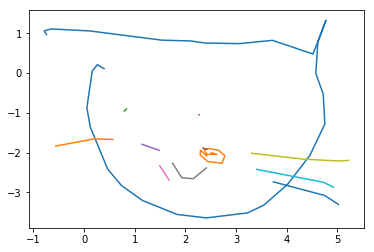

epoch 38901 in 0.176 s: loss = -0.4364, LR = -0.4703, LKL = 0.0339
epoch 38902 in 0.173 s: loss = -0.4483, LR = -0.4821, LKL = 0.0338
epoch 38903 in 0.174 s: loss = -0.5171, LR = -0.5511, LKL = 0.0340
epoch 38904 in 0.175 s: loss = -0.4359, LR = -0.4701, LKL = 0.0342
epoch 38905 in 0.177 s: loss = -0.4942, LR = -0.5280, LKL = 0.0339
epoch 38906 in 0.173 s: loss = -0.3863, LR = -0.4202, LKL = 0.0339
epoch 38907 in 0.173 s: loss = -0.4296, LR = -0.4634, LKL = 0.0338
epoch 38908 in 0.174 s: loss = -0.4292, LR = -0.4634, LKL = 0.0342
epoch 38909 in 0.175 s: loss = -0.4463, LR = -0.4804, LKL = 0.0341
epoch 38910 in 0.173 s: loss = -0.4472, LR = -0.4810, LKL = 0.0338
epoch 38911 in 0.178 s: loss = -0.5220, LR = -0.5562, LKL = 0.0342
epoch 38912 in 0.176 s: loss = -0.4172, LR = -0.4510, LKL = 0.0338
epoch 38913 in 0.179 s: loss = -0.4751, LR = -0.5090, LKL = 0.0338
epoch 38914 in 0.177 s: loss = -0.4715, LR = -0.5057, LKL = 0.0342
epoch 38915 in 0.179 s: loss = -0.4612, LR = -0.4952, LKL = 0.

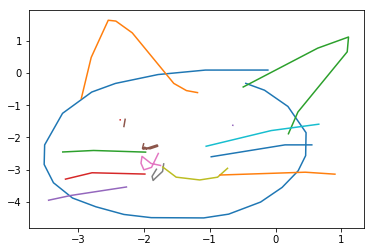

epoch 39001 in 0.174 s: loss = -0.4505, LR = -0.4846, LKL = 0.0341
epoch 39002 in 0.173 s: loss = -0.4633, LR = -0.4972, LKL = 0.0338
epoch 39003 in 0.175 s: loss = -0.3951, LR = -0.4288, LKL = 0.0337
epoch 39004 in 0.173 s: loss = -0.4310, LR = -0.4647, LKL = 0.0337
epoch 39005 in 0.171 s: loss = -0.4605, LR = -0.4944, LKL = 0.0339
epoch 39006 in 0.173 s: loss = -0.5291, LR = -0.5630, LKL = 0.0339
epoch 39007 in 0.171 s: loss = -0.5288, LR = -0.5630, LKL = 0.0342
epoch 39008 in 0.171 s: loss = -0.4632, LR = -0.4972, LKL = 0.0340
epoch 39009 in 0.175 s: loss = -0.4186, LR = -0.4525, LKL = 0.0340
epoch 39010 in 0.175 s: loss = -0.5540, LR = -0.5879, LKL = 0.0339
epoch 39011 in 0.171 s: loss = -0.4536, LR = -0.4877, LKL = 0.0341
epoch 39012 in 0.171 s: loss = -0.4759, LR = -0.5100, LKL = 0.0341
epoch 39013 in 0.172 s: loss = -0.4457, LR = -0.4796, LKL = 0.0339
epoch 39014 in 0.172 s: loss = -0.5009, LR = -0.5348, LKL = 0.0340
epoch 39015 in 0.170 s: loss = -0.4775, LR = -0.5117, LKL = 0.

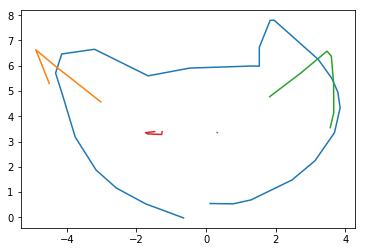

epoch 39101 in 0.174 s: loss = -0.5014, LR = -0.5352, LKL = 0.0338
epoch 39102 in 0.172 s: loss = -0.5079, LR = -0.5418, LKL = 0.0338
epoch 39103 in 0.177 s: loss = -0.3914, LR = -0.4250, LKL = 0.0336
epoch 39104 in 0.174 s: loss = -0.4224, LR = -0.4564, LKL = 0.0340
epoch 39105 in 0.177 s: loss = -0.4662, LR = -0.5003, LKL = 0.0341
epoch 39106 in 0.171 s: loss = -0.4577, LR = -0.4915, LKL = 0.0338
epoch 39107 in 0.176 s: loss = -0.4673, LR = -0.5013, LKL = 0.0340
epoch 39108 in 0.176 s: loss = -0.4845, LR = -0.5184, LKL = 0.0339
epoch 39109 in 0.181 s: loss = -0.4135, LR = -0.4473, LKL = 0.0338
epoch 39110 in 0.176 s: loss = -0.4071, LR = -0.4408, LKL = 0.0337
epoch 39111 in 0.177 s: loss = -0.4095, LR = -0.4430, LKL = 0.0334
epoch 39112 in 0.172 s: loss = -0.4733, LR = -0.5073, LKL = 0.0339
epoch 39113 in 0.179 s: loss = -0.5178, LR = -0.5519, LKL = 0.0340
epoch 39114 in 0.176 s: loss = -0.4048, LR = -0.4388, LKL = 0.0339
epoch 39115 in 0.180 s: loss = -0.4577, LR = -0.4918, LKL = 0.

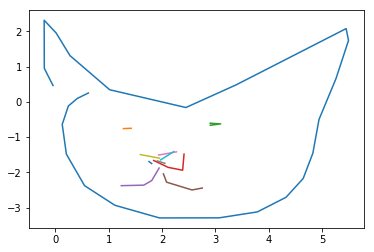

epoch 39201 in 0.176 s: loss = -0.4794, LR = -0.5135, LKL = 0.0341
epoch 39202 in 0.173 s: loss = -0.4042, LR = -0.4378, LKL = 0.0336


KeyboardInterrupt: 

In [13]:
model = Model()
for epoch in range(50001):
    model.train(epoch)